In [1]:
import torch
import numpy as np

# check if CUDA is available
train_on_gpu = torch.cuda.is_available()

if not train_on_gpu:
    print('CUDA is not available.  Training on CPU ...')
else:
    print('CUDA is available!  Training on GPU ...')

CUDA is available!  Training on GPU ...


In [2]:
from torchvision import datasets
import torchvision.transforms as transforms
from torch.utils.data.sampler import SubsetRandomSampler

# number of subprocesses to use for data loading
num_workers = 0
# how many samples per batch to load
batch_size = 20
# percentage of training set to use as validation
valid_size = 0.2

# convert data to a normalized torch.FloatTensor
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ])

# choose the training and test datasets
train_data = datasets.CIFAR10('data', train=True,
                              download=True, transform=transform)
test_data = datasets.CIFAR10('data', train=False,
                             download=True, transform=transform)

# obtain training indices that will be used for validation
num_train = len(train_data)
indices = list(range(num_train))
np.random.shuffle(indices)
split = int(np.floor(valid_size * num_train))
train_idx, valid_idx = indices[split:], indices[:split]

# define samplers for obtaining training and validation batches
train_sampler = SubsetRandomSampler(train_idx)
valid_sampler = SubsetRandomSampler(valid_idx)

# prepare data loaders (combine dataset and sampler)
train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size,
    sampler=train_sampler, num_workers=num_workers)
valid_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, 
    sampler=valid_sampler, num_workers=num_workers)
test_loader = torch.utils.data.DataLoader(test_data, batch_size=batch_size, 
    num_workers=num_workers)

# specify the image classes
classes = ['airplane', 'automobile', 'bird', 'cat', 'deer',
           'dog', 'frog', 'horse', 'ship', 'truck']

0it [00:00, ?it/s]

100%|█████████▉| 170434560/170498071 [03:08<00:00, 686802.12it/s] 

Extracting data/cifar-10-python.tar.gz to data
Files already downloaded and verified


In [3]:
import matplotlib.pyplot as plt
%matplotlib inline

# helper function to un-normalize and display an image
def imshow(img):
    img = img / 2 + 0.5  # unnormalize
    plt.imshow(np.transpose(img, (1, 2, 0)))  # convert from Tensor image

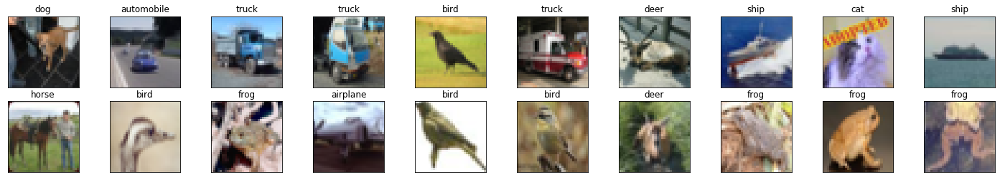

170500096it [03:20, 686802.12it/s]                               

In [4]:
# obtain one batch of training images
dataiter = iter(train_loader)
images, labels = dataiter.next()
images = images.numpy() # convert images to numpy for display

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(25, 4))
# display 20 images
for idx in np.arange(20):
    ax = fig.add_subplot(2, 20/2, idx+1, xticks=[], yticks=[])
    imshow(images[idx])
    ax.set_title(classes[labels[idx]])

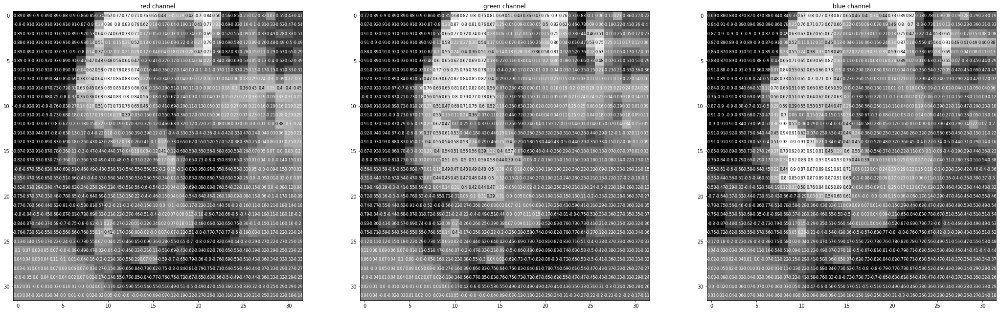

In [5]:
rgb_img = np.squeeze(images[3])
channels = ['red channel', 'green channel', 'blue channel']

fig = plt.figure(figsize = (36, 36)) 
for idx in np.arange(rgb_img.shape[0]):
    ax = fig.add_subplot(1, 3, idx + 1)
    img = rgb_img[idx]
    ax.imshow(img, cmap='gray')
    ax.set_title(channels[idx])
    width, height = img.shape
    thresh = img.max()/2.5
    for x in range(width):
        for y in range(height):
            val = round(img[x][y],2) if img[x][y] !=0 else 0
            ax.annotate(str(val), xy=(y,x),
                    horizontalalignment='center',
                    verticalalignment='center', size=8,
                    color='white' if img[x][y]<thresh else 'black')

In [6]:
import torch.nn as nn
import torch.nn.functional as F

# define the CNN architecture
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        # convolutional layer (sees 32x32x3 image tensor)
        self.conv1 = nn.Conv2d(3, 16, 3, padding=1)
        # convolutional layer (sees 16x16x16 tensor)
        self.conv2 = nn.Conv2d(16, 32, 3, padding=1)
        # convolutional layer (sees 8x8x32 tensor)
        self.conv3 = nn.Conv2d(32, 64, 3, padding=1)
        # max pooling layer
        self.pool = nn.MaxPool2d(2, 2)
        # linear layer (64 * 4 * 4 -> 500)
        self.fc1 = nn.Linear(64 * 4 * 4, 500)
        # linear layer (500 -> 10)
        self.fc2 = nn.Linear(500, 10)
        # dropout layer (p=0.25)
        self.dropout = nn.Dropout(0.25)

    def forward(self, x):
        # add sequence of convolutional and max pooling layers
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = self.pool(F.relu(self.conv3(x)))
        # flatten image input
        x = x.view(-1, 64 * 4 * 4)
        # add dropout layer
        x = self.dropout(x)
        # add 1st hidden layer, with relu activation function
        x = F.relu(self.fc1(x))
        # add dropout layer
        x = self.dropout(x)
        # add 2nd hidden layer, with relu activation function
        x = self.fc2(x)
        return x

# create a complete CNN
model = Net()
print(model)

# move tensors to GPU if CUDA is available
if train_on_gpu:
    model.cuda()

Net(
  (conv1): Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv2): Conv2d(16, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (conv3): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (fc1): Linear(in_features=1024, out_features=500, bias=True)
  (fc2): Linear(in_features=500, out_features=10, bias=True)
  (dropout): Dropout(p=0.25, inplace=False)
)


In [7]:
import torch.optim as optim

# specify loss function (categorical cross-entropy)
criterion = nn.CrossEntropyLoss()

# specify optimizer
optimizer = optim.SGD(model.parameters(), lr=0.01)

In [12]:
# number of epochs to train the model
n_epochs = 3

valid_loss_min = np.Inf # track change in validation loss

for epoch in range(1, n_epochs+1):

    # keep track of training and validation loss
    train_loss = 0.0
    valid_loss = 0.0
    
    ###################
    # train the model #
    ###################
    model.train()
    for data, target in train_loader:
        # move tensors to GPU if CUDA is available
        if train_on_gpu:
            data, target = data.cuda(), target.cuda()
        # clear the gradients of all optimized variables
        optimizer.zero_grad()
        # forward pass: compute predicted outputs by passing inputs to the model

        output = model(data)
        # calculate the batch loss
        loss = criterion(output, target)
        print(f'output is {output}')
        print(f'target is {target}')
        # backward pass: compute gradient of the loss with respect to model parameters
        loss.backward()
        # perform a single optimization step (parameter update)
        optimizer.step()
        # update training loss
        train_loss += loss.item()*data.size(0)
        
    ######################    
    # validate the model #
    ######################
    model.eval()
    for data, target in valid_loader:
        # move tensors to GPU if CUDA is available
        if train_on_gpu:
            data, target = data.cuda(), target.cuda()
        # forward pass: compute predicted outputs by passing inputs to the model
        output = model(data)
        # calculate the batch loss
        loss = criterion(output, target)
        # update average validation loss 
        valid_loss += loss.item()*data.size(0)
    
    # calculate average losses
    train_loss = train_loss/len(train_loader.sampler)
    valid_loss = valid_loss/len(valid_loader.sampler)
        
    # print training/validation statistics 
    print('Epoch: {} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f}'.format(
        epoch, train_loss, valid_loss))
    
    # save model if validation loss has decreased
    if valid_loss <= valid_loss_min:
        print('Validation loss decreased ({:.6f} --> {:.6f}).  Saving model ...'.format(
        valid_loss_min,
        valid_loss))
        torch.save(model.state_dict(), 'model_cifar.pt')
        valid_loss_min = valid_loss

output is tensor([[-3.1227, -4.8590,  2.4735,  4.2374,  2.3365,  4.0328,  3.9073,  0.9860,
         -5.3955, -3.8113],
        [ 1.5320,  4.7209, -0.8758, -0.7167, -0.7778, -2.8310, -0.6309, -2.8936,
          2.3835,  2.3084],
        [-1.9384, -0.6062,  1.6399,  1.7635,  1.2388,  0.3486,  3.0953, -0.3653,
         -3.3800, -0.8567],
        [-0.1661, -1.5134,  0.4837,  0.4249,  1.6610,  0.3447,  1.6911,  1.1569,
         -2.3661, -1.4597],
        [ 2.6584,  4.7756, -1.0801, -2.6294, -1.0224, -2.7025, -3.5069, -0.7066,
          2.7302,  2.5992],
        [ 0.5501,  0.7344,  2.0785,  0.5393, -0.7517,  0.1128, -1.8989, -1.0914,
         -0.0214,  0.2873],
        [ 0.2824,  0.1224,  0.3341,  0.0277,  0.1379, -0.9369,  0.2586, -0.6282,
          0.6032,  0.6002],
        [-1.0046, -2.4769,  1.0067,  1.1219,  2.1255,  0.8355,  2.5912,  0.7117,
         -2.3464, -1.6574],
        [-0.7419, -1.7422,  0.9755,  1.9807,  0.8770,  1.1818,  0.4446, -0.0381,
         -0.6316, -1.2681],
        [

output is tensor([[ 2.5708,  4.1961, -0.8997, -1.8694, -1.0505, -3.3029, -2.0950, -2.6327,
          2.7995,  2.6813],
        [ 1.2995, -2.6751,  0.7704,  2.0691, -0.2935,  1.6990, -0.4577, -0.8118,
          1.0041, -1.5465],
        [ 2.6129,  0.4252,  0.8389, -1.1884,  0.6031, -1.4730, -2.0181, -1.4277,
          2.6194, -0.7010],
        [ 2.2392,  2.0036, -0.0167, -1.1823, -0.3650, -2.3496, -1.4290, -3.1475,
          4.0587,  1.0341],
        [-0.1604, -2.5141,  1.1220,  1.4065,  1.8390,  1.2386,  1.3328, -0.0156,
         -1.5311, -2.9767],
        [ 0.7880,  2.9530, -0.8521, -1.4960, -0.1291, -1.6838, -1.5638, -0.1868,
          0.7241,  1.2907],
        [-1.6133, -2.2529,  0.5197,  2.1023,  1.0241,  1.1865,  3.5242, -0.2763,
         -2.0500, -1.9564],
        [-1.5238, -2.0135,  0.2204,  1.6803,  1.7776,  1.3667,  2.3385,  1.1609,
         -2.8220, -1.8638],
        [ 0.5520,  2.4946, -1.9685, -0.8372, -0.8156, -2.1897,  0.3177, -1.4168,
          1.6500,  3.0856],
        [

output is tensor([[ 1.4455e+00,  2.0531e+00, -5.7203e-01, -8.2435e-01, -6.3808e-01,
         -1.6714e+00, -1.9642e+00, -1.2474e+00,  2.3902e+00,  1.8891e+00],
        [ 8.4406e-01,  1.7965e+00, -6.3060e-01, -1.4348e+00, -3.5683e-01,
         -2.6631e+00, -2.9555e-01, -2.4139e+00,  3.2307e+00,  2.3292e+00],
        [-1.0357e+00, -4.3228e+00,  2.5227e+00,  1.3881e+00,  3.3966e+00,
          2.3295e+00,  2.0019e+00,  2.3518e+00, -4.4611e+00, -3.4827e+00],
        [-1.6372e+00, -4.3637e+00,  2.0887e+00,  2.6388e+00,  2.7317e+00,
          2.3918e+00,  2.3213e+00,  2.2469e+00, -3.8568e+00, -3.2898e+00],
        [ 9.1462e-01,  3.4881e-01,  1.4576e+00, -4.6787e-01,  6.0721e-01,
         -9.7674e-01, -1.3151e+00, -9.9403e-01,  1.0301e+00,  8.3179e-01],
        [-1.3057e+00, -3.3045e+00,  1.8227e+00,  1.8960e+00,  2.4729e+00,
          2.0061e+00,  2.0704e+00,  1.9320e+00, -4.2869e+00, -2.4931e+00],
        [-1.7876e+00, -7.3676e-01,  1.1089e+00,  1.3990e+00,  2.4259e-01,
          2.1385e+00, 

output is tensor([[-1.1125, -3.3148,  2.1246,  0.5471,  2.8459,  0.7874,  2.7989,  0.6170,
         -2.4529, -2.8233],
        [ 0.3834,  2.0861,  0.1198,  0.2449, -1.2956, -0.1667, -1.2483, -1.7737,
          0.2465,  1.2834],
        [-1.1407,  0.6660,  0.0711,  0.1486, -0.1788, -0.0921,  1.4445,  0.1826,
         -2.2636,  1.0768],
        [-1.2834,  0.5015, -0.4839,  0.9070, -0.3715,  0.5155,  1.2183,  1.2678,
         -2.1058,  0.3969],
        [-3.1125, -3.3610,  1.3612,  4.1820,  0.8268,  3.4816,  2.5205,  0.8526,
         -2.9767, -2.6389],
        [ 0.9090,  2.5143, -1.7492, -1.6523, -1.2176, -2.0201, -2.4674, -0.2690,
          1.6985,  4.9567],
        [ 0.2742,  3.1325, -1.4277, -0.7569, -1.7864, -1.1707, -2.2395, -0.1450,
          1.1972,  3.8698],
        [-0.8906, -0.9597,  1.1807, -0.3171,  1.9629,  0.4665,  2.4871,  1.5495,
         -3.4040, -1.3500],
        [-0.7875, -0.9756,  0.5195,  2.3798, -0.0485,  2.1610, -0.2943,  0.9780,
         -1.3994, -1.3371],
        [

output is tensor([[-2.2622, -2.9122,  2.1051,  1.3311,  2.7763,  1.4298,  4.1904,  0.3698,
         -3.8371, -3.0865],
        [ 0.1032,  3.8371, -2.0942, -1.4418, -2.3002, -1.6035, -3.7454, -0.3123,
          2.7076,  4.1579],
        [-2.2899, -3.0254,  0.6476,  3.1817,  1.1693,  4.4300,  1.6227,  2.8058,
         -4.9457, -2.5316],
        [ 1.3263, -1.6987,  0.9251, -0.7754,  1.3827,  0.4409, -0.2906,  1.6467,
         -0.8886, -1.8516],
        [ 1.3354, -1.5773,  0.5379, -0.8846,  0.9554,  0.6414, -2.5951,  4.4783,
         -2.2698, -0.5548],
        [ 0.6107,  0.1616,  0.7599,  0.0910, -0.1530,  0.6617, -0.7329,  0.8307,
         -1.4542, -0.2086],
        [ 1.5042,  4.9064, -0.3357, -0.9690, -1.5911, -2.1653, -2.5421, -3.4723,
          2.5328,  2.8251],
        [ 2.5523,  3.1984,  0.0181, -0.7876, -0.9826, -1.9352, -1.8831, -3.2512,
          2.1607,  0.6312],
        [ 2.3697, -1.2687,  0.7771, -1.9762,  1.2579, -2.1518, -2.5408, -1.0139,
          3.9157,  0.3500],
        [

output is tensor([[-2.4071, -2.5440,  1.3780,  2.6820,  0.7021,  2.7516,  2.2856,  0.4912,
         -2.2601, -1.6342],
        [-0.6662, -5.7344,  3.2162,  3.1286,  1.0901,  4.8558, -1.0820,  2.3503,
         -3.4688, -3.7186],
        [ 1.2203,  5.0218, -1.1601, -1.6967, -1.7414, -2.9642, -1.5134, -2.1336,
          2.6768,  4.0204],
        [-0.4749, -2.9391,  1.2366,  2.4676,  0.8629,  3.1963, -0.1782,  2.3326,
         -3.4732, -2.2486],
        [ 2.7619,  3.4315, -0.8959, -0.4210, -1.2199, -2.5677, -1.5699, -3.0441,
          1.4227,  2.3201],
        [-1.3963, -2.6758,  1.2018,  0.9602,  2.1454,  2.5710,  0.0218,  3.5565,
         -4.2649, -2.4582],
        [ 0.2005,  3.1759, -2.1135, -0.2439, -1.6465, -1.8390,  0.9097, -0.6277,
         -0.5993,  3.7357],
        [-0.7506, -2.9817,  1.7110,  0.5111,  2.2278,  0.7339,  2.5665,  0.1229,
         -1.8779, -1.7926],
        [ 2.8829, -1.3710,  2.2726,  0.3346,  0.3922,  0.7096, -1.0007, -1.2824,
          0.0570, -2.2712],
        [

output is tensor([[-2.3963e+00, -2.6070e+00,  1.9466e+00,  1.8876e+00,  2.7476e+00,
          1.2396e+00,  4.0668e+00, -1.2996e-01, -3.2758e+00, -2.3748e+00],
        [-1.2313e+00, -3.0870e+00,  2.9209e+00,  4.4699e-01,  3.4277e+00,
          8.3277e-01,  2.4596e+00,  5.2416e-01, -3.2606e+00, -2.3578e+00],
        [-8.4474e-01, -2.7335e+00,  2.4066e+00, -2.0348e-01,  3.0605e+00,
         -3.0935e-01,  3.3857e+00, -3.7579e-01, -2.6670e+00, -1.6913e+00],
        [-2.4067e+00, -4.0091e+00,  2.1690e+00,  2.9446e+00,  2.3060e+00,
          3.2875e+00,  2.5854e+00,  1.1539e+00, -4.1174e+00, -3.3843e+00],
        [-4.9586e-01, -2.6353e+00,  1.3276e+00,  7.4163e-01,  3.3497e+00,
          1.1927e+00,  1.3472e+00,  2.3366e+00, -3.2193e+00, -3.3303e+00],
        [ 2.1152e+00,  5.7485e-01,  1.8221e+00, -1.2395e+00,  7.0511e-01,
         -8.9613e-01, -5.1878e+00,  6.7436e-01,  3.2875e-01,  1.1968e+00],
        [-1.0413e+00, -1.7326e+00,  3.0503e+00,  1.6171e+00,  4.8897e-01,
          1.0801e+00, 

output is tensor([[-0.3085,  0.2321, -0.1844,  0.3982, -0.7421,  0.9674, -0.6707, -0.0457,
         -0.7083,  1.2944],
        [-3.1399, -2.8469,  0.5704,  3.4962,  1.9931,  2.7553,  4.0101,  0.1520,
         -3.5499, -2.1762],
        [-0.5046, -3.2803,  1.7475,  1.3500,  1.0421,  1.5992, -1.0602,  1.8767,
         -2.4245, -0.3806],
        [-0.7318, -1.9439,  1.0843,  0.9675,  1.3521,  0.8240,  2.4865,  0.1836,
         -2.5267, -1.1758],
        [ 1.5985,  3.3016, -1.0957, -2.8648, -0.2964, -2.1332, -1.3911, -0.6956,
          0.8422,  3.9317],
        [-0.4225, -0.7575,  1.6554,  0.0811,  1.1729,  0.7598,  1.2008,  0.2496,
         -1.5985, -1.5012],
        [-2.5463, -3.1720,  0.8097,  3.5466,  0.2799,  5.2227,  0.0502,  2.2006,
         -3.5664, -2.5606],
        [ 0.2004,  3.5854,  0.3958, -0.2667, -1.6070, -0.4403, -2.1258, -0.5514,
         -0.7048,  2.9267],
        [-0.6356,  0.2306, -0.9063,  0.5796,  0.3587,  0.0637,  1.5050,  0.2200,
         -0.6774, -0.2979],
        [

target is tensor([0, 4, 5, 6, 7, 7, 7, 6, 5, 3, 2, 9, 8, 5, 4, 4, 0, 0, 7, 3],
       device='cuda:0')
output is tensor([[-7.1353e-01,  7.2844e-01, -7.7735e-01,  7.4794e-01, -3.8550e-01,
          2.1096e-01,  1.0910e+00,  4.4300e-01, -1.0168e+00,  1.0128e+00],
        [ 2.3030e+00,  2.0021e+00, -1.3045e+00, -7.1308e-01, -1.1728e+00,
         -1.2633e+00, -2.0323e+00, -1.6421e+00,  1.9641e+00,  2.8706e+00],
        [ 2.7145e+00, -1.8372e+00,  8.1562e-01,  3.5759e-01,  4.0420e-02,
          3.7533e-03,  1.7864e-02, -6.5382e-01,  9.0055e-01, -1.9786e+00],
        [ 1.1841e+00, -4.5564e+00,  2.5204e+00,  1.2392e+00,  2.0554e+00,
          1.7388e+00,  4.7259e-01,  5.0681e-01, -1.5680e+00, -2.8254e+00],
        [ 8.8380e-01,  6.0514e+00, -2.2627e+00, -1.3666e+00, -1.7961e+00,
         -1.7234e+00, -7.2531e-01, -6.8997e-01, -4.0910e-01,  2.6164e+00],
        [ 4.5624e-01, -3.2255e+00,  1.7197e+00,  4.2146e-01,  1.5647e+00,
          6.0679e-01,  1.3700e-01,  5.7879e-01, -5.2338e-01, -1.0473

output is tensor([[ 1.0397e+00,  2.8208e+00,  6.1636e-01, -1.5932e+00,  2.9902e-02,
         -1.9599e+00,  1.3331e+00, -8.6869e-01, -8.5621e-01,  9.8986e-01],
        [-1.3390e+00, -3.1736e+00,  9.3020e-01,  2.3353e+00,  5.7519e-01,
          2.2126e+00,  1.2332e+00,  5.4974e-01, -1.6671e+00, -1.1248e+00],
        [ 3.4902e-01, -2.7816e+00,  1.3814e+00,  2.6103e+00, -1.1708e-01,
          2.9122e+00, -5.2566e-01,  2.5338e-01, -1.0184e+00, -1.8710e+00],
        [-2.8544e+00, -2.5018e+00,  2.2687e-01,  3.4948e+00, -2.8124e-01,
          3.8985e+00,  1.7781e+00,  2.3206e+00, -3.1370e+00, -2.0854e+00],
        [-8.6253e-01, -1.8875e+00,  1.1275e+00,  1.4819e+00,  5.6584e-01,
          8.3748e-01,  1.8222e+00, -1.7193e-01, -1.3968e+00, -1.2472e+00],
        [-4.1383e-01, -1.3717e+00,  1.1896e+00,  1.7899e-01,  3.5050e-01,
          7.6822e-01, -4.6684e-01,  1.7182e+00, -1.7161e+00, -2.9459e-01],
        [-1.7557e+00, -7.3500e-01,  1.2507e+00,  1.0730e+00,  1.3095e+00,
          5.5154e-01, 

output is tensor([[ 1.9444,  4.9337, -1.4522, -2.5556, -0.6337, -3.0056, -2.4141, -0.0365,
          0.7776,  3.9478],
        [-1.6680, -4.8414,  3.2541,  2.8183,  1.8594,  4.9765, -0.0757,  2.1540,
         -5.2824, -3.3581],
        [-1.9985, -2.6541,  0.6136,  3.1972,  0.5076,  2.5372,  1.0875,  1.7036,
         -2.6506, -1.9356],
        [ 2.1912,  1.2507, -1.0882, -2.2624,  0.4272, -3.3327, -2.7316, -0.4107,
          3.3701,  3.2710],
        [ 3.7580,  1.3113, -0.5768, -2.7046,  0.3119, -3.3467, -2.8462, -0.3279,
          2.5830,  1.9535],
        [ 0.6793, -0.7180,  1.6950, -0.2247,  1.3423, -0.0987, -0.2020, -0.3593,
         -0.6736, -1.0898],
        [ 3.9941,  5.7438, -1.6779, -2.1697, -1.8522, -4.3856, -2.5056, -3.4636,
          3.9300,  2.8927],
        [ 1.8870,  6.2409, -2.1702, -1.6456, -2.1522, -3.9440, -1.8127, -3.3421,
          2.2546,  5.4110],
        [-1.0090, -1.4067,  0.6998,  1.7946,  0.2796,  1.6510,  0.1439, -0.3645,
         -1.0272, -0.9142],
        [

target is tensor([9, 6, 3, 5, 5, 5, 3, 9, 7, 0, 5, 9, 5, 6, 6, 3, 9, 0, 8, 4],
       device='cuda:0')
output is tensor([[ 2.3690e+00,  2.7399e+00, -1.3966e+00, -2.0943e+00, -4.6003e-01,
         -2.5123e+00, -2.4713e+00, -6.4757e-01,  1.7528e+00,  3.1964e+00],
        [ 8.1061e-01,  3.8319e+00, -2.6228e+00, -1.3103e+00, -1.6080e+00,
         -1.5186e+00, -1.7163e+00,  1.3675e+00, -8.3347e-04,  4.5791e+00],
        [ 5.1388e+00,  3.1981e+00, -8.5858e-01, -4.2803e+00,  9.7467e-01,
         -3.7868e+00, -3.2173e+00, -6.9912e-01,  3.0175e+00,  1.3320e+00],
        [-1.6126e+00, -3.5037e+00,  1.4310e+00,  2.2718e+00,  1.8168e+00,
          3.0229e+00,  1.7859e+00,  2.6646e+00, -4.8803e+00, -2.7173e+00],
        [ 2.2397e+00,  1.8370e+00, -1.0191e+00, -1.5696e+00, -8.0924e-02,
         -1.9754e+00, -1.7201e+00,  2.1279e-01,  1.3457e+00,  2.2563e+00],
        [ 4.0745e+00, -1.9351e+00,  1.9960e+00,  9.7817e-01, -2.7355e-02,
          2.0687e-01, -1.0890e+00, -2.7897e+00,  2.1239e+00, -2.2120

output is tensor([[-7.2291e-01, -2.1003e+00,  8.4061e-01,  1.6737e+00,  1.0921e+00,
          9.9598e-01,  5.9713e-01,  8.9790e-01, -2.7818e+00, -5.1779e-01],
        [ 2.8153e+00,  4.0334e+00,  1.3521e-01, -1.1672e+00, -1.5334e+00,
         -3.1149e+00, -2.3218e+00, -3.8345e+00,  4.4402e+00,  1.7326e+00],
        [-1.2590e+00, -2.6830e+00,  1.3017e+00,  2.2884e+00,  5.3882e-01,
          1.4313e+00,  2.9210e+00,  4.6228e-01, -2.5711e+00, -8.9230e-01],
        [ 2.8192e+00,  2.5622e+00, -1.4165e+00, -2.4098e+00, -2.9325e-01,
         -2.9789e+00, -3.2852e+00, -8.3919e-01,  3.3116e+00,  2.5848e+00],
        [-1.0101e+00,  9.8191e-02, -5.1183e-01,  2.3348e+00, -3.1514e-01,
         -2.7843e-01,  1.9848e+00,  5.7808e-01, -2.9291e+00,  1.3505e+00],
        [ 3.2697e+00,  5.6890e-01,  9.6720e-02, -2.5583e+00,  7.9764e-01,
         -2.7438e+00, -1.4160e+00, -2.8652e-01,  2.4298e+00,  1.2846e+00],
        [-1.8897e+00, -1.4183e+00,  6.3157e-03,  1.8596e+00,  1.2271e+00,
          1.2276e+00, 

output is tensor([[-5.0305e-01, -2.3772e+00,  1.2533e+00,  5.1836e-01,  2.8009e+00,
          1.8115e-02,  2.2389e+00,  4.6879e-01, -2.0402e+00, -1.9436e+00],
        [ 4.1018e+00,  1.8224e+00, -2.7496e-01, -2.7976e+00,  5.2262e-01,
         -3.0328e+00, -1.8356e+00, -1.0904e+00,  2.7060e+00,  7.7263e-01],
        [-1.2173e+00, -1.2315e+00, -2.1307e-01,  2.0774e+00,  3.6698e-01,
          2.3100e+00, -1.3335e+00,  6.5781e-01,  1.9227e-01, -1.4340e+00],
        [ 8.9764e-01, -1.6685e+00,  1.1855e+00,  2.1064e-01,  1.5529e+00,
         -3.4590e-01,  1.2336e+00, -1.0012e+00, -3.8884e-01, -1.6333e+00],
        [-3.2688e-01,  1.4836e+00, -1.0258e+00,  2.1626e-01, -5.2994e-01,
         -1.5406e+00,  1.8589e+00, -3.8579e-01, -1.2299e+00,  2.4504e+00],
        [ 4.8302e-02, -1.0834e-01, -6.0469e-01,  5.6548e-01,  6.1748e-01,
         -3.5340e-01,  1.3301e+00,  1.9720e-01, -7.7528e-01, -4.1782e-01],
        [ 3.7854e-01, -3.0173e+00,  2.2787e+00, -1.1296e+00,  4.2717e+00,
         -2.3037e-01, 

output is tensor([[ 0.1227, -3.4314,  2.2641, -0.2471,  3.4618,  0.0558,  1.5673,  1.7396,
         -2.7351, -3.1378],
        [ 5.8642,  2.4482, -0.7411, -2.4388, -0.3586, -4.6306, -2.9517, -4.1023,
          7.2543,  0.7274],
        [ 0.4456,  4.7273, -1.1043, -0.8756, -2.5970, -1.3083, -2.0918, -1.2407,
          1.4485,  3.5304],
        [ 2.4949,  5.3513, -2.2669, -1.7995, -1.4660, -3.6521, -1.6558, -1.6043,
          0.3640,  4.8649],
        [-1.1429, -2.7801,  1.8677,  1.9864,  2.3316,  2.5428, -0.8476,  1.5853,
         -2.1760, -2.9087],
        [ 3.5788,  2.6224,  0.5892, -2.6786,  1.0461, -3.1267, -1.6128, -2.8313,
          3.3379,  0.1477],
        [-2.9214, -2.9937, -0.2749,  3.4188,  0.5016,  2.7350,  4.6959,  0.0857,
         -2.3430, -2.3167],
        [-1.7544,  1.4779,  0.1806,  1.0679, -0.8413,  0.0428,  1.5823, -0.7761,
         -1.0606,  1.5059],
        [-0.9366, -0.6327, -0.6123,  1.7282, -0.3141,  3.2514, -1.7237,  2.5134,
         -2.4418, -0.4598],
        [

output is tensor([[-1.0603e+00,  1.1703e+00, -1.2655e+00,  3.5255e-02, -3.6881e-01,
          1.2984e+00, -2.5200e+00,  3.0305e+00, -1.1971e+00,  1.0811e+00],
        [-4.9472e-01,  3.4743e+00, -1.6494e+00, -8.0214e-01, -1.7165e+00,
         -1.2102e+00,  1.9616e+00, -2.2860e-01, -1.6470e+00,  3.0056e+00],
        [-1.0862e+00, -7.4448e-01, -3.0579e-01,  1.7668e+00, -4.0436e-01,
          1.4719e+00,  4.0733e-01,  2.8309e-01, -3.8537e-01, -2.4381e-01],
        [ 1.7028e-03,  2.8154e-01,  1.7250e-01,  3.4415e-01, -5.3946e-01,
         -2.8880e-01, -2.5739e-02, -1.0681e+00,  7.9780e-01,  6.2286e-01],
        [ 1.1163e+00, -2.4399e+00,  1.7115e+00, -1.7927e-01,  1.4648e+00,
          1.1787e+00, -1.0924e+00,  2.4226e+00, -2.4296e+00, -1.8590e+00],
        [-9.8277e-01, -1.3930e+00,  4.1804e-01,  1.5997e+00,  1.5098e+00,
          1.2644e+00, -1.7472e-01,  1.3597e+00, -9.6567e-01, -1.6390e+00],
        [-2.5660e+00, -1.7042e+00,  1.0302e+00,  2.4312e+00,  1.5034e+00,
          1.5737e+00, 

output is tensor([[ 2.2955e-02, -3.5196e-01,  9.9634e-01,  2.9659e-02,  6.8887e-01,
          8.7892e-02,  1.8676e-01, -7.5869e-02, -2.2081e-01, -7.8792e-01],
        [ 5.0676e-01,  2.2155e+00, -1.1850e+00, -1.3028e+00, -1.1758e+00,
         -1.5524e+00, -4.2625e-01,  1.6537e-01,  3.9182e-01,  3.3426e+00],
        [ 8.2434e-01, -2.4850e+00,  3.2765e-01,  1.9134e+00, -2.2706e-01,
          2.0904e+00, -4.9662e-01, -6.5145e-01,  1.1649e+00, -2.1739e+00],
        [ 5.1859e-01, -7.2856e-01,  1.2770e-01,  9.8012e-01, -1.0773e-01,
          3.3765e-01,  1.0819e-01,  4.0766e-01, -7.1629e-01, -3.5379e-01],
        [ 2.7911e+00, -1.6116e+00,  1.8299e+00,  1.6833e+00, -8.6963e-02,
         -1.8629e-01,  3.3293e-01, -1.7441e+00,  2.0978e-03, -1.1910e+00],
        [ 3.7748e+00,  1.7391e+00, -3.8697e-01, -2.2627e+00, -6.2228e-01,
         -3.6589e+00, -3.8714e+00, -2.1260e+00,  4.9812e+00,  2.7168e+00],
        [-1.9225e-01, -2.6318e+00,  2.6140e+00,  4.0559e-01,  2.1308e+00,
         -1.8333e-03, 

output is tensor([[-2.1488, -3.7532,  0.5588,  2.3910,  1.1797,  3.2404,  1.8538,  2.6957,
         -3.5094, -1.8356],
        [-0.1458, -4.0913,  2.8682,  0.3251,  3.0275,  1.6901,  1.7759,  1.4628,
         -3.0247, -3.7216],
        [ 2.0935,  4.8566, -1.7555, -2.4752, -1.2443, -2.7030, -2.9681,  0.1513,
          1.7704,  3.0149],
        [-2.2438, -2.2754,  0.9513,  1.2597,  1.5368,  0.9748,  3.6574,  0.3085,
         -2.6871, -0.5008],
        [-0.8243, -3.0132,  1.1629,  0.3983,  2.1681,  1.6093,  0.3622,  2.6845,
         -2.5601, -2.3765],
        [-0.4689, -0.6359,  0.9651,  0.3097,  0.0693,  0.0336,  0.3043, -0.6820,
         -0.3901,  0.8581],
        [ 2.3196,  0.5609,  0.9569, -1.4162,  0.5501, -1.3068, -2.0133,  0.0353,
         -0.0622,  1.1313],
        [ 3.8161,  3.3193, -0.8320, -1.9429, -1.0724, -3.5439, -2.7286, -3.1999,
          4.6162,  2.3943],
        [-0.1653, -2.6499,  1.9142,  0.7530,  1.5788,  0.5603,  0.5465,  0.0121,
         -1.1573, -1.7226],
        [

output is tensor([[-0.7552, -1.9293,  1.9640,  1.7908,  0.5309,  2.2235,  0.1747,  0.1285,
         -1.9995, -1.5974],
        [ 3.3307,  2.9275, -1.2935, -2.0938, -0.4870, -3.2672, -2.7827, -1.8464,
          3.7809,  1.4737],
        [-2.0431, -0.5150, -0.4135,  2.6969, -0.5784,  0.7991,  3.4878,  1.0411,
         -3.2787, -0.3112],
        [ 1.1130,  0.9021,  0.4235, -1.1135,  0.0450, -0.8167, -1.4988, -0.1176,
          0.9244,  0.5544],
        [-1.8604,  4.1080, -1.5686,  0.3281, -1.3710, -1.0950,  0.7320, -0.6278,
         -1.4044,  3.3734],
        [-1.6064, -3.2997,  2.9200,  0.3541,  3.7336,  0.5506,  3.2871,  1.3636,
         -4.1257, -2.8324],
        [-1.6556, -1.7394,  1.9473,  0.8308,  1.6359,  0.5975,  2.4751, -0.2838,
         -2.2822, -1.1943],
        [-1.5294, -3.4024,  3.8575,  0.4434,  3.9598,  1.1452,  2.4928,  1.3377,
         -3.9257, -3.4206],
        [-1.5032, -1.9269,  0.5719,  0.5532,  2.6307,  0.8726,  1.8160,  2.1463,
         -2.3002, -2.7195],
        [

output is tensor([[ 0.8415,  0.8902,  0.0109, -0.5333, -1.0173, -0.9973, -1.2852, -1.3277,
          1.8393,  1.8087],
        [-1.5411, -1.7414,  0.8874,  1.5225, -0.3521,  2.4757, -0.6859,  1.2951,
         -0.7167, -0.2720],
        [ 2.9501,  3.0755, -0.9122, -2.7456, -0.1141, -2.6887, -3.2037, -1.0378,
          3.5062,  1.3447],
        [-0.0496, -3.1299,  1.7175, -1.1717,  2.6162,  1.1937, -0.8099,  6.0419,
         -4.0970, -2.2662],
        [ 0.2966, -2.4558,  1.5544,  0.3283,  1.5797,  0.8827,  1.1244,  1.5429,
         -2.9087, -1.3106],
        [ 0.1500,  3.2035, -1.7201, -1.1228, -1.9719, -1.9114, -1.5492,  0.2687,
          1.6755,  4.8164],
        [ 0.3783, -2.1755,  2.0057,  1.9098,  1.0298,  1.2902, -0.6563, -1.3077,
          0.5082, -1.9768],
        [ 3.6333, -1.3025,  2.9010, -0.5572,  0.7983, -0.7171, -0.4586, -0.9557,
         -0.6745, -1.7060],
        [ 2.5884,  1.6864, -0.0974, -1.8569,  0.5270, -1.1750, -3.4754,  2.3847,
         -0.7389,  0.1196],
        [

output is tensor([[-5.1204e-01,  1.4698e-01, -3.5432e-01, -1.6614e-01, -3.1085e-01,
         -4.1212e-01, -1.0835e+00,  7.9459e-01,  1.0068e+00,  1.8189e+00],
        [ 9.3759e-01,  1.2667e+00,  8.0323e-02, -2.0108e+00,  5.2317e-01,
         -1.1876e+00, -1.6221e+00,  1.2355e+00,  1.1842e-01,  2.1895e+00],
        [-1.1380e+00, -1.8585e+00,  1.6656e+00,  1.5008e+00,  9.3307e-01,
          1.8256e+00,  1.5339e+00,  1.2646e+00, -3.5845e+00, -1.7679e+00],
        [ 2.0582e+00,  4.8003e+00, -1.9680e+00, -1.8114e+00, -2.2004e+00,
         -3.7281e+00, -1.7312e+00, -2.1669e+00,  3.4323e+00,  3.8989e+00],
        [-1.5815e+00, -3.0630e+00,  8.7245e-01,  1.5947e+00,  8.4124e-01,
          3.5570e+00,  1.8596e+00,  1.7685e+00, -3.6669e+00, -2.4448e+00],
        [-2.4782e+00, -9.4042e-01,  9.4535e-01,  2.5490e+00, -3.7383e-01,
          2.4986e+00,  1.7079e+00,  7.6268e-01, -3.0248e+00, -7.8621e-01],
        [-1.8581e+00, -3.3671e+00,  1.2075e+00,  2.2732e+00,  2.1109e+00,
          2.9773e+00, 

output is tensor([[-2.8209e+00, -4.5055e+00,  2.7502e+00,  3.8212e+00,  1.8048e+00,
          3.7178e+00,  1.7529e+00,  7.1764e-01, -3.3129e+00, -3.6544e+00],
        [ 1.6969e+00, -2.2013e+00,  1.3103e+00,  7.3037e-01,  1.2918e+00,
         -1.9105e-01,  3.1802e-01, -2.0362e+00,  1.8987e+00, -1.6972e+00],
        [-1.2714e+00, -2.5173e+00,  7.0224e-01,  1.6013e+00,  1.0807e+00,
          6.1874e-01,  3.1637e+00,  7.6482e-01, -1.5437e+00, -1.2506e+00],
        [-1.8904e+00, -2.9160e+00,  4.5890e-01,  2.2828e+00,  1.8816e+00,
          1.5275e+00,  3.1156e+00,  1.1046e+00, -2.5271e+00, -2.5387e+00],
        [-2.9041e-03, -4.1763e+00,  3.0953e+00,  5.5846e-01,  3.1174e+00,
          8.6714e-01,  1.3239e+00,  5.9713e-01, -2.0911e+00, -3.3433e+00],
        [ 2.4529e+00,  8.8447e-02,  3.2487e-01, -7.0374e-01, -1.2970e-01,
         -4.0257e-01, -2.3846e+00,  3.9829e-01,  1.0657e+00,  6.0634e-02],
        [-4.0954e-01,  1.4027e+00, -7.0502e-01, -5.5737e-01, -4.8484e-01,
         -1.9715e+00, 

output is tensor([[-1.2023,  1.6652, -0.8913,  1.1348, -0.9314, -0.6984,  2.0673, -0.9052,
         -1.9126,  2.3270],
        [-1.7983, -4.3608,  4.4794,  1.1186,  4.1133,  0.7577,  5.2481,  0.2988,
         -4.7341, -3.4562],
        [-1.5462, -2.0754,  1.0693,  0.3752,  1.8528,  0.8690,  3.8741,  0.8315,
         -3.9809, -0.5985],
        [-2.5822, -3.9878,  0.9036,  3.7857,  1.6791,  3.2299,  2.5032,  2.5105,
         -3.6623, -3.0348],
        [-0.3280, -2.1760,  1.3646,  1.0874,  0.7636,  1.2646, -0.6575,  2.0913,
         -2.6717, -0.5667],
        [ 0.6758,  0.0857, -0.5391, -0.0376,  0.5261, -0.6639, -0.9156,  1.0291,
          0.5548, -0.3267],
        [ 2.4889,  1.8349, -0.9352, -1.8224, -0.9544, -2.6147, -1.9127, -2.0334,
          4.0212,  1.8268],
        [-2.4451,  0.0825,  0.2621,  2.5454, -0.0999,  1.0058,  2.4883, -0.6910,
         -2.1098,  0.2897],
        [ 4.7319,  0.9432,  0.1321, -3.1036,  0.4745, -3.1593, -3.4838, -1.6681,
          4.1371,  0.5858],
        [

output is tensor([[-0.8138, -1.9267,  2.0528,  0.7005,  2.1266, -0.0731,  1.7516, -0.6470,
         -1.0976, -1.5810],
        [-1.0114, -4.8694,  1.4357,  3.1020,  1.5363,  3.5030,  0.5441,  3.3292,
         -3.1182, -3.8686],
        [-0.2117, -1.3691,  1.6500, -0.3108,  2.1515, -0.9961,  3.8366, -0.7448,
         -1.7164, -1.1112],
        [-1.0336, -0.6058,  1.3735,  1.0038,  0.5976,  1.2272, -0.1146,  0.9301,
         -3.1163, -0.7321],
        [-1.1741, -2.5113,  1.0257,  1.0159,  0.9276,  2.7641, -0.3266,  2.5997,
         -2.5766, -2.0831],
        [-1.4986, -1.5839,  1.3027,  1.7519,  1.1029,  1.7319,  0.2497,  0.0740,
         -1.3692, -1.9559],
        [ 4.8399, -1.0972,  1.2277, -1.6006,  0.6074, -1.5599, -2.6818, -1.1548,
          2.6487, -1.1442],
        [ 0.5532,  0.3206,  2.6614,  0.2232,  0.5576, -0.5600, -1.4900, -2.2145,
          1.5819, -0.8069],
        [-1.5842, -4.4038,  3.1892,  1.9412,  2.8026,  1.4843,  4.6698,  0.3838,
         -3.5957, -3.2751],
        [

output is tensor([[ 0.1291,  1.7009, -1.2416, -0.3739, -0.4607, -1.5550,  0.0293, -0.6371,
          0.9004,  1.6827],
        [ 3.8531,  3.2953, -1.7075, -3.0761, -1.0888, -4.8728, -3.6015, -2.2000,
          5.5270,  3.8993],
        [-0.8097, -2.6103,  3.0982,  1.5598,  2.1508,  0.6597,  1.4495, -1.3127,
         -1.9741, -1.7324],
        [ 1.8962,  1.6624,  0.1868, -1.9307,  0.3478, -1.7704, -1.7414,  0.2144,
          1.3825,  0.2134],
        [ 5.0341,  3.2588,  0.1547, -2.7941, -0.6222, -3.6459, -4.0155, -1.7097,
          3.5795,  1.1117],
        [-1.5728, -1.4908,  1.9276,  1.3537,  1.3905,  1.2102,  1.8459,  0.5164,
         -2.6538, -2.0391],
        [ 1.7766,  2.9258, -0.3631, -1.4463, -0.9701, -2.2921, -1.7335, -1.1248,
          1.4170,  2.8076],
        [ 1.3318, -2.6302,  0.7698,  0.7429,  1.2186, -0.2984,  1.6174, -0.0707,
         -0.2973, -1.7408],
        [ 3.5478, -1.3011,  0.7667, -1.2177,  0.9468, -1.6235, -1.8991, -1.2477,
          3.6054, -1.0263],
        [

output is tensor([[-5.6248e-01, -1.7042e+00,  8.3806e-01,  1.1885e+00,  9.7301e-01,
          9.2945e-01,  6.9867e-01,  1.0954e-01, -1.4302e+00, -1.4962e+00],
        [ 1.7210e+00, -1.8398e+00,  1.7140e+00, -1.7693e+00,  2.6061e+00,
         -9.5314e-01,  8.4992e-01,  2.3376e+00, -1.5039e+00, -2.1435e+00],
        [-3.1936e-01, -1.6983e+00,  1.4446e+00,  7.8097e-01,  1.1131e+00,
          1.4550e-01,  2.4865e+00, -8.4207e-01, -1.4173e+00, -4.8441e-01],
        [ 3.2098e+00,  1.8225e+00,  1.4844e+00, -2.5168e+00,  2.8271e-01,
         -2.6676e+00, -3.2506e+00, -2.4057e+00,  3.2407e+00,  1.2761e+00],
        [ 6.4749e-02,  5.7490e+00, -1.2260e+00, -1.3795e+00, -2.8983e+00,
         -1.5338e+00, -1.8207e+00, -4.4626e-01,  8.8350e-01,  3.2418e+00],
        [ 2.8928e+00, -5.8133e-01,  3.4717e-01, -1.9829e+00,  1.0670e+00,
         -2.5065e+00, -2.8844e+00,  2.6484e-01,  2.4925e+00,  7.8635e-01],
        [-1.2327e+00, -2.0328e+00, -4.7559e-01,  1.4475e+00,  4.2040e-03,
          1.2322e+00, 

output is tensor([[-1.7398, -2.2891,  1.1067,  1.9732,  0.3414,  3.1780,  0.5268,  1.6844,
         -2.8322, -1.3388],
        [-2.3308, -4.0375,  1.5211,  2.7678,  2.8253,  2.3860,  4.2734,  1.0299,
         -4.4329, -3.4426],
        [ 0.8366,  5.6831, -1.3700, -1.7683, -2.9732, -2.2879, -1.2168, -2.3786,
          1.9053,  5.3576],
        [-1.4398, -2.7666,  1.7625,  1.6740,  2.7534,  1.6945,  0.7595,  0.8997,
         -2.4196, -3.6080],
        [-3.1776, -4.7892,  1.8901,  2.9786,  3.4394,  2.5164,  6.2977,  1.3101,
         -5.7323, -3.6800],
        [-0.1656,  4.2334, -2.2338, -1.7134, -1.8485, -2.7026,  0.1349, -1.0350,
          0.6475,  4.9467],
        [-2.3930, -2.4954,  1.5177,  2.1688,  2.5602,  1.7247,  2.4103,  0.9278,
         -3.8312, -2.3781],
        [ 4.9712, -2.3727,  2.6324, -0.0148,  1.3017, -0.6937, -0.5463, -1.7363,
          1.2174, -4.0617],
        [-1.2674, -2.2043,  1.7990,  1.7729,  1.0105,  2.0700, -0.5474,  0.5174,
         -1.5673, -1.6219],
        [

output is tensor([[-0.4622, -0.0129,  1.1481,  1.1241,  0.0329,  0.0287,  0.9881, -1.4742,
         -0.6513,  0.4157],
        [-0.8211, -2.1457,  0.9373,  1.2085,  1.2825,  2.1770,  0.4590,  3.2000,
         -3.9184, -1.7417],
        [ 0.8378, -1.6437,  1.6128, -0.7297,  1.5290,  0.0560,  0.7587,  1.1032,
         -2.0432, -0.7622],
        [-1.7843, -3.1234,  2.0115,  1.7912,  2.4500,  1.9609,  3.3527,  1.1460,
         -4.6135, -2.1089],
        [ 0.8521, -2.6443,  1.1415,  1.8287, -0.0771,  1.6622, -0.2687, -1.1228,
          0.8550, -2.0770],
        [ 3.4643,  1.3375, -0.5901, -2.3822, -0.2683, -2.6604, -2.7181, -1.5020,
          3.6425,  1.8942],
        [-0.8999, -3.6480,  2.1306,  2.4321,  0.9004,  2.0183,  0.9556,  0.7489,
         -2.6216, -1.9347],
        [ 0.8697, -3.2643,  2.0065,  2.3616,  0.7575,  2.3861,  0.4585,  0.2035,
         -1.9147, -3.2910],
        [ 2.7755,  4.0434,  0.1008, -2.1808, -0.0697, -3.1593, -2.4390, -2.2796,
          2.8172,  1.3749],
        [

output is tensor([[ 4.1817, -2.7439,  2.6321,  1.0896,  1.1709, -0.0518, -0.2957, -3.2082,
          2.3346, -3.5421],
        [ 2.0646,  7.4216, -1.6365, -2.6919, -2.3869, -3.9373, -2.4997, -2.1617,
          2.1796,  4.6284],
        [ 3.1156,  4.8913, -2.5485, -3.0603, -1.2582, -4.3246, -2.7690,  0.0172,
          2.3002,  4.7695],
        [-0.7422,  2.7317, -2.0983,  0.9864, -2.7711, -0.6437,  0.0919,  0.8726,
         -0.0915,  3.4520],
        [ 1.3370,  4.4340, -1.0604, -1.2664, -1.5348, -1.9428, -2.0020, -1.3067,
          1.9646,  2.5762],
        [ 3.3247,  4.1991, -2.1366, -1.8547, -2.0983, -3.8126, -3.2254, -2.2247,
          4.9325,  2.2401],
        [ 2.9634,  2.7717, -1.0896, -2.1032, -0.7561, -3.4019, -2.7887, -2.4099,
          4.4923,  3.0607],
        [ 0.2760, -3.3132,  2.0277,  2.2097,  1.2104,  1.3441,  0.9520, -1.2976,
         -0.6650, -2.7568],
        [-1.1611, -1.9998,  0.9643,  1.0060,  1.5607,  1.0837,  2.3115,  1.6736,
         -3.0556, -1.6378],
        [

output is tensor([[ 1.6430,  0.3307, -0.0581, -0.5467,  0.0763, -1.3910, -2.1168, -1.8032,
          3.6599,  0.5895],
        [-0.6446, -3.2724,  2.2821,  0.1721,  2.8636,  0.0616,  1.6473,  1.1726,
         -2.2327, -1.7581],
        [-0.1379, -4.2311,  2.6097,  0.8974,  2.4599,  1.2063,  0.6967,  0.3818,
         -1.7785, -2.1867],
        [ 2.7304, -2.9597,  2.8644,  0.3604,  1.2522,  0.2481, -0.7988, -0.9526,
          0.9215, -2.6926],
        [-0.3189, -1.2139,  0.5531,  0.8048,  1.2889,  2.5189, -2.8558,  4.4419,
         -2.9234, -2.4456],
        [ 3.9187, -1.9517,  3.0933, -0.5073,  1.5678, -1.2810, -0.9821, -1.8938,
          1.8453, -2.7902],
        [ 2.0534,  0.8143,  1.9750, -1.8309, -0.3311, -1.4958, -4.1109, -0.0524,
          2.5561,  1.4895],
        [-1.0594, -3.8552,  2.7285,  2.7076,  1.8145,  2.4758,  0.6864,  0.8613,
         -3.4516, -2.7253],
        [ 1.2810,  2.9232, -0.0699, -1.3732, -0.4792, -1.8757, -2.3782, -1.1736,
          2.7915,  0.6876],
        [

target is tensor([7, 5, 3, 6, 3, 6, 1, 3, 1, 2, 7, 3, 3, 8, 2, 0, 5, 3, 9, 0],
       device='cuda:0')
output is tensor([[ 1.3691,  2.9161, -0.7267, -1.2620, -0.2342, -0.2432, -2.7883,  3.0010,
         -0.9189, -0.0433],
        [ 1.6178, -2.1643,  1.6773, -0.6226,  1.0468, -0.8308, -0.3839, -0.8061,
          1.2510, -0.8764],
        [-1.3336, -3.2840,  1.3985,  1.7105,  2.2389,  1.3172,  2.2088,  2.6148,
         -4.4094, -1.9519],
        [-0.9523, -2.3583,  1.7781,  2.7198,  1.3999,  0.5397,  1.6910, -0.9090,
         -0.2411, -2.3499],
        [-0.8296, -0.6883,  0.2399,  0.0666,  0.1480,  0.2400, -0.3911,  1.3473,
         -0.7536,  1.2885],
        [-1.7986, -5.0804,  2.1184,  4.4080,  1.5631,  4.0143, -0.1071,  1.0257,
         -2.6859, -3.8253],
        [-0.7760,  0.3033,  1.3659,  0.7705,  0.7401, -0.6995,  1.3785, -1.6615,
         -0.2056, -0.2239],
        [-1.4560, -1.2659,  1.0641,  2.6783, -0.1179,  1.0191,  1.7638, -0.3562,
         -1.7911, -0.1849],
        [-0.418

output is tensor([[ 4.0380e-01,  5.8699e-02, -6.6401e-01, -7.8069e-02,  1.6549e-02,
         -1.0375e+00,  6.9495e-01, -2.3710e-02,  5.9223e-01,  1.1548e+00],
        [ 1.5463e-01,  5.7440e-01,  3.4768e-01,  6.7978e-01, -1.1369e-01,
         -3.0794e-01, -4.0544e-01, -2.3606e-01,  1.2333e+00, -8.0319e-01],
        [ 2.7800e-01, -3.2728e+00,  1.0812e+00,  1.5574e+00,  1.8162e+00,
          1.3903e+00,  5.6289e-01,  1.6284e+00, -2.3833e+00, -1.8791e+00],
        [-9.5010e-01,  3.8940e-01, -2.2566e-02,  4.8994e-01,  5.0327e-01,
         -3.8829e-01,  1.8709e+00, -2.0047e-01, -9.0363e-01, -9.1241e-03],
        [ 3.0489e+00, -3.5232e-01,  1.5041e-01, -1.4003e+00,  4.6207e-01,
         -2.2596e+00, -2.4312e+00, -9.7251e-01,  3.9213e+00, -4.8365e-02],
        [-1.0511e+00,  1.1487e+00, -9.0791e-01,  5.7293e-01, -1.2884e+00,
          3.0839e-01,  1.8854e-01,  8.0765e-01, -1.2214e+00,  2.7593e+00],
        [ 7.6326e-01, -4.6373e-01,  3.9724e-01,  5.9327e-01,  1.5606e-01,
          8.4296e-01, 

target is tensor([7, 2, 6, 7, 1, 2, 0, 4, 7, 1, 1, 7, 9, 0, 5, 4, 0, 2, 4, 8],
       device='cuda:0')
output is tensor([[ 4.5266e+00,  3.4730e+00,  2.6732e-02, -2.9338e+00, -4.0709e-01,
         -2.6532e+00, -3.8288e+00, -1.8220e+00,  3.7867e+00,  5.7201e-01],
        [-2.2346e+00, -3.2247e+00,  1.1564e+00,  2.3783e+00,  9.8184e-01,
          3.3521e+00,  2.0383e+00,  1.3408e+00, -3.4652e+00, -1.9372e+00],
        [-1.4985e+00, -3.6214e+00,  1.7338e+00,  7.5749e-01,  3.3233e+00,
          1.6124e+00,  2.8419e+00,  1.9520e+00, -4.1609e+00, -2.7687e+00],
        [ 3.7907e+00,  8.4467e-01,  1.4677e+00, -1.1390e+00, -6.1589e-01,
         -6.0532e-01, -1.9875e+00, -8.7258e-01,  5.9707e-01, -1.8068e+00],
        [-4.1481e-01, -2.6613e-01,  6.0217e-01,  1.3160e-01,  5.0157e-01,
          7.0528e-01, -7.1856e-01,  9.3685e-01, -6.5888e-01, -6.9832e-01],
        [-1.5602e+00, -2.7986e+00,  1.4752e+00,  2.0596e+00,  5.3417e-01,
          3.8166e+00, -1.1141e+00,  3.0372e+00, -2.3987e+00, -1.7506

output is tensor([[ 3.7787e-03,  5.6637e-01,  4.6971e-01, -1.5367e-01,  5.9894e-01,
         -6.9158e-01, -1.8577e-01, -1.8094e-01,  5.9002e-01, -5.3444e-01],
        [-1.3051e+00, -3.5969e+00,  2.0131e+00,  2.5703e+00, -1.9871e-01,
          3.7205e+00, -2.6543e-01,  2.5992e+00, -3.4847e+00, -1.1587e+00],
        [ 2.9376e+00, -6.6860e-01, -4.4070e-02, -1.2839e+00,  2.5866e-02,
         -2.6429e+00, -1.9471e+00, -2.7206e+00,  5.6053e+00,  1.2444e+00],
        [-2.3265e+00, -2.9940e+00,  1.7458e+00,  2.5511e+00,  7.6329e-01,
          2.7597e+00,  1.4142e+00,  8.1933e-01, -2.7815e+00, -2.2164e+00],
        [-1.2547e+00, -1.6845e+00,  1.6271e+00,  1.7565e+00,  6.3450e-01,
          2.1656e+00, -1.9455e-01,  1.1519e+00, -2.6217e+00, -1.1371e+00],
        [ 3.8275e-01,  1.1490e+00,  2.2682e-01, -3.4925e-01,  5.7813e-01,
         -7.7429e-01, -7.3896e-02, -5.3742e-01, -7.3500e-01,  2.6292e-01],
        [ 9.4292e-01, -1.5782e+00,  3.7334e-01, -8.6294e-01,  1.2221e+00,
          2.2928e-01, 

output is tensor([[ 0.6878,  2.1042, -0.5194, -1.6299, -1.2797, -1.3774, -2.4568, -1.1897,
          3.0864,  2.8386],
        [-0.9247, -2.7728,  2.6099,  0.4724,  2.8534,  1.2434,  1.3748,  1.5223,
         -3.2156, -2.3114],
        [ 3.6774,  2.8200, -1.6197, -2.2595, -0.7633, -3.9043, -2.5337, -2.7259,
          6.0105,  1.4582],
        [ 0.4580, -3.2655,  1.9979,  2.9342,  0.2641,  2.4879, -0.5319,  0.3131,
         -1.7001, -1.7771],
        [-1.7578, -2.3256,  1.1748,  1.3344,  2.3132,  0.6227,  3.3427,  0.6014,
         -2.6031, -1.7282],
        [ 0.0268, -0.5826,  0.2414,  0.4558, -1.1334,  1.0727, -1.7127,  0.6769,
          0.4090,  1.2542],
        [-0.3828, -3.3466,  2.9058,  0.1922,  3.3047,  0.1194,  1.8277,  0.2289,
         -2.2623, -2.6384],
        [-1.9165,  3.0713, -1.7875,  2.0084, -2.4478,  0.6783, -0.0595, -0.6230,
         -1.3729,  4.3209],
        [ 5.3109, -2.9932,  2.6201, -0.0985,  0.5884, -0.6214, -0.9236, -2.5428,
          2.6604, -2.9157],
        [

output is tensor([[ 3.4470e+00,  3.9386e+00, -2.4443e+00, -2.9928e+00, -9.7863e-01,
         -4.5164e+00, -3.1679e+00, -2.1161e+00,  5.0184e+00,  3.6816e+00],
        [-2.7225e+00, -2.5370e+00,  3.7034e-01,  2.6899e+00,  1.0645e-02,
          3.5404e+00, -7.8710e-02,  2.1576e+00, -2.6116e+00, -6.4784e-01],
        [ 7.6133e-01,  5.5701e+00,  2.2383e-01, -2.0195e+00, -1.3923e+00,
         -2.7174e+00, -1.1302e+00, -2.2285e+00,  1.6066e+00,  3.0980e+00],
        [-1.5444e+00, -3.8072e+00,  2.3520e+00,  6.5009e-01,  4.5835e+00,
          3.5950e-01,  3.3532e+00,  2.1642e+00, -3.5778e+00, -4.3231e+00],
        [-1.5616e+00, -4.3319e-01,  3.9208e-01,  1.1514e+00,  6.7438e-01,
         -5.9574e-02,  2.4729e+00,  1.0256e-01, -2.1757e+00,  4.6731e-01],
        [ 5.9598e+00,  4.0009e+00,  5.0093e-01, -4.1722e+00, -5.3718e-01,
         -5.6651e+00, -6.3085e+00, -3.1505e+00,  6.0972e+00,  2.8792e+00],
        [-2.1716e+00, -2.8789e+00,  1.1317e+00,  1.6904e+00,  2.3397e+00,
          7.7109e-01, 

output is tensor([[ 5.2942, -0.8769,  3.2457, -2.6187,  1.2256, -2.4579, -3.5737, -3.0585,
          4.5634, -1.4707],
        [ 1.8236,  0.4815,  0.6946, -0.2063, -0.2806, -1.7928, -1.0735, -2.7107,
          3.1204,  1.1557],
        [ 4.0151,  1.2274, -0.3844, -2.4123, -0.0636, -3.2079, -3.0190, -2.2814,
          5.8336,  1.6366],
        [ 1.6847, -3.2898,  1.5911, -0.8261,  2.2253,  0.4860, -1.9898,  3.5703,
         -1.3778, -1.7684],
        [-0.4400, -1.8350,  0.9647,  1.3268, -0.5000,  0.9295, -0.6232, -1.0025,
          1.7855, -0.1537],
        [ 1.1900,  2.4063,  0.0755, -0.0630, -1.5912, -0.7623, -1.6205, -1.6366,
          2.3189,  0.9903],
        [ 0.0810, -1.7033,  0.5790,  1.3995,  1.2368,  0.9851, -0.1624,  0.2715,
          0.1282, -2.5762],
        [ 0.2280, -4.6111,  2.5494,  2.2317,  1.6656,  2.0265, -0.1079,  0.5359,
         -1.2586, -2.4008],
        [ 2.5819, -2.1881,  1.4835,  0.2934,  0.4246, -0.0511,  0.0326, -1.2078,
          1.3604, -2.3362],
        [

output is tensor([[-1.0030, -1.9542,  1.1291,  1.2639,  0.7592,  0.8217,  1.1607, -0.0955,
         -0.5928, -0.5252],
        [-3.2543, -3.2619,  2.0602,  3.8277,  1.4788,  3.1625,  2.0720,  0.2318,
         -3.5772, -1.3743],
        [ 0.0766, -0.0826, -0.2595,  0.2109,  0.0841,  0.6787, -0.1835,  2.5460,
         -2.7822,  1.2221],
        [-0.9303,  0.1778, -0.0529,  1.3263, -0.4727,  0.4191,  0.1540, -1.4261,
          0.6322,  0.7031],
        [ 0.5547,  2.5159, -0.4217, -0.9243, -0.9476, -1.3594, -1.4863, -1.3433,
          1.3654,  3.0717],
        [ 1.5945,  2.1582, -1.5590, -1.0923, -1.4227, -1.6703, -3.9015,  1.0664,
          2.0325,  3.5289],
        [-1.4149,  2.4843, -0.6778,  0.4070, -2.0550, -0.7751, -0.3175,  0.7020,
         -1.2784,  4.7164],
        [ 0.2595, -2.6571,  0.0381, -0.4751,  1.0215,  0.0906, -0.5409,  2.6128,
         -0.7549,  0.5807],
        [-0.1185, -0.3927,  1.9095, -0.2883,  2.1470, -0.8842,  1.3122, -0.9162,
         -0.4977, -1.8114],
        [

target is tensor([6, 4, 3, 1, 4, 2, 3, 3, 5, 8, 3, 6, 3, 4, 0, 1, 7, 5, 3, 2],
       device='cuda:0')
output is tensor([[-2.0926, -2.6241,  1.0552,  2.7692,  1.5116,  2.6493,  0.5917,  1.5875,
         -3.3484, -1.4884],
        [-0.7869, -1.5591,  1.2718,  0.6210,  1.9059, -0.2072,  1.2596, -0.0082,
         -1.0073, -1.2213],
        [ 1.9299, -2.6446,  1.2073,  1.4710, -0.0321,  0.7960, -1.4674, -1.4569,
          2.5745, -1.3405],
        [-1.0290, -4.2454,  0.8627,  1.4130,  0.7188,  1.7572, -1.7200,  4.5689,
         -2.8958,  1.2150],
        [-0.3141,  1.7927, -0.8284,  0.4688, -1.6731, -1.2370, -1.6924,  0.8387,
         -0.9837,  4.3559],
        [-1.6311, -3.9327,  1.8925,  2.0451,  2.5317,  0.9966,  4.6517,  0.1861,
         -3.0697, -2.6255],
        [ 0.5749,  0.2810,  0.1087, -1.3207,  0.0114, -1.3501, -2.3328,  1.3204,
          1.1061,  2.3516],
        [ 1.9158, -0.6899, -0.0696, -1.4224,  0.4506, -1.6706, -1.9851, -0.5511,
          3.3483,  0.8695],
        [-0.016

output is tensor([[-0.0363, -1.1279,  0.2599,  0.8250,  0.0274,  1.2782, -1.6789,  0.3436,
         -0.1144, -0.1091],
        [-0.3532, -1.4033, -0.0301, -0.1128,  1.6759, -0.6305,  1.8976,  2.8538,
         -4.0381, -0.2714],
        [ 1.7283, -0.3309, -0.0190, -0.7084,  0.0627, -0.5228, -2.1823, -0.0486,
          2.2011,  0.2949],
        [-0.5566, -1.8854,  1.4468,  0.7029,  1.7120, -0.0352,  1.6678, -0.5827,
         -0.6845, -1.4052],
        [ 1.4825, -0.2012,  0.6922, -0.7931,  0.7762, -1.0787, -1.9643,  0.3290,
          0.3375,  0.7813],
        [-0.3773, -4.6198,  1.9509,  1.3004,  2.4976,  1.2180,  0.9031,  1.3045,
         -1.8166, -2.7187],
        [-0.5454, -3.4288,  1.6786,  0.5315,  2.7368,  0.8921,  1.1543,  1.1663,
         -1.4307, -2.3700],
        [ 2.2249,  2.3246, -1.7092, -1.9802, -0.8466, -3.2349, -2.0391, -1.2087,
          2.5881,  3.2703],
        [-0.2334, -0.3581, -0.6017,  0.3081,  1.1801,  0.7383, -0.5287,  1.7479,
         -1.0202, -1.4169],
        [

target is tensor([8, 2, 3, 1, 7, 5, 5, 6, 9, 0, 5, 6, 4, 2, 8, 9, 9, 1, 3, 5],
       device='cuda:0')
output is tensor([[ 0.8825, -1.2030,  1.1598, -0.6613,  0.9800, -0.2302, -2.0399,  1.2190,
         -0.4252,  0.4598],
        [ 3.6051, -0.3087,  0.6736, -3.0216,  1.4447, -1.8916, -3.8346,  2.4667,
          0.9286,  0.9692],
        [ 0.5008,  2.0838, -0.8920,  0.2457, -2.2119, -0.6893, -0.9105, -1.2320,
          2.1195,  2.0473],
        [ 2.7744,  0.6401,  0.3959, -1.1702, -0.3827, -2.4204, -1.3096, -2.6169,
          3.7585,  0.8381],
        [ 0.1475, -3.2744,  0.8179,  2.9353,  0.6992,  2.5985, -1.4542,  1.9317,
         -1.3147, -2.2452],
        [ 1.1765,  3.0081, -1.3819, -1.7490,  0.5250, -2.4334, -2.7839,  0.6245,
          1.4131,  0.7512],
        [ 2.6190,  0.4737,  0.6426, -0.5497, -0.2383, -1.5502, -0.9709, -1.7915,
          1.5303, -0.1133],
        [ 2.1053,  2.5830, -1.1974, -1.4875, -2.0053, -1.9481, -3.1847, -1.7248,
          3.6552,  3.3045],
        [-0.705

output is tensor([[ 2.0268e+00, -1.3007e+00,  6.7139e-01, -1.7995e+00,  1.4928e+00,
         -1.5973e+00, -2.2252e+00,  1.0289e+00,  4.3288e-01,  1.0936e+00],
        [-1.3290e-01, -3.5549e+00,  2.4159e+00, -6.3667e-01,  3.9233e+00,
          1.6673e-01,  2.8040e+00,  1.5880e+00, -3.2303e+00, -3.1525e+00],
        [ 1.6928e+00, -4.9223e-01,  8.5962e-01,  1.7407e-01,  7.3770e-01,
         -4.1003e-01, -2.1593e-03, -1.6320e+00,  5.5208e-01, -1.1276e+00],
        [-3.8021e-01, -2.3287e+00,  9.3791e-01,  1.4385e+00,  8.2822e-01,
          1.5564e-01,  1.5726e+00, -1.1179e+00,  6.1770e-01, -1.7468e+00],
        [ 2.2682e+00, -1.3693e+00,  1.6691e+00, -2.7512e-01,  1.2261e+00,
         -1.0033e+00, -6.6251e-01, -1.6738e+00,  1.5967e+00, -1.4383e+00],
        [ 2.3662e+00, -3.1670e-01,  7.3088e-01, -7.0101e-01, -3.9479e-02,
         -7.4655e-01, -2.0381e+00, -1.0592e+00,  2.1255e+00,  5.0036e-01],
        [ 1.1743e+00,  7.4959e-01, -1.2839e-01, -4.9449e-01, -1.1543e+00,
         -7.8762e-01, 

output is tensor([[-1.0767, -3.9885,  1.7004,  1.4972,  2.3116,  2.1164,  1.1091,  1.8809,
         -2.3788, -3.1239],
        [-0.8461, -1.1761,  0.9848,  1.1484,  0.6798,  1.2521, -0.1303,  0.2944,
         -0.6609, -1.1781],
        [ 1.6126, -6.2822,  3.8100,  0.8804,  1.6837,  1.6350, -0.5988,  0.0338,
          0.8099, -2.5435],
        [-1.0678, -2.0600,  1.2210,  0.7708,  2.5471,  1.1992,  0.4236,  2.4892,
         -2.7585, -2.1123],
        [-0.5492, -3.7578,  2.5821,  0.7927,  3.1826,  0.5880,  2.6930,  0.1000,
         -2.4395, -2.9176],
        [-1.0075, -3.6381,  1.6590,  0.5280,  2.2600,  1.6094,  0.5274,  3.6596,
         -3.8263, -0.9448],
        [ 2.1183, -2.4335,  1.0263, -1.1976,  1.3893, -0.6509, -1.8025,  3.1114,
         -0.6108,  0.0516],
        [-0.0068, -2.4025,  1.4013, -0.1336,  2.4891,  0.5548,  1.0752,  2.4433,
         -2.4083, -2.2226],
        [ 1.5746,  3.2918, -0.9404, -1.5806, -0.6766, -1.7240, -1.7607,  0.4823,
         -0.5769,  2.6551],
        [

output is tensor([[-1.5065e+00, -1.3419e+00, -1.6738e-01,  1.4901e+00,  9.8373e-01,
          1.1225e+00,  3.1313e+00,  1.0560e+00, -3.5480e+00, -3.6612e-02],
        [-1.9423e-01,  4.6016e-01, -1.8562e+00,  2.5552e+00, -2.5749e+00,
         -1.8844e-01,  3.1588e+00, -1.2973e+00, -8.4742e-01,  2.9910e+00],
        [ 2.7018e+00,  2.4216e+00, -2.1487e+00, -1.1081e+00, -1.7748e+00,
         -2.7880e+00, -7.8090e-01, -1.2071e+00,  2.4162e+00,  3.1915e+00],
        [ 1.9405e-01, -1.8660e+00,  4.6025e-01,  3.6891e-01,  1.4490e+00,
          1.0524e+00, -3.0086e-01,  4.0195e+00, -4.1708e+00, -7.6566e-01],
        [ 9.2315e-03, -3.2892e-01, -1.1118e+00,  1.0470e+00,  7.8054e-01,
         -2.3723e-01,  9.7316e-01,  1.0064e+00, -1.4416e+00,  2.9470e-01],
        [ 7.1257e-03, -5.5229e+00,  1.9305e+00,  1.4113e+00,  3.3626e+00,
          2.6284e+00,  7.3248e-01,  4.4573e+00, -4.5045e+00, -3.9574e+00],
        [ 1.2168e+00, -1.9401e+00,  4.7427e-01,  1.7588e+00,  5.6197e-01,
          2.8992e-01, 

output is tensor([[-1.7435, -2.5497,  1.3809,  4.2568,  1.1294,  2.9858, -0.5853,  0.2253,
         -2.9085, -1.4209],
        [-0.9860, -1.6924,  1.0337,  1.6805,  1.3292,  1.2052, -0.0622,  1.2058,
         -1.8603, -1.1851],
        [ 0.0094,  0.4171, -0.2928,  0.1113, -0.1674, -1.1093, -0.9580,  0.2385,
         -0.7258,  2.8268],
        [-0.3035, -3.0913,  1.7768,  2.4102,  1.9336,  2.4134,  0.1493,  0.3984,
         -2.7276, -2.1833],
        [-1.6218, -3.3643,  1.8188,  1.8934,  3.5311,  1.4042,  1.9149,  1.7613,
         -3.9221, -2.8762],
        [-2.1427, -1.7875,  1.1300,  3.3732,  0.6067,  2.8944,  0.2746, -0.0952,
         -3.1680, -0.0485],
        [-0.7994, -5.0820,  3.8994,  2.1856,  2.9659,  3.5156, -1.0186,  1.7770,
         -3.7939, -3.8746],
        [ 0.9849, -3.4795,  1.7631,  2.6717,  0.6369,  1.3035,  0.7800,  0.8850,
         -2.8222, -2.0193],
        [-2.3801, -6.8863,  2.9300,  7.2727,  1.5557,  6.8535, -0.4663,  3.7388,
         -6.7848, -3.4097],
        [

output is tensor([[ 1.3629e+00,  7.8055e+00, -5.0639e-01, -2.0572e+00, -3.3336e+00,
         -2.4566e+00, -2.9946e+00, -3.9644e+00,  2.2060e+00,  4.8046e+00],
        [-6.7596e-01,  1.5788e-01,  1.4179e+00, -5.5108e-01,  1.3437e+00,
         -4.4698e-01,  2.1807e+00, -5.0408e-01, -2.1864e+00, -3.4433e-02],
        [-2.4771e+00, -1.5055e+00,  9.5266e-01,  1.7232e+00,  7.2026e-01,
          1.6477e+00,  2.6410e+00,  1.0222e-01, -3.3350e+00, -2.6124e-01],
        [-6.7930e-01, -1.1291e+00,  3.2337e-01,  8.6049e-01,  5.0130e-01,
          1.0031e+00,  1.2792e+00,  4.5908e-01, -1.4315e+00, -1.1411e+00],
        [-1.0098e+00, -2.1832e+00,  3.0292e+00,  9.8639e-01,  1.6466e+00,
          8.8501e-01,  2.1784e+00, -7.6993e-01, -1.8126e+00, -1.9408e+00],
        [-1.3208e+00, -1.7337e+00, -1.0588e-01,  8.3447e-01,  3.8623e-01,
          3.2425e-01, -4.0684e-02,  3.7490e+00, -3.5478e+00,  2.2209e+00],
        [ 4.0403e+00,  1.4375e+00,  7.3332e-01, -3.0653e+00,  7.0255e-01,
         -3.1650e+00, 

output is tensor([[ 3.6094, -0.2406,  0.6042, -2.8461,  1.0582, -3.1907, -3.7893,  0.1372,
          3.2866,  0.8086],
        [-0.7760, -3.8582,  3.5225,  1.1299,  2.6898,  2.5082,  0.0833,  1.9762,
         -3.7349, -3.0352],
        [ 0.2183,  2.7438,  0.2050, -0.3186, -0.9831, -0.7809, -2.0135, -1.2253,
          1.7738,  0.6463],
        [ 5.3413,  3.2463, -0.3818, -3.1808, -0.2909, -3.7940, -4.1011, -2.8765,
          6.2314,  0.7380],
        [-0.9870, -6.1848,  5.8933,  1.7027,  4.9150,  3.4022,  0.6027,  2.7956,
         -6.5396, -5.1584],
        [ 4.2213, -2.5088,  1.5973, -1.9435,  1.8608, -1.7757, -3.9432, -0.3943,
          3.3007,  0.0089],
        [-1.3053, -4.2437,  1.5384,  4.8294, -0.2327,  4.8500, -0.6978, -0.1120,
         -0.9696, -3.0230],
        [ 1.6853, -1.7501,  2.2121,  0.1543,  1.5587,  0.1315, -1.0802, -0.6115,
          0.0766, -2.1690],
        [ 0.8602, -0.7143,  0.7702, -0.2261,  0.7821,  0.1300,  0.1493,  0.8683,
         -0.8767, -0.9669],
        [

target is tensor([8, 4, 4, 1, 1, 9, 4, 9, 2, 4, 7, 6, 8, 9, 9, 6, 8, 3, 1, 7],
       device='cuda:0')
output is tensor([[-5.3085e-01, -1.5630e+00,  2.8512e-01,  3.1553e-01,  2.1542e+00,
         -1.8298e-01,  1.5220e+00,  1.6195e+00, -1.7195e+00, -1.0737e+00],
        [ 2.4008e+00,  2.4458e+00,  3.9167e-01, -2.3384e+00, -1.5389e-01,
         -2.2995e+00, -3.8179e+00, -2.3019e+00,  4.1406e+00,  2.3253e+00],
        [-1.8473e+00,  5.9788e-02,  1.6756e-01,  1.7079e-01,  1.2840e+00,
          1.2805e-01,  1.6405e+00,  1.3599e+00, -1.8912e+00, -7.8553e-01],
        [-1.5198e+00,  1.0630e+00, -7.3151e-01,  1.8112e-01, -7.5410e-01,
         -1.6189e-01,  1.4472e+00,  1.2579e-01, -1.3352e+00,  2.5779e+00],
        [-1.4904e+00, -4.3057e+00,  1.9162e+00,  1.7237e+00,  2.9908e+00,
          1.4731e+00,  1.5658e+00,  2.1945e+00, -4.3573e+00, -2.0481e+00],
        [-1.3462e+00, -1.8589e+00, -4.0335e-02,  5.0427e-01,  3.2903e+00,
          1.6923e+00, -1.2256e+00,  5.7776e+00, -3.7003e+00, -2.1964

output is tensor([[-1.6123, -2.7937,  1.9997,  2.7500,  1.7312,  1.8136,  1.0318,  1.9577,
         -4.2541, -1.6437],
        [-1.7608, -2.9579,  1.3477,  1.1725,  2.7342,  0.4289,  2.6033,  1.2053,
         -2.6568, -1.9478],
        [-1.1175,  0.1585, -0.1189,  1.1112, -0.8295, -0.3276,  1.5860, -1.0743,
          0.1968,  1.5566],
        [ 0.5760,  1.3855,  0.1258, -0.5847, -0.1879, -0.5950, -1.4251, -0.1079,
          0.3412,  1.0161],
        [-1.3389, -3.7786,  2.7938,  0.6380,  3.5502,  0.4939,  2.5219,  1.0844,
         -3.4734, -2.6595],
        [ 0.8787,  3.7018, -0.1042, -1.5342, -1.9835, -2.3039, -1.9416, -2.7154,
          3.2373,  3.6060],
        [-1.4805, -2.1445,  0.3517,  0.4562,  1.7078, -0.2839,  0.8695,  2.3552,
         -1.9431,  0.4410],
        [-0.9755, -1.6009,  1.6548,  1.2071,  0.6054,  0.8942,  1.0784,  0.3205,
         -1.0688, -1.3132],
        [-1.2210, -0.8671,  0.9767,  1.0502, -0.0617,  1.3331,  0.6991,  0.0348,
         -1.2555, -0.0396],
        [

output is tensor([[ 2.6064e+00,  5.7029e+00, -4.2911e-01, -2.1641e+00, -1.2518e+00,
         -2.4826e+00, -3.2206e+00, -1.6734e+00,  6.8094e-01,  2.6059e+00],
        [ 1.2141e+00,  7.2574e-02,  3.9695e-01, -6.7730e-01,  1.5726e-01,
         -1.0170e+00, -2.4464e+00,  9.7364e-01, -5.0605e-01,  2.3158e+00],
        [ 2.8853e+00,  1.3865e+00,  2.2268e-01, -1.7703e+00, -3.3704e-01,
         -3.1917e+00, -1.3560e+00, -3.2680e+00,  4.5110e+00,  1.8420e+00],
        [-2.4123e+00, -3.7115e+00,  2.2992e+00,  2.3173e+00,  3.3689e+00,
          1.5828e+00,  4.3898e+00,  1.4386e-01, -4.3639e+00, -2.9244e+00],
        [-2.3478e+00, -6.3835e-01,  1.2076e-01,  1.2766e+00,  1.0157e+00,
          1.2127e+00,  2.3771e+00,  1.1692e+00, -4.8239e+00,  7.4145e-01],
        [ 4.2221e-01,  4.0900e+00, -8.0034e-01, -1.3355e+00, -1.6592e+00,
         -1.4988e+00, -6.7979e-01, -1.7308e+00, -3.5950e-02,  3.3695e+00],
        [-2.3742e-01, -1.3287e+00,  1.1482e-01,  1.3696e+00, -2.5652e-01,
          1.2604e+00, 

output is tensor([[-3.5175, -1.7557,  1.6619,  2.5225,  1.8083,  1.5913,  5.2880, -1.2349,
         -2.8412, -2.0180],
        [-1.4119, -1.7318,  1.1666,  1.0202,  0.6258,  0.7152,  0.3864,  0.5451,
         -1.3256,  0.1834],
        [-0.1506, -0.1486,  0.9460, -0.2714,  1.5583, -1.0634,  0.9245, -0.4471,
         -0.4516, -0.0887],
        [-0.0744,  0.6278, -0.3940,  0.9331, -0.3449,  0.3457, -1.0067,  1.0442,
         -1.0386,  0.8801],
        [-0.4764, -1.6368,  1.5020,  0.6718,  1.5412,  1.3782,  0.3456,  0.9824,
         -0.8596, -2.2203],
        [-0.9362, -1.9233,  1.1891,  0.3606,  1.5562,  0.3052,  0.1424,  2.6423,
         -2.9321,  0.2445],
        [-1.3184, -0.4582,  1.3031,  0.0058,  1.3827, -0.3068,  3.8233, -0.8828,
         -1.4356, -1.0797],
        [-0.9920, -3.2472,  1.8296,  1.4784,  1.7471,  1.4234,  1.9442,  1.2268,
         -3.3116, -1.2846],
        [ 3.2389,  0.8429, -0.2774, -2.0407, -0.1328, -2.5014, -2.0735, -0.4475,
          2.7018,  1.8801],
        [

output is tensor([[ 5.0846, -2.6089,  2.8706,  0.4307,  0.5169,  0.3636, -1.2246, -2.2556,
          1.9516, -4.0960],
        [ 2.4164,  0.7701, -1.1582, -1.7463, -0.5037, -2.4627, -1.5422, -0.9308,
          3.1738,  2.1480],
        [ 0.9505, -2.9214,  2.1776,  1.2104,  1.3231,  1.1853, -0.2551, -1.0426,
         -0.2020, -2.3080],
        [ 1.7821,  0.7731,  0.0412,  0.3597,  0.0825,  0.3300, -1.9384, -1.4488,
          2.6030, -2.0072],
        [-0.8977, -0.5146,  0.8547,  0.5745,  1.1994, -0.1945,  1.3833, -1.2489,
         -0.7214, -0.4638],
        [-1.6133, -3.4210,  0.3861,  3.4837,  0.7914,  4.7688, -2.1422,  4.0012,
         -3.3384, -2.1281],
        [-0.5320, -2.2719,  1.8032,  1.0290,  1.3631,  0.1056,  3.0666, -0.8223,
         -1.7708, -1.5285],
        [ 2.7697,  1.0150,  0.6098, -1.8616,  0.6062, -2.1235, -0.2627, -1.8454,
          2.1581, -0.1505],
        [ 0.0883, -0.1047,  0.3152,  0.8622, -0.6598, -0.0823, -0.9545,  0.4540,
         -1.2011,  1.6006],
        [

output is tensor([[-5.9697e-01, -4.6876e+00,  1.0997e+00,  1.9052e+00,  1.8705e+00,
          2.3061e+00, -4.8916e-01,  4.6993e+00, -3.9905e+00, -1.4920e+00],
        [-9.9093e-01, -1.6919e-01, -5.2081e-01,  1.2739e+00, -3.2953e-01,
          9.1401e-01,  2.3947e+00, -1.7382e-01, -1.2144e+00, -5.9970e-01],
        [ 8.7629e-01,  6.6546e-01, -7.3550e-01, -4.0916e-01, -2.4585e-01,
         -1.6742e+00, -2.7247e-01, -1.7200e+00,  2.2513e+00,  2.0958e+00],
        [ 1.0509e+00,  1.2477e+00, -2.8570e-01, -4.1892e-01, -6.0287e-01,
         -1.8143e+00, -9.7313e-01, -1.3948e+00,  2.0835e+00,  2.6442e+00],
        [ 2.4158e+00,  5.5514e-03,  1.8598e+00,  4.2940e-01,  4.8015e-01,
         -2.9434e-01, -1.4899e+00, -2.0562e+00,  4.0958e-01, -1.3603e+00],
        [ 1.1534e+00,  7.1494e-01,  2.6026e-01, -5.0935e-01, -1.1549e+00,
         -6.3361e-01, -3.6791e+00, -1.7634e-01,  1.8943e+00,  3.2167e+00],
        [-1.4088e-01, -1.2297e+00,  1.6480e+00, -1.3563e+00,  3.5029e+00,
         -1.6320e+00, 

output is tensor([[-1.3890e+00, -3.9813e+00,  2.8435e+00,  1.5502e+00,  3.1849e+00,
          2.1575e+00,  1.9201e+00,  1.2761e+00, -3.9846e+00, -3.1532e+00],
        [ 2.4865e+00, -2.3579e+00,  1.1165e+00, -1.5211e+00,  8.4152e-01,
         -1.4272e+00, -1.9038e+00, -3.5570e-01,  3.2645e+00,  5.2285e-01],
        [ 2.4807e+00,  2.8271e+00, -8.3594e-01, -1.2581e+00, -1.3089e+00,
         -1.4791e+00, -2.9109e+00, -1.1149e+00,  1.9515e+00,  2.5303e+00],
        [ 1.3880e+00, -7.8498e-01,  1.2237e+00,  1.0488e-01,  7.2787e-01,
          5.5798e-01, -5.0791e-01, -4.6549e-01, -4.5663e-01, -1.3855e+00],
        [-2.2942e+00, -3.3073e+00,  1.3257e+00,  2.6505e+00,  2.6923e-01,
          3.2695e+00,  8.1351e-01,  9.9306e-01, -3.1873e+00, -8.3594e-01],
        [-8.7980e-01,  6.6860e-01,  2.8524e-01,  2.2689e-01,  3.7743e-01,
         -2.4572e-02,  1.6397e+00, -3.9389e-01, -7.5541e-01,  3.7766e-01],
        [ 9.1102e-02,  2.7891e+00, -3.9878e-01,  2.4292e-01, -2.3392e+00,
         -3.3032e-01, 

output is tensor([[-0.1333, -5.0715,  1.3251,  0.9168,  2.2235,  1.7449,  0.3753,  5.0064,
         -3.7252, -1.5547],
        [-0.0566,  1.6543,  0.6301, -0.5827, -0.0055, -1.3309,  0.8537, -2.0245,
          1.0616,  0.7693],
        [-1.1566, -4.4475,  2.8329,  1.8586,  1.9999,  4.1004,  0.1096,  2.4959,
         -4.2475, -3.1216],
        [ 0.1936, -2.3951,  2.5196,  0.0506,  2.1689,  0.7466,  0.2132,  0.3925,
         -2.0584, -2.0361],
        [ 1.4699, -0.9402,  1.2263, -1.3243,  0.7535, -1.4523, -2.1056, -1.2191,
          3.9223,  0.6980],
        [-1.0792, -3.2999,  1.4152,  1.7338,  1.7559,  2.0906,  2.1610,  1.8201,
         -4.1434, -1.8015],
        [-1.7206, -0.4193,  0.0830,  1.7378, -0.6520,  1.5345,  1.6746, -1.0845,
         -0.0215,  0.1717],
        [ 1.1326,  2.9481,  0.1639, -1.9248, -0.8622, -1.7695, -3.4940, -1.2520,
          2.0366,  3.8232],
        [ 2.4510,  0.1106, -0.1989, -0.2855, -0.1452, -0.6205, -1.0060,  0.7736,
         -1.3224,  0.3126],
        [

output is tensor([[ 3.2334e+00, -9.0676e-01,  2.2794e+00, -3.9522e-01,  1.0725e+00,
         -5.5366e-01, -1.8925e+00, -1.7966e+00,  1.5554e+00, -1.5331e+00],
        [ 5.0591e-01,  1.0733e+00, -8.2349e-01, -7.6986e-01, -4.9251e-02,
         -1.3219e+00,  3.6167e-01,  2.0157e-01, -4.7162e-01,  2.0737e+00],
        [-1.3681e+00, -1.8869e+00,  1.5297e+00,  1.0693e+00,  1.6495e+00,
          1.4895e+00,  1.9091e+00,  6.9832e-01, -3.3551e+00, -1.4841e+00],
        [-5.7917e-01, -4.0796e+00,  2.6636e+00,  6.1570e-01,  3.2463e+00,
          9.7563e-01,  2.2830e+00,  1.4399e+00, -3.2523e+00, -2.9416e+00],
        [-1.7867e-01, -3.4968e+00,  2.2895e+00,  1.3215e+00,  1.3603e+00,
          1.8360e+00, -4.5217e-01,  1.0655e+00, -1.8702e+00, -2.1248e+00],
        [ 3.5251e+00,  2.7041e+00, -1.7704e+00, -1.7898e+00, -1.4716e+00,
         -2.3487e+00, -4.4786e+00, -2.5116e+00,  6.5559e+00,  2.2642e+00],
        [ 9.3509e-02,  1.6587e+00, -2.7132e-01,  2.4039e-01, -1.0859e+00,
         -7.5645e-01, 

output is tensor([[-1.8525, -0.0441, -0.1280,  2.1959, -1.1204,  0.5912,  0.3959,  0.3416,
         -3.2956,  4.5061],
        [-0.8939, -0.5072,  0.4167,  0.3716,  0.6238, -0.1679,  2.4796,  0.5840,
         -2.8223,  0.5358],
        [-1.3248, -0.8097,  0.3599,  2.6731, -0.1551,  1.3287,  1.3822, -0.2156,
         -2.0414, -0.1322],
        [ 1.0361, -3.2925,  1.9141,  0.0892,  1.3270,  0.6582, -2.3925,  3.4052,
         -1.8831, -0.1040],
        [ 0.7589, -0.2927,  1.3873, -0.2883,  0.3068,  0.8723, -1.3534,  1.0065,
         -1.8206, -0.7412],
        [-0.1462, -1.1733,  2.2821,  0.3621,  0.9720,  0.6676,  0.4168, -0.0406,
         -2.1765, -1.0462],
        [-0.3624, -3.0404,  2.2006,  1.3359,  1.3333,  1.8598,  0.7101, -0.0121,
         -1.7393, -2.1854],
        [ 0.7625, -1.6637,  0.0090, -0.3597,  0.1677, -0.3679, -0.9994,  2.3517,
         -0.6682,  1.2752],
        [-0.4375, -1.6392,  0.7379,  1.1008,  0.7110,  1.2841, -1.1544,  3.2844,
         -3.0504,  0.0486],
        [

output is tensor([[ 0.1347, -2.6504, -2.4401,  1.0701, -0.1390,  2.0253,  0.1083,  5.4052,
         -4.7287,  1.7608],
        [-0.9431, -1.2522,  0.9115, -0.4548,  1.4114, -0.0689,  0.6717,  3.0420,
         -3.4209,  0.4350],
        [ 0.3591,  0.6624, -1.4399, -0.0446, -1.1657, -1.1984,  0.3337, -0.4100,
          1.2065,  2.1939],
        [-1.4635, -4.7890,  2.2632,  3.4906,  1.0866,  5.2149,  0.2965,  1.9681,
         -5.0713, -3.0770],
        [ 0.9797, -2.4804, -0.1762,  1.4597,  0.0567,  1.2701, -0.1717,  0.9372,
          0.2154, -1.1555],
        [-0.8152, -1.4832,  1.0333,  1.0786,  1.4034,  1.0852,  0.8463,  0.9180,
         -1.5953, -2.0938],
        [-2.2726, -4.6493,  2.1274,  3.0820,  2.5697,  2.7307,  2.0923,  2.0374,
         -4.6681, -3.6323],
        [-0.1334, -0.8861,  0.4251, -0.5321,  1.8157, -0.1260,  1.4652,  2.4682,
         -3.0578, -0.7519],
        [-0.4393, -1.6846,  0.3301,  0.9846,  1.1337,  1.5718, -1.2479,  2.7847,
         -1.6593, -1.4174],
        [

output is tensor([[-1.3267, -3.0859,  2.0043,  1.4893,  2.7672,  0.7513,  2.2628,  0.4149,
         -2.8888, -2.1324],
        [-0.9428,  0.5087, -0.2612,  1.0204, -0.5879,  0.0906,  0.2624, -0.9964,
         -1.7992,  3.0386],
        [-2.1363, -0.8227, -0.0375,  2.4642, -1.4870,  2.8640, -1.0068,  0.4061,
         -0.7877,  1.0460],
        [ 1.5274,  6.6900, -2.6211, -1.0723, -3.6741, -3.2510, -2.8070, -2.4434,
          2.5543,  5.9933],
        [-1.0193, -3.4642,  1.2437,  3.6905,  0.1251,  5.2802, -1.7790,  1.7015,
         -1.8679, -3.3232],
        [ 0.2513, -4.3125,  2.1655, -0.3023,  2.8244, -0.0200,  0.8754,  2.0550,
         -1.5655, -1.3633],
        [ 1.4909, -2.8375,  2.3965,  0.2142,  1.3724,  0.0549, -1.8082, -1.4137,
          1.4579, -1.3395],
        [-2.4913, -1.2894,  0.1055,  3.1603,  0.2265,  1.4848,  3.6439, -0.3694,
         -3.1544, -0.1781],
        [ 0.4831,  5.1632, -0.9809, -2.2792, -1.7300, -2.1738, -0.1907, -0.9694,
          1.1952,  2.2807],
        [

output is tensor([[ 0.0672, -3.6353,  0.4603,  0.5144,  0.7721,  0.3393,  1.0203,  0.1697,
          0.2098,  0.0780],
        [ 1.7432, -0.6747,  1.6110, -0.7951,  1.1876, -0.4307, -2.5303,  0.0132,
          0.6019, -0.1513],
        [-1.6741, -1.2527,  0.3715,  1.1667,  0.2223,  0.7716,  1.4511,  0.2883,
         -2.3988,  1.2602],
        [ 0.5099, -0.3489,  0.5741,  0.4187,  0.1489, -0.5440, -0.0465, -1.7973,
          1.8561, -0.2213],
        [ 3.2624,  5.6764, -1.5446, -1.4777, -2.1945, -4.1071, -1.4514, -1.6184,
          0.6297,  3.6665],
        [-1.1684, -1.3095,  1.4743,  0.6214,  2.3861, -0.7349,  3.6602, -0.6779,
         -1.6909, -0.9106],
        [ 0.9756,  3.0674, -1.4652, -1.5420, -1.9364, -2.9738, -2.1095, -0.4254,
          1.0494,  5.7809],
        [ 3.1525,  4.2552, -0.3461, -2.6123, -1.3789, -3.6112, -3.3763, -3.1293,
          3.8687,  3.5850],
        [-1.7003, -3.5938,  2.8730,  1.6888,  2.5338,  2.3951,  2.8743,  0.5586,
         -4.9791, -2.2881],
        [

target is tensor([6, 5, 9, 9, 6, 5, 3, 4, 3, 0, 9, 7, 6, 8, 8, 2, 3, 9, 1, 6],
       device='cuda:0')
output is tensor([[ 1.4813,  8.2229, -2.7406, -2.8652, -3.4895, -4.0741, -1.7629, -2.7257,
          2.3744,  6.7214],
        [-2.4255, -0.8112, -0.9626,  1.4483, -0.3824, -0.1026,  3.1712,  0.2427,
         -2.9170,  2.5146],
        [ 2.5731,  7.5309, -1.2146, -2.6197, -2.5068, -3.1639, -3.1620, -3.1596,
          3.7199,  3.8699],
        [-0.4638, -5.0111,  2.9772,  1.6026,  3.1457,  2.0815,  1.6408,  1.1152,
         -4.0439, -3.5801],
        [-1.3344, -3.5787,  2.5107,  1.5615,  1.4679,  2.8121, -0.1385,  2.0196,
         -3.6611, -2.0454],
        [-0.3927,  0.0315, -0.4093, -0.5023, -0.3382, -0.5560,  0.5949,  0.0718,
          0.0479,  2.3336],
        [-0.7745, -1.5434,  1.1535,  0.0927,  1.9770,  0.9197, -0.0099,  2.2558,
         -2.6922, -1.3916],
        [ 2.1677,  5.8810, -2.0129, -3.9186, -2.0490, -4.7611, -3.4916, -1.1421,
          2.4338,  6.9386],
        [-0.490

output is tensor([[ 9.4488e-01, -2.8262e+00,  1.5329e+00,  5.3924e-01,  2.0579e+00,
          2.6211e-01, -9.7215e-02,  3.5583e-01, -4.9173e-01, -2.4075e+00],
        [ 2.4422e+00, -2.3666e+00,  1.9336e+00,  5.4290e-04,  6.9584e-01,
         -8.5425e-02, -9.6743e-01, -1.6770e+00,  1.8264e+00, -1.8260e+00],
        [-7.1926e-01, -2.4398e+00,  1.7556e+00,  1.3233e+00,  1.2568e+00,
          2.1525e+00, -6.8715e-01,  2.3449e+00, -2.7942e+00, -1.6860e+00],
        [ 2.1850e-02, -1.6474e+00,  2.4023e+00,  3.9694e-01,  2.6070e+00,
         -4.5730e-01,  1.5697e+00, -1.1395e+00, -1.2741e+00, -2.2870e+00],
        [-6.3438e-01, -1.5667e+00,  6.8371e-01,  8.3562e-01, -1.1552e+00,
          1.5014e+00, -2.7907e+00,  1.1090e+00, -5.2108e-01,  2.6064e+00],
        [-1.7961e+00, -2.5067e+00,  1.7320e+00,  1.4484e+00,  1.8744e+00,
          8.4425e-01,  3.2659e+00, -2.6650e-01, -1.8126e+00, -1.9421e+00],
        [-3.0228e-01,  2.5328e+00,  9.9336e-01,  3.9044e-01, -8.7321e-01,
         -3.8145e-02, 

output is tensor([[-3.4407e+00, -4.6869e+00,  5.9177e-01,  5.4287e+00,  2.7301e-01,
          3.9933e+00,  2.4439e+00,  1.3201e+00, -4.0074e+00, -1.0886e+00],
        [ 2.2283e+00,  2.1996e+00, -3.8468e-01, -1.6028e+00, -6.6527e-01,
         -2.3386e+00, -2.1935e+00, -1.0810e+00,  1.6830e+00,  2.7326e+00],
        [-2.6964e-01, -3.5372e+00,  1.0317e+00,  6.4368e-01,  1.7183e+00,
          1.6643e+00, -1.0467e+00,  5.1668e+00, -3.5268e+00, -1.4913e+00],
        [ 1.5412e+00,  1.7128e+00, -4.7176e-01, -1.3527e+00, -5.8285e-01,
         -1.3819e+00, -2.6005e+00,  1.0076e+00,  9.2158e-01,  1.1488e+00],
        [ 1.2077e+00, -1.3627e+00,  1.5600e+00,  3.6769e-01,  3.8083e-01,
          5.2578e-01, -1.1556e+00, -7.5687e-01,  1.5523e+00, -1.0576e+00],
        [ 1.9501e+00, -2.5770e+00,  1.1262e+00,  1.8225e+00, -8.9763e-02,
          1.2716e+00, -2.3074e-01, -3.8108e-01, -2.6145e-01, -2.2104e+00],
        [ 1.5637e+00,  4.7739e+00, -1.8896e+00, -1.8765e+00, -2.0927e+00,
         -2.7999e+00, 

output is tensor([[ 2.8116e+00, -6.0735e-01,  1.4230e+00, -8.7221e-01,  8.8564e-01,
         -1.2267e+00, -1.8731e+00, -1.6390e+00,  1.2112e+00,  4.7221e-01],
        [ 2.4291e-01, -1.8513e+00,  2.2288e+00,  3.6556e-01,  1.5890e+00,
          5.5675e-01,  7.3944e-01, -8.8464e-02, -1.5793e+00, -1.5209e+00],
        [ 3.5978e-01, -5.5967e+00,  2.4514e+00,  2.2202e+00,  1.9864e+00,
          2.1850e+00, -2.3798e-01,  2.7300e+00, -3.4030e+00, -1.5957e+00],
        [ 4.9764e+00, -2.4158e+00,  3.5905e+00, -5.3446e-01,  2.1434e+00,
         -9.7205e-01, -2.5446e+00, -3.9977e+00,  2.8933e+00, -2.8208e+00],
        [ 6.2472e-01, -1.6645e+00,  1.6730e+00, -4.7685e-01,  2.4530e+00,
         -5.9787e-01, -1.3164e-01,  1.3888e-01, -7.8547e-01, -1.2832e+00],
        [ 3.8160e-01, -1.8276e+00,  2.3440e+00,  1.1645e+00,  1.0125e+00,
          1.1072e+00, -9.1809e-01, -2.2450e-01, -8.9717e-01, -1.1646e+00],
        [ 1.1585e+00,  2.7052e+00,  4.7587e-02, -6.8399e-01, -1.1625e+00,
         -1.9179e+00, 

output is tensor([[-0.3056, -2.4479,  0.6361,  2.4787,  0.1531,  1.6873,  0.3548,  0.5905,
         -1.9281, -0.6840],
        [-0.0615, -4.8954,  2.2589,  3.1723,  1.9610,  3.5843, -0.1187,  1.6890,
         -2.8587, -4.5700],
        [-1.1653, -4.4574,  0.4522,  3.3252,  1.8199,  3.1996,  0.7060,  2.4462,
         -2.3113, -3.5068],
        [ 0.4159, -2.6409,  2.3406, -0.8580,  4.0531, -0.5581,  2.6718,  0.9411,
         -3.2764, -2.7883],
        [-1.0235, -3.3789,  1.3106,  3.3154,  0.3118,  4.1891, -1.6572,  0.6810,
         -0.3261, -2.6417],
        [ 2.5995,  0.0368,  1.3178, -0.3929, -0.1236, -0.8465, -1.3621, -1.1835,
          1.1307, -1.0502],
        [-1.3933, -7.1097,  1.3736,  3.2529,  2.5338,  5.4730,  0.8457,  8.6472,
         -8.8343, -3.3471],
        [-3.4709, -2.6593,  1.5172,  2.7645,  0.7548,  2.6295,  3.2814,  1.1912,
         -6.1788, -0.6010],
        [ 0.7147,  0.2049,  0.1105,  0.0849, -0.1383, -0.3733, -1.2067, -0.8276,
          1.5108,  0.2774],
        [

target is tensor([0, 9, 9, 7, 1, 9, 2, 7, 9, 6, 6, 0, 7, 2, 3, 5, 1, 4, 6, 0],
       device='cuda:0')
output is tensor([[ 2.2884,  1.9773, -0.2891, -2.9705,  0.2245, -3.4105, -4.7335, -0.7535,
          4.0543,  3.3107],
        [-1.9611, -3.9629,  0.3210,  3.8934,  0.6608,  3.4178,  1.5130,  2.1130,
         -3.1641, -2.4949],
        [ 2.0077, -1.1688,  1.0265, -0.1910,  0.4533, -1.4109, -1.6517, -2.5839,
          4.0498,  0.2666],
        [-1.5589,  0.4289, -1.3367,  0.9936, -1.2752,  0.0866,  0.7135,  1.3093,
         -1.8796,  3.3082],
        [-1.7134, -2.4337,  0.4683,  1.2441,  2.5463,  1.0550,  3.4338,  1.8984,
         -3.9405, -2.2957],
        [ 2.5980, -1.6408,  1.0108, -0.9652,  0.0749, -0.5450, -2.2715, -1.8432,
          3.9889, -0.4064],
        [-1.6758,  0.5315, -0.0831,  2.0361, -0.3754,  1.1719,  1.6425,  0.1014,
         -1.4729,  0.0988],
        [ 0.9896, -4.0115,  1.2363,  2.2931,  0.0744,  2.5838, -1.0518,  0.0250,
          0.5501, -2.1883],
        [-2.528

output is tensor([[ 3.4145e-01, -5.9276e-01,  1.8851e+00,  1.1361e+00,  7.0002e-02,
          2.8552e-01,  1.3200e-01, -2.0685e+00,  1.7746e-01, -8.4574e-01],
        [ 2.0414e+00,  4.3277e-01,  5.5707e-01, -1.2900e+00,  9.0034e-02,
         -1.8268e+00, -5.9507e-01, -1.3829e+00,  1.6717e+00,  1.1385e+00],
        [ 3.9942e-01, -4.1346e+00,  2.0819e+00,  7.1688e-01,  1.3208e+00,
          1.2049e+00, -7.4251e-01,  2.1048e+00, -1.0822e+00, -1.2831e+00],
        [ 3.3206e-01, -9.5847e-04,  3.4999e-01, -1.3658e-01, -1.8149e-01,
         -5.6234e-01, -6.7320e-01, -5.6278e-01,  3.3947e-01,  1.0620e+00],
        [ 3.3949e+00,  2.2640e+00,  2.3488e-02, -2.0903e+00, -6.3595e-01,
         -3.1548e+00, -2.0994e+00, -3.3275e+00,  4.8734e+00,  1.7995e+00],
        [ 1.5708e+00,  2.3013e+00, -6.1767e-01, -1.1929e+00, -8.8604e-01,
         -2.0213e+00, -1.2245e+00, -2.0705e+00,  2.7419e+00,  1.9190e+00],
        [ 1.6490e+00,  4.5832e-01, -6.5262e-01, -9.7043e-01, -1.4475e-01,
         -1.8701e+00, 

output is tensor([[-0.3056, -0.1296,  0.6333,  0.1037, -0.7030,  0.5259, -2.0133, -0.1290,
          0.2778,  1.9118],
        [ 1.0153,  0.8390,  0.6724, -0.8795,  0.3304, -1.9309, -0.1047, -2.6937,
          2.5881,  0.7670],
        [-0.2626, -3.5645,  2.5735,  1.4279,  2.2274,  1.1347,  1.7201, -0.6521,
         -1.5630, -2.8353],
        [ 1.3865,  4.1014, -1.6999, -1.8091, -1.8185, -2.2943, -1.3312, -0.4447,
          1.5034,  4.1255],
        [-1.6639, -5.1215,  2.7930,  3.9522,  2.2432,  3.5582,  2.1553, -0.0428,
         -3.3239, -4.1110],
        [-0.2114,  0.0136, -1.0456,  1.2328, -1.5064,  0.1411,  0.5523,  1.3173,
         -2.6400,  2.4450],
        [-1.1397,  0.5922, -0.6029,  0.2689, -0.7094, -0.9557,  3.3740, -1.2249,
         -1.1650,  1.9309],
        [-1.3181,  1.1649, -1.3462,  1.0844, -0.5962,  0.0243,  1.8126,  0.0588,
         -1.5557,  1.4796],
        [ 1.5869,  0.3409,  0.1273, -1.3465,  0.1340, -1.9665, -1.9069, -2.4692,
          4.4047,  1.5166],
        [

output is tensor([[ 1.7110, -0.1951, -0.0421, -0.3337,  0.5733, -1.6979, -1.8406, -0.2655,
          0.2027,  1.9472],
        [ 1.2784,  3.5688, -1.2977, -1.3775, -0.5713, -2.6112, -0.6935, -1.4768,
          1.6527,  1.6881],
        [-1.0612, -2.3873,  0.4381,  1.1826,  1.9975,  0.5919,  2.9803,  1.4325,
         -2.6750, -1.5415],
        [ 1.6836, -3.4081,  2.8103,  0.7403,  1.8238,  1.1259, -1.6831,  0.6215,
         -1.0284, -3.2766],
        [-1.0789, -3.3150,  2.4991,  1.0360,  3.7009, -0.0236,  4.3304, -0.3328,
         -3.5657, -2.7326],
        [ 1.7890, -0.4785,  0.6166,  1.2210,  0.0434,  0.5546, -1.5200,  0.7065,
         -0.4952, -1.6154],
        [-3.0618, -3.3916,  1.9165,  4.6025, -0.7253,  3.2883,  1.7836, -0.1786,
         -2.0312, -0.6239],
        [-0.4524, -1.2329,  1.0553,  1.1008,  0.5301,  0.8367,  0.1781, -0.2359,
         -0.8132, -0.3079],
        [-0.1946,  2.2647,  0.1376,  0.2669, -1.5750, -0.5197, -0.4495, -1.8020,
          1.2125,  1.2343],
        [

output is tensor([[ 0.2141,  1.7100, -0.2337, -0.1367, -0.6866, -1.2468, -1.6187, -0.9053,
          0.8135,  3.2634],
        [ 1.2483, -2.7785,  1.9207, -0.9661,  2.8352, -0.9275, -1.1111,  1.3397,
         -1.2587, -0.5820],
        [-2.0158, -0.9852,  0.3058,  0.2116,  0.8289,  0.4863,  2.3818,  0.6804,
         -1.7773,  0.2891],
        [-0.4901, -3.2774,  3.4182, -0.1508,  3.7038, -0.3290,  4.5220, -0.2189,
         -3.2874, -2.6200],
        [-0.2901, -2.1496,  1.0506,  1.2056,  0.1723,  1.5687, -0.3053,  2.4073,
         -3.1590,  0.2823],
        [ 0.0404, -4.0082,  2.6508,  1.4050,  2.4163,  0.7186,  1.6428, -0.8208,
         -1.6241, -2.9815],
        [-1.3959,  1.8805, -0.5456,  0.2875, -0.1868, -0.4602,  1.3711,  0.7099,
         -2.4731,  1.9123],
        [ 2.4233,  2.1637,  0.3876, -1.6026,  0.0923, -2.4923, -1.7038, -2.4358,
          2.5908,  1.9532],
        [-2.2117, -1.0500,  1.3510,  1.3991,  1.4494, -0.0422,  5.5927, -1.4436,
         -2.0429, -1.4536],
        [

target is tensor([7, 9, 4, 3, 4, 9, 4, 8, 2, 3, 8, 0, 0, 5, 5, 6, 4, 7, 6, 0],
       device='cuda:0')
output is tensor([[ 1.4344, -3.8684,  2.9190,  0.0476,  2.4042,  0.6368, -0.5736,  0.6457,
         -1.0375, -2.5853],
        [ 2.5281,  3.6029, -1.4398, -2.8739, -0.5734, -3.1218, -3.8162,  0.8028,
          1.0501,  3.6929],
        [ 2.1354, -0.5382,  0.0641, -0.8558,  0.4929, -0.6363, -1.7926,  1.3769,
          0.9359,  0.2019],
        [-0.7136, -2.9124,  1.6189,  1.7344,  1.5431,  0.9948,  0.6864, -0.2436,
         -0.9617, -2.1511],
        [-1.4188, -4.0273,  1.4614,  3.0868, -0.2611,  2.3697,  0.9076,  0.7714,
         -1.4593, -0.7930],
        [ 1.0426, -3.4259,  0.4859, -1.1874,  1.8140,  0.9109, -2.6603,  5.9601,
         -1.8130, -0.4638],
        [-0.7226, -2.0480,  0.8927,  0.6934,  2.3614,  0.3006,  2.6849,  0.6102,
         -1.5850, -2.4298],
        [-0.7701, -3.6651,  1.0481,  2.7566,  0.4137,  2.8833,  0.3209,  1.2389,
         -1.3386, -2.2378],
        [ 1.194

output is tensor([[-2.1994,  0.5102,  0.9355,  1.7468,  0.8774,  0.3405,  2.9563, -0.5391,
         -3.5479, -0.2740],
        [-1.5782, -4.0426,  3.6387,  2.8504,  0.8923,  3.8615, -1.6936,  1.6599,
         -3.7828, -1.5053],
        [ 0.1325, -1.8222,  2.7910, -0.2480,  2.2208, -0.8010,  2.5744, -1.5433,
         -1.6118, -0.8069],
        [-1.1936, -4.6530,  1.0018,  2.8943,  0.2835,  3.4824, -0.0492,  1.5388,
         -1.7521, -0.8601],
        [-2.0300,  2.0189, -0.3125,  0.6943, -2.2913,  1.4138, -1.3809,  0.5761,
         -0.1627,  2.3922],
        [-2.5613,  2.4131, -1.1882,  2.3492, -2.1296,  0.1328,  3.1495, -2.1372,
         -2.3205,  2.7698],
        [-1.3283, -3.2016,  0.8968,  1.9026,  2.1111,  1.9993,  1.8694,  2.5821,
         -3.7924, -2.4138],
        [-0.9412,  2.2808, -0.9245,  0.0830, -1.7470, -1.2284, -2.0747,  0.1285,
         -0.1341,  4.0604],
        [-1.8083, -0.7959, -1.4419,  2.6044, -0.3177,  0.9942,  2.6081, -0.5151,
         -2.3576, -0.0456],
        [

output is tensor([[ 1.1044e-01, -1.8931e+00,  2.7770e+00, -9.7768e-01,  3.2762e+00,
         -9.9659e-01,  3.3162e+00, -4.9987e-01, -2.0863e+00, -2.0901e+00],
        [ 3.6697e+00,  2.8403e+00, -8.0708e-01, -2.0519e+00, -2.6193e-01,
         -2.9822e+00, -2.5393e+00, -1.2501e+00,  3.7581e+00,  1.4145e-01],
        [ 3.2824e-01, -9.6257e-01,  7.7754e-05,  1.4758e+00, -6.5905e-01,
          3.7415e-01,  1.0870e+00, -8.1488e-01, -1.7842e-01, -2.0862e-01],
        [-1.4787e+00, -2.0861e+00,  1.1310e+00,  8.2095e-02,  2.3056e+00,
          9.8839e-01,  5.9177e-01,  2.4908e+00, -2.3013e+00, -2.2504e+00],
        [ 5.2879e-01, -2.9127e+00,  1.4270e+00,  7.4563e-01,  2.2256e+00,
          3.9391e-01, -6.6155e-01,  7.6966e-01, -5.7717e-01, -2.0312e+00],
        [ 3.6724e+00, -1.3247e+00, -1.4908e-02, -3.3689e-01,  8.0227e-01,
         -4.2977e-01, -2.9769e+00, -6.3649e-01,  3.2663e+00, -1.7167e+00],
        [-5.1705e-01,  7.6421e-01, -4.1848e-01, -5.2221e-01,  1.8581e-01,
          3.4827e-01, 

output is tensor([[-2.6131, -3.2490,  1.9190,  2.4999,  2.2717,  1.8833,  2.4349,  0.6453,
         -2.7863, -2.3712],
        [-1.6294, -0.5353,  1.0131,  2.2880, -0.2543,  0.8274,  1.2351, -0.0934,
         -2.4366,  0.0969],
        [ 4.1878,  1.7244,  1.0533, -1.1649,  0.4211, -2.0808, -2.8172, -2.5607,
          3.5517, -1.9660],
        [-1.4629, -4.6288,  2.9602,  2.7555,  2.1405,  3.3603,  1.8850,  0.8339,
         -4.5437, -2.7595],
        [-0.7272, -2.4199,  1.6274,  1.4355,  0.9901,  2.1719, -1.7956,  1.4309,
         -1.4540, -1.2407],
        [ 2.4420,  4.5229, -1.8108, -2.9728, -0.1024, -2.7277, -3.9389,  1.1277,
          1.5056,  1.5619],
        [ 0.5818,  3.5842, -0.5708, -1.4305, -0.7452, -2.1121, -0.3634, -0.3291,
         -0.1496,  2.7819],
        [-0.8962, -3.5458,  1.9314, -0.2227,  4.1334,  1.5038,  1.3696,  4.4270,
         -4.5488, -3.4793],
        [-0.2181, -3.2402,  1.9364,  0.9319,  1.9753,  1.0487,  0.7883,  0.1096,
         -0.8281, -1.5990],
        [

output is tensor([[-1.5494, -2.0144,  0.6812,  2.1209, -0.3615,  2.6625, -0.5766,  1.0548,
         -0.7756, -0.7807],
        [-0.4086, -2.9716,  0.2972,  1.4807,  0.3419,  1.8549,  0.5160,  2.6866,
         -2.1633, -0.4373],
        [ 3.4909,  1.3245, -0.2321, -1.2287,  0.1369, -2.5534, -1.9518, -2.8187,
          4.0225,  1.0543],
        [ 1.9950,  2.6320,  0.1557, -1.9955,  0.1061, -2.0622, -2.0624, -0.2580,
          1.7673,  0.6018],
        [ 3.4387, -0.6713,  1.7443, -0.0880,  0.5063, -0.8875, -0.8594, -1.4014,
         -1.0599, -1.7997],
        [ 0.6322,  3.2947, -0.7035, -0.3520, -1.1491, -1.2966, -1.8004, -2.1384,
          1.9684,  1.6054],
        [-0.2071, -4.6567,  3.8745,  2.1325,  2.1029,  2.3210,  0.4643, -0.5347,
         -2.2102, -3.4490],
        [ 0.5592,  4.6232, -2.2076, -0.9269, -2.1836, -2.0361, -0.6947, -1.9608,
          0.5694,  4.4449],
        [ 0.8645, -0.0933, -0.1979,  0.6716, -0.4454,  0.8710,  0.1558,  1.5700,
         -2.3314, -0.9612],
        [

output is tensor([[ 1.9236,  3.2405, -0.7878, -2.2845, -0.2119, -2.9795, -0.9923,  0.0778,
          0.5145,  2.3319],
        [-1.7332, -2.3522,  0.2768,  2.1162,  1.0237,  2.6991,  0.7561,  1.6673,
         -2.4630, -1.2268],
        [-3.2319, -3.6210,  1.2487,  3.4769,  1.5753,  3.8774,  3.2076,  0.9524,
         -4.1175, -2.4978],
        [ 2.5911,  3.5211, -1.0187, -1.5922,  0.3056, -3.3914, -0.7149, -2.4879,
          2.8407,  0.9096],
        [-1.0163, -1.1261,  0.7061,  1.5913,  0.9274,  1.3321, -0.1834,  0.7186,
         -1.1156, -1.0807],
        [ 0.3653,  3.9852, -0.8012, -0.9974, -2.1311, -1.8503, -2.1769, -0.6297,
          1.1615,  4.0614],
        [ 0.2075,  4.4161, -3.0955,  0.5909, -3.3205, -1.4587,  0.0981, -0.0420,
         -0.2802,  4.7378],
        [ 3.5984,  1.8561, -0.9566, -2.3459, -0.2835, -2.6318, -2.5485,  0.0518,
          3.5020,  1.1377],
        [-0.6897, -1.3087,  1.2596,  0.0790,  2.3145, -0.1194,  3.3134, -0.2054,
         -3.0161, -0.6808],
        [

output is tensor([[-1.1105e+00, -2.1801e+00,  1.3805e+00,  1.4729e+00,  2.2256e+00,
          1.0157e+00,  1.6349e+00,  2.4664e-01, -2.0058e+00, -1.9013e+00],
        [-7.7958e-01, -2.4924e+00,  1.3996e+00,  1.2767e+00,  2.2661e+00,
          8.8318e-01,  1.3541e+00,  9.8078e-01, -2.5890e+00, -1.5034e+00],
        [-4.6202e-01, -3.5531e+00,  2.2930e+00,  1.7050e+00,  8.5256e-01,
          3.3543e+00, -1.3591e+00,  2.5677e+00, -3.5706e+00, -2.3742e+00],
        [-4.5631e-01, -3.5069e+00,  2.1243e+00,  4.7673e-01,  2.7127e+00,
          1.9195e+00,  2.5903e-02,  4.3965e+00, -4.5815e+00, -2.7814e+00],
        [-1.6597e+00, -4.0253e+00,  1.4815e+00,  2.9993e+00,  5.3981e-01,
          4.0791e+00, -4.1375e-02,  1.7084e+00, -2.6599e+00, -2.1340e+00],
        [-3.4043e-01, -4.4977e+00,  4.1961e-01,  1.0407e+00,  1.8930e+00,
          2.5168e+00,  7.0329e-01,  6.1804e+00, -5.3458e+00, -2.4441e+00],
        [-1.0704e+00, -4.5502e+00,  3.3335e+00,  1.1712e+00,  3.5564e+00,
          1.4325e+00, 

output is tensor([[ 0.0601, -4.2679,  2.0845,  2.0691,  1.5942,  1.7831,  0.6893,  0.5405,
         -0.9759, -3.2120],
        [ 3.1293,  1.2435, -0.0493, -0.8038, -0.2760, -1.8761, -2.4098, -2.1483,
          3.5503, -0.1219],
        [ 2.1581, -0.8223,  1.0138,  0.3656,  0.3000, -0.0578, -0.1223, -1.2843,
          1.0513, -1.8677],
        [ 0.1607, -0.4428,  0.7264,  1.4680, -1.1689,  0.1404, -2.0864,  0.6925,
          0.2222,  1.1979],
        [-0.6499, -0.6026,  1.6080,  0.4220,  1.2514,  0.4395,  0.6376,  0.5194,
         -1.5960, -1.4560],
        [-0.9064, -5.2596,  2.5498,  1.6568,  3.0577,  3.0036,  0.4422,  2.7202,
         -3.4973, -3.5104],
        [-1.3152, -4.1518,  0.9799,  4.2964,  0.1992,  3.9049, -1.7770,  2.6103,
         -1.2476, -2.4308],
        [ 2.1160, -1.5442,  2.3299, -0.5644,  1.8028,  0.6763, -3.7127,  1.6579,
         -0.8847, -2.2976],
        [-0.7924, -5.3673,  3.2651,  2.5207,  2.5749,  2.9297,  0.9178,  1.5290,
         -2.6911, -3.1812],
        [

output is tensor([[ 1.5741,  2.1957,  0.0137, -2.0108,  0.4627, -2.4986, -0.4107, -0.9457,
          1.3070,  0.8696],
        [-1.2837, -3.0668,  0.3331,  1.7523,  1.3488,  1.3640,  3.3787,  1.7700,
         -3.8649, -1.1104],
        [-2.5120, -4.1425,  2.0672,  2.8464,  1.6229,  3.7529,  0.4602,  1.6449,
         -4.0266, -2.4152],
        [ 3.0659, -0.8528,  0.7561, -0.5771,  0.6420, -1.2764, -0.7815, -2.4555,
          3.4452, -1.8078],
        [ 2.9528, -0.8618,  0.3036, -1.3084, -0.4466, -1.4349, -2.5511, -2.0647,
          4.8730,  1.2082],
        [-2.0806, -3.9702,  1.5697,  1.6890,  3.0025,  2.1177,  4.5395,  1.4097,
         -4.3591, -2.9909],
        [-1.0039, -2.3252,  0.5580,  0.2408,  1.7902,  0.6655,  1.6512,  1.9751,
         -2.0342, -1.5655],
        [-1.0493, -1.5344,  0.4836,  1.5432, -0.7187,  2.0173,  0.0512,  0.7276,
         -2.4623,  0.8930],
        [-1.1715, -3.2207,  2.0277,  1.6373,  2.8259,  1.4833,  1.5692,  1.0581,
         -3.3080, -2.1101],
        [

output is tensor([[ 0.6501,  0.8781,  0.1337, -0.0210, -0.8971, -0.6179, -3.0072,  0.8740,
         -0.5706,  3.5460],
        [ 0.4755,  1.1040, -0.2156, -0.4756, -0.9697,  0.1148, -2.4692,  0.9976,
          0.4019,  1.3408],
        [-0.6676, -1.9412,  1.6151, -0.8319,  3.4415,  0.2041,  0.0279,  3.2028,
         -2.8590, -3.0136],
        [ 1.1560,  5.3929, -2.1209, -1.6754, -2.7564, -2.8446, -1.3745, -1.6594,
          1.4711,  4.9267],
        [ 0.0658, -3.3848,  2.4961,  0.4226,  2.7455,  0.1590,  2.3641, -0.1390,
         -1.7560, -2.9820],
        [ 4.3720, -1.6836,  2.5221, -0.6229,  1.0647, -0.3625, -1.6915, -2.2669,
          0.8111, -2.3911],
        [-0.9159, -3.1095, -0.1472,  0.4198,  1.0923,  1.0149, -0.2525,  5.3506,
         -2.9644,  0.5737],
        [-1.8677, -2.3072,  1.1458,  2.1515, -0.2620,  2.8263, -1.4607,  2.8659,
         -2.1808, -0.3147],
        [ 1.0684,  0.7112, -0.3641, -0.7477, -0.3887, -1.0074, -2.8462, -0.5773,
          2.2407,  1.8057],
        [

output is tensor([[-0.5042,  1.3765, -0.3106, -0.2861, -0.0928,  0.3964, -0.7429,  2.7622,
         -1.3820,  0.1889],
        [ 0.0757, -1.2176,  0.3685,  1.1219,  0.0767,  0.0867,  0.7871, -0.9846,
          0.1220, -0.2866],
        [ 1.4009,  2.1953, -2.0431, -1.3359, -1.6962, -1.5685, -2.0509, -0.8972,
          3.4529,  3.3859],
        [ 1.0596, -3.1558,  2.0418,  0.2638,  1.7860,  0.2280, -0.8314, -0.3351,
          0.2735, -1.5811],
        [-0.1402, -3.0478,  1.7565,  0.8323,  1.6193,  0.7772,  0.2570, -0.0663,
         -0.2447, -1.7005],
        [-0.8427, -2.4690,  1.3629, -0.6043,  2.9309,  1.0215, -0.2531,  3.7586,
         -2.8693, -2.6589],
        [-2.5008, -4.0528,  2.7451,  1.4999,  3.9786,  1.6615,  5.9340,  0.8773,
         -6.4251, -2.9262],
        [ 2.0028, -1.1780,  1.1557, -1.0026,  2.9907, -0.1106, -1.8528,  3.0612,
         -1.8347, -2.6792],
        [-0.8733,  1.4696,  0.1739,  0.0635, -0.4436,  0.2617,  0.2126,  0.0957,
         -1.8616,  0.5752],
        [

output is tensor([[-0.8026, -0.4253, -0.1973,  1.0848,  0.2789, -0.0597,  2.2582, -0.7807,
         -0.0671,  0.1467],
        [-2.2095, -3.2294,  1.0852,  3.5538,  1.0342,  4.3739,  1.1407,  1.6738,
         -4.5490, -1.1572],
        [-1.5327, -4.1396,  0.4769,  2.3288,  1.3765,  2.5563,  3.6489,  1.2219,
         -3.5979, -1.8968],
        [ 3.9259, -1.2119,  1.8209, -0.1740,  0.8312, -0.8807, -1.0629, -1.1317,
          0.1800, -1.3133],
        [-0.7655,  1.4983,  1.3373,  0.2252,  0.2458,  0.4410, -1.1452, -0.0126,
         -1.8734,  0.3547],
        [ 2.0128,  0.7964, -0.9111, -0.5194, -0.1798, -2.4897,  0.9356, -3.7852,
          4.3599,  1.2901],
        [ 0.4128, -0.9462,  1.2170,  0.6074,  0.7165, -0.0599, -0.6920, -0.7240,
          1.1864, -1.0615],
        [-2.0447, -1.9346,  1.0948,  2.0151,  1.2340,  2.1199,  2.1583,  1.0634,
         -3.4220, -1.1903],
        [ 2.8782,  3.6870, -1.3528, -1.5139, -0.6243, -3.4697, -2.0945, -2.3586,
          1.6871,  3.5559],
        [

output is tensor([[-1.3160, -2.8743,  1.5644,  1.9813,  1.6042,  1.8216,  1.8365,  0.0485,
         -2.1931, -2.1383],
        [ 3.3460,  1.1015, -0.3756, -1.9507,  0.2633, -3.1679, -2.2904, -2.8932,
          4.8724,  1.0906],
        [ 0.6622,  0.5714, -0.7552, -0.0363, -0.7153, -1.4117, -2.0823, -1.0340,
          2.4209,  3.8756],
        [ 0.3174, -3.6958,  3.1014, -0.9075,  4.4226, -0.0094,  2.0123,  1.2153,
         -2.8284, -3.7902],
        [-0.7779, -3.4801,  2.2467,  0.6805,  3.6954,  0.6613,  2.7838,  0.5319,
         -3.4448, -2.6587],
        [ 1.8951, -0.3932,  0.8227, -0.7590,  0.6390, -1.7093, -1.2981, -1.7935,
          2.7518,  0.0714],
        [ 0.2233, -3.4598,  2.9527, -0.3932,  4.3704,  0.5289,  1.5333,  1.2936,
         -3.0878, -3.9297],
        [ 0.7829,  0.7095, -1.5566, -0.2372, -1.4281, -1.0965, -2.6953, -1.0343,
          4.1051,  2.8119],
        [ 1.2682,  2.0498,  2.4649, -0.2186,  0.3843, -0.7973, -2.5869, -1.8005,
         -0.5204,  0.8460],
        [

output is tensor([[-1.5700e+00, -1.5281e+00,  9.7631e-01,  1.2047e+00,  2.1855e+00,
          3.8440e-01,  2.2254e+00, -6.6601e-01, -8.6634e-01, -2.2757e+00],
        [-1.8690e+00, -1.3235e+00,  1.2281e+00,  6.9475e-01,  1.8025e+00,
         -4.6802e-02,  3.5905e+00,  1.9724e-01, -2.8209e+00, -9.4446e-01],
        [ 2.5333e+00, -1.9560e+00,  1.6006e+00,  2.9090e-01,  8.4286e-01,
         -5.6573e-01, -6.1723e-01, -1.0980e+00,  1.3408e+00, -1.6186e+00],
        [ 4.1756e+00,  1.0655e+00, -1.1797e+00, -1.4067e+00, -8.3051e-01,
         -3.1759e+00, -1.4413e+00, -4.6114e+00,  8.1459e+00,  1.1781e+00],
        [ 7.5426e+00,  4.9232e-01,  1.2898e+00, -3.0579e+00,  1.4636e+00,
         -3.1332e+00, -3.1685e+00, -2.9507e+00,  4.4567e+00, -2.2409e+00],
        [-1.5197e+00,  7.5147e-01, -7.2335e-03,  8.0062e-01,  6.4548e-01,
         -4.6987e-01,  3.0332e+00, -1.0173e+00, -1.7361e+00,  2.4056e-02],
        [ 4.5833e+00,  1.0040e-01,  9.7151e-01, -9.0512e-01,  3.4406e-02,
         -2.4545e+00, 

output is tensor([[ 4.3224,  0.5831,  0.7544, -0.6914, -0.1583, -2.7063, -1.6155, -4.5098,
          6.5199, -0.6910],
        [-0.8719,  1.7454, -1.4124,  1.1309, -1.0879, -0.1774,  0.9697, -0.1932,
         -0.9542,  2.1986],
        [ 2.6561,  3.6012, -1.0784, -1.7701, -0.9485, -3.1967, -2.4529, -2.8505,
          4.2926,  2.3412],
        [-1.6867, -6.1886,  3.1437,  5.1398,  1.2269,  7.5171, -2.1662,  2.7655,
         -3.8633, -5.4479],
        [-0.0963,  2.1176, -0.8831,  0.2085, -1.9941, -1.0709, -1.3305, -0.8988,
          0.6579,  3.5651],
        [-1.2511, -0.1500,  0.2687,  1.2929,  0.7199,  0.8631,  1.0763,  0.7895,
         -2.3115, -0.1067],
        [-1.2323, -3.6162,  2.9691,  0.7893,  2.9381,  1.4847,  2.4593,  1.4991,
         -4.1083, -2.9772],
        [-1.8552, -1.5476,  0.3218,  2.4564,  1.1926,  1.8856,  1.2424,  0.6511,
         -2.6596, -1.0331],
        [ 0.8102, -1.3628,  1.2058, -0.1832,  0.4019, -0.3457, -2.7666, -0.1721,
          1.2965,  1.1823],
        [

output is tensor([[-1.0478, -2.5961,  0.8344,  1.7712, -0.2482,  3.1250, -0.6464,  0.7403,
         -0.7229, -0.8926],
        [-0.8398, -2.9229,  1.5294,  0.8456,  2.5109,  1.7875,  0.2529,  1.3891,
         -1.6191, -2.6317],
        [ 0.1360, -2.6615,  1.5721,  0.0219,  2.7584,  1.7186, -1.8836,  3.3652,
         -2.3742, -2.7515],
        [-2.3557, -3.7980,  0.2968,  3.8181,  1.9109,  3.5251,  1.7539,  1.3441,
         -1.7647, -3.5739],
        [-1.3863, -1.8590,  0.9964,  1.1448,  1.2965,  0.7844,  2.6696, -0.5256,
         -1.0299, -1.2165],
        [-1.0676, -0.3551, -0.1631,  1.6048, -0.4438, -0.4775,  2.3794,  0.6810,
         -1.7861,  1.1165],
        [-0.7143,  1.6970, -0.6206, -0.1579, -0.8476, -0.8394, -0.7050, -0.9535,
          0.0540,  3.8725],
        [ 1.0168, -3.7577,  1.8192,  2.4304,  0.7443,  2.4540, -0.2860, -0.1516,
          0.0530, -2.9670],
        [ 2.0143,  1.4789,  0.4426, -0.6211, -0.0816, -1.6245, -1.6509, -1.3842,
          2.3289,  0.2285],
        [

output is tensor([[-1.0927e+00, -2.2119e+00,  7.5384e-01,  9.0473e-01,  1.5301e+00,
          1.1676e+00,  1.5653e+00,  1.3713e+00, -3.0667e+00, -1.3473e+00],
        [-2.2219e+00,  1.1848e+00, -1.8647e+00,  1.3361e+00, -7.3124e-01,
          2.8777e-02,  1.9092e+00,  6.1285e-01, -1.5853e+00,  2.9879e+00],
        [-1.5568e-02,  1.5918e+00, -7.3899e-02, -1.4304e+00,  1.1698e+00,
         -1.7257e+00,  1.1883e+00, -1.7272e-01, -6.0834e-01,  9.2030e-01],
        [-1.1534e+00, -4.1497e-01, -3.4052e-01,  5.8265e-01,  2.0170e+00,
          3.2600e-02,  1.8820e+00,  1.8710e+00, -1.8732e+00, -1.3983e+00],
        [ 7.8876e-01,  2.7759e-01,  2.4633e-01, -4.7222e-02,  2.4300e-01,
         -1.1555e+00, -4.2596e-02,  8.3612e-01, -1.2057e+00,  1.0737e+00],
        [-2.4851e+00,  1.2982e+00, -1.1452e+00,  1.0747e+00, -5.2711e-01,
          8.7921e-01,  1.0993e+00,  1.6786e-01, -2.3475e+00,  1.6273e+00],
        [ 6.9392e-01,  1.5963e+00, -1.3882e+00, -1.0382e+00, -7.9819e-01,
         -8.0715e-01, 

output is tensor([[-1.5287, -5.8476,  5.2101,  3.3599,  3.8608,  4.2323,  0.7350,  2.4045,
         -6.0474, -4.8417],
        [ 1.8128,  1.5439,  0.8089, -1.2116, -0.0692, -2.1168, -1.0761, -2.8841,
          2.2951,  1.5431],
        [ 0.2428,  0.2806,  0.2019, -0.2508, -0.6057, -0.9316, -0.8860, -1.4470,
          2.2665,  1.5904],
        [-0.1105, -2.9744,  2.7905,  0.7239,  2.6106,  0.2742,  0.8975, -0.4773,
         -1.0506, -2.4420],
        [-2.8434,  1.4179, -2.3313,  0.8421, -1.6063,  0.5324,  1.4462,  0.9461,
         -1.2440,  3.8390],
        [-1.1105,  1.3753, -2.0468, -1.1709, -0.0701, -0.9242, -0.5617,  2.4651,
         -1.4419,  3.8538],
        [-2.2834, -1.4471,  0.4613,  0.8758,  2.1866,  1.6874,  2.8149,  1.9064,
         -4.3344, -1.4719],
        [-0.9263, -2.8124,  1.8541,  1.4840,  1.5820,  2.1027, -0.1700,  1.0172,
         -2.3920, -1.8761],
        [ 0.1058, -3.6547,  1.6420,  3.0318,  1.3290,  3.0605, -0.3304,  1.8278,
         -3.0291, -3.2313],
        [

output is tensor([[ 3.9293, -0.1022,  0.1108, -2.0858,  0.9357, -2.9351, -2.9499, -0.1124,
          2.4381,  0.8737],
        [ 0.3594, -2.5438,  1.0935,  1.1729,  0.7594,  0.1412,  1.1105, -1.0140,
         -0.0415, -1.1315],
        [ 1.4103, -0.2803, -0.3532, -0.8468,  0.6257, -1.4690, -0.3498,  0.9430,
          0.3222,  0.7962],
        [-0.5725, -1.9768,  0.4597,  0.5255,  1.3801,  0.7440,  1.3323,  1.4064,
         -2.1601, -0.6592],
        [ 1.2094, -0.7534,  0.2124,  0.6110,  0.4795, -0.2465,  0.7774, -0.4374,
         -0.3940, -1.0732],
        [ 0.2660, -3.7333,  2.2454, -0.1943,  3.5294,  0.2057,  0.5570,  1.5969,
         -1.6451, -2.5679],
        [-0.4044,  1.7732, -0.0808,  0.4031, -1.1569, -0.2313, -1.2121, -0.2576,
         -1.3628,  2.7481],
        [ 0.5141, -3.2219,  1.6717,  0.5460,  1.5091,  1.1696, -0.3794,  1.8546,
         -1.3117, -1.9905],
        [-1.9031, -2.5015,  0.1212,  3.1455, -1.2946,  3.6840, -0.5595,  0.2184,
          1.6076, -1.0134],
        [

output is tensor([[-0.2077, -5.8959,  3.4788,  3.5408,  2.4384,  3.4018,  0.0696,  1.5938,
         -3.2656, -3.5476],
        [-1.6246, -1.2845,  0.2158,  1.5995,  1.6564,  1.1652,  1.4067,  0.3738,
         -0.9430, -2.2357],
        [ 0.1587, -0.8757, -0.0959, -0.6114,  1.4024, -0.0754, -0.8313,  1.8594,
         -1.2083,  0.7058],
        [ 2.9309,  5.2026, -3.5008, -2.4664, -1.9039, -4.2178, -2.8669, -1.8869,
          3.9042,  5.0669],
        [ 0.9057,  1.1752, -0.6557,  0.5750,  0.0789, -0.9945, -0.6432, -1.3754,
          1.8948, -0.5944],
        [ 0.2533, -2.3928,  1.1015,  1.8448,  1.7281,  1.5935,  0.4712,  0.7726,
         -1.7686, -3.4491],
        [ 3.5698, -1.4896,  2.1852, -1.4022,  1.5422, -0.7430, -1.2951, -0.5797,
          0.0727, -1.2784],
        [ 0.1343,  2.0547, -1.0008, -0.0762, -0.2911,  0.4521,  0.5905,  0.7792,
         -2.6527,  0.9136],
        [-1.3884,  2.3365, -1.4834,  0.4680, -0.9504, -1.1457,  0.6946, -1.3104,
          0.4184,  3.6698],
        [

output is tensor([[-2.4683, -2.2036,  0.5690,  2.8338,  0.5416,  3.2302,  0.8745,  0.3509,
         -1.8146, -1.9565],
        [-0.5418, -1.2815,  1.6521,  0.1571,  1.2725,  1.5947, -1.2669,  3.4834,
         -2.9626, -0.4722],
        [ 3.8794,  2.6137, -0.9418, -2.9750, -0.2233, -4.0333, -1.7273, -3.1058,
          5.2344,  2.2867],
        [ 1.4770, -5.2028,  2.9637,  1.4893,  1.0246,  1.1218, -0.8807,  0.2359,
          0.2401, -1.0182],
        [-0.7498, -3.2789,  2.6515,  1.2927,  2.3176,  0.5811,  2.5793,  0.3762,
         -3.0402, -1.8779],
        [ 0.3993, -0.3249, -0.4238, -0.2517, -0.8718, -1.1430, -1.9937, -1.4485,
          2.9291,  3.1156],
        [ 2.1263, -0.6148,  0.6836, -1.2821,  0.9028, -2.1392, -0.8895,  1.6434,
         -0.4046,  0.8625],
        [ 2.7508,  7.3528, -1.5585, -2.9683, -2.9706, -2.4939, -4.4157, -0.3129,
          1.9152,  1.9663],
        [ 0.1154, -2.7131,  2.7158, -0.2343,  2.8507,  0.4258,  1.9254,  0.5564,
         -2.9572, -2.3218],
        [

output is tensor([[ 1.7959e+00, -5.0957e-01, -8.3944e-02, -1.3225e+00,  3.6099e-01,
         -1.8594e+00, -1.2204e+00, -2.9983e-01,  3.0773e+00,  6.8555e-01],
        [-8.5712e-01,  1.8628e+00,  9.7726e-01, -1.1915e+00,  1.1913e+00,
         -1.4912e+00,  2.3300e+00, -1.4068e+00, -1.4249e+00,  1.1986e+00],
        [-4.5945e-01, -9.0228e-01,  6.4130e-02, -3.1035e-01,  5.1647e-01,
         -1.6259e+00,  1.7844e+00,  1.3597e+00, -1.4091e+00,  2.5258e+00],
        [-6.0595e-01, -5.6413e-01,  2.3633e+00,  9.1655e-01,  1.0698e+00,
         -5.9945e-02,  4.2426e-01, -7.0478e-01, -1.6742e+00, -5.0568e-01],
        [ 5.2188e-02, -2.7328e+00,  8.2552e-01,  8.7483e-01,  4.6107e-01,
          7.5996e-01, -1.8844e+00,  1.7536e+00, -5.3927e-01,  3.6344e-01],
        [-5.3200e-01, -1.7656e+00,  2.5906e+00,  8.1091e-01,  1.2775e+00,
          9.4666e-01, -5.0902e-01,  8.0952e-01, -1.9625e+00, -1.1171e+00],
        [ 4.1863e+00, -2.9012e+00,  2.4139e+00, -1.1371e-01,  1.6330e+00,
         -1.5661e+00, 

output is tensor([[ 1.0079, -1.5163,  0.5574, -0.2581,  1.0219, -0.4461, -0.9412,  0.8616,
         -0.5463,  0.7408],
        [-1.3957, -2.2589,  1.2794,  1.4387,  0.9595,  1.0320,  1.8966, -0.2138,
         -1.1898, -0.8806],
        [ 3.2084,  0.2561,  0.6392, -1.2964,  0.8865, -2.3593, -1.3798, -0.5605,
          1.2109,  0.3093],
        [-3.1863, -2.3028,  1.5099,  3.1661,  1.1521,  3.3271,  2.6137,  0.6469,
         -3.6551, -2.3254],
        [-1.1903, -1.0451, -0.1856,  0.7106, -0.5032,  0.3370, -1.3528,  1.4875,
         -0.8045,  2.8992],
        [-0.5715, -2.0605,  0.0653,  0.6370, -0.0086,  1.0502, -0.3288,  2.6027,
         -1.3269,  0.5611],
        [-2.9771, -4.4437,  1.7946,  3.3673,  2.8628,  2.4672,  4.8816,  1.3184,
         -5.0633, -3.2486],
        [ 0.7575,  1.6505, -0.5546, -1.2251,  1.0961, -1.2951,  0.3481,  0.4639,
         -0.4997, -0.8847],
        [-1.4624,  2.9651,  0.5824, -0.0785, -1.5097,  0.0170, -1.2352, -0.3075,
         -1.7567,  3.7300],
        [

output is tensor([[ 1.7718,  2.2205, -1.1779, -1.5801, -0.7360, -1.2993, -1.9932, -0.9383,
          2.5805,  1.4821],
        [-0.3124,  2.4755, -1.1814, -0.6308, -1.3273, -1.4678, -0.8552, -1.5708,
          2.6482,  2.2342],
        [ 1.3135, -1.3453,  0.3083, -1.9881,  0.7303, -0.8478, -2.2991,  4.0488,
         -0.4036,  1.9907],
        [-0.5142, -1.3012,  1.2935,  1.4556,  0.5055,  1.3982, -0.9786,  0.2382,
         -0.0879, -1.9677],
        [-1.0410, -0.0669, -0.1102,  0.9477,  0.4074, -0.0193,  3.3477, -0.1682,
         -1.5859, -0.1675],
        [-0.2512, -0.6602,  1.5438, -0.0982,  0.8522,  0.4233,  1.0742,  0.3577,
         -2.5495, -0.4320],
        [ 0.3934,  3.0507, -0.3508, -0.8969, -1.6299, -1.5338, -2.5245, -2.1288,
          2.9208,  3.7605],
        [ 4.5879,  0.8629,  0.9443, -1.8782,  0.3685, -2.4190, -2.7204, -2.6496,
          3.8613, -0.1720],
        [-0.2952,  2.6559, -0.7900,  0.6494, -2.1880, -1.2769, -0.1889, -1.9919,
          1.9116,  3.2956],
        [

output is tensor([[-1.3760e+00, -1.3554e+00,  1.8420e+00,  1.8362e+00,  8.4054e-01,
          1.5812e+00,  7.5178e-01, -1.1876e+00, -1.1942e+00, -1.6561e+00],
        [ 3.4972e-02, -5.9423e-01,  1.4773e+00, -3.7190e-01,  1.0339e+00,
         -2.4203e-02, -7.5763e-01,  2.4123e-03, -2.5325e-01, -7.4977e-01],
        [-7.9462e-01, -2.8474e+00,  2.0258e+00,  6.6640e-01,  3.0282e+00,
          4.2509e-01,  3.2143e+00,  7.6040e-01, -2.8146e+00, -3.1835e+00],
        [ 5.3858e-01,  6.1919e-01, -6.9065e-02, -7.2268e-01,  5.0127e-02,
         -1.0167e+00, -1.0976e+00, -5.6741e-01,  3.8273e-01,  1.5079e+00],
        [-9.3040e-01, -3.6342e+00,  1.2552e+00,  3.4359e+00,  1.5052e+00,
          2.4967e+00,  1.1122e+00,  1.4696e+00, -3.0267e+00, -2.6405e+00],
        [-8.9235e-02, -2.9145e+00,  1.7420e+00,  2.1647e+00,  1.8614e-01,
          1.9205e+00,  2.6264e-01,  8.1357e-01, -1.5473e+00, -9.4750e-01],
        [ 2.5588e+00,  5.6770e+00, -1.8561e-01, -2.5026e+00, -1.3922e+00,
         -3.7376e+00, 

target is tensor([3, 2, 3, 2, 1, 8, 0, 1, 4, 4, 1, 8, 0, 5, 8, 4, 1, 2, 3, 7],
       device='cuda:0')
output is tensor([[-2.8515e-01,  1.2309e+00, -2.7802e-01,  4.5544e-01, -8.4882e-02,
         -1.4302e-01,  6.6593e-01, -5.5641e-01, -7.1410e-01,  3.3764e-01],
        [ 4.0173e+00,  7.5309e-01,  2.3341e-02, -1.8623e+00, -8.7981e-02,
         -3.2019e+00, -1.6673e+00, -2.0013e+00,  3.4987e+00,  6.4148e-01],
        [-1.7090e+00, -2.3989e+00,  1.2094e+00,  1.9180e+00,  2.9796e+00,
          1.1389e+00,  1.0035e+00,  1.2087e+00, -2.7680e+00, -2.8853e+00],
        [ 4.2101e+00,  2.1787e+00, -5.2826e-01, -1.3302e+00, -9.3519e-01,
         -3.2374e+00, -3.2404e+00, -3.9722e+00,  4.9060e+00,  2.1165e+00],
        [-3.9474e-01, -3.1099e+00,  1.4638e+00,  2.0848e+00,  1.5993e+00,
          8.9331e-01,  1.7854e+00, -3.8222e-01, -1.5962e+00, -2.3311e+00],
        [-7.4404e-01, -2.7983e+00,  1.1759e-01,  2.3477e+00,  4.8754e-01,
          1.5946e+00,  8.7645e-01,  5.1160e-02, -2.0928e-01, -1.2325

output is tensor([[ 2.8790,  0.1185, -0.1067, -1.0592,  0.3617, -2.6777, -1.0786, -2.2305,
          2.8285,  1.9412],
        [ 5.6424, -1.3701,  1.7170, -1.0894,  0.8534, -1.7354, -0.8932, -3.4290,
          4.0377, -2.4905],
        [-2.3433, -2.8542,  0.4068,  4.4417, -0.4459,  3.7378,  1.8068,  1.0393,
         -3.5407, -0.6473],
        [-0.8352, -4.6242,  1.4601,  3.3448,  1.1606,  2.5554,  0.4255,  1.4709,
         -2.7614, -2.0966],
        [ 1.7105,  5.7250, -1.0699, -2.6192, -2.4008, -2.2481, -4.2080, -0.9544,
          1.9400,  5.2176],
        [ 5.0348,  2.4252, -0.2815, -1.5426, -0.3648, -3.0592, -3.0987, -4.5216,
          6.2951,  0.1103],
        [-0.1232,  0.5610, -1.7161,  0.0305, -1.1128, -0.7853,  0.3953,  0.0710,
          0.5409,  2.2758],
        [-1.6754, -1.2314,  0.1184,  2.4701,  0.2695,  2.1379,  0.6447,  0.4620,
         -2.1041, -0.7400],
        [ 0.5480, -0.9275,  0.5746,  0.7466, -0.4402,  0.1256,  0.9809, -0.0753,
         -1.5260,  0.2768],
        [

output is tensor([[ 0.7541,  2.9672, -2.1493, -1.3684, -1.7030, -2.6799, -1.4041, -2.5507,
          4.0002,  4.8225],
        [-0.6306, -1.5797,  0.4957,  0.9829, -0.1305,  1.7239, -0.6277,  1.2266,
         -1.1066, -0.3656],
        [ 0.1068, -2.7689,  1.8141,  1.1291,  2.1066,  0.9852, -1.2068,  1.3489,
         -0.6816, -2.7468],
        [-0.6012, -1.3219,  0.7038,  1.4048, -0.5917,  0.0198, -2.1238,  2.0187,
         -1.5130,  3.1653],
        [-1.0722, -1.0091,  0.5121,  2.2934, -0.6114,  2.2231, -1.5547,  0.5716,
          0.4795, -1.0644],
        [ 1.1828,  1.7385, -0.0731, -1.6739, -0.0688, -2.2367, -2.9256, -0.8120,
          1.3634,  3.7881],
        [ 1.0500,  2.0863, -0.9268, -1.4900, -0.9353, -2.4299, -1.9931, -1.2676,
          2.4144,  3.6967],
        [-0.4648,  2.4979,  0.9718,  0.4307, -0.9192, -1.3483, -1.8736, -1.6498,
         -0.3097,  3.0192],
        [-0.3366, -1.1383,  0.4624,  2.2698, -0.5195,  1.5228, -0.3194, -0.3513,
          0.2312, -1.0157],
        [

target is tensor([9, 4, 8, 5, 4, 8, 1, 9, 3, 8, 8, 2, 0, 6, 3, 8, 8, 3, 2, 8],
       device='cuda:0')
output is tensor([[ 2.3221e+00, -2.1694e+00,  8.3516e-01,  7.3958e-01,  1.1730e+00,
          3.1496e-01, -1.0531e+00,  1.1920e-01,  1.0949e+00, -2.7064e+00],
        [ 1.4218e+00, -2.9527e+00,  2.0483e+00,  1.7914e+00,  9.8073e-01,
          1.0880e+00, -5.9571e-01, -6.1387e-01,  1.1102e-02, -2.3556e+00],
        [ 6.4304e+00,  1.4360e+00,  1.7138e+00, -2.3152e+00,  1.2123e+00,
         -3.2814e+00, -3.6099e+00, -4.4009e+00,  5.1458e+00, -1.5050e+00],
        [-1.3619e+00, -1.7457e+00,  1.6245e+00,  1.1180e+00,  2.2493e+00,
         -4.5831e-01,  1.7889e+00, -1.1031e+00, -1.0897e-01, -1.8518e+00],
        [ 7.5812e-01,  9.7974e-01, -1.0811e+00, -8.7748e-01, -1.4358e-01,
         -8.9790e-01, -1.7495e+00,  4.6478e-01,  6.6995e-01,  3.0060e+00],
        [-4.3279e-01, -5.6597e-01,  1.8412e+00,  1.3228e+00,  7.4801e-01,
          8.3348e-01, -5.9718e-01, -2.8095e-03, -1.5365e+00, -1.3556

output is tensor([[ 9.6855e-01,  3.3436e-01,  8.9123e-01, -1.2908e+00,  1.7233e+00,
         -1.6256e+00, -1.5412e+00,  6.2464e-01, -6.3240e-01,  1.0164e+00],
        [-3.8666e-01, -2.2650e+00,  1.3435e+00,  2.8653e+00,  1.5372e+00,
          9.7823e-01,  2.5149e-01,  9.2653e-01, -1.9340e+00, -1.7063e+00],
        [-1.2956e+00, -2.9395e+00,  1.7982e+00,  1.3427e+00,  2.6031e+00,
          2.6055e-01,  3.8554e+00,  7.7821e-01, -3.2319e+00, -1.8227e+00],
        [-2.5476e+00, -3.2106e+00,  8.0117e-01,  2.5558e+00,  2.5347e+00,
          2.9620e+00,  1.4275e+00,  4.1093e+00, -4.4868e+00, -3.7178e+00],
        [ 1.0334e+00,  4.6283e+00, -1.9693e+00, -1.1683e+00, -1.7262e+00,
         -2.3997e+00, -2.8897e+00, -9.7271e-01,  2.1320e+00,  4.2617e+00],
        [ 9.6347e-01,  1.4937e+00, -2.2833e-01, -1.9783e-01, -1.0215e+00,
         -2.0575e+00, -2.1083e+00, -2.8364e+00,  3.7795e+00,  3.0358e+00],
        [-1.5987e+00,  7.3885e-01,  9.9997e-01,  2.8170e-01,  4.5147e-01,
         -3.3590e-01, 

output is tensor([[ 2.4119, -2.1965,  2.3501,  1.0334,  2.0266,  0.1030, -0.2979, -0.8623,
         -0.2371, -3.0645],
        [ 0.0142, -3.3422,  4.5361,  0.6089,  3.0477,  0.5406,  1.7193, -0.6886,
         -2.6375, -3.2269],
        [ 0.5183,  3.6046,  1.0521, -0.9398, -0.9322, -1.8406, -2.5428, -0.9587,
         -0.3345,  2.7817],
        [-1.1881, -3.3142,  1.6561,  0.8405,  2.9599,  2.3714,  0.7718,  4.0597,
         -4.5015, -2.6336],
        [-0.1051, -2.0947,  0.9051,  1.1934,  1.1210,  1.2742,  0.0956,  1.0749,
         -1.0028, -2.1648],
        [ 1.4932, -1.4157,  2.0938, -1.0717,  2.9518, -1.3598,  3.0565,  0.1113,
         -2.3295, -2.4861],
        [ 2.2696,  0.4536,  0.7088, -1.4078,  0.6843, -1.4857, -0.8378, -0.8590,
          0.8837,  0.0239],
        [-0.7537, -0.4222, -0.0063, -0.6921,  0.3680,  0.8727, -0.4775,  1.8475,
         -1.6982,  1.4558],
        [-0.4413,  0.4126, -0.3338,  0.1447,  0.6426, -0.3503,  0.8432,  0.5277,
         -0.5044, -0.1723],
        [

output is tensor([[-0.5085, -2.1805,  2.0709, -0.3712,  3.0414, -0.9118,  3.3978, -0.2642,
         -2.5379, -2.1108],
        [-0.8781, -2.8919,  2.3493,  0.4312,  2.5937,  1.4635,  1.1521,  2.3285,
         -4.1933, -2.0129],
        [ 2.9685,  4.7208, -1.6512, -2.5645, -1.1218, -3.2480, -3.7717, -1.0418,
          3.2660,  2.7244],
        [ 2.1685,  6.2261, -2.2413, -1.1939, -2.0839, -2.9844, -1.5839, -2.7621,
          2.8560,  3.1714],
        [-0.2496,  2.8464, -1.0771,  0.2275, -1.1267, -0.7031, -0.1188, -0.4958,
         -0.8538,  1.6077],
        [-0.7464, -3.4222,  1.9923,  1.6876,  2.6201,  1.8165,  1.3257, -0.0710,
         -1.6570, -3.0151],
        [-0.8119,  1.8917, -0.8820, -0.4244, -0.3161, -0.9585,  1.3246, -0.5100,
         -1.2761,  2.6050],
        [-1.4923, -2.2184,  2.6115,  2.7861,  2.1333,  4.0177, -4.4770,  4.2994,
         -4.2420, -1.4619],
        [-2.0988, -0.8480,  0.1957,  3.1571, -0.1940,  1.9150,  1.1274, -0.8317,
         -1.7949, -0.5639],
        [

output is tensor([[ 1.3141, -0.2539,  1.0052, -0.8708,  0.7605, -1.5789,  1.6554, -1.5029,
          0.8335, -0.7349],
        [ 1.8317, -0.8926,  0.6832, -0.7001,  1.1423, -2.4087, -0.0827, -1.0977,
          1.6010,  1.2939],
        [ 2.0577,  3.3106, -0.9885, -2.5804, -0.4909, -2.9195,  0.0350, -1.3590,
          1.9845,  1.8123],
        [-1.8075, -3.6419,  2.5304,  2.1380,  2.4836,  1.4796,  3.4762,  0.6535,
         -3.4653, -3.1934],
        [ 0.7140, -4.0225,  1.3592,  3.0301,  0.4448,  2.1584, -0.9754,  2.1987,
         -2.2009, -0.7998],
        [ 0.0712,  1.5157,  1.0373,  0.1926, -0.4621, -0.9756, -0.5989, -2.0417,
          2.2478,  0.4147],
        [ 1.2824,  0.1097,  0.1383, -0.2779, -0.7266, -0.6219, -1.6454,  1.7784,
         -0.7210,  2.0416],
        [-1.3097, -0.6692,  0.3134,  1.2319,  0.9799,  0.9443,  1.6800,  0.4830,
         -2.0340, -0.7287],
        [ 2.8152, -0.1191, -0.0163, -1.3813,  0.2269, -2.2153, -1.8808, -2.3879,
          4.2594,  1.0327],
        [

output is tensor([[-8.8827e-01, -4.2813e+00,  3.3281e+00,  1.4704e+00,  2.5258e+00,
          3.1410e+00,  7.1060e-01,  2.1242e+00, -3.7329e+00, -4.2907e+00],
        [-3.8787e-01, -1.1862e+00,  7.4014e-01,  1.2553e-01,  1.3362e+00,
          8.6728e-01,  2.4100e+00,  1.5331e+00, -3.8991e+00, -1.1629e+00],
        [ 3.1405e-01, -3.2789e-01, -1.2159e-01,  3.3118e-01, -2.6656e-01,
         -8.1517e-01,  1.2184e-01, -1.5581e+00,  1.8826e+00,  8.7711e-01],
        [-1.7582e+00, -1.5068e+00,  1.4052e+00,  1.5190e+00,  1.2664e+00,
          8.6101e-01,  1.7170e+00,  1.3847e-02, -1.5170e+00, -1.1893e+00],
        [ 7.5581e-01,  2.7149e+00, -7.9268e-01, -8.7982e-01, -9.6799e-01,
         -1.6302e+00, -1.5761e+00, -1.5976e+00,  9.7707e-01,  2.7167e+00],
        [-9.6300e-01, -2.5475e+00,  9.9870e-01,  2.1835e+00, -2.7968e-01,
          2.2121e+00, -1.9262e-01,  1.1698e+00, -2.0639e+00, -5.7957e-01],
        [ 2.2804e+00,  3.3973e+00, -1.7490e+00, -9.7871e-01, -1.5223e+00,
         -2.7523e+00, 

Epoch: 1 	Training Loss: 1.371762 	Validation Loss: 1.278339
Validation loss decreased (inf --> 1.278339).  Saving model ...
output is tensor([[ 0.0955, -1.8457,  1.7571,  0.1858,  1.9650,  1.0579,  2.5879,  1.6064,
         -4.4906, -2.2793],
        [ 1.0076,  1.3319, -0.4539, -0.7551, -0.5693, -1.4722, -1.0191, -1.9940,
          2.5810,  2.0585],
        [ 3.7020,  0.2193,  0.0314, -0.6392,  0.1827, -0.7847, -3.6064, -1.5977,
          3.9599, -0.4998],
        [-2.2881, -1.8627,  0.7366,  3.2659, -1.8573,  5.1343, -1.1729,  0.6794,
         -1.5404, -1.1912],
        [-1.3605, -2.8326,  1.7507,  1.7183,  2.3946,  0.9673,  2.5446, -0.3838,
         -2.0285, -1.9727],
        [ 2.0993,  0.9802,  0.1222,  0.2607, -0.0502, -1.1508, -1.5335, -1.6879,
          2.0766, -0.3449],
        [-0.8566, -6.0935,  3.0336,  3.6630,  2.1395,  5.5515, -3.6449,  4.3234,
         -3.0938, -4.2187],
        [-0.2390, -3.5956,  0.9646,  1.3175,  1.2142,  0.7857,  3.0325,  0.5222,
         -2.1543, -0.

output is tensor([[ 2.5660,  0.7143,  0.9364, -1.0967, -0.1068, -1.9052, -1.2010, -2.1097,
          2.4760, -0.1808],
        [ 1.9849, -0.0860,  0.4452, -0.2373, -0.4002, -1.3994, -0.0254, -2.7450,
          3.5351, -0.2843],
        [-1.1862, -2.9022,  1.8722,  1.9520,  2.1500,  1.8823,  1.6216,  0.4936,
         -3.0277, -2.8718],
        [ 0.2222, -2.3850,  1.1608,  2.7103, -0.3733,  2.0092, -0.0452, -0.1471,
         -1.7365, -0.7322],
        [-0.1328, -3.5445,  2.8805,  1.9059,  1.6259,  2.3991, -0.9859,  0.7797,
         -2.9716, -1.9815],
        [-1.7881, -1.0277,  0.7181,  1.8310,  1.3104,  0.8903,  5.4858, -1.2692,
         -4.2346, -0.2443],
        [-0.0561,  0.2266, -0.0375,  1.2192, -0.3622,  0.0446, -0.3227, -0.0291,
         -0.8443,  1.0701],
        [-1.8496, -6.1115,  2.7071,  3.3795,  2.5328,  4.1556,  0.9872,  2.4612,
         -4.9750, -3.7888],
        [ 0.4528, -3.9378,  2.1605,  1.6713,  1.9236,  2.6513, -0.0266,  2.1486,
         -3.5957, -2.9332],
        [

output is tensor([[-0.8781, -4.2075,  3.2947,  3.4963,  1.9136,  4.0697,  0.7846,  0.1041,
         -4.3017, -4.4498],
        [-1.6372, -3.0116,  0.7195,  3.2806, -0.2038,  3.1481,  1.1103,  0.8124,
         -1.7807, -1.1064],
        [ 0.3637, -0.5149,  0.2100,  0.8240, -1.0623,  0.5122, -0.9020, -1.0940,
          1.4715,  0.6138],
        [-0.4692, -4.4051,  2.4418,  1.7750,  1.9630,  1.8658,  1.5255,  0.7189,
         -1.9298, -2.9826],
        [ 0.3395, -3.2257,  3.5909, -0.2591,  2.8678,  1.2783,  0.6569,  1.3304,
         -3.0817, -3.5176],
        [-1.8402, -3.7533,  1.7228,  1.1996,  2.1401,  2.4242,  2.6764,  3.6611,
         -5.6186, -2.4051],
        [ 0.5572, -1.7013,  0.5218,  1.0253, -0.0374,  0.8553,  0.6839, -0.3679,
         -0.5142, -0.3890],
        [-0.8640,  0.7863, -0.3853,  0.5610, -1.5204, -0.3588, -0.7664, -0.2701,
          0.3464,  3.4731],
        [ 2.3715,  0.3597, -0.1246, -0.0826,  0.2026, -0.5389, -2.7960, -1.3723,
          3.3983, -1.1297],
        [

target is tensor([0, 1, 7, 0, 0, 9, 3, 8, 6, 6, 7, 3, 6, 5, 1, 5, 9, 3, 5, 3],
       device='cuda:0')
output is tensor([[ 2.4121,  7.8529, -1.1043, -0.8646, -3.6221, -3.2081, -2.2676, -3.5779,
          1.4199,  5.5787],
        [-0.6752, -3.5755,  1.5007,  1.5141,  1.8989,  1.2756,  1.4639,  1.2226,
         -2.1100, -1.2703],
        [-1.2466, -1.1236,  0.5174,  1.9669,  0.9335,  1.6227,  0.2269,  1.7174,
         -2.6398, -1.0466],
        [ 0.9142,  3.2479,  0.2959, -0.5716, -2.0715, -0.4328, -1.8993, -0.6047,
          0.4267,  2.4165],
        [ 0.9166, -0.5287, -0.0652, -0.2249, -0.0924, -0.0672, -1.3099,  3.6110,
         -2.2618,  0.4926],
        [-1.0193, -1.5497,  0.4118,  0.3934,  1.4192,  0.6509,  2.6512,  1.6268,
         -3.3431, -1.5874],
        [-1.6047, -3.3799,  1.4811,  1.7391,  3.3392,  1.9560,  2.5286,  1.7536,
         -4.6757, -3.3258],
        [-2.5144, -0.9435,  0.6734,  2.2274,  0.0815,  3.0766,  1.7044,  1.1942,
         -4.9058, -0.1977],
        [-1.115

output is tensor([[ 3.4972e+00, -1.3446e+00,  1.0173e+00, -1.3081e+00,  9.5507e-01,
         -1.9316e+00, -1.9899e+00, -9.5189e-01,  3.0728e+00, -8.6086e-01],
        [-1.0743e+00, -3.1415e+00,  2.2852e+00,  1.5403e+00,  1.6247e+00,
          2.4686e+00,  4.0356e-02,  1.3977e+00, -3.0564e+00, -1.7784e+00],
        [-4.0248e-01,  5.9009e-01,  5.4470e-01,  5.0980e-01, -1.7115e-01,
          7.6545e-01, -2.8150e+00,  1.6232e+00, -1.3899e+00,  7.8065e-01],
        [ 4.6162e+00,  3.3349e+00, -1.4011e+00, -2.1650e+00, -1.8919e+00,
         -3.4190e+00, -2.9753e+00, -2.5466e+00,  4.2758e+00,  3.8730e+00],
        [ 8.4162e-01, -1.2476e+00,  5.2325e-01,  6.2163e-02,  3.6857e-01,
         -9.1314e-01, -7.6992e-01, -6.1735e-01,  1.0352e+00,  6.4317e-01],
        [ 3.4693e-01, -1.6712e+00,  8.1360e-01, -3.0702e-01,  1.9741e+00,
          8.9027e-01, -9.4227e-01,  4.5966e+00, -4.1583e+00, -6.9594e-01],
        [-6.9955e-01,  3.7539e-01,  4.0677e-02, -1.7467e-01,  4.8746e-01,
         -3.7038e-01, 

output is tensor([[ 0.1640, -2.5627,  1.2411,  0.3338,  2.8451,  0.6794,  0.5168,  2.6429,
         -2.9335, -2.6908],
        [-0.5087, -0.0614, -0.2875,  1.8985, -0.4688,  0.0721,  3.8492, -0.4671,
         -2.7044,  0.1305],
        [ 4.0700,  4.5269,  0.1300, -1.7793, -1.0156, -3.9874, -2.6476, -3.6957,
          2.2478,  3.1225],
        [ 1.0533,  3.6701,  0.7961, -0.7759, -1.1723, -1.8924, -2.9622, -1.2827,
          0.3846,  2.9655],
        [-0.2352,  5.4666, -3.3813,  0.1537, -3.2992, -2.0463, -0.8885, -1.3686,
         -0.0839,  5.9519],
        [ 1.2529, -0.2013, -0.1663, -0.0189,  0.2619, -0.7161, -1.9436, -0.6411,
          2.3578,  0.1138],
        [ 1.4336, -2.0804,  1.2995,  0.7237,  1.1580, -0.1621,  0.0160, -0.3466,
         -0.5405, -1.4886],
        [ 2.2036, -2.4864,  1.8354,  0.5615,  2.6618,  0.2167, -0.0635, -0.0872,
         -1.1569, -3.7506],
        [-1.0796, -3.3603,  2.6820,  1.6879,  2.2580,  1.3662,  2.1308,  0.5915,
         -3.1770, -2.9524],
        [

output is tensor([[ 3.2917e+00,  6.3328e+00, -6.3237e-01, -2.1597e+00, -2.0993e+00,
         -4.6737e+00, -4.5603e+00, -4.5040e+00,  3.6133e+00,  6.0447e+00],
        [ 3.7327e+00,  2.2720e-02,  8.6878e-01, -1.9228e+00,  9.0148e-01,
         -2.4280e+00, -3.1689e+00, -1.1176e+00,  3.0399e+00, -8.5358e-02],
        [ 3.9329e+00, -1.6992e+00,  8.1943e-01,  1.2077e-01,  4.5312e-01,
         -9.9037e-01, -1.0335e+00, -1.6233e+00,  1.7209e+00, -1.5663e+00],
        [-3.1685e+00, -2.0167e+00,  1.7501e+00,  2.4422e+00,  3.1266e+00,
          7.7282e-01,  5.5382e+00, -8.4987e-01, -3.0820e+00, -2.3710e+00],
        [-2.5327e-01,  1.5399e+00,  1.3007e+00,  4.5260e-01, -1.2202e+00,
          5.2273e-01, -2.5757e+00, -1.0526e-01, -1.0208e+00,  1.3783e+00],
        [ 2.9350e+00,  2.9095e-01,  7.2899e-01, -7.4180e-02, -4.4243e-02,
         -2.0350e+00, -3.5676e-02, -2.9758e+00,  2.5252e+00, -4.4126e-01],
        [ 1.3556e+00,  7.4361e-01,  8.0397e-01,  2.4394e-01,  7.5426e-01,
         -3.4351e-01, 

output is tensor([[-2.1336,  0.1608, -1.0681,  2.0074, -1.3869,  0.2113,  3.3789, -0.9748,
         -1.0389,  2.5218],
        [ 2.0533,  3.9278,  0.0173, -1.3348, -1.0830, -3.3445, -1.5415, -2.3432,
          1.2724,  3.3273],
        [-0.4088,  4.0554, -1.7656, -0.4041, -2.1166, -1.4436, -0.5353, -1.2928,
         -0.5180,  4.8757],
        [-0.2696, -2.6731,  1.4588,  1.2873,  1.1073,  0.8227,  0.6883, -0.7629,
         -0.0844, -1.2667],
        [ 0.3704,  0.3754, -0.3154, -0.7773, -1.0698, -0.9660, -1.8359,  1.5818,
         -0.8259,  3.6111],
        [-0.2674, -3.9812,  3.7697,  3.9651,  2.1138,  3.6600, -1.2676,  0.5544,
         -3.6843, -4.3621],
        [-1.5722, -5.3614,  2.9427,  1.5549,  4.1980,  0.8085,  4.4411,  1.1743,
         -4.6554, -3.8861],
        [ 0.7955,  2.2761, -0.3424, -0.2151, -1.5017, -1.6539, -0.6656, -3.0470,
          2.0462,  2.9310],
        [ 2.4553, -0.6015,  0.9386,  0.2674,  0.4800, -1.1128,  0.2629, -2.0633,
          1.2613, -1.2342],
        [

output is tensor([[-1.1138e+00, -2.3284e+00,  8.8320e-01,  2.0581e+00,  1.1524e+00,
          2.1366e+00,  3.0163e-01,  9.3568e-01, -1.7534e+00, -1.8314e+00],
        [-1.7846e+00, -4.1673e+00,  2.4122e+00,  3.6873e+00,  4.6794e-01,
          5.0206e+00, -1.2953e+00,  1.6041e+00, -3.1850e+00, -2.3625e+00],
        [ 2.6830e+00,  1.8715e+00,  9.8116e-02, -9.5504e-01,  1.9401e-01,
         -2.0958e+00, -1.8301e+00, -1.8989e+00,  3.0498e+00,  3.2808e-01],
        [ 2.6120e+00,  4.4868e+00, -9.4537e-01, -1.8176e+00, -4.3298e-01,
         -3.0250e+00, -2.6274e+00, -1.5700e+00,  2.7301e+00,  2.0003e+00],
        [-1.2342e+00, -2.8782e+00,  2.1366e+00,  1.2706e+00,  2.9479e+00,
          1.0741e+00,  3.6534e+00,  8.0190e-01, -3.7975e+00, -2.6799e+00],
        [ 1.8172e+00,  2.8639e+00, -3.2489e-01, -6.9198e-01, -9.9636e-01,
         -2.9073e+00, -2.1025e+00, -2.9554e+00,  3.2325e+00,  2.7865e+00],
        [ 1.4780e+00,  2.8980e+00, -4.0060e-01, -9.3456e-01, -4.7058e-01,
         -2.2373e+00, 

output is tensor([[-9.8273e-01, -1.9874e+00,  1.3636e+00,  4.6883e-01,  3.6823e+00,
          3.1002e-01,  1.7094e+00,  1.3959e+00, -3.2995e+00, -2.9214e+00],
        [-8.3761e-01, -5.6031e+00,  3.1441e+00,  4.2919e+00,  1.6736e+00,
          5.3230e+00, -8.0428e-01,  2.7197e+00, -5.5396e+00, -2.9359e+00],
        [ 8.8101e-01,  2.3745e+00, -2.5598e-01, -6.1356e-01, -1.2322e+00,
         -1.1157e+00, -2.3292e-01, -1.9838e+00,  1.2821e+00,  1.5751e+00],
        [ 2.5882e-01,  2.0248e+00, -5.0553e-01, -6.2472e-01, -8.2434e-01,
         -1.2269e+00, -9.7691e-01, -5.0632e-01,  3.5679e-01,  2.0952e+00],
        [-3.5365e-02, -1.7805e-01,  7.5791e-01,  7.8095e-01,  1.2523e-01,
          1.4666e+00,  6.0376e-01,  5.9441e-01, -2.3505e+00, -2.1491e+00],
        [-6.0501e-01, -3.7284e+00,  1.3906e+00,  2.2270e+00,  6.7630e-01,
          2.2631e+00,  4.9942e-01,  3.0878e-01, -7.6147e-01, -2.0418e+00],
        [-3.2115e+00, -1.5933e+00, -3.8992e-01,  3.3664e+00, -1.0131e+00,
          2.9861e+00, 

output is tensor([[-0.4310, -1.5851,  0.8867,  0.8823,  1.6575,  0.2166,  1.4759,  0.7957,
         -1.6946, -1.2905],
        [ 0.9183, -0.2865,  1.3719, -0.1950,  0.2393, -0.5719, -0.8660,  0.6010,
         -1.5705,  0.9040],
        [ 2.1870, -0.0843,  0.8269,  0.0622,  0.1000, -0.5637, -0.1906, -1.0344,
          0.3444, -0.8665],
        [ 4.5948,  8.3294, -0.9208, -1.8810, -2.0341, -5.0787, -4.2795, -5.2999,
          3.4427,  5.2209],
        [ 0.6369,  1.2615, -1.1540,  0.0510, -0.5519, -0.8455, -1.3686, -1.2405,
          3.3728,  0.3520],
        [ 0.1393,  2.8908, -0.0847, -0.7612, -0.1372, -1.1680, -0.6447, -0.8990,
         -0.7201,  2.3945],
        [-1.5600, -1.6040, -0.3385,  2.4351, -0.2053,  1.1429,  1.8828, -0.0838,
         -2.6941,  1.4897],
        [ 3.7909,  3.2141,  0.4672, -1.1681, -1.2633, -1.5179, -4.8289, -2.6933,
          5.2557, -0.1009],
        [-0.2886, -4.2628,  3.0114,  1.8338,  0.8512,  2.1679, -2.8194,  2.4625,
         -2.6059,  0.4056],
        [

output is tensor([[ 5.4115e-01,  1.0226e+00, -9.0446e-01, -6.2698e-01, -9.0716e-01,
         -1.5090e+00, -2.1144e-01, -1.4453e+00,  2.5112e+00,  2.4200e+00],
        [ 1.2950e+00,  7.0948e-01,  3.1573e-01, -7.8306e-02, -4.5218e-01,
         -1.3536e+00, -1.2779e+00,  1.6495e-01,  9.3984e-01,  9.3460e-01],
        [-4.6320e-01, -2.8269e+00,  1.1640e+00,  1.7978e+00, -2.9142e-01,
          1.7875e+00, -5.6894e-01,  3.3134e-01,  9.4419e-01, -1.4526e+00],
        [-2.3650e+00, -4.7816e+00,  2.2133e+00,  2.9143e+00,  2.5742e+00,
          3.5900e+00,  2.0738e+00,  2.6311e+00, -4.3414e+00, -3.7810e+00],
        [-3.1062e-01, -3.3553e+00,  2.8064e+00,  1.7785e+00,  2.1102e+00,
          1.5858e+00,  2.6409e-01, -7.8555e-03, -2.0763e+00, -2.3463e+00],
        [-3.6246e+00, -2.2057e+00,  4.2405e-01,  2.0099e+00,  2.4096e+00,
          1.7447e+00,  5.8406e+00,  1.5076e-01, -4.8442e+00, -1.9249e+00],
        [-1.1717e+00, -4.7636e+00,  1.9807e+00,  1.1752e+00,  2.3378e+00,
          2.6830e+00, 

target is tensor([8, 8, 2, 7, 3, 7, 8, 0, 9, 2, 5, 4, 2, 2, 9, 4, 8, 3, 0, 2],
       device='cuda:0')
output is tensor([[-0.0236, -2.7477,  2.9173, -0.4729,  4.0534,  0.5528,  1.2340,  1.4758,
         -4.0426, -3.4707],
        [ 0.8068, -2.6261,  1.3752,  0.9926,  0.4543, -0.7126,  0.6945, -2.0983,
          2.9275, -0.7874],
        [-0.6192, -3.1516,  1.2751,  1.4373,  1.7031,  2.7211, -3.6470,  4.5700,
         -2.1011, -2.7198],
        [ 2.8275,  5.7057, -0.1015, -1.4290, -1.8732, -3.2506, -3.1750, -2.7459,
          1.5875,  3.3558],
        [-1.1062, -1.8534,  0.0136,  1.7046,  0.0648,  2.5282,  0.4002,  0.9366,
         -1.7921, -0.6301],
        [ 5.2630,  0.3576,  1.9264, -1.2627, -0.0389, -3.1438, -0.5409, -5.2602,
          4.8284, -1.2272],
        [ 1.3357, -0.7459,  1.7718,  1.3145,  0.8993, -0.4369, -0.0699, -2.7383,
          1.5155, -2.2344],
        [ 0.7950,  0.0341,  0.0763,  0.4393, -0.5979,  0.1301,  0.3429,  1.1367,
         -1.4508,  0.0180],
        [ 4.973

target is tensor([1, 4, 2, 5, 1, 5, 5, 1, 9, 5, 0, 3, 6, 2, 7, 2, 3, 1, 3, 0],
       device='cuda:0')
output is tensor([[-5.3035e-01,  2.7020e-01,  2.4155e-01,  6.7629e-02,  2.4916e-01,
         -1.1283e+00,  5.9423e-01,  4.0730e-01, -3.5187e+00,  4.3543e+00],
        [-1.0522e+00,  2.3596e-01, -8.9236e-01, -3.9914e-01, -2.9543e-01,
         -1.1052e+00, -4.1225e-01,  8.4903e-01, -1.1870e+00,  4.4723e+00],
        [ 3.0186e+00, -3.0522e+00,  1.3538e+00,  1.2930e+00,  3.6120e-01,
          4.9348e-01, -1.9005e-01, -1.4568e+00,  2.1265e+00, -2.3742e+00],
        [ 1.8652e+00, -6.5099e-01,  1.7364e+00, -2.2966e-01,  5.1543e-01,
         -6.5514e-01, -1.9443e+00, -1.3130e+00,  9.0554e-01,  6.0456e-01],
        [-4.4547e-02, -2.4342e+00,  6.1781e-01,  2.8567e+00,  3.1083e-01,
          1.8583e+00,  1.1593e+00,  1.6417e-01, -2.0273e+00, -1.4092e+00],
        [ 2.4336e+00,  3.2405e-02,  6.8703e-01, -6.8742e-01,  3.6541e-01,
         -1.3773e+00, -1.8965e+00, -9.2499e-01,  6.6034e-01,  9.2267

output is tensor([[ 0.3852, -2.4532,  0.6791, -0.4459,  0.8279, -0.0064, -1.9976,  4.2933,
         -2.5950,  1.2954],
        [ 2.3750,  2.3493, -0.0960, -1.9640,  0.6295, -2.1259, -2.1017,  0.9644,
         -0.7403,  0.7289],
        [ 0.1140, -2.9217,  1.7127,  1.0858,  1.5991,  0.7029,  1.8301, -0.3436,
         -1.1734, -2.3035],
        [-2.2118, -2.7605,  1.4880,  1.8174,  1.2140,  2.8414,  0.6545,  2.2716,
         -4.3787, -0.8414],
        [ 0.2840, -0.7615, -0.4743,  0.1661, -0.5504,  0.4179, -0.2896,  0.1881,
          0.8890,  0.4450],
        [ 0.0669, -2.7615,  1.9865,  0.9597,  1.5913,  0.8511,  1.5196, -0.4208,
         -1.6788, -2.5188],
        [-2.5774, -0.2306,  0.0269,  1.5152,  0.0685,  0.8100,  4.5070, -1.9639,
         -1.1545,  0.3722],
        [ 4.4350, -4.6741,  3.7474,  1.0637,  2.1085,  1.1517, -0.8375, -1.3487,
          0.0419, -4.0991],
        [-0.6355, -2.3229,  0.6184,  1.9873,  0.4138,  0.9812,  3.3013,  0.0375,
         -3.1089, -0.6936],
        [

output is tensor([[-1.6100, -2.7626,  2.3870,  1.4088,  2.1657,  1.9359,  1.3966,  1.9337,
         -4.1576, -2.1411],
        [-1.8991,  0.2129,  1.2600,  0.5268,  0.0971, -0.5165,  2.1476, -0.9929,
         -0.9626,  0.5849],
        [ 0.6162, -0.5113,  0.7302, -0.4131,  1.0860,  0.4464, -1.8707,  3.1982,
         -1.9043, -0.7195],
        [-0.8220, -5.9556,  3.4953,  2.8162,  2.1389,  3.9568,  0.0277,  1.1134,
         -3.3953, -3.0337],
        [-1.7859,  0.5472,  0.3303, -0.4844,  0.9367, -0.3439,  1.6264,  0.1237,
         -1.4581,  0.1223],
        [-1.7148, -2.1061,  1.5988,  2.5841,  0.6450,  2.0976, -0.7511,  1.2908,
         -1.9886, -0.8587],
        [ 0.1601,  0.6296,  0.3631,  0.0140, -1.1571, -0.8828, -3.1284,  1.6737,
         -1.2045,  4.1323],
        [ 2.1461, -1.0865, -0.2931, -1.4444, -0.1355, -0.8869, -3.3266,  2.2517,
          0.2414,  2.8693],
        [-1.2425, -3.2291,  2.5343,  0.2615,  2.9919,  0.5165,  3.5608,  1.8355,
         -3.8214, -2.1451],
        [

output is tensor([[ 0.4403, -4.3839,  3.4092,  1.3484,  2.5541,  1.9816,  0.1246,  0.3352,
         -1.8542, -3.2375],
        [-0.7245, -4.3575,  2.3387,  1.9484,  3.6052,  1.9926,  0.1305,  1.2005,
         -1.7579, -4.4316],
        [ 0.4738, -1.0969,  1.5546,  0.7553,  1.5281,  0.2130, -1.2356, -0.0932,
         -0.9087, -0.9662],
        [-3.2331, -2.2766,  1.1209,  3.4891,  1.7896,  2.8351,  1.7046,  1.0834,
         -3.1995, -2.3906],
        [-0.5255, -2.4462,  0.4728,  0.9394,  1.6633,  1.2886,  0.7186,  2.3125,
         -2.6965, -0.6860],
        [ 1.9998,  2.6830, -0.7119, -1.4706, -0.3829, -2.9377, -1.4518, -2.4999,
          3.5590,  1.9035],
        [ 0.5294, -2.1680,  1.1379,  0.8921,  0.4026,  0.8189, -0.9880, -0.2590,
          1.5258, -1.5329],
        [-1.9330, -4.0126,  2.7524,  1.5671,  4.6049,  1.0107,  2.7528,  1.3420,
         -3.9506, -4.2004],
        [ 0.4460, -3.4664,  0.8806,  0.4697,  1.3494,  0.4291,  0.1309,  1.5954,
         -0.7131, -0.9521],
        [

output is tensor([[ 0.6572,  1.4875, -1.9159,  0.6002, -1.6032, -0.4058, -0.3794, -1.6699,
          1.2988,  2.8849],
        [ 1.3419,  5.0220, -0.9016, -1.9572, -1.3557, -2.6586, -1.0754, -2.5375,
          2.0640,  2.7477],
        [-1.1338, -1.9728,  0.5512,  1.8117,  0.5549,  1.2723,  0.2295,  0.3293,
         -1.8643,  0.1384],
        [-1.1783,  0.2776,  0.2644,  0.9093,  0.0911,  0.2685,  1.5607, -0.5065,
         -0.9600,  0.0350],
        [-1.5500, -2.3745,  0.9729,  1.2441,  1.6512,  1.3160,  2.5680,  0.9705,
         -3.3879, -1.3176],
        [-0.7655, -1.7508,  2.2449,  1.5961,  0.9653,  1.9378, -0.5751,  2.3207,
         -4.4705, -0.8081],
        [ 0.3869, -0.3250,  0.2809,  0.2153,  0.2860,  0.2789, -1.4617,  0.9193,
          0.3397,  0.1392],
        [ 0.7714, -1.5116,  1.0142,  0.3037,  1.6758,  1.3305, -1.1098,  1.3955,
         -1.1618, -2.2571],
        [ 1.6710, -3.3169,  2.6240,  0.5843,  1.0808,  0.2630, -0.7147, -0.9289,
          0.7613, -1.4448],
        [

output is tensor([[ 4.9255,  3.6591,  0.0793, -4.0040, -0.2322, -4.7679, -4.5521, -3.4606,
          5.4968,  2.9864],
        [-0.1985, -4.4384,  3.8957,  0.7605,  2.8779,  1.5526,  0.5310,  0.6920,
         -2.3649, -2.7995],
        [-0.2794, -2.0988,  2.6724,  0.7450,  1.7472,  0.4717,  0.7842, -1.0848,
         -0.7608, -2.2401],
        [ 2.4000, -0.5788,  1.2052, -0.1531,  1.3109, -1.2305, -0.5003, -1.1710,
          0.3038, -1.5158],
        [-1.7716, -3.3576,  1.1663,  2.2501,  1.3312,  2.5290,  2.3631, -0.2191,
         -2.3286, -2.7431],
        [ 0.2018, -1.5845,  0.3833, -1.1708,  1.7745, -0.6338,  0.9499,  2.4472,
         -1.5821,  0.2030],
        [-2.6059, -6.3921,  0.0979,  4.2221,  1.4572,  3.9386,  4.2710,  2.5552,
         -3.2209, -2.5081],
        [-2.0127, -1.9176,  0.5657,  2.2803,  0.1980,  2.5153,  2.4735,  0.3324,
         -2.8174, -1.0769],
        [ 3.2197,  0.1486, -0.7650, -1.5249,  0.8160, -2.2281, -2.7648, -1.1711,
          4.7536, -1.3392],
        [

output is tensor([[ 1.4324e+00, -1.0450e+00,  2.2538e+00, -9.5180e-02,  7.8402e-01,
          1.9383e-01, -1.1568e+00, -9.6361e-01,  1.7793e-01, -1.5372e+00],
        [ 1.5396e-01,  3.5425e+00, -1.7544e+00,  1.8448e-01, -1.3123e+00,
         -7.6079e-01, -7.9932e-01, -1.3884e+00,  1.0291e+00,  2.3933e+00],
        [-1.5297e+00, -2.3133e+00,  6.7093e-01,  8.9976e-01,  2.1749e+00,
          1.6422e+00,  1.9710e+00,  1.7548e+00, -3.5573e+00, -1.9282e+00],
        [ 1.2590e+00,  2.7674e+00,  2.6829e-01, -8.5743e-01,  8.9904e-02,
         -1.9498e+00, -1.9191e+00, -9.6985e-01,  1.0708e+00,  1.1741e+00],
        [ 2.6774e+00,  1.6363e+00,  1.4238e+00, -6.7948e-01, -2.5507e-01,
         -9.5227e-01, -2.4488e+00, -1.9221e+00,  1.0878e+00, -6.3577e-02],
        [-2.2699e-01, -2.4396e+00,  8.4051e-01,  2.6730e+00, -1.9666e-01,
          2.1396e+00, -5.1278e-01,  4.3961e-01, -1.4468e+00, -9.4540e-01],
        [-1.6995e+00, -2.0291e+00,  1.4610e+00,  1.4781e+00,  2.7293e+00,
          1.1357e+00, 

output is tensor([[-1.4376e-01, -2.4908e+00,  2.6302e+00,  4.3710e-01,  2.5396e+00,
         -1.3546e-01,  2.3122e+00, -8.4645e-01, -1.2903e+00, -2.5037e+00],
        [-3.8418e-01, -1.2920e-01,  4.5928e-01,  2.0178e-01,  9.2549e-01,
          5.9374e-02,  2.7708e+00, -1.9586e-01, -2.8264e+00, -2.4969e-01],
        [-2.7969e+00, -2.9013e+00,  3.4483e-01,  4.4501e+00,  1.6508e-01,
          3.3612e+00,  2.9108e+00, -5.3229e-01, -2.2769e+00, -2.7522e+00],
        [ 3.9721e+00,  6.9906e+00, -1.6238e+00, -3.7298e+00, -1.6902e+00,
         -4.2048e+00, -4.5049e+00, -1.3840e+00,  2.3281e+00,  4.6173e+00],
        [ 4.9166e-01, -2.3226e+00,  3.3647e+00, -4.1194e-01,  2.4453e+00,
          1.9600e+00, -6.3261e-01,  2.9414e+00, -4.6668e+00, -2.6744e+00],
        [-1.7225e+00, -3.3238e+00,  1.0217e+00,  4.2947e+00, -7.4774e-01,
          5.0422e+00,  1.8692e-01,  6.5095e-01, -2.2434e+00, -1.8314e+00],
        [-3.1171e-01, -5.5158e+00,  3.8443e+00,  1.8298e+00,  2.8494e+00,
          2.2108e+00, 

output is tensor([[ 4.3157,  2.9821, -0.5696, -2.8083, -0.6860, -3.1345, -3.7092, -2.9026,
          4.6052,  1.3569],
        [-1.1655, -1.9433,  0.7521,  0.5723,  2.1286,  1.0649,  4.2001, -0.5140,
         -2.2305, -2.1037],
        [-1.0566, -0.4564,  0.6843,  0.8372,  0.5443,  0.2932,  1.7227, -0.8972,
         -1.4727,  0.2880],
        [-1.0687, -4.3230,  0.3811,  1.1455,  3.7286,  3.3856,  0.1099,  7.1479,
         -7.4319, -1.5220],
        [-2.0546, -3.9148,  1.6754,  4.4558, -0.6241,  5.3563, -1.5540,  1.3658,
         -1.4666, -2.0181],
        [-0.1932, -0.7296,  0.9052,  1.1114,  0.8255, -0.1267,  0.4329, -0.7190,
          0.1333, -1.2793],
        [-1.5987, -3.0157,  0.9784,  2.4551,  1.4948,  3.3196,  0.9952,  1.4324,
         -2.5118, -2.4550],
        [-0.6976, -0.6719,  0.1928,  1.0425, -0.0568,  1.0956,  0.5955,  1.2323,
         -1.9254,  0.0853],
        [-0.5351, -2.9729,  1.1132,  1.3544,  0.3806,  2.0361,  1.0036,  2.2206,
         -3.0346, -0.9871],
        [

output is tensor([[-2.8562e-01, -2.3977e+00,  1.4652e+00, -3.2740e-01,  3.6446e+00,
          6.6033e-01,  1.2769e+00,  3.2748e+00, -3.8693e+00, -3.1063e+00],
        [-3.3803e+00, -4.9921e+00,  1.2945e+00,  5.4352e+00,  2.6379e+00,
          3.9029e+00,  3.6227e+00,  1.2387e+00, -4.3302e+00, -4.8328e+00],
        [-1.7000e+00, -1.0409e+00,  7.1723e-01,  2.1344e+00, -1.2553e-01,
          2.1433e+00, -3.7287e-01,  1.0513e+00, -2.0043e+00, -2.4528e-01],
        [-2.6677e+00, -3.8142e+00,  1.0252e+00,  1.5086e+00,  2.6053e+00,
          2.9857e+00,  5.3179e-01,  3.7687e+00, -4.0448e+00, -2.6275e+00],
        [ 4.3084e-01, -1.0601e+00,  4.2029e-01, -3.2661e-01,  2.6247e+00,
          1.5347e-01, -1.8072e+00,  4.1854e+00, -1.9683e+00, -2.2278e+00],
        [-1.0583e+00, -4.8753e+00,  4.9851e+00,  2.0405e+00,  3.7702e+00,
          2.2186e+00,  3.6897e+00, -6.8710e-01, -3.9458e+00, -4.7656e+00],
        [ 4.3972e+00,  5.7883e+00, -1.2770e+00, -3.4623e+00, -1.1110e+00,
         -4.4640e+00, 

target is tensor([2, 9, 3, 8, 8, 2, 9, 1, 0, 4, 2, 1, 3, 6, 3, 0, 2, 0, 1, 0],
       device='cuda:0')
output is tensor([[-6.4765e-01,  1.3753e+00,  3.8093e-01, -5.5500e-01,  1.4642e+00,
         -9.4324e-01,  1.4857e+00,  1.1970e-01, -1.2813e+00, -6.3277e-01],
        [ 2.5596e-01, -5.2083e+00,  3.6234e+00,  2.9402e+00,  2.4907e+00,
          2.5611e+00, -7.8090e-01,  2.0528e+00, -3.1863e+00, -4.1072e+00],
        [-1.1469e+00,  1.7947e+00,  3.9228e-01,  4.2086e-01, -3.3447e-01,
         -6.6553e-03,  1.7196e-01, -5.4762e-01, -1.2989e+00,  1.3199e+00],
        [-1.0542e+00, -2.5462e+00,  7.0547e-01,  1.7715e+00,  1.7975e+00,
          9.9992e-01,  1.8896e+00,  2.3637e+00, -3.9483e+00, -2.0987e+00],
        [ 3.4510e+00,  5.5558e+00, -7.8180e-01, -3.0483e+00, -7.7017e-01,
         -4.0767e+00, -3.2056e+00, -2.8208e+00,  3.9998e+00,  2.5322e+00],
        [ 3.1326e-01, -6.8137e-01,  1.0051e+00,  6.5810e-01,  3.2198e-01,
          1.2488e+00, -1.1922e+00,  1.3006e+00, -2.2529e+00, -1.3307

output is tensor([[ 0.2187,  0.5912, -0.0600,  1.2761,  0.5405,  1.4402, -2.4020,  1.3521,
         -1.1563, -1.2866],
        [-0.2979, -2.4024,  1.2614,  2.4494,  0.4320,  3.2064, -1.0031,  0.5819,
         -1.7962, -2.4940],
        [ 0.5554, -1.3420,  1.6409, -0.3674,  0.8179, -0.5159, -1.4176,  0.6377,
         -0.6763,  0.9461],
        [ 6.0678, -0.9558,  2.1883, -1.2780,  0.9015, -0.9193, -3.0630, -1.7075,
          3.2244, -3.2410],
        [-0.2871, -3.4780,  0.1505,  0.5632,  0.8507,  1.3611, -0.8013,  4.5354,
         -3.1061,  0.5079],
        [-1.6765, -2.1473,  0.8879,  3.4791, -0.2493,  3.1229,  0.9454,  0.2073,
         -1.7108, -1.5953],
        [-0.4632, -4.8338,  2.2410,  3.3996,  0.6447,  2.9380,  0.3104,  1.6552,
         -2.8808, -2.2360],
        [-1.3877, -3.0939,  2.9669,  1.6537,  2.7599,  1.2136,  2.6626, -0.9490,
         -2.3908, -3.1114],
        [-0.9425, -0.6939,  1.6922,  2.2129, -0.1805,  1.8335, -0.0314,  1.0659,
         -2.8604, -1.1168],
        [

output is tensor([[ 0.2001, -4.8675,  3.6564,  1.5171,  2.6025,  1.0497,  0.5477,  0.3588,
         -2.0051, -2.8468],
        [-1.7262, -1.9715,  1.2450,  1.2941,  2.2188,  0.1484,  3.9050, -0.1802,
         -2.1939, -1.9713],
        [ 0.6003,  2.7971, -1.1642, -1.4751, -2.3081, -1.5103, -1.5893, -1.3244,
          3.0103,  2.5067],
        [-1.0590, -0.8434,  0.2777,  1.1403,  1.6421,  0.4754,  2.2020,  1.0454,
         -3.0562, -0.6493],
        [-2.0556, -3.0027,  0.4767,  2.1038,  2.5089,  1.8563,  3.5706,  2.8564,
         -4.9586, -2.9398],
        [-0.6889, -4.7085,  2.4663,  0.6723,  4.7065,  1.3374,  1.5560,  3.1216,
         -3.8169, -5.1202],
        [ 0.0548, -3.3532,  0.3478, -0.0471,  1.9891, -0.1003,  1.7892,  2.1454,
         -1.6597, -1.1638],
        [-1.2556, -4.2701,  3.3786,  5.2963,  1.5490,  4.0755, -1.7603,  0.8911,
         -4.6664, -3.1258],
        [ 0.2806, -3.8209,  2.6841, -0.3198,  3.4586, -0.1104,  1.8558,  0.6888,
         -2.0928, -2.6737],
        [

output is tensor([[ 0.1457,  2.4266,  0.3280, -1.3732,  0.6133, -1.7584,  1.1631, -1.6027,
         -0.9535,  1.3124],
        [-1.4489, -1.9820,  0.6298,  1.7114,  0.4232,  1.1535, -0.5933,  0.4132,
          0.0268,  0.5239],
        [ 1.3921, -3.5894,  3.4478, -0.1031,  3.7002,  0.4822,  1.0511, -0.3305,
         -2.8698, -3.9024],
        [-1.1520, -3.0966,  1.5055,  1.5055,  2.7520,  2.3399,  1.5736,  2.9505,
         -4.2577, -3.4131],
        [-1.3706, -3.3897,  2.0129,  2.2847,  2.2722,  2.4365,  1.8800,  1.2790,
         -4.2035, -2.7402],
        [-0.5238,  4.3401,  0.9106,  0.2026, -0.9143, -0.9798, -0.3765, -1.6928,
         -2.4534,  2.8642],
        [ 3.0791,  1.3647, -0.4309, -0.8549, -0.3504, -1.9126, -0.1083, -1.0910,
          0.3649,  0.8642],
        [-0.1022, -1.0461,  0.6020,  0.9487,  1.1475,  1.2283, -0.9670,  0.1153,
          0.2676, -2.3270],
        [-0.1500, -1.6639,  0.6524, -0.0356,  2.4902,  0.5395, -0.1631,  2.9731,
         -2.5599, -2.2112],
        [

output is tensor([[ 0.2516,  4.4961, -2.0030, -0.4662, -2.9893, -1.5754, -2.0809, -0.9503,
          0.7381,  5.4970],
        [-0.2532,  3.9368, -2.6139,  1.2168, -1.8553,  0.1271, -0.4660,  0.0566,
         -2.6929,  3.2752],
        [-0.8206, -4.5009,  2.2280,  3.2013,  1.2888,  2.5882,  0.2961,  2.0889,
         -2.1098, -2.7404],
        [ 5.4763,  2.1873,  1.9455, -3.0419,  1.4003, -4.2374, -3.9377, -3.5351,
          3.7607,  1.4063],
        [-0.9599,  2.2347, -1.9743, -0.0694,  0.4536, -0.3179,  3.3737,  0.9464,
         -4.0491,  1.7344],
        [ 3.3835, -0.3691,  0.7226, -0.3648,  0.0782, -2.2003, -1.8847, -2.6542,
          3.8032, -0.1831],
        [ 1.4145,  1.4553, -0.1642, -1.4175, -0.0790, -1.4020, -2.3914,  0.1262,
          1.6486,  1.1441],
        [ 4.1774,  3.8245, -1.4354, -2.9392, -1.5300, -4.7828, -3.2019, -3.1901,
          5.9103,  3.5977],
        [-0.7698, -1.3201, -0.4107, -0.1367,  0.8113,  0.8961,  0.5098,  4.2818,
         -3.7238, -0.4244],
        [

output is tensor([[ 2.3464,  0.0280,  0.6993, -0.4244,  0.5337, -2.0230, -3.8281,  0.9704,
         -0.6347,  2.3727],
        [ 0.7715, -2.8860,  2.0079,  0.8376,  1.4594,  0.1176,  0.5893, -0.6627,
         -0.1033, -1.7894],
        [-0.4503, -2.7793,  0.7231,  1.0664,  2.6713,  0.9339, -0.5115,  1.8790,
         -1.2324, -2.8673],
        [ 0.3377,  1.8184,  0.2796, -1.8244,  0.3660, -1.1865,  1.2764, -1.4759,
         -0.5113,  1.7058],
        [-1.0915,  0.8059,  0.4519,  1.1051, -0.7356,  0.7740, -2.5616,  1.8390,
         -1.0819,  1.2653],
        [ 2.1817,  2.5351, -0.7985, -1.3155, -0.9700, -2.8928, -1.3647, -2.3016,
          3.4191,  2.5332],
        [-0.8526, -3.8443,  2.0346,  1.9932,  1.8120,  1.6723,  1.0706,  0.2656,
         -1.5664, -2.9260],
        [ 1.2790, -3.6420,  3.2927,  1.6700,  1.4017,  1.1080, -0.4559,  0.3119,
         -2.1244, -2.3500],
        [ 0.3434,  2.7573, -0.8142, -0.4380, -2.3075, -1.1673, -0.6394, -0.6317,
          1.0894,  3.4856],
        [

output is tensor([[-1.3312e+00, -4.7672e+00,  3.2443e+00,  2.1156e+00,  2.1283e+00,
          4.4398e+00,  8.2531e-01,  2.7132e+00, -5.1402e+00, -3.6851e+00],
        [-1.0494e+00, -5.4494e+00,  2.6163e+00,  4.8195e+00,  4.3542e-01,
          5.6369e+00, -2.7815e+00,  2.2551e+00, -2.8361e+00, -3.3462e+00],
        [ 2.8818e+00,  4.8596e+00, -1.6421e+00, -2.0672e+00, -9.5594e-01,
         -3.9057e+00, -3.2259e+00, -3.5056e+00,  6.8599e+00,  1.8782e+00],
        [ 5.7398e+00,  3.9952e+00, -7.8210e-01, -3.0754e+00,  1.0653e-01,
         -5.3426e+00, -4.8692e+00, -3.1535e+00,  6.8674e+00,  1.0207e+00],
        [ 1.8915e+00, -3.0734e+00,  2.3655e+00,  7.3782e-01,  2.1999e+00,
          9.8564e-01, -3.3131e+00,  3.7463e+00, -3.6145e+00, -1.6904e-01],
        [-5.8299e-01,  5.8852e-01,  2.6188e-03,  2.5933e-01,  1.0967e+00,
          5.2380e-01,  6.0705e-01,  1.5225e+00, -2.5390e+00, -5.1126e-01],
        [-1.3545e+00, -1.8462e+00,  1.2746e+00,  1.1300e+00,  1.2419e+00,
          9.5291e-01, 

output is tensor([[-4.4681e-01, -1.3063e+00,  1.8831e+00,  8.9206e-01,  6.5496e-01,
         -1.0399e-01, -2.5371e-01, -4.4751e-01,  7.4978e-01, -1.0506e+00],
        [-2.3644e-01,  5.1276e+00, -8.2809e-01, -7.5527e-01, -2.3899e+00,
         -1.4685e+00, -2.6776e+00, -1.7571e+00,  6.2652e-01,  5.5718e+00],
        [ 5.7647e+00, -7.0526e-01,  2.0155e+00, -1.9507e+00,  8.2279e-01,
         -2.2975e+00, -1.6831e+00, -3.1514e+00,  3.2531e+00, -1.9325e+00],
        [ 1.7379e+00,  3.0511e+00, -1.0231e+00, -1.8890e+00,  1.0969e+00,
         -2.8820e+00, -1.0564e+00, -9.3763e-01,  1.2947e+00,  1.5016e+00],
        [-1.4808e+00, -1.4579e+00, -6.1081e-01,  9.8054e-01,  1.0513e+00,
          1.2920e+00,  2.7609e+00,  2.2997e+00, -4.3183e+00, -7.1753e-01],
        [-1.6772e+00, -2.5078e+00,  2.7089e-01,  2.7264e+00, -4.6943e-01,
          3.4397e+00,  5.2807e-02,  6.8490e-01, -1.8969e+00, -5.1996e-01],
        [ 6.2613e-01, -2.8216e+00,  1.3592e+00,  7.1863e-01,  1.5376e+00,
          1.6441e+00, 

output is tensor([[ 0.3435,  7.0466, -0.8712, -2.0523, -2.0857, -2.9423, -2.1698, -2.4455,
          0.3194,  5.0571],
        [ 2.3598,  2.0696,  0.1172, -1.5643,  0.0962, -2.6060, -1.4185, -2.9825,
          4.0462,  0.5903],
        [-0.6897, -1.9298,  1.1856, -0.6241,  4.1396, -0.2509,  1.3068,  4.3491,
         -3.6122, -2.7651],
        [ 1.7323,  3.9611, -0.4751, -1.6936,  0.0928, -2.9739, -1.4178, -2.4776,
          3.0173,  1.4008],
        [-3.1263, -3.3323,  2.0550,  5.2770,  0.2305,  4.7146, -1.8803,  2.5296,
         -2.1304, -1.5923],
        [-0.6603, -2.2281,  0.7672,  0.1411,  2.3928,  1.1859, -0.4758,  4.2383,
         -3.3247, -2.1880],
        [ 1.6361,  4.0869, -0.3635, -0.8707, -1.7474, -3.3400, -1.7243, -3.9603,
          5.0178,  3.3996],
        [-1.5474, -0.5904,  0.5455,  1.6337,  1.0231,  1.0865,  1.5253,  0.4230,
         -2.8451, -0.3991],
        [-1.8233, -1.4475,  0.2461,  1.7074,  1.1597,  1.9016,  1.9905,  1.2845,
         -3.7216, -0.6417],
        [

output is tensor([[-2.0161e-01,  1.8078e+00, -8.3501e-01, -4.3324e-01, -5.4959e-01,
         -1.2815e+00, -3.7392e-01, -5.5123e-01,  4.9001e-01,  3.3439e+00],
        [-3.4919e+00, -1.5349e+00, -4.1367e-01,  2.6485e+00,  8.9097e-01,
          2.9728e+00,  4.3138e+00,  1.9122e+00, -5.7849e+00, -9.9175e-01],
        [ 5.2794e-01, -5.2398e+00,  2.0151e+00,  8.5133e-01,  1.6324e+00,
          2.0450e+00, -8.5718e-01,  3.4079e+00, -1.5100e+00, -2.0877e+00],
        [ 2.8363e+00,  2.0131e+00, -4.9182e-01, -1.1509e+00, -1.0093e+00,
         -2.9865e+00, -3.1621e+00, -2.2911e+00,  6.0039e+00,  1.9042e+00],
        [ 8.4849e-01,  4.1875e+00, -3.9028e-01, -1.0554e+00, -2.3237e+00,
         -1.7296e+00, -3.7405e+00, -1.1119e+00,  3.0012e-01,  5.4561e+00],
        [-4.5724e-01,  4.3788e+00, -1.9492e+00,  6.8605e-02, -3.0148e+00,
         -2.0629e+00, -2.9519e-01, -2.4489e+00,  1.5286e+00,  5.3406e+00],
        [ 2.6349e+00, -5.0870e-01,  1.9773e+00,  9.4000e-02,  4.6304e-01,
         -6.6226e-01, 

output is tensor([[-7.4770e-02,  7.5844e+00, -1.8195e+00, -1.9253e+00, -2.8055e+00,
         -1.6139e+00, -1.5952e+00, -4.2348e-01, -1.2037e+00,  4.7116e+00],
        [ 2.8695e+00,  1.1354e+00,  3.9198e-01, -1.2249e+00,  4.7056e-01,
         -1.6632e+00, -3.3798e+00, -1.5903e+00,  3.5760e+00,  9.4352e-01],
        [-1.0641e+00, -1.2683e+00,  1.2810e+00,  8.7814e-01,  9.9087e-01,
          4.7450e-01,  2.7978e+00, -7.8400e-01, -1.7943e+00, -3.4665e-01],
        [-2.3339e+00, -4.5154e+00,  2.1562e+00,  3.7156e+00,  9.3590e-01,
          4.5161e+00,  8.1679e-01,  1.4553e+00, -3.5447e+00, -2.3076e+00],
        [-1.6521e+00, -2.7036e+00, -9.1653e-02,  3.2696e+00,  1.6286e+00,
          1.9418e+00,  4.1717e+00,  1.3903e+00, -3.8265e+00, -2.6825e+00],
        [-6.5632e-01,  3.4692e+00, -1.1848e+00, -5.7785e-01, -1.8180e+00,
         -1.4374e+00, -1.0154e+00, -4.3388e-01, -1.4742e-01,  3.5684e+00],
        [-2.6559e+00, -3.1953e+00,  1.5835e+00,  2.4928e+00,  8.2589e-01,
          3.7471e+00, 

output is tensor([[ 0.6845,  7.2771, -2.3562, -1.3517, -3.1087, -2.8341, -3.4186, -0.8756,
          2.0702,  4.9248],
        [-1.8105, -3.4993,  1.4588,  1.8158,  1.8734,  2.5437,  2.9278,  2.0668,
         -4.3465, -2.3101],
        [-1.1787, -0.8807,  1.5054,  0.2302,  1.4543, -0.3208, -0.1331,  0.9350,
         -1.9856,  0.8232],
        [ 2.8705, -1.0680,  1.4615, -0.1282,  0.5249, -0.2533, -2.5985, -0.5077,
          1.8201, -0.9103],
        [-2.1734, -3.2303,  1.6938,  0.9594,  2.0190,  2.9730,  1.5662,  2.6909,
         -4.7917, -1.2832],
        [-0.9989, -1.1040,  1.1871, -0.2684,  2.2392,  0.7114,  1.6683,  1.5658,
         -3.1808, -0.9320],
        [-1.7532, -0.8675,  0.7816,  1.5235, -0.1079,  2.2233,  1.0457, -0.3944,
         -1.5075, -0.9818],
        [ 1.6571, -2.2917,  1.1474, -0.2827,  1.1189,  0.5628, -1.7162,  2.5824,
          0.2247, -1.3412],
        [-1.8866, -1.6127,  2.1728,  1.9731,  1.5812,  1.6441,  0.2495,  0.2765,
         -3.1699, -0.9321],
        [

output is tensor([[ 3.4483, -1.6454,  1.8579,  0.0660,  0.3809,  0.0881, -1.4294,  0.0898,
          0.2832, -2.8680],
        [ 0.7558,  0.1009, -0.6901, -0.1885,  0.1595, -0.5633,  0.2488,  0.4666,
          0.0991, -0.2160],
        [ 0.2479,  2.9327, -0.0333,  0.6016, -0.5225, -1.2235, -0.6213, -1.3928,
         -1.3542,  2.9884],
        [ 0.8153, -1.1351,  0.5094,  0.8988, -0.0901,  0.1406, -1.0950, -0.7179,
          1.1973,  0.3165],
        [-0.2939, -0.2922,  0.9035, -0.5551,  0.9790, -0.9515,  0.2606, -0.3596,
         -0.0646, -0.2977],
        [-1.0780, -0.4308, -0.1263,  1.1640,  0.1328,  0.7289,  1.2901,  0.7161,
         -1.1419, -0.4716],
        [-1.8718, -3.1014,  0.9782,  2.6074,  2.0134,  2.3850,  1.8140,  0.4418,
         -1.7853, -3.1135],
        [-0.7731, -3.0998,  1.1332,  1.8713,  0.5388,  1.5100,  0.6903, -0.2048,
          0.1194, -1.5437],
        [ 2.8840,  2.6439, -1.2151, -1.0526, -2.1263, -1.6935, -2.1552, -1.1734,
          3.1878,  1.4400],
        [

output is tensor([[ 1.2407, -2.2779,  1.4648,  2.1196, -0.1647,  1.4934,  0.1914, -0.6436,
         -0.4651, -2.4325],
        [-0.1667, -3.5086,  2.9628,  1.2637,  2.8630,  0.4770,  1.8524,  0.4449,
         -2.8712, -3.0106],
        [-0.7963, -1.9010,  1.4499, -0.1049,  2.1905,  0.5664,  3.5529,  1.2123,
         -3.3281, -1.9520],
        [-1.0856, -1.9463,  0.0810,  1.7951,  1.2623,  0.7130,  1.5769,  0.3656,
         -1.4178, -1.0621],
        [-0.3982, -1.8897,  2.4290,  0.1592,  1.8422,  1.2283, -0.5849,  1.9959,
         -2.6935, -2.2073],
        [-0.0448, -1.6692,  0.7421, -0.1826,  1.4104,  1.2793, -1.1838,  5.6629,
         -4.0010, -1.0236],
        [-1.7273, -5.6958,  1.4730,  3.6012,  0.5567,  1.9227,  2.1295,  0.0759,
          0.6536, -1.5478],
        [-1.3102, -4.6732,  2.5508,  3.1939,  2.4998,  2.5038,  0.7473,  0.4378,
         -2.2974, -4.1177],
        [ 2.8070,  0.6339,  1.2975, -1.1308,  0.7578, -2.2558, -0.8639, -2.2173,
          1.6801, -0.2293],
        [

output is tensor([[ 0.1534,  2.4136, -2.0073, -0.0080, -1.0621, -2.3016,  1.5124, -1.8261,
          0.8179,  3.3804],
        [ 0.0551, -0.7737, -0.2719, -0.3211,  0.0954, -0.0858,  0.0858,  3.3748,
         -3.1808,  2.3882],
        [ 0.1508, -1.6521,  1.8107, -0.2634,  1.8470,  0.4879,  0.0610,  1.1164,
         -2.2311, -0.7838],
        [ 5.1292, -0.7361,  1.5356, -0.9195,  0.8245, -1.7844, -1.7080, -3.0675,
          3.3832, -2.2303],
        [ 0.8447,  4.3822, -2.5298, -1.2810, -1.1588, -2.4083, -3.0582, -0.3080,
          2.4556,  3.1335],
        [-0.3614,  3.7036, -1.4637, -0.5922, -1.7594, -1.7154, -0.4956, -0.4155,
         -0.8797,  4.8981],
        [-1.1163, -1.0493, -0.8588,  1.1881, -0.3688,  0.3258,  3.0221,  1.0119,
         -1.6554,  0.8467],
        [-1.2380, -2.3173,  2.4024,  3.0627,  0.8229,  3.9149, -3.0279,  2.7565,
         -3.3779, -1.5969],
        [ 2.5989,  7.1555, -3.3713, -2.7056, -2.0043, -5.2531, -1.7465, -4.0146,
          3.9032,  5.5276],
        [

output is tensor([[ 4.2688, -0.5118,  1.0756, -2.7255,  2.0639, -2.6480, -3.9137,  1.6622,
          0.5780,  0.3017],
        [-1.5617, -1.6690, -0.2239,  3.0380,  0.4807,  2.5550,  0.3459,  1.0238,
         -2.4939, -0.3936],
        [ 0.4767, -0.7261,  1.0658,  0.9390,  1.2857,  0.5045, -1.5927, -0.4838,
          0.4749, -1.9409],
        [-1.8758, -2.6626,  0.5894,  1.9065,  2.9325,  1.0116,  4.1438,  0.8052,
         -3.8547, -2.4229],
        [ 0.7242, -1.6963, -0.3438,  1.0483,  0.7047,  0.1044,  1.4275,  0.5175,
         -0.8617, -0.5988],
        [ 2.8399,  8.0369, -4.1146, -3.7168, -2.6234, -4.0623, -1.3691, -0.8760,
          0.1053,  7.3682],
        [ 1.8361,  0.0659,  0.1841,  0.1477, -0.5223, -1.9794, -1.8608, -2.6106,
          5.3239,  0.1261],
        [ 4.9548,  4.9864, -2.3880, -2.0414, -0.8761, -3.8136, -3.3309, -2.8385,
          5.1834,  1.8801],
        [-0.7422, -2.4220,  1.3318,  2.4523,  0.1781,  2.8569, -1.7301,  1.3186,
         -2.0940, -0.4334],
        [

output is tensor([[-0.9789, -4.3803,  0.9099,  2.5266,  0.7328,  2.9685,  0.8810,  0.1105,
         -0.1276, -2.5348],
        [-0.6715, -2.6282,  1.0117,  0.9270,  2.8868,  1.2664,  2.3147,  1.8655,
         -3.7994, -2.5460],
        [ 0.3609, -2.9389,  2.9373,  0.2806,  3.1825,  0.6187,  1.7782, -0.2556,
         -2.3790, -3.1273],
        [-0.9769, -0.8435,  0.6586,  0.9602, -0.1123,  0.1959,  1.7728, -0.1919,
         -0.8738, -0.4991],
        [-0.2594, -2.4262,  1.1027,  1.9620,  1.0240,  1.6529,  0.7859,  0.3707,
         -1.9485, -2.7204],
        [ 5.2253,  1.2519, -0.0927, -2.5961,  0.4080, -3.4634, -3.3431, -1.6815,
          3.1537,  0.6963],
        [-0.2280, -0.0170,  0.6871, -0.1158,  0.4744, -0.0584,  0.7665,  1.0007,
         -1.9260, -0.0656],
        [-3.0758, -3.2397,  2.0103,  2.4757,  2.0087,  3.9624,  1.0387,  2.0661,
         -4.0359, -2.5836],
        [-1.2209, -4.1365,  1.5160,  2.5075,  2.8774,  4.0970,  0.8318,  2.4411,
         -4.2128, -4.4957],
        [

target is tensor([8, 9, 4, 7, 9, 0, 9, 8, 1, 8, 8, 8, 1, 8, 4, 1, 7, 6, 9, 6],
       device='cuda:0')
output is tensor([[ 1.1949,  2.7251, -0.9479, -1.7319, -0.7872, -2.7816, -2.3830, -0.7403,
          2.2127,  4.0475],
        [-0.2288, -1.2635,  0.6708, -0.1070,  1.9578,  0.0387,  1.8483,  1.4035,
         -2.3964, -1.6476],
        [ 0.7815, -0.8369,  0.2997,  0.7028, -0.3805, -0.3230, -1.2131, -1.7066,
          2.3998,  0.3928],
        [ 0.4920, -1.9658,  1.9457,  0.1040,  1.4742, -0.2846,  1.9802, -2.1247,
          0.7706, -1.6455],
        [-0.7955, -2.4495,  1.3825,  2.0696,  0.8742,  2.7684, -1.0952,  0.7709,
         -2.2993, -1.5984],
        [-2.2445, -3.0706,  0.5848,  3.2867,  0.5168,  3.2061,  1.7985,  0.7425,
         -3.3761, -1.6063],
        [ 3.4378,  0.2281, -0.0812, -1.1851, -0.2760, -2.0264, -2.1477, -2.4620,
          5.3057, -0.2754],
        [-1.5577, -1.7488,  1.1666,  2.2935,  0.1229,  1.8105,  2.9873, -0.2411,
         -2.7417, -1.5192],
        [ 0.200

output is tensor([[ 2.2422,  7.1025, -1.3488, -2.3210, -2.1933, -3.8274, -5.1388,  1.3608,
          1.2761,  4.4923],
        [-1.9454, -1.7328, -0.1021,  2.8831,  1.9516,  1.5385,  2.8271,  1.0682,
         -2.3759, -2.1267],
        [-0.5043, -1.6651,  0.8275,  1.1151,  0.7221, -0.2709, -0.3325,  1.3836,
         -1.4759,  1.3928],
        [-1.5393, -1.4868,  1.2481,  1.8202,  1.1250,  1.8198,  0.6864,  0.5046,
         -1.6236, -1.7617],
        [-1.0299, -1.2038, -0.8123,  1.8549,  0.1369,  1.6278,  1.2570,  0.8925,
         -2.4396, -0.7442],
        [ 2.1043,  0.1977,  0.2027, -0.0603, -0.1529, -1.2243, -1.6849, -1.6891,
          1.2448,  1.1735],
        [ 0.6568, -3.9196,  1.5925,  1.0766,  0.5209,  3.2597, -3.0604,  3.5341,
         -2.5649, -2.0903],
        [ 1.5761,  3.2277,  1.0436, -1.4457, -0.3761, -1.3717, -2.6501, -1.0388,
          0.1382,  1.2394],
        [ 1.4901,  0.3752,  0.8082, -0.9562,  0.0827, -0.4128, -0.9781, -0.9753,
          0.1685, -0.0085],
        [

target is tensor([8, 1, 7, 0, 6, 3, 8, 5, 0, 9, 0, 0, 2, 2, 6, 1, 6, 5, 9, 4],
       device='cuda:0')
output is tensor([[-1.4499e-01, -1.8861e+00,  2.4665e+00,  3.5408e-01,  2.1568e+00,
         -3.4667e-01,  4.1816e-01, -1.0557e+00, -7.9915e-02, -1.9911e+00],
        [-1.5468e+00,  1.0485e+00, -1.1080e-01,  1.0316e+00, -1.3753e-01,
          1.3005e-01,  3.5560e+00, -1.5232e+00, -1.3835e+00,  3.3143e-02],
        [ 3.3006e-01, -9.1498e-01,  1.8156e+00, -3.5023e-01,  1.9941e+00,
         -1.2614e+00,  1.9399e+00, -1.4252e+00, -1.2278e+00, -1.9654e-01],
        [ 1.0109e+00, -3.7100e+00,  6.5626e-01, -1.8550e+00,  2.5610e+00,
         -4.2770e-01, -2.3917e+00,  5.3132e+00, -2.5309e+00,  1.2174e+00],
        [-1.2491e-01, -5.2134e+00,  3.0333e+00,  2.3137e+00,  2.4102e+00,
          4.0338e+00, -6.7240e-01,  1.2385e+00, -2.9751e+00, -3.7501e+00],
        [-2.5631e+00,  1.4569e+00, -1.6019e+00,  1.4832e+00, -1.2543e+00,
          1.8891e-01,  3.0595e+00, -3.1953e-01, -2.4679e+00,  2.1894

output is tensor([[ 0.2266, -3.2546,  2.8448,  0.9159,  2.6784,  1.8906, -0.7187,  1.7029,
         -2.6654, -3.4978],
        [ 0.2469,  1.4899,  0.4625, -0.6833,  1.0200, -2.0958, -1.1287, -0.6397,
          1.7469,  0.2975],
        [ 1.3085, -0.9492,  1.3913, -1.4722,  1.9407, -1.4613,  1.1867, -1.3839,
          0.2356, -1.1728],
        [ 3.7160, -0.1120,  1.3398, -1.1301,  0.2840, -1.9960, -0.5455, -2.3775,
          2.0702, -0.7468],
        [ 2.7525,  1.4703, -0.5308, -1.7961,  0.0878, -3.0669, -1.9265,  0.4696,
          0.4134,  2.6419],
        [-1.4947,  0.8744, -0.0182, -0.0226,  1.6056, -0.9743,  2.8949, -0.3894,
         -2.1601,  0.3513],
        [ 0.5845, -2.2077,  1.8477, -0.2260,  2.6747,  0.6457,  0.8257,  1.3922,
         -2.8533, -2.5933],
        [-0.1900, -2.8258,  1.4967,  1.4223,  1.6572,  1.2340,  0.3823,  0.4904,
         -1.6018, -2.2325],
        [-1.6067, -1.3567, -0.2967,  1.4055,  0.8289,  1.2849,  1.6714,  1.6667,
         -2.5469, -0.7018],
        [

output is tensor([[ 1.2493, -3.5578,  1.7956,  1.1205,  0.9558,  0.7886,  1.0684, -0.9639,
          0.6990, -2.5567],
        [ 1.4643,  0.0499, -1.0717, -0.7154,  0.6610, -1.6492, -1.6017, -0.6586,
          1.7867,  1.7583],
        [-0.9191, -3.7224,  2.6616,  1.1458,  3.3566,  0.6127,  3.6374,  0.1749,
         -3.3967, -2.3570],
        [ 1.6854,  3.0805, -1.8994, -1.9080, -0.8094, -2.2905, -1.9406,  2.0156,
         -1.2346,  4.8692],
        [-0.7959, -1.2808,  0.8247,  1.2672,  1.0786,  0.5061,  2.4302,  0.3682,
         -3.6266, -0.5324],
        [ 2.1802,  4.9584, -2.6969, -1.9810, -2.0709, -3.9937, -3.2818, -0.0287,
          1.6819,  5.2335],
        [ 3.2737,  0.2018,  0.5459, -1.2345,  0.8863, -2.2634, -2.6307, -0.6734,
          1.3140,  1.0695],
        [ 0.1423,  1.1751, -0.5343,  0.2291, -1.6793, -0.7493, -2.5382, -0.4166,
          1.6544,  3.0494],
        [-1.0691, -3.8280,  2.0094,  0.9245,  2.6169,  1.4210, -0.0973,  2.8906,
         -3.3244, -2.0579],
        [

output is tensor([[-0.7451,  3.7707, -0.7880, -0.0473, -0.3213, -1.9511,  0.0710, -1.4659,
         -0.4288,  2.5415],
        [ 0.5667, -0.4302,  0.5368,  0.3781,  0.6493,  1.5856, -3.3671,  1.8148,
         -0.7957, -0.6570],
        [-1.6678, -3.1097,  1.4270,  2.7286,  2.0026,  2.9039,  0.4029,  1.0431,
         -3.1248, -1.3549],
        [ 2.6835,  7.3720, -2.4431, -1.9181, -2.6663, -4.7891, -3.5008, -4.7067,
          5.6561,  5.6788],
        [ 0.3057,  4.1005,  0.2058,  0.0676, -1.8123, -1.7379, -2.1846, -0.7569,
         -0.4145,  4.1737],
        [ 3.8279,  1.9741,  1.0177, -2.2523,  1.1649, -3.1679, -2.9276,  1.1187,
          1.1260,  0.7294],
        [-1.9751, -0.9323,  0.2564,  3.0788,  0.0827,  1.2385,  3.6888, -0.2773,
         -3.9544, -0.8408],
        [-1.1467,  0.1245,  1.0520,  0.1754,  0.3097,  1.2916, -0.2697,  0.2472,
         -2.3532,  0.5644],
        [ 0.1576, -2.7123,  2.8745,  1.6009,  0.6936,  2.0947, -1.7346, -0.4283,
         -0.7517, -1.6623],
        [

output is tensor([[-1.2680, -1.7850,  2.0773,  0.7430,  2.1867,  0.7687,  1.6113,  1.3999,
         -3.5616, -1.6917],
        [-1.4466, -1.3089,  1.8462,  1.4525,  2.7270,  0.2149,  0.7143,  2.2261,
         -4.0280, -1.5730],
        [-1.2658, -3.9486,  0.4572,  3.4031,  0.1677,  3.9574, -0.4370,  1.1418,
          0.5921, -2.0730],
        [ 3.3319,  2.7549,  0.5353, -1.9701, -0.5910, -3.6001, -2.9976, -2.5164,
          2.6225,  3.0342],
        [ 2.6973,  4.7275, -0.7454,  0.0485, -0.8774, -4.2859, -1.2875, -4.7953,
          4.1581,  2.9205],
        [-1.6568, -2.5428, -0.5261,  2.3034,  0.4559,  0.2442, -0.3265,  2.7415,
         -2.1488,  1.5307],
        [-1.0165, -3.6884,  2.2854,  1.0150,  2.7664,  1.0565,  2.9254,  1.1963,
         -3.9530, -2.6420],
        [ 2.4654,  1.8783, -1.3332, -0.7934, -0.9293, -3.4161, -1.5592, -2.8503,
          4.1530,  2.6308],
        [ 0.3759,  4.5458, -0.1608, -1.8921,  0.7815, -3.0476,  1.0128, -1.0981,
         -1.7877,  2.9590],
        [

output is tensor([[-1.9721e+00, -2.8216e+00, -3.2293e-01,  4.2281e+00,  2.3736e+00,
          2.3644e+00,  9.1022e-02,  2.4644e+00, -3.3594e+00, -2.5331e+00],
        [ 2.1775e+00,  4.2669e+00, -1.6184e+00, -1.3738e+00, -3.9063e-01,
         -3.6417e+00, -1.6392e+00, -7.4847e-01, -1.7283e-01,  5.7781e+00],
        [ 2.7283e+00,  2.5669e+00, -3.6041e-01, -1.4148e+00, -5.9902e-01,
         -3.0471e+00, -3.3878e+00, -2.1530e+00,  3.0412e+00,  2.8248e+00],
        [ 3.4622e+00, -1.9420e+00,  1.6379e+00, -3.8844e-01,  1.0521e+00,
         -2.0963e-01, -1.1412e+00, -2.5273e+00,  3.7243e+00, -2.7500e+00],
        [ 4.5933e+00, -3.6974e+00,  3.6258e+00,  1.1567e+00,  9.7774e-01,
         -2.2876e-01, -2.9511e+00, -3.7687e-02, -7.5811e-01, -1.5238e+00],
        [-3.5794e-01, -1.3339e+00,  2.3098e-01,  5.3253e-01,  2.6913e+00,
         -6.2197e-02,  9.4388e-01,  1.6628e+00, -1.5325e+00, -2.4601e+00],
        [ 1.9968e+00,  1.8082e-01,  5.0807e-01,  2.4938e-01, -9.6554e-01,
         -2.5357e-01, 

output is tensor([[ 7.0797e-01, -1.0542e+00,  4.5410e-01,  2.3774e-01,  2.1316e-01,
         -4.3673e-01, -5.2650e-01,  4.0871e-01, -2.6729e-01,  1.7747e-01],
        [-2.4839e-01, -3.7163e+00,  2.3467e+00,  4.1914e-01,  3.0424e+00,
          4.1253e-01,  2.2849e+00, -6.2452e-03, -1.0046e+00, -2.8622e+00],
        [-1.9404e+00, -1.0732e+00,  2.0492e-01,  3.3144e+00, -2.2877e-01,
          1.6787e+00,  1.1371e+00,  1.0071e+00, -2.8397e+00,  1.6107e-01],
        [-3.1520e-02,  1.6378e+00, -1.6562e-01, -1.0994e+00,  1.2727e+00,
         -1.2545e+00,  3.7448e-01,  2.0247e+00, -2.1783e+00,  2.8310e-02],
        [ 1.3424e+00,  8.8368e-01, -2.4263e-01, -7.5946e-01, -5.4333e-01,
         -2.3677e+00, -5.5716e-01, -1.3311e+00,  2.0603e+00,  2.1593e+00],
        [ 4.2679e+00,  1.4043e-01, -8.6901e-02, -1.6884e+00, -2.5810e-01,
         -2.4941e+00, -2.7172e+00, -2.8105e+00,  5.9034e+00,  3.1062e-01],
        [-1.7746e+00, -2.1354e+00,  9.7050e-01,  2.4394e+00,  5.6517e-01,
          2.7394e+00, 

output is tensor([[-1.3501e+00, -2.0917e+00,  1.4288e-01,  2.1140e+00,  1.3573e-01,
          1.6177e+00,  1.0611e+00,  7.8040e-01, -1.3595e+00, -4.6259e-01],
        [ 3.1353e+00,  3.4499e+00,  8.2302e-01, -1.2092e+00, -1.7183e+00,
         -3.2327e+00, -3.5076e+00, -2.6547e+00,  3.8570e+00,  3.3271e+00],
        [-2.3045e-01, -3.0117e+00,  2.7128e+00,  1.9311e+00,  1.3215e+00,
          2.6658e+00, -1.8821e-01,  8.5363e-03, -1.9773e+00, -2.8869e+00],
        [-2.9346e+00, -3.5680e-01,  5.1338e-01,  1.0706e+00,  1.4255e+00,
         -4.0921e-01,  5.2768e+00, -2.6500e-01, -3.7704e+00, -6.4850e-02],
        [ 1.9603e+00, -3.1775e+00,  2.8911e+00,  1.2099e+00,  1.9043e+00,
          1.7243e+00, -5.7570e-01, -7.3190e-01, -1.4490e+00, -3.3066e+00],
        [-8.9262e-01,  5.0049e-01,  4.4756e-01, -2.4540e-01,  1.5533e-01,
          2.4320e-01,  1.7680e+00,  1.5946e+00, -2.8536e+00,  5.9910e-01],
        [-9.9448e-01, -4.0905e+00,  1.5124e+00,  3.3891e+00,  6.1003e-01,
          4.1033e+00, 

output is tensor([[-1.0249e+00, -7.7915e-01,  1.7098e+00,  3.3858e-01, -2.9263e-01,
          1.5568e+00, -1.2130e+00,  2.5911e+00, -2.4127e+00,  2.4112e-01],
        [ 2.4428e+00, -9.4827e-01,  1.7633e+00,  1.9694e-01,  3.7061e-01,
          2.4770e-01, -1.0577e+00, -1.7935e+00,  1.1253e+00, -2.3083e+00],
        [ 1.1530e+00, -5.0564e+00,  2.5462e+00, -1.0702e+00,  2.4053e+00,
          3.4909e-01, -2.1394e+00,  5.2776e+00, -2.8152e+00, -4.5348e-01],
        [ 3.2966e+00,  1.8116e+00, -1.3787e-01, -1.2385e+00, -5.6048e-01,
         -2.9923e+00, -1.5945e+00, -4.6942e+00,  6.9741e+00,  3.0522e-01],
        [ 1.6919e+00,  3.1491e+00, -1.6356e+00, -2.1407e+00, -2.1202e-01,
         -3.0973e+00, -4.2878e+00,  7.0003e-01,  2.0348e+00,  3.7947e+00],
        [-1.0793e+00, -1.2082e+00, -1.4628e-02,  1.0707e+00,  1.3755e+00,
          8.8554e-01,  1.1469e+00,  1.0857e+00, -2.4144e+00, -3.7127e-01],
        [-1.6908e+00, -2.8317e+00, -1.6438e+00,  3.2419e+00, -4.9958e-02,
          1.5363e+00, 

output is tensor([[ 3.3140, -2.1929,  0.7056,  0.1352,  1.9031, -0.2952, -1.1868, -0.6262,
          1.0985, -2.0972],
        [-0.0745, -0.2902,  0.9155,  1.7277, -1.2597,  0.2297, -1.0012, -2.3526,
          1.2092,  1.2906],
        [-3.0487, -6.4730,  2.5859,  5.8441,  0.0146,  7.3968, -1.3301,  1.6798,
         -2.2085, -3.6284],
        [ 4.7207,  1.2320,  0.6032, -2.1030,  1.3371, -3.1863, -3.4561, -1.2014,
          2.2535,  0.5724],
        [ 2.3792,  0.6141, -0.0453, -1.6767, -0.6649, -2.7056, -2.0651, -2.3404,
          5.4647,  1.1864],
        [-1.0242, -0.6408, -0.4484,  1.2683, -0.0621, -0.0908, -2.0581,  1.2613,
         -0.3381,  2.6231],
        [-0.2098, -2.4340,  0.4661,  1.6181,  0.4155,  1.0171,  1.1245,  0.2270,
         -1.0330, -1.0573],
        [-0.5424, -4.4002,  1.5265,  3.3356,  0.3696,  3.3930,  0.3002,  0.0080,
         -0.8545, -2.4988],
        [-3.4759, -3.2285,  1.5771,  4.9970, -0.4780,  4.4461,  1.3016,  1.0823,
         -4.9352, -0.7411],
        [

output is tensor([[ 5.0404e+00,  1.1848e+00, -4.8811e-01, -1.9741e+00, -1.0015e+00,
         -3.3117e+00, -4.5895e+00, -3.2236e+00,  8.5449e+00,  4.6117e-01],
        [ 4.1063e+00,  1.5176e+00, -2.5968e-01, -2.3816e+00,  2.9844e-01,
         -3.1596e+00, -2.6122e+00, -2.6323e+00,  4.5097e+00,  6.5552e-01],
        [ 1.3768e+00,  4.3457e+00, -4.3738e-01, -4.0704e-01, -1.3713e+00,
         -2.1942e+00, -1.3646e+00, -3.7391e+00,  3.1372e+00,  2.8942e+00],
        [-1.7927e+00, -2.4312e+00,  5.6339e-01,  2.4656e+00,  1.7711e+00,
          2.3966e+00,  1.3491e+00,  5.6056e-01, -1.5609e+00, -3.2017e+00],
        [ 1.2478e+00, -3.4955e+00,  3.0883e-01,  1.1883e-01,  9.9367e-01,
         -4.5614e-01, -1.7809e+00,  2.3470e+00,  1.9499e-01,  1.1639e+00],
        [-1.1585e+00, -2.2932e+00,  1.7217e+00,  1.7555e+00,  1.2895e+00,
          2.5881e+00, -6.3095e-01,  8.0359e-01, -2.5554e+00, -1.3699e+00],
        [-1.2946e+00, -2.5684e+00,  1.1762e-01,  1.9263e+00,  9.2402e-01,
          2.3584e+00, 

output is tensor([[-0.6463, -2.7212,  1.1180,  0.5806,  1.2995,  1.2064, -1.0286,  3.7285,
         -2.8883, -0.4287],
        [ 2.5094, -0.8911,  1.0434, -0.6979, -0.3298, -0.9182, -1.3410, -2.9744,
          4.8748, -0.4818],
        [ 0.0769, -1.8901,  1.0074, -0.1403,  1.4506,  0.0198,  1.7467, -0.3863,
         -0.4540, -1.6411],
        [ 2.0899,  1.7336, -0.8050, -2.1239, -0.1168, -1.9987, -3.3766,  0.5166,
          1.7829,  3.3304],
        [-0.3836,  1.8274, -0.0379, -0.0701, -1.0718,  0.0682, -0.7867, -1.1496,
          1.0502,  2.6584],
        [ 0.9169, -0.7785, -0.9692, -0.3158,  0.6821, -1.4978,  0.4934,  1.6607,
         -0.0920,  0.8622],
        [-0.0855, -2.9400,  1.9096,  1.1294,  2.6217,  1.3429,  1.3160,  1.1903,
         -3.0279, -3.6118],
        [-1.4023, -3.8371,  1.2904,  3.4277,  1.4201,  3.1042,  0.5739,  0.9314,
         -2.0963, -2.4061],
        [ 2.2999, -2.3834,  0.2366, -0.5586,  0.1671, -0.6590, -2.6051, -0.9643,
          5.1292,  0.0941],
        [

output is tensor([[-1.0258e+00, -8.7596e-01,  6.6403e-01,  1.7115e-01,  1.7439e+00,
          1.2537e+00,  2.1640e+00,  6.3864e-01, -3.2145e+00, -1.1759e+00],
        [ 1.2824e+00,  2.6766e+00, -9.1418e-01, -3.3604e-01, -1.3589e+00,
         -1.9716e+00, -1.4985e+00, -2.4762e+00,  4.4344e+00,  1.1114e+00],
        [ 8.1515e-03, -3.1002e+00,  1.5510e+00,  1.7371e+00,  5.3010e-01,
          2.0162e+00,  1.0365e-01,  1.2241e+00, -2.6831e+00, -1.2530e+00],
        [-3.0888e-02, -4.0517e+00,  4.6680e+00, -3.8507e-01,  4.3106e+00,
          1.7747e-01,  2.2153e+00,  1.2048e+00, -4.2304e+00, -3.8727e+00],
        [ 1.4994e+00,  1.3467e+00, -1.1635e+00, -1.2855e+00, -1.1121e+00,
         -1.6514e+00, -3.6937e+00,  8.4375e-01,  1.3460e+00,  3.6027e+00],
        [-6.4255e-02, -2.0850e+00,  2.1294e+00,  3.5355e-01,  1.6719e+00,
          1.2407e-01,  6.0667e-01, -9.5261e-01, -4.6398e-01, -1.8626e+00],
        [ 5.6479e-03, -4.3120e+00,  3.7483e+00,  6.9943e-01,  3.6024e+00,
          1.5530e+00, 

output is tensor([[ 9.2473e-01,  3.9511e+00, -1.8132e+00, -1.1863e+00, -2.0822e+00,
         -1.8324e+00, -1.5906e-01, -5.4898e-01,  3.6529e-02,  4.3504e+00],
        [-1.4017e+00,  1.4484e+00,  9.1293e-01,  7.8937e-01, -2.0048e+00,
          1.0350e+00,  6.6287e-01, -3.3940e-01, -1.0340e+00,  7.5681e-01],
        [-1.1323e+00,  3.0036e+00, -8.1616e-01, -3.0041e-01, -1.8050e+00,
         -1.1930e+00,  3.4696e+00, -2.0164e+00, -1.2687e+00,  2.5958e+00],
        [-2.8653e+00, -1.5769e+00, -4.7561e-01,  4.7801e+00, -1.3366e+00,
          3.4819e+00,  2.7875e+00,  9.2823e-01, -3.5445e+00, -1.1861e+00],
        [ 2.5960e+00,  1.3796e+00,  6.4006e-01, -2.6416e+00, -9.7728e-02,
         -2.4189e+00, -1.0795e+00,  3.4389e-01,  1.0415e+00,  9.7392e-01],
        [-9.4803e-01, -1.7841e+00,  1.0511e+00,  1.3882e+00,  1.5041e+00,
          1.2905e+00,  2.8765e+00,  5.2173e-03, -2.8101e+00, -1.7657e+00],
        [-6.9651e-01,  4.5684e+00, -5.8154e-01, -3.0194e-01, -2.4173e+00,
         -1.2000e+00, 

target is tensor([1, 8, 8, 4, 6, 2, 1, 3, 6, 5, 1, 9, 1, 2, 2, 4, 5, 9, 5, 0],
       device='cuda:0')
output is tensor([[-2.5430e-01, -4.9569e-01, -4.1033e-01,  3.0874e+00, -1.2136e+00,
          2.0676e+00,  5.8757e-01,  1.8115e+00, -3.3532e+00, -9.9585e-01],
        [-1.3394e-01, -3.8284e+00,  2.9022e+00,  4.3337e-01,  4.1748e+00,
          1.7139e+00,  5.8560e-01,  1.9418e+00, -3.7617e+00, -3.8602e+00],
        [ 2.2462e-01,  2.3142e+00, -1.5804e-02, -3.9050e-01, -7.5508e-01,
         -1.1186e+00, -1.6575e-01, -5.3764e-01, -2.9694e-01,  1.5963e+00],
        [ 1.3451e+00,  1.4165e+00,  8.5235e-01, -8.0022e-01,  3.9848e-01,
          2.9031e-01, -4.8140e+00,  4.2886e+00, -2.4056e+00, -2.1270e-01],
        [ 2.3595e+00, -1.5129e+00,  2.0161e+00, -8.3493e-01,  1.5533e+00,
         -1.0471e+00, -1.9625e+00, -1.1948e+00,  1.3715e+00, -1.0074e+00],
        [ 9.5641e-01,  2.2864e+00, -4.6978e-01, -2.5195e-02, -1.5457e+00,
         -7.6102e-01, -1.8919e+00, -7.4353e-01,  1.5080e+00,  1.4174

output is tensor([[ 9.4244e-01,  5.7865e+00, -1.3510e+00, -6.2882e-01, -2.9365e+00,
         -3.1181e+00, -1.1815e+00, -3.9717e+00,  3.9084e+00,  3.6946e+00],
        [-1.4150e+00, -9.1994e-01, -9.8418e-02,  2.4656e+00,  1.1143e-02,
          2.0112e+00,  1.6025e+00,  5.3122e-01, -2.1263e+00, -1.8658e+00],
        [ 2.2780e-01, -3.5336e-01,  2.4783e-01,  1.0020e+00,  2.0282e-01,
          3.4207e-01,  3.3043e-05,  7.6192e-01, -1.5913e+00,  2.8648e-01],
        [ 1.1502e+00,  2.2972e+00, -9.1765e-02, -1.2203e+00, -1.2386e+00,
         -1.3854e+00, -2.5797e+00,  2.7385e-01,  9.5337e-01,  2.2374e+00],
        [ 1.2374e+00, -3.0912e+00,  2.4239e+00, -3.6731e-01,  2.0283e+00,
         -9.1678e-01, -4.6414e-01, -1.6325e+00,  2.7307e+00, -2.1477e+00],
        [-6.8648e-01, -7.4533e-01, -2.9176e-01, -1.4293e-01,  3.0429e+00,
         -1.3936e+00,  2.3858e+00,  2.0043e+00, -3.2715e+00, -1.3573e-02],
        [-1.5692e-01,  6.7446e-01, -1.7012e-01,  4.9505e-01, -2.6323e-01,
         -2.9901e-01, 

output is tensor([[-5.3473e-01,  1.9367e+00, -7.5704e-01,  3.1939e+00, -3.4660e+00,
          2.6690e+00, -1.9004e+00, -2.1614e+00,  2.3963e+00,  1.1548e+00],
        [-1.0218e+00, -1.5725e+00,  8.9054e-01,  1.2861e+00,  1.9376e+00,
          7.3128e-01,  2.5197e+00,  5.7845e-01, -2.8213e+00, -1.8466e+00],
        [ 3.5365e-01, -3.8838e+00,  3.2919e+00,  1.1882e+00,  2.7912e+00,
          8.2204e-01,  6.2495e-01, -3.6049e-01, -1.1806e+00, -3.2644e+00],
        [-1.9466e+00, -1.5502e+00, -1.1125e+00,  4.0391e+00, -5.8105e-01,
          8.7433e-01,  3.1416e+00,  4.2474e-01, -2.8290e+00,  6.9068e-01],
        [ 2.1857e+00, -1.8451e+00,  1.4175e+00,  2.9836e-02,  1.5656e+00,
          3.2848e-01, -4.1435e-01,  2.6156e-01, -1.1176e+00, -2.1600e+00],
        [-1.5379e-01, -2.5110e+00,  2.3442e+00,  1.6281e+00,  1.9225e+00,
          1.5427e+00, -5.5627e-01,  2.1782e+00, -3.8359e+00, -1.3408e+00],
        [ 2.8787e+00,  1.6991e+00, -7.9477e-01, -9.4941e-01, -9.2274e-01,
         -1.8926e+00, 

target is tensor([7, 3, 5, 7, 7, 2, 0, 5, 3, 8, 5, 3, 2, 6, 3, 6, 2, 4, 4, 4],
       device='cuda:0')
output is tensor([[ 1.4426,  3.8370,  0.2910, -1.0699, -1.4471, -2.6014, -2.0608, -1.4675,
          1.5104,  2.7593],
        [ 3.3796, -0.8968,  0.8906, -1.5343,  0.2293, -2.1690, -1.2542, -2.7188,
          4.8133,  0.1652],
        [-0.5119,  0.5321, -1.2390,  0.9240, -0.7034, -0.1156,  0.7911, -0.6528,
         -0.2943,  1.4785],
        [ 0.4063, -2.5020,  1.9908,  1.4452,  1.2492,  1.4073, -0.7623,  0.4647,
         -1.1379, -2.0362],
        [ 2.6686,  2.2981,  0.1276, -2.2101, -0.2475, -2.9391, -1.5563, -1.8335,
          3.1354,  1.6841],
        [ 2.6654, -3.6697,  2.5127,  1.1387,  0.5161,  0.0080,  1.0514, -1.9751,
          0.6948, -2.8139],
        [ 1.8147,  0.8864, -0.8313, -0.7940, -0.6829, -2.2031, -1.6969, -2.5493,
          4.7123,  1.7250],
        [-1.1523, -0.5841, -0.0331,  1.4807,  0.3209,  1.2207,  1.0780,  0.3885,
         -2.2866, -0.4615],
        [ 2.716

target is tensor([2, 2, 5, 6, 4, 2, 3, 1, 0, 8, 3, 5, 3, 6, 3, 2, 4, 2, 2, 0],
       device='cuda:0')
output is tensor([[-0.0208, -2.0878,  2.4101, -0.1377,  2.3517,  0.7052,  2.4078, -0.5964,
         -2.2702, -2.7596],
        [-2.1166, -2.8299,  1.4537,  3.9048,  0.2462,  3.1293,  1.2934, -0.6912,
         -1.7530, -2.0277],
        [ 4.6139,  3.3775,  0.0205, -2.4855, -0.3974, -4.1339, -3.3600, -3.4725,
          5.9279,  1.4965],
        [ 1.6089, -3.6882,  2.3384,  1.2227,  0.6543,  1.9161,  0.0846,  0.2411,
         -1.3039, -2.6100],
        [-0.3902,  2.4079, -1.0599, -0.5478, -1.8469, -1.1925,  0.7056, -0.6119,
         -0.6990,  4.2191],
        [ 0.3534,  2.5075, -0.0742, -1.5838,  0.0215, -1.8815,  0.1613,  0.1022,
         -0.3508,  2.1804],
        [ 2.3904, -1.5329,  2.0722,  0.9417,  1.0101,  0.0976, -1.1028, -2.2559,
          1.1499, -1.5949],
        [ 1.5871,  2.3382,  0.5275, -0.2203, -1.6622, -1.2132, -1.6444, -2.0773,
          1.4560,  1.6937],
        [ 0.962

output is tensor([[ 0.2640,  0.6008, -0.1304,  1.0802,  0.0277, -0.9493, -0.0373, -1.6331,
          0.6047,  0.7582],
        [-2.3308, -3.4842,  1.0547,  3.7315,  0.8530,  2.6568,  1.6437, -0.6280,
         -0.6102, -1.9989],
        [-1.8048, -5.1133,  2.2298,  2.7776,  2.2579,  4.1530, -0.6976,  3.1799,
         -3.0173, -3.6092],
        [-2.2730, -4.2288,  1.1481,  4.3035,  3.3001,  2.8384,  2.3538,  0.5876,
         -4.6312, -2.8838],
        [ 0.0344, -3.0008,  1.1585,  2.4290,  0.8024,  2.3633,  0.0947, -0.4402,
         -0.6234, -2.7114],
        [ 1.2362,  0.7408,  1.5225, -0.9521,  1.2020, -1.7851,  2.6182, -1.6824,
         -1.5455,  0.1984],
        [ 1.1292, -4.5277,  2.6750,  1.5889,  2.0794,  0.5202, -1.1171,  0.3117,
          0.0362, -1.3982],
        [ 0.2860, -5.2680,  2.9864,  3.6719,  2.2532,  3.5570, -2.5016,  2.4327,
         -2.9714, -3.1191],
        [-1.2530, -3.2287,  1.6543,  4.2313,  2.4761,  4.1040, -0.8546,  0.8571,
         -3.5005, -3.8368],
        [

output is tensor([[-8.6387e-01, -3.4627e+00,  2.5165e+00,  2.7683e+00,  6.6077e-01,
          3.0639e+00, -1.7157e+00,  5.8353e-01, -1.0116e+00, -2.0609e+00],
        [ 2.8738e+00, -4.5441e+00,  2.7375e+00,  1.4477e+00,  1.0729e+00,
          1.7641e+00, -1.0940e+00, -5.7556e-01,  7.4030e-01, -3.1518e+00],
        [-2.0187e-01,  1.1489e+00, -8.8359e-01,  3.7791e-01, -6.8714e-01,
         -4.4603e-01,  8.4633e-01,  2.5045e-01, -1.7521e+00,  1.5586e+00],
        [-2.6333e+00, -4.7077e+00,  2.8215e+00,  4.4512e+00,  1.4880e+00,
          3.7671e+00,  4.5074e-01,  8.3989e-01, -4.1959e+00, -3.0514e+00],
        [-2.3806e-01, -5.1010e+00,  4.3956e+00,  1.2853e+00,  2.6836e+00,
          2.1514e+00,  1.0108e+00, -3.0791e-02, -2.4931e+00, -3.8295e+00],
        [-6.3262e-01, -2.6041e+00,  2.3058e+00,  6.1496e-01,  3.7616e+00,
         -9.0697e-02,  1.8908e+00,  5.1415e-01, -2.3685e+00, -4.0958e+00],
        [ 4.8189e-01,  1.7598e+00, -2.4173e-01, -4.0087e-01, -1.5575e+00,
         -4.3965e-01, 

output is tensor([[-1.4351e-02, -6.0327e+00,  5.0580e+00,  2.0257e-01,  4.7633e+00,
          1.9610e+00,  1.4403e+00,  2.6851e+00, -5.2636e+00, -4.8891e+00],
        [ 2.7783e+00,  5.6787e+00, -9.9939e-01, -2.9701e+00, -4.3853e-01,
         -3.2599e+00, -4.0315e+00,  1.7558e-04,  1.0103e+00,  3.0024e+00],
        [ 1.2674e+00, -3.3141e+00,  1.4259e+00,  3.1619e+00,  9.2877e-01,
          2.3037e+00,  4.0178e-02, -1.2752e+00, -1.5722e-01, -3.2865e+00],
        [ 7.4176e-01,  1.6206e+00, -4.1272e-01, -1.0865e+00, -5.0397e-02,
         -1.8630e+00, -2.8678e+00,  6.6846e-01,  7.5459e-01,  3.0665e+00],
        [-2.5036e+00, -5.2746e+00,  1.6874e+00,  4.3862e+00,  2.7936e+00,
          4.4143e+00, -4.5700e-01,  2.3952e+00, -3.1050e+00, -2.0571e+00],
        [ 2.3619e-01, -9.2221e-01,  6.8173e-01,  4.1144e-01,  1.1745e+00,
          6.8013e-01, -1.0428e+00,  1.3306e+00, -8.4915e-01, -1.9042e+00],
        [-1.5884e+00, -4.1025e+00,  2.2017e+00,  3.3995e+00,  1.8951e+00,
          4.0327e+00, 

output is tensor([[ 1.2345e+00,  9.3826e-01, -4.8385e-01, -2.3081e-01, -5.6849e-01,
         -7.3800e-01, -2.6677e+00,  1.4176e-01,  8.8227e-01,  1.1854e+00],
        [-5.2244e-01, -6.0919e+00,  2.9243e+00,  4.2161e+00,  2.6070e+00,
          3.7554e+00,  7.2126e-01, -2.2368e-01, -1.8548e+00, -4.7636e+00],
        [-1.6403e+00, -2.8389e+00,  1.3289e+00,  2.8538e+00,  2.4646e+00,
          1.1420e+00,  2.3580e+00, -2.3107e-01, -2.5998e+00, -3.2267e+00],
        [-5.7310e-01, -4.3916e+00,  3.6774e+00,  1.3562e+00,  4.0056e+00,
          1.2421e+00,  2.1883e+00, -7.4205e-01, -2.6656e+00, -3.3139e+00],
        [-1.2550e+00, -1.4148e+00,  1.3868e+00,  5.5952e-01,  3.0275e+00,
          7.8700e-01,  8.8842e-01,  1.1594e+00, -2.3628e+00, -2.6753e+00],
        [-1.0416e+00, -1.2126e+00, -7.3311e-01,  8.2839e-01,  1.4077e+00,
          2.6406e-01,  1.0238e+00,  2.5047e+00, -2.8838e+00,  1.4756e-01],
        [-3.7549e-01, -4.5840e+00,  7.2605e-01,  7.9103e-01,  1.4130e+00,
          1.0360e+00, 

output is tensor([[ 0.9837,  4.5736, -2.9972, -1.3370, -2.3612, -2.4854, -0.9483, -2.0767,
          2.3807,  5.1020],
        [ 0.6860, -0.2224,  0.1221, -0.1378,  0.7283, -1.0222, -1.1212,  0.0674,
          0.6911,  0.3314],
        [ 2.2602,  0.2120,  0.7884, -3.0932,  1.2166, -2.4900, -6.7684,  0.9743,
          3.8940,  3.5943],
        [-0.2021, -0.9383,  0.1686,  1.1485,  1.0700,  0.2487,  1.1072, -0.3228,
         -1.0820, -1.0291],
        [-2.3114,  0.1690, -0.6912,  1.2796, -2.1160,  0.2836,  0.8867,  0.2894,
         -0.4142,  3.3712],
        [-2.0021, -0.6881,  2.0586,  0.6386,  1.9263,  0.2106,  2.6615, -0.8062,
         -2.7376, -0.5681],
        [-1.2922, -5.1278,  2.6502,  2.1539,  3.2918,  3.5858,  0.8989,  2.7210,
         -4.7579, -4.3471],
        [-1.0499, -4.9490,  4.0834,  0.7292,  4.5042,  2.0304,  2.3543,  0.7292,
         -3.6540, -4.0220],
        [-2.2493, -3.4763,  1.1945,  0.9685,  1.7626,  4.5122, -3.0675,  7.2231,
         -5.0558, -1.6902],
        [

output is tensor([[ 1.9712e+00, -6.9055e+00,  5.4598e+00,  2.0182e+00,  3.5151e+00,
          3.3740e+00, -1.3413e+00,  8.2358e-01, -3.2917e+00, -4.3209e+00],
        [ 1.4764e+00,  6.4993e+00, -1.8785e+00, -1.1622e+00, -3.0238e+00,
         -2.7003e+00, -3.8331e+00, -3.2412e+00,  3.3581e+00,  5.2417e+00],
        [-1.2052e+00, -1.0448e+00, -4.4532e-01,  2.0638e+00,  6.6787e-02,
          9.8818e-01,  1.5122e+00, -4.3341e-01, -1.0529e+00,  1.0080e+00],
        [ 3.4877e-01, -3.5656e+00,  2.1377e+00,  2.3733e+00,  5.2129e-01,
          3.1130e+00, -1.5914e+00, -8.5862e-03,  5.2046e-02, -2.6060e+00],
        [-9.3676e-02, -4.4823e-01,  9.6310e-01, -5.4689e-01,  5.5694e-01,
          1.1222e-01, -1.7305e+00,  2.1107e+00, -4.6058e-01, -5.4618e-01],
        [-1.5688e+00, -1.3106e+00,  1.4248e+00,  2.1864e+00,  3.9911e-01,
          1.7168e+00, -3.6851e+00,  1.4420e+00, -2.5232e+00,  1.1457e+00],
        [-1.9727e+00,  1.2723e+00, -1.6416e+00,  1.7109e+00, -2.0710e+00,
          3.0023e-01, 

output is tensor([[ 2.5282,  3.6177,  0.0521, -1.8100, -0.4803, -3.4482, -2.9140, -1.6379,
          0.2746,  4.4630],
        [ 3.6034,  2.1195,  0.4434, -1.7906, -0.5094, -2.5698, -3.4030, -2.5236,
          3.5410,  1.2619],
        [ 0.0317, -2.3673,  2.4394,  0.3950, -0.2627,  1.2067, -1.7491,  3.5328,
         -3.8332,  0.9251],
        [ 0.7038, -4.3128,  3.5000,  2.0967,  2.4111,  2.0259,  0.1636, -0.5597,
         -1.9459, -4.0222],
        [ 1.9270,  1.1943, -0.5198, -0.3590, -1.1651, -1.2364, -1.8433, -1.9248,
          3.1447,  0.7154],
        [ 0.8893, -3.1047,  1.0504, -0.3168,  1.6316,  1.2784, -1.6004,  3.2446,
         -2.3785, -0.2225],
        [-2.3591, -1.8479,  0.2687,  3.0325,  0.6811,  1.1935,  3.3741, -0.8058,
         -2.5012, -0.8445],
        [ 1.5987,  3.1879,  1.2050, -0.4131, -1.5199, -1.4900, -1.1926, -2.1827,
         -1.8383,  3.6213],
        [-0.4146, -2.8566,  2.1603,  1.0522,  1.6616,  1.0837,  2.3294, -0.7987,
         -1.9779, -1.5880],
        [

output is tensor([[-2.3180, -2.3250,  2.1666,  3.2441,  1.1305,  1.5159,  2.3270, -0.4165,
         -4.1924, -0.4584],
        [-0.9602, -1.1683,  1.8367,  2.0127, -0.8614,  1.6376, -1.3279,  1.5266,
         -2.7557,  1.0596],
        [ 0.1670,  0.0232,  1.4729,  0.2262,  0.8937,  0.4392, -2.5321,  3.3393,
         -2.4887, -0.1909],
        [ 0.2242,  1.7834, -0.5183, -0.0196, -1.6324, -0.6631, -1.3547,  0.0995,
          1.7606,  1.1139],
        [-0.4655, -2.5348,  2.2319,  0.7427,  1.0976,  0.5666,  2.1225, -0.3384,
         -2.3207, -1.3671],
        [-1.4449, -1.7207,  2.4414,  0.7460,  1.8726,  0.0510,  3.4054, -1.7674,
         -1.1557, -1.2237],
        [ 3.3228,  0.4711,  0.3933, -0.8625, -0.1887, -2.0341, -2.4154, -2.0088,
          3.9447,  0.3835],
        [-0.2124,  1.2345, -0.2856,  2.5248, -0.8528, -1.2742,  0.4327, -0.3686,
         -3.2690,  3.2671],
        [ 1.4672, -1.0695,  0.4608,  1.2796, -0.6743, -0.0180, -1.2434,  0.5129,
         -0.3345,  0.8325],
        [

output is tensor([[ 1.1035, -2.0626,  0.9669,  1.8786, -0.8168,  0.8610, -1.8189, -0.8247,
          3.0172, -1.3871],
        [ 2.9000,  1.7508, -0.5706, -1.6560, -1.2253, -2.8486, -3.5142, -2.0545,
          5.2565,  2.3177],
        [-2.2211, -2.5114,  1.8262,  1.4346,  1.7013,  0.3164,  2.6260,  0.7549,
         -3.1618, -1.3945],
        [ 0.8842,  5.4834, -0.3868, -1.6813, -1.2301, -3.5322, -2.5219, -2.2214,
          1.2412,  5.0189],
        [-0.7617, -4.4424,  2.6853,  2.6664,  0.6053,  4.2453, -2.1018,  2.3712,
         -2.4465, -2.4555],
        [ 0.4820,  1.5572, -0.4219, -0.8962, -1.2473, -2.3818, -1.3764, -0.6472,
          1.3098,  3.3798],
        [-0.6233, -4.1550,  4.0977,  0.1576,  4.2186,  0.1620,  3.4919,  0.6247,
         -4.1728, -3.9417],
        [ 2.1550,  1.2051, -0.3075, -1.5648,  0.3421, -2.7596, -1.4257, -0.9732,
          2.1227,  2.0832],
        [ 1.5191,  3.1922, -0.3001, -1.0550, -1.8329, -1.5734, -4.9048, -1.8778,
          4.5153,  2.6959],
        [

output is tensor([[ 2.4617e+00,  4.1806e-01, -3.8542e-01, -1.0492e+00, -6.7316e-01,
         -1.7901e+00, -1.9649e+00, -1.3551e+00,  2.7653e+00,  1.5179e+00],
        [-1.4696e+00, -2.7559e+00,  2.0391e+00,  1.1538e+00,  2.6486e+00,
          1.3089e+00,  1.6530e-01,  1.8003e+00, -2.3232e+00, -2.4565e+00],
        [-1.4631e+00, -4.9669e+00,  4.0194e+00,  1.4371e+00,  3.4748e+00,
          1.9697e+00,  2.9188e+00,  3.4705e-01, -4.6695e+00, -4.1454e+00],
        [ 1.8580e+00, -7.4473e-02,  7.7590e-01, -1.2624e+00,  2.5790e-01,
         -3.9394e-01, -1.7892e+00, -2.0382e-01,  1.3285e+00,  3.0923e-01],
        [-1.4271e+00, -1.8980e+00,  6.6585e-01,  3.7923e-01,  1.0809e+00,
          1.5492e+00,  4.5798e+00,  1.1025e+00, -4.2188e+00, -1.0664e+00],
        [-7.0106e-01, -4.6464e+00,  2.4587e+00,  1.6361e+00,  3.7965e+00,
          3.4795e+00, -2.4322e-01,  4.2632e+00, -5.0542e+00, -5.4110e+00],
        [-2.8976e+00, -6.4242e+00,  2.8540e+00,  6.0525e+00,  5.6933e-01,
          7.4770e+00, 

output is tensor([[ 2.2061,  1.2218, -1.3009,  0.0852, -2.0357, -1.3389, -2.9749, -1.3594,
          5.7987,  0.4119],
        [ 2.8858, -0.8490,  1.9686,  0.1044,  0.3807, -0.6131, -2.3505, -0.5449,
          0.7197, -1.0437],
        [ 4.1771,  5.5922, -0.8555, -2.6707, -1.8392, -4.1049, -4.6630, -2.5599,
          3.6037,  3.8518],
        [-1.4748, -1.2898,  0.0232,  1.5650,  0.6439,  1.5807,  0.8926,  0.6476,
         -1.6608, -0.9497],
        [ 4.3800, -2.1477,  2.4331,  0.4707,  0.2930,  0.4799, -1.0123, -2.3047,
          0.5741, -2.1530],
        [-0.3254, -1.9731,  0.4855, -0.7406,  0.6129,  0.6013,  0.1005,  3.7430,
         -2.9795,  0.6145],
        [ 0.6994,  1.5416, -0.4579,  0.5808, -2.0430, -0.5516, -2.0362, -1.3140,
          0.9767,  3.3143],
        [ 5.2013,  0.7870,  0.1728, -1.2451, -0.4464, -2.5212, -2.8955, -3.2151,
          5.6794, -1.0646],
        [ 2.5354,  1.8211, -1.1935, -1.6275,  0.5276, -1.6797, -3.4795,  0.0825,
          1.4625,  2.1449],
        [

output is tensor([[-2.2636e+00,  6.4977e-02, -8.9403e-01,  1.3734e+00, -1.3285e-01,
          2.0186e+00,  1.0414e+00,  2.3908e+00, -3.7985e+00,  7.8652e-01],
        [ 4.4843e+00, -6.8401e-01,  1.3717e+00, -2.0482e+00,  1.8115e+00,
         -1.4501e+00, -4.4427e+00, -3.4087e-01,  2.3914e+00, -8.3834e-01],
        [ 3.0870e+00, -2.2182e+00,  1.5819e+00,  5.1890e-01,  8.8980e-01,
          5.9959e-01, -1.1847e+00, -1.6096e+00,  4.7555e-01, -1.4852e+00],
        [-1.8244e+00, -5.0804e+00,  1.1424e+00,  2.7894e+00,  3.5228e+00,
          3.2491e+00, -3.9432e-01,  4.8640e+00, -6.2720e+00, -2.9566e+00],
        [-1.0078e+00, -1.8517e+00,  1.4057e+00,  1.4461e+00,  2.5757e+00,
          1.2057e+00, -4.7036e-01,  2.4078e+00, -4.3033e+00, -1.3549e+00],
        [ 1.3468e+00, -4.0334e-01, -6.0875e-02, -5.1007e-01,  3.6078e-01,
         -8.4499e-01, -3.6190e+00,  3.3901e+00, -2.4170e+00,  2.8699e+00],
        [-2.1926e+00, -1.9273e+00,  1.9114e-01,  3.2956e+00,  1.1657e+00,
          1.5320e+00, 

output is tensor([[-0.3527,  4.7742, -2.3655, -0.8297, -1.9016, -1.8808, -1.2459, -2.1706,
          1.6182,  4.5061],
        [ 2.9247,  4.3809, -1.5838, -2.8922, -1.3579, -4.1582, -1.6772, -2.7087,
          3.3257,  4.5080],
        [-0.1453, -0.7936,  0.7032,  0.4073,  0.8844,  0.1495, -0.2813, -0.0855,
         -0.3696, -0.7993],
        [ 0.1082, -1.9818, -0.5372,  1.1388,  0.4436,  0.8287, -0.6823,  3.6062,
         -2.7103,  0.6385],
        [ 3.3327, -0.0448,  0.8512,  0.1628,  2.4147, -1.8522, -0.8534, -2.1214,
          1.2553, -1.1368],
        [ 2.2367,  3.6089, -0.7014, -1.4642, -1.1716, -2.7528, -0.9821, -2.6905,
          0.6672,  3.0054],
        [ 0.2208, -3.0377,  1.5929,  2.9063,  0.9133,  2.3723,  1.5896, -1.1629,
         -1.9235, -2.7431],
        [ 2.5443, -0.3385, -0.1384, -0.1347, -0.2442, -1.3353, -1.7830, -2.1712,
          4.1049,  0.1608],
        [ 2.1700,  1.2248, -0.7155, -2.1632,  0.5398, -2.2027, -1.9514,  1.2323,
         -0.0469,  2.4409],
        [

output is tensor([[-1.5563e+00, -8.4333e-01,  1.2100e+00,  7.6086e-01,  2.1612e+00,
          3.4401e-01,  1.7684e+00,  1.1225e+00, -2.7451e+00, -1.4876e+00],
        [-1.1392e+00, -3.7893e+00,  2.6493e+00,  5.7168e-03,  4.2919e+00,
          6.2102e-01,  4.2109e+00,  1.4385e+00, -4.7860e+00, -3.6421e+00],
        [-1.6406e+00,  1.8610e+00, -1.2119e+00,  2.4974e+00, -2.5499e+00,
          1.6749e+00,  9.5786e-01, -2.9763e+00, -9.3588e-02,  1.0205e+00],
        [-1.9703e+00, -1.6036e+00,  2.3550e-01,  2.3133e+00,  1.0151e+00,
          1.2557e+00,  2.0592e+00, -1.8383e-01, -1.7650e+00, -1.7561e+00],
        [-2.5374e+00, -5.6562e+00,  3.2152e+00,  2.1185e+00,  5.9916e+00,
          2.1402e+00,  1.8519e+00,  4.4715e+00, -7.7895e+00, -3.3930e+00],
        [-1.5872e+00, -2.2837e+00,  5.5821e-01,  2.8843e+00, -2.0405e+00,
          3.3979e+00, -1.0600e+00,  8.7948e-01, -5.0938e-01, -9.9612e-02],
        [ 1.9446e+00,  9.4353e+00, -4.7841e+00, -3.3858e+00, -3.2364e+00,
         -3.8345e+00, 

output is tensor([[-0.4142, -5.2821,  2.2963,  2.3933,  0.5114,  2.9714,  1.1324, -0.2504,
         -0.6045, -3.1358],
        [ 3.9426,  1.0446, -0.7579, -1.2416,  0.9246, -2.1199, -4.7224, -0.2701,
          5.0422, -1.1061],
        [ 1.7258,  2.2795,  0.4765, -0.2950, -1.2726, -1.6571, -1.5768, -1.0970,
          0.2850,  2.1157],
        [ 2.9624,  6.6366, -1.4053, -2.6225, -0.7152, -4.8581, -1.2392, -2.4316,
          0.9556,  3.4960],
        [ 0.6956, -4.0261,  1.6216, -0.4715,  2.1496,  0.3000, -0.6483,  2.7760,
         -1.1258, -1.0344],
        [-1.1658,  0.4513, -1.1215, -0.3027,  0.6418,  0.1091,  0.6652,  1.4593,
         -0.4591,  0.4466],
        [ 6.5526,  0.4295,  2.4532, -0.6087,  0.5911, -1.7050, -3.7182, -3.3697,
          2.9414, -1.7501],
        [ 0.5405, -0.6057, -0.4309, -0.0336, -1.1759, -0.0430, -0.9225,  2.5076,
         -0.6218,  1.6427],
        [-1.2459, -0.1036,  0.7922,  1.0670, -0.4738,  1.7952,  0.6078, -0.6067,
         -0.5567, -0.2292],
        [

output is tensor([[ 1.3007e+00,  5.1240e-02,  9.2613e-01,  1.0459e+00, -1.5866e+00,
         -8.9971e-01,  1.0682e+00, -3.4394e+00,  2.6666e+00, -3.0689e-01],
        [ 2.0270e+00,  6.0183e+00, -1.3686e+00, -1.0639e+00, -1.8547e+00,
         -3.3882e+00, -1.7561e+00, -2.6278e+00,  4.7807e-01,  4.0922e+00],
        [ 5.4771e+00, -2.2536e+00,  3.2558e+00,  2.6168e-01,  1.7563e+00,
          1.0279e-01, -1.4040e+00, -9.9209e-01, -2.6111e+00, -3.7983e+00],
        [ 4.2221e+00,  2.1549e+00, -4.8513e-02, -1.3986e+00, -1.8716e+00,
         -4.3526e+00, -1.7988e+00, -5.9881e+00,  8.1593e+00,  1.5327e+00],
        [-1.0476e+00,  8.3548e+00, -2.8856e+00, -1.2032e+00, -3.2520e+00,
         -2.9653e+00, -1.1644e+00, -1.7892e+00, -1.3378e+00,  7.3142e+00],
        [-1.1778e-01, -4.3499e+00,  2.7810e+00,  1.9567e+00,  1.3069e+00,
          1.2899e+00,  8.5081e-01, -4.5826e-01, -1.2942e+00, -1.8182e+00],
        [ 5.4968e-01, -6.8471e-01,  1.2807e+00, -1.1732e+00,  1.8244e+00,
         -1.3413e+00, 

output is tensor([[ 0.2275,  1.4880,  0.0443,  0.4366, -0.8691,  0.1210, -2.0189,  0.0702,
         -0.8387,  1.5020],
        [ 2.8686,  0.7566,  0.2083, -0.7525, -0.8410, -2.2788, -1.8642, -2.9027,
          5.3230,  0.0757],
        [ 0.6937, -1.3651,  0.2991,  0.8321,  0.2086,  0.7736, -1.4265, -0.0158,
          0.5934, -0.3241],
        [ 4.6461,  5.0130, -2.2281, -2.8620, -1.5359, -4.9215, -5.3310, -3.7701,
          5.9873,  4.5941],
        [-0.9427, -3.8157,  2.2450,  2.3102,  2.5494,  3.3063, -1.1423,  2.0658,
         -2.3385, -3.7299],
        [ 0.0561, -0.1060,  1.0650,  0.2227,  2.9261, -1.2310,  0.4774,  1.1758,
         -2.1940, -1.3796],
        [-2.0996, -1.8741,  1.3757,  0.4404,  2.1602,  1.0681,  3.0207,  0.9627,
         -3.0804, -1.7205],
        [ 3.6210, -2.9675,  2.2265,  0.2148,  0.1909,  0.3477, -2.1402, -1.6794,
          3.4114, -2.6665],
        [ 2.8899,  0.9650,  0.3848, -0.2037, -0.3113, -1.4439, -2.1664, -2.3406,
          3.5068, -0.1191],
        [

output is tensor([[-1.0221, -4.3455,  3.4098,  1.6955,  3.1048,  1.4939,  1.7447,  0.0900,
         -2.7437, -3.2803],
        [ 0.3975, -3.7645,  2.9860,  1.2694,  2.7637,  1.1651,  0.6281, -0.3712,
         -1.7404, -3.8228],
        [ 2.8721,  1.4079,  0.3541, -0.7099, -0.7290, -1.6186, -1.2837, -1.5227,
          2.3153,  0.3549],
        [-0.2957, -0.9793, -0.2026,  0.3362,  1.5859, -0.4615, -0.1053,  1.0721,
         -0.8775, -0.1147],
        [ 0.2600,  3.7464, -2.1478, -1.2433,  0.0095, -2.2721, -1.7729, -0.4768,
          0.7997,  3.9808],
        [-1.0746,  0.5729, -0.5964,  0.6390,  0.1259, -0.1013,  0.2088, -0.1827,
         -1.2562,  1.9918],
        [ 0.5874,  5.5028, -2.4681, -0.7156, -1.1515, -1.8313, -2.6334,  0.1537,
         -0.2337,  4.0825],
        [-0.1517, -5.7898,  1.9827,  2.4423,  1.6379,  2.1357, -0.6410,  0.9237,
         -0.6240, -1.9468],
        [ 0.8289,  2.4080, -1.6274, -0.0435, -1.2735, -1.1361, -1.2496, -0.8742,
         -0.1875,  2.7144],
        [

output is tensor([[ 2.0721e+00, -1.1429e-01,  1.0352e+00, -4.6000e-01, -2.2664e-01,
         -1.2904e+00, -1.5333e+00, -1.3611e+00,  2.1333e+00,  2.2933e-01],
        [-5.1308e-01, -3.2507e+00,  1.1092e+00,  2.3111e-01,  3.0628e+00,
          1.1791e+00, -6.3321e-02,  5.4250e+00, -4.5928e+00, -1.5029e+00],
        [-1.1371e+00, -3.5577e+00,  4.4262e-01,  4.2150e+00, -1.2599e-01,
          3.4456e+00, -1.2060e-01,  8.3918e-01, -1.5494e+00, -1.1410e+00],
        [ 2.9033e-01,  1.7643e+00, -2.2379e-01,  6.5413e-01, -2.2781e+00,
         -1.3429e+00,  3.1200e+00, -3.5478e+00,  8.2107e-01,  1.1463e+00],
        [ 3.9276e+00,  1.2142e-01,  3.1013e-02, -1.6227e+00,  7.9454e-01,
         -1.9048e+00, -2.1743e+00, -1.2100e+00,  2.6792e+00, -5.6993e-01],
        [-1.6365e+00, -1.7957e+00,  6.3126e-01,  9.9096e-01,  2.3881e+00,
          2.3257e-01,  4.5385e+00, -4.2233e-01, -2.6960e+00, -9.7841e-01],
        [ 4.3797e+00,  1.0806e+00,  5.5278e-01, -1.5116e+00, -7.8495e-01,
         -1.4964e+00, 

output is tensor([[ 4.9673e+00, -7.7679e-01,  8.4540e-01, -9.4454e-01,  1.9888e-01,
         -1.9293e+00, -9.4608e-01, -3.2340e+00,  4.1929e+00, -1.9629e+00],
        [-1.3177e+00, -2.0800e+00,  5.3889e-01,  2.4911e-01,  2.9630e+00,
          9.5288e-01,  4.8751e+00,  1.3016e+00, -4.6902e+00, -2.3565e+00],
        [-9.3305e-01, -2.1572e+00,  1.7525e+00,  2.5396e+00,  9.5542e-01,
          2.0963e+00,  9.6896e-01, -1.5795e+00, -7.7232e-01, -2.7806e+00],
        [ 3.8029e+00, -1.9568e+00,  1.9321e+00, -7.0458e-01,  3.8858e-01,
         -1.2885e+00, -1.4789e+00, -2.1086e+00,  3.2146e+00, -1.4227e+00],
        [ 2.4355e-01, -1.5958e+00,  3.4443e-01,  9.2067e-01,  9.0797e-01,
          1.2528e+00,  2.0270e+00,  1.8966e+00, -4.2210e+00, -1.2239e+00],
        [-4.2590e-01, -3.0454e+00,  1.4265e+00,  3.0291e+00,  2.5220e-01,
          2.5392e+00, -3.8886e-01, -5.9382e-01,  1.4648e-01, -2.5642e+00],
        [ 5.4253e+00, -6.5898e+00,  5.9543e+00,  3.9897e-01,  1.7612e+00,
          1.2799e+00, 

output is tensor([[ 2.9282e-01,  4.5137e+00, -8.5661e-01, -1.0858e+00, -1.3010e+00,
         -1.3002e+00, -1.3003e+00, -1.7063e+00,  1.0610e+00,  2.1656e+00],
        [ 2.7385e+00,  5.9721e+00, -1.8305e+00, -3.9495e+00, -5.5297e-01,
         -3.5156e+00, -3.9940e+00,  2.3802e+00, -1.4758e+00,  5.3204e+00],
        [ 6.0521e-01,  3.6707e+00, -2.2775e-01, -3.8685e-01, -1.5997e+00,
         -1.9691e+00, -4.1517e-01, -2.2648e+00,  1.0451e+00,  1.5079e+00],
        [ 2.9822e+00,  1.4159e-01,  1.3267e+00, -1.8506e+00,  1.2650e+00,
         -1.4998e+00,  5.8576e-01, -1.3531e+00, -3.1978e-02, -2.8298e-01],
        [-1.2485e+00, -4.2307e+00,  2.6812e+00,  1.2538e+00,  1.9782e+00,
          4.4444e+00, -1.0736e+00,  4.0028e+00, -3.9340e+00, -3.2247e+00],
        [-1.0864e+00, -3.3296e+00,  1.0982e+00,  7.2972e-01,  3.4613e+00,
          3.6996e+00, -2.4605e+00,  7.4370e+00, -6.3112e+00, -3.0077e+00],
        [-1.4380e+00,  1.0305e+00, -2.8676e+00, -3.6021e-01, -6.4871e-01,
         -8.9703e-01, 

output is tensor([[-1.2790e+00, -3.2260e+00,  1.2686e+00,  2.9897e+00,  1.4108e+00,
          2.6050e+00,  4.3577e-01,  2.0750e+00, -4.1778e+00, -1.4805e+00],
        [ 4.2191e-01,  2.6745e+00, -8.1320e-03, -3.9764e-01, -9.7857e-01,
         -1.2025e+00, -5.6340e-01, -1.6183e+00,  1.5176e+00,  9.4914e-01],
        [ 2.8831e+00, -3.8214e+00,  1.4946e+00,  2.2217e+00,  1.3166e-01,
          1.1415e+00,  1.2170e+00, -1.7582e+00,  5.6908e-01, -3.7739e+00],
        [ 2.0759e+00,  6.9993e-01, -4.7253e-01, -1.4246e+00, -6.5821e-01,
         -2.1540e+00, -9.0749e-01, -1.7826e+00,  4.0091e+00,  2.0162e+00],
        [ 2.3906e+00, -2.0616e+00,  1.6641e+00,  9.2166e-02,  8.4436e-01,
         -3.6895e-01,  6.9557e-01, -1.6241e+00,  8.7156e-01, -2.9310e+00],
        [-1.2479e+00, -5.7294e-01, -2.7210e-01,  6.9927e-01, -5.7220e-01,
          5.0233e-03,  2.7949e+00, -1.3900e+00, -1.4134e-01,  9.2965e-01],
        [ 1.2653e+00, -1.0889e+00,  1.0470e+00,  1.2320e+00, -2.7176e-02,
          1.2207e+00, 

output is tensor([[ 4.9310,  0.1906,  1.6516, -1.0013, -0.1178, -2.2255, -1.3568, -3.3973,
          3.6931, -1.7475],
        [-2.7459, -3.3523,  2.3331,  2.8175,  1.8313,  3.6748,  0.5446,  0.1843,
         -2.1978, -2.8678],
        [ 2.1037,  1.1959, -0.2855,  0.3364, -1.0993, -1.7281,  0.4011, -2.3874,
          1.1951,  1.3543],
        [ 2.2215, -2.4066,  1.4051,  1.4722,  0.0436,  0.7665,  0.2330, -1.7451,
          0.6300, -1.9693],
        [-0.2503, -0.1110,  0.5073,  1.2832,  0.2705,  0.9132, -1.9747,  0.8163,
         -0.6210, -0.4607],
        [ 0.3789,  4.9231, -1.7869, -0.2389, -1.1728, -1.6120, -1.2382, -1.2246,
          0.6643,  2.0131],
        [-1.2439, -1.7475,  0.8596,  1.4826,  0.9751,  1.4217,  1.5703,  0.1858,
         -1.6930, -1.3767],
        [-2.8923, -4.2834,  1.1014,  3.6088,  2.9596,  4.1333,  0.5843,  4.2418,
         -5.4845, -3.0352],
        [-1.5697, -5.5985,  1.6917,  3.1619,  1.9107,  2.7545,  0.6289,  2.3037,
         -2.8018, -2.4408],
        [

output is tensor([[-0.3047, -3.5068,  2.3609,  0.2590,  4.4133,  0.7542,  0.4742,  2.3143,
         -2.7482, -4.0339],
        [ 0.0584, -2.4676,  1.3492,  1.7200,  0.8626,  0.8952,  1.2081, -0.0678,
         -1.2733, -2.2055],
        [-0.9684, -3.1300,  0.6284,  0.4697,  2.3484,  2.1412, -0.4065,  6.2513,
         -5.1523, -2.2019],
        [ 3.1536,  1.5497,  0.7485, -0.3981, -0.2584, -2.9704, -0.3202, -2.7387,
          1.9223,  0.2075],
        [ 0.4709, -2.3664,  0.3147,  1.7351,  1.0993,  1.8709, -0.1927,  4.4612,
         -4.0699, -1.8581],
        [-0.6476, -3.3754,  1.2797,  1.8383,  0.6166,  2.0646, -0.0527,  0.2196,
         -0.5567, -1.5230],
        [-0.9889,  2.1018,  0.3663, -0.4384,  0.6047, -1.0444,  0.8902,  0.1272,
         -3.2548,  1.2799],
        [-0.7816, -2.6347, -0.2982,  0.4783,  0.8760,  1.1602,  0.2089,  4.1238,
         -1.7748, -0.4800],
        [ 1.3700,  6.5723, -0.4851, -1.4606, -0.9347, -2.9208, -2.9704, -2.3938,
         -0.2089,  4.6813],
        [

output is tensor([[-7.8669e-02, -3.5624e+00,  3.8173e+00,  2.9902e-01,  3.9094e+00,
         -5.8141e-01,  2.6774e+00, -4.2231e-02, -2.6174e+00, -3.4913e+00],
        [-9.4408e-01, -3.6066e-01,  8.9954e-01,  2.6043e-01, -1.1297e-01,
          2.2677e+00, -1.1572e+00, -4.5720e-01, -6.5217e-01, -2.6645e-02],
        [ 4.7103e+00, -1.2757e+00,  8.9596e-01, -1.9013e+00,  3.2468e-01,
         -3.3703e+00, -1.3652e+00, -3.5355e+00,  5.7684e+00, -6.8629e-01],
        [ 5.4898e-01, -4.9075e+00,  2.8400e+00,  1.7170e+00,  2.5944e+00,
          1.2886e+00, -2.5569e-01, -9.1301e-02, -7.6490e-01, -2.7076e+00],
        [-4.9500e-01, -3.3773e+00,  1.1531e+00,  1.4555e+00,  8.9083e-01,
          1.0797e+00,  1.1223e+00,  9.5059e-02, -2.7394e-01, -1.2574e+00],
        [ 3.7304e+00, -2.9894e+00,  2.5166e+00, -8.7826e-01,  1.2585e+00,
         -1.4110e+00, -1.3364e+00, -8.9162e-01,  5.0799e-01, -3.6371e-01],
        [ 1.1391e+00, -2.7221e+00,  3.1192e-01,  5.6339e-02,  1.4295e+00,
         -8.5351e-01, 

output is tensor([[-0.9076, -0.9685,  0.9871,  0.5878,  0.7741, -0.8401,  2.2455, -1.1081,
          0.2714, -0.4229],
        [ 2.1827,  2.6735,  0.1664, -2.6010, -0.8223, -3.3083, -1.2782, -2.9721,
          2.1670,  4.3448],
        [ 4.4392, -1.3500,  2.1720, -0.6544,  0.1246, -1.4736,  0.0562, -2.9752,
          2.8745, -2.1642],
        [-0.7714, -1.4679,  1.0531,  1.4395,  0.9226,  1.7921, -0.1886,  0.4965,
         -1.8195, -0.5668],
        [-1.8370, -2.4777,  1.8490,  0.5320,  2.7266, -0.1603,  5.0321, -0.2929,
         -3.0631, -1.6158],
        [ 1.4490,  1.5905,  0.7172, -1.1881,  1.2673, -3.3517,  1.5763, -2.6008,
          0.4374,  0.4217],
        [ 5.5509,  1.0667,  2.0631, -2.6523,  0.1895, -2.6458, -2.9577, -1.7099,
          2.6285, -0.9170],
        [-2.4273, -2.2088,  1.2606,  0.1640,  3.0427, -1.0113,  7.2403, -0.4961,
         -3.7550, -1.6068],
        [-0.5656, -2.1958,  0.7429,  1.5388,  1.5372,  1.4005, -0.1395,  0.0839,
         -0.2886, -1.9856],
        [

output is tensor([[ 0.9179,  3.8037, -0.2539, -1.5615, -0.2130, -1.8852, -1.4160, -2.1838,
          0.5872,  3.5079],
        [-0.8824, -2.9254,  2.5400,  1.1846,  2.5085,  1.9065, -1.0540,  2.5635,
         -3.1946, -1.7896],
        [-0.5067, -1.1775,  0.0554,  0.4433,  0.1488,  0.4801,  0.8938,  0.5542,
         -1.3917,  0.6521],
        [-0.5069, -0.0093,  1.5840,  0.5811, -0.6600,  0.7610, -2.6306,  1.3111,
         -2.8456,  2.4858],
        [-1.3379, -5.5406,  1.6093,  1.4634,  0.4577,  1.7729,  2.7600,  1.5772,
         -2.6814, -1.1561],
        [-0.4667, -0.5323,  1.4053, -0.4610,  1.0634, -0.1691,  0.8960,  0.6159,
         -1.6510, -0.0717],
        [-0.6479,  1.2165,  0.3593,  0.9273, -0.8898,  1.0478, -3.1417, -0.6940,
          0.5690,  0.8324],
        [-0.8606, -0.1410,  0.7462,  0.9438,  0.9720, -0.4869,  0.5217, -0.9352,
          0.2406, -0.0945],
        [ 0.2754, -3.0569,  2.5648,  1.2699,  1.8120,  1.3864, -0.9698,  0.0932,
         -0.9991, -1.9930],
        [

output is tensor([[ 1.2553e+00,  8.4288e+00, -3.2742e+00, -3.6892e+00, -2.6800e+00,
         -3.8493e+00, -1.7542e+00, -2.3865e+00,  2.5212e+00,  6.3689e+00],
        [ 1.2413e+00,  3.0660e+00, -1.2228e+00, -1.2057e+00, -1.8910e-01,
         -2.5871e+00, -1.0988e+00, -1.3399e+00,  1.0859e+00,  2.9333e+00],
        [-1.2789e+00, -3.5917e+00,  2.4814e+00,  5.8718e-01,  2.2397e+00,
          3.1854e+00, -1.8377e+00,  7.0316e+00, -6.1549e+00, -2.8312e+00],
        [-1.6638e+00, -3.8966e+00,  3.1579e+00,  1.2737e+00,  3.3274e+00,
          2.4929e+00,  1.2770e+00,  2.5997e+00, -4.9523e+00, -3.5056e+00],
        [-7.9327e-01, -4.6159e-01,  1.5727e-02,  1.2648e-01, -9.9798e-01,
          3.6580e-01, -2.2942e+00,  2.2678e+00, -8.0954e-01,  2.9805e+00],
        [ 1.8422e+00,  1.2302e+00, -4.4345e-01, -1.3229e+00,  3.0960e-01,
         -2.6210e+00, -1.7001e+00, -2.5351e+00,  5.4628e+00,  8.3928e-01],
        [ 3.8627e+00,  2.7642e+00,  1.2986e+00, -2.7210e+00, -3.7479e-01,
         -3.6064e+00, 

output is tensor([[ 2.1954,  4.8792, -1.7502, -1.5914, -2.8740, -3.2898, -1.8804, -3.3309,
          4.7909,  4.0273],
        [-2.1739, -2.0381,  2.0057,  1.8615,  2.0236,  3.5170,  0.0758,  2.5526,
         -5.1497, -2.8534],
        [-0.6741, -0.7386,  1.5375,  0.6940,  1.5127,  1.5343, -2.4136,  3.0686,
         -3.4312, -0.0811],
        [-0.3879, -3.1460,  1.3127,  2.4077,  0.9833,  3.0735,  0.5654,  2.7617,
         -4.3374, -2.4105],
        [ 0.6533, -2.3517,  1.6011,  1.8992,  0.7963,  1.5353,  1.2182, -2.2729,
         -0.4987, -2.5150],
        [-2.3249, -3.1440,  1.4703,  3.8233,  3.4823,  4.2958, -0.7873,  2.0884,
         -4.2649, -3.8677],
        [-1.1622, -0.1252, -0.6022,  1.2791, -0.2505,  1.1428, -0.5409,  0.5432,
         -0.8343,  0.5238],
        [-1.4389, -3.2147,  2.7580,  1.2961,  3.2087,  0.8211,  3.3784, -0.8575,
         -3.4018, -2.7302],
        [-2.0197, -0.5157,  0.9143,  1.7013, -0.3858,  1.9615,  0.0188, -0.1055,
         -0.9343,  0.0487],
        [

output is tensor([[ 7.7785e-01, -3.4447e+00,  2.0719e+00, -4.4876e-03,  1.7276e+00,
          9.1263e-01, -4.2053e+00,  3.3479e+00, -9.8527e-01, -7.6277e-01],
        [ 2.8132e+00, -1.0624e+00,  4.7410e-01,  9.9119e-02,  3.5987e-01,
         -4.1670e-01, -3.1113e+00, -7.3146e-02,  2.2055e+00, -5.2075e-01],
        [ 2.5368e-01, -1.7844e+00,  9.3887e-01,  9.1236e-01, -1.8940e-01,
          9.5008e-01, -1.3483e+00,  1.3124e+00,  2.9172e-01, -2.8683e-01],
        [ 2.8944e+00, -1.9921e+00,  9.2583e-01,  5.6487e-01, -1.0541e+00,
         -3.9386e-01, -1.9190e+00, -2.4551e+00,  5.6414e+00, -8.6350e-01],
        [ 2.8845e+00,  3.1704e+00, -2.2258e-02, -1.8422e+00, -1.7383e+00,
         -2.5535e+00, -6.3571e-01, -3.7339e+00,  4.0715e+00,  1.2129e+00],
        [ 3.8609e-01, -1.3447e+00,  1.3954e-01, -1.5459e-01,  1.6191e+00,
         -1.2107e+00,  3.1518e+00, -1.2925e+00,  4.2924e-02, -1.1476e+00],
        [-1.5688e+00, -5.3077e+00,  2.1316e+00,  3.6740e+00,  1.7695e+00,
          4.8472e+00, 

output is tensor([[ 0.7580, -3.0878,  3.2171,  1.9974,  1.0349,  0.9377,  0.3758, -1.0681,
         -1.8200, -2.1115],
        [ 3.2054,  1.5507,  2.7227, -2.2203,  0.8136, -1.9410, -1.6813, -0.0384,
         -0.5009, -0.2698],
        [-1.3474, -1.9660,  1.1886,  0.0701,  2.7640, -0.0747,  3.0945,  0.3278,
         -2.2161, -2.2875],
        [ 0.7512, -4.5612,  2.7541,  1.1099,  3.3591,  0.5233, -0.4985,  1.5590,
         -2.6071, -1.9871],
        [ 1.6696,  8.4701, -0.3721, -0.3518, -4.2692, -2.4094, -3.6275, -3.2989,
         -0.3160,  5.8910],
        [-1.6256, -1.9074,  1.5325,  2.5481,  0.4716,  1.3872,  0.5489, -1.4108,
         -1.4304,  0.2101],
        [ 0.5226,  3.6749,  0.8532, -1.2451, -0.9269, -1.2434, -1.9500, -0.9810,
          0.1020,  3.2679],
        [ 3.7531,  0.1225,  0.8796,  0.2235, -0.8161, -2.0061,  0.2083, -4.8961,
          3.6981, -1.1538],
        [ 2.6596,  0.2577,  0.5077, -1.2641, -0.3799, -1.8422, -3.2203, -0.5851,
          2.9536,  1.1050],
        [

output is tensor([[ 3.9946,  0.6591,  0.1408, -0.4539, -0.7947, -1.6090, -2.3100, -2.7454,
          4.9497, -0.6768],
        [-0.4060,  3.9528, -3.1042, -1.2923, -2.5325, -2.1023, -0.8201, -1.2245,
          0.6092,  7.1595],
        [ 1.1664, -2.0161,  0.2522,  2.2269, -1.2103,  1.3125, -0.3084, -0.1879,
          0.4409, -0.6836],
        [ 3.2546,  2.9315, -1.8528, -1.6775, -1.5122, -3.8666, -2.4690, -2.2717,
          4.0681,  3.5592],
        [ 0.6860, -2.3529,  1.2611,  1.3235,  2.0138,  1.7760, -1.3800,  3.6476,
         -3.6938, -2.6132],
        [-0.0948, -3.4582,  0.9275,  0.9575,  0.1266,  2.3647, -2.1026,  4.6329,
         -2.7044, -0.4346],
        [ 1.4419,  1.8152, -1.7504,  0.5282, -1.5758, -0.5176, -1.7044,  0.3973,
         -0.1859,  2.4153],
        [ 1.7118, -0.7840, -0.3148,  0.5433, -0.8053, -0.7499, -1.3435, -0.4071,
          0.9685,  2.1521],
        [-0.2804, -4.4637,  2.2094,  1.9762,  2.3482,  1.5157,  2.9389,  1.5911,
         -3.7096, -3.8292],
        [

output is tensor([[-0.5096,  1.8560, -1.0847, -0.0484,  0.3341, -0.9017, -1.7703,  0.2468,
         -0.0136,  2.6050],
        [ 2.0791,  3.7408, -1.9053, -1.8901, -2.6062, -2.3869, -1.7224, -1.8198,
          3.6699,  4.0263],
        [ 2.4908,  3.9362, -1.0487, -1.9982, -0.2879, -3.1761, -0.7132, -1.8874,
          0.9100,  2.8367],
        [ 0.5575, -0.7610,  1.4769,  0.7595,  0.6450,  0.3937, -1.5950, -0.4462,
         -0.1274, -0.4040],
        [ 4.4691,  0.0680,  1.2761, -1.0245,  0.1716, -1.9629, -3.1770, -3.0464,
          5.6077, -1.0847],
        [ 3.1008, -4.1462,  1.0639,  2.4672,  0.5037,  1.0563,  0.7798, -1.0914,
         -0.6490, -3.3239],
        [ 3.8556, -0.4636,  2.2516,  0.6497, -0.4636,  0.5660, -0.7706, -0.6375,
         -1.4581, -2.6762],
        [-0.2615,  8.7607, -1.8657, -2.4009, -2.6446, -3.0799, -2.0679, -1.5635,
         -0.0662,  6.6516],
        [ 1.7563, -1.4700,  1.1942, -0.2532,  1.3035, -0.8619, -0.7309,  1.0671,
         -0.6709, -0.4497],
        [

output is tensor([[ 8.7553e-01,  1.4119e+00, -1.5755e-01, -3.3433e-01, -1.8609e+00,
          4.1535e-01, -3.3531e+00,  2.1650e+00,  4.4158e-01,  1.3556e+00],
        [ 2.4205e+00, -3.2585e+00,  2.1821e+00,  1.2720e+00,  6.6295e-01,
          8.2418e-01, -6.8515e-01, -5.0099e-01,  1.5914e-01, -2.6281e+00],
        [-1.7614e+00, -3.0432e+00,  9.5965e-01,  9.7769e-01,  2.0683e+00,
          9.6661e-01,  1.5019e+00,  1.5460e+00, -1.4831e+00, -1.7172e+00],
        [-1.4407e+00, -4.6164e-01,  6.0166e-01,  2.2909e-01,  2.5076e+00,
          6.0584e-01,  1.1041e+00,  2.0290e+00, -4.2228e+00, -2.2488e-01],
        [ 1.2795e+00,  3.5467e+00, -1.2805e+00, -2.2423e+00, -8.6963e-02,
         -2.0159e+00, -1.7939e+00,  9.3447e-01, -1.0377e+00,  3.6893e+00],
        [ 2.9603e+00, -4.4134e-01,  9.6922e-01, -1.4602e+00,  4.6618e-01,
         -1.6900e+00, -2.2888e+00, -3.5063e+00,  6.2776e+00, -8.2760e-01],
        [ 1.1317e+00,  2.1696e+00, -1.4716e+00, -2.1058e+00, -1.8986e-01,
         -2.4737e+00, 

output is tensor([[ 5.2855e+00,  4.8575e+00, -1.4096e+00, -4.4095e+00, -1.3009e+00,
         -4.5145e+00, -4.9510e+00, -1.1177e+00,  1.7957e+00,  6.6899e+00],
        [-1.3318e+00, -4.2792e+00,  4.9685e-01,  3.3008e+00,  1.1117e+00,
          3.7230e+00,  2.4510e-01,  2.3383e+00, -2.3561e+00, -2.0781e+00],
        [ 3.0631e-01, -2.9001e+00, -4.1610e-03,  3.0416e+00,  4.1866e-01,
          1.6235e+00, -1.0059e+00,  2.1958e+00, -2.7313e+00, -2.7119e-01],
        [ 6.5402e-02, -3.1363e+00, -1.5687e-02,  3.2769e+00,  2.3422e+00,
          3.2123e+00,  6.0018e-01,  2.3962e+00, -4.3737e+00, -2.5457e+00],
        [ 9.8695e-02, -1.9770e+00,  2.0112e+00,  1.5873e+00,  1.8265e+00,
          4.8305e-01,  7.2901e-01, -3.1944e-01, -1.5041e+00, -2.3501e+00],
        [ 2.6601e+00, -6.2714e-01, -1.8236e-01, -1.0196e+00, -3.4369e-01,
         -2.1376e+00, -1.0991e+00, -1.9632e+00,  3.8343e+00,  7.7237e-01],
        [-1.3073e+00, -2.2928e+00,  2.4103e+00,  1.0287e+00,  2.4994e+00,
          2.7553e-01, 

output is tensor([[ 1.2034e+00,  4.4252e+00, -1.0789e+00, -1.2820e+00, -1.6012e+00,
         -1.5948e+00, -1.7893e+00, -1.4424e+00,  7.8348e-01,  3.0447e+00],
        [ 1.9381e+00,  1.9830e+00,  1.4425e-01, -5.7639e-01,  7.9966e-02,
         -1.9910e+00, -1.3107e+00, -9.6052e-01,  1.0673e-01,  1.2836e+00],
        [ 1.0866e+00, -1.4742e+00,  1.6532e+00,  2.8639e+00, -1.4740e+00,
          1.7229e+00, -3.5131e-01, -7.9020e-01, -1.2955e+00, -4.1563e-01],
        [ 6.9160e-01,  5.4792e+00, -1.1225e+00, -5.7193e-01, -2.0022e+00,
         -2.4939e+00, -5.9989e-01, -2.3438e+00,  6.8445e-01,  3.7017e+00],
        [-1.3967e+00, -3.3955e+00,  6.1926e-01,  8.4462e-01,  2.4484e+00,
          1.8694e+00,  4.5779e-02,  6.3422e+00, -5.2988e+00, -1.4141e+00],
        [-2.1758e+00, -7.8914e-01,  3.4909e-01,  1.4434e+00,  4.7311e-01,
          2.4052e+00, -1.5675e+00,  5.4351e+00, -5.6294e+00,  1.7974e+00],
        [ 4.5386e+00,  6.4177e-02,  4.1594e-01, -2.0034e+00,  3.0360e-01,
         -2.8486e+00, 

output is tensor([[-0.6121,  2.5542, -1.6322, -1.3389, -1.5876, -1.0020, -1.4630, -1.0772,
          1.7840,  4.2374],
        [-0.8679, -3.3286,  1.1973,  1.4559,  1.5608,  2.4442, -0.7305,  2.6858,
         -1.7433, -2.1249],
        [ 7.0987, -4.0288,  3.4852, -0.0292,  0.4498, -0.2827, -0.1144, -3.2718,
          2.1176, -4.4389],
        [-1.4836, -5.1265,  3.9145,  2.2492,  2.1865,  2.5406,  1.2465,  1.2292,
         -3.7112, -2.9466],
        [ 5.0240, -3.3928,  2.2133, -0.8620,  1.1679, -1.2618, -0.2873, -3.3507,
          4.8918, -2.9487],
        [ 1.8954, -4.1761,  3.8033,  2.4380,  1.8373,  2.8469, -3.7510,  2.8292,
         -3.6404, -2.2371],
        [ 4.2462,  1.5207,  0.4360, -2.3777, -0.5383, -2.4083, -3.3902, -2.5743,
          5.9356,  0.8847],
        [ 1.1723,  5.5947, -2.7331, -2.0697, -2.1570, -3.0611, -1.8604,  0.4781,
         -1.0473,  7.1611],
        [-0.7067, -1.8338, -0.3437,  0.6731,  1.9350,  1.4360, -1.0037,  4.2747,
         -2.4496, -1.7442],
        [

output is tensor([[-2.9851e+00, -1.2951e+00,  9.7941e-01,  3.1196e+00, -5.8107e-01,
          2.7194e+00,  1.1340e+00,  1.4954e+00, -3.6137e+00, -4.7644e-01],
        [-1.1898e+00, -2.2614e+00,  7.5369e-01,  2.4390e+00,  6.7874e-01,
          3.1684e+00,  9.1130e-01,  2.2230e+00, -3.8213e+00, -2.2373e+00],
        [-1.1074e-01, -2.3938e+00,  5.7420e-01,  2.8860e-01,  1.4879e+00,
          3.8546e-01,  1.0542e-01,  1.6240e+00, -8.2787e-01, -8.0141e-01],
        [ 6.2053e+00, -5.3006e+00,  5.2420e+00,  6.0896e-01,  1.2434e+00,
          4.2596e-01, -2.3029e+00, -7.7456e-01, -9.5461e-01, -3.8784e+00],
        [ 3.1353e-01,  4.9321e+00, -1.1385e+00, -1.0388e+00, -1.3948e+00,
         -1.0625e+00, -1.8439e+00,  1.2477e+00, -2.9963e+00,  4.0582e+00],
        [-1.2978e+00,  1.8936e+00, -1.0456e+00,  1.3072e+00, -1.2211e+00,
         -4.9222e-01, -1.1057e-01, -1.1022e-01, -1.0840e+00,  3.6920e+00],
        [ 1.2731e+00, -3.5587e+00,  1.3401e+00,  4.3886e-01,  6.4855e-01,
          9.7947e-01, 

output is tensor([[ 0.4464, -3.4041,  2.7947,  1.8148,  1.3890,  1.3884,  0.2941, -0.6602,
         -1.2266, -2.3797],
        [ 1.4160, -1.2556,  1.4927, -0.0442,  0.9104,  0.2861, -0.5981, -0.0115,
         -0.4147, -1.7710],
        [ 0.1019,  1.7123, -0.7827, -0.2115, -0.2698, -0.6142, -0.6547,  0.4174,
         -2.2335,  2.4984],
        [ 2.3531,  1.2730, -0.5576, -1.0737, -1.0776, -1.6747, -2.0964, -2.6944,
          5.3076,  0.3186],
        [-2.6896, -2.3711, -0.6237,  1.0443,  3.4716,  3.4926,  0.2786,  7.6709,
         -6.9139, -2.8922],
        [-0.7027,  0.5972, -0.9602,  0.5781, -1.2220, -0.1933, -0.4428,  1.6053,
         -2.0496,  3.9206],
        [ 0.2568,  1.1027, -0.0486, -0.6964, -0.2613, -0.7295,  0.0689,  0.8276,
         -1.6416,  2.3094],
        [ 0.0597, -4.0230,  3.1871,  1.0892,  3.0740,  0.8783,  1.4088, -0.4667,
         -1.6212, -3.6139],
        [-0.4990, -4.4876,  0.3666,  0.2571,  1.6675,  1.6792, -1.9247,  6.3566,
         -3.0461,  0.0504],
        [

output is tensor([[ 2.4220e+00,  2.3742e+00, -5.8525e-02, -1.7918e+00,  3.1779e-01,
         -2.6074e+00, -1.2359e+00, -1.3115e+00,  2.1080e+00,  1.1497e-01],
        [ 2.9603e-01, -3.6866e+00,  3.4581e+00,  5.6157e-01,  2.5717e+00,
          5.6598e-01,  1.5875e+00, -4.1851e-01, -1.8245e+00, -2.4315e+00],
        [-3.8764e-01, -3.4981e+00,  2.4885e+00,  1.6526e+00,  1.4324e+00,
          1.5697e+00,  2.1587e+00, -1.2101e+00, -1.1751e+00, -3.1942e+00],
        [-2.4567e+00, -3.3200e+00,  2.0232e+00,  2.8188e+00,  1.3103e+00,
          2.5598e+00,  3.3739e+00, -4.4354e-01, -2.0533e+00, -2.7996e+00],
        [-1.4620e+00, -3.1693e+00,  2.7032e+00,  1.9272e+00,  1.5594e+00,
          1.7829e+00,  1.6585e+00,  3.1221e-01, -3.4864e+00, -2.0725e+00],
        [-2.0741e-01, -1.2775e+00, -2.5395e-02,  1.9089e+00, -1.5432e+00,
          6.5799e-01,  1.3461e+00, -9.3277e-01,  6.1125e-02,  1.1162e-01],
        [ 8.4065e-01, -1.7732e-01,  1.0850e+00, -1.5015e-03,  7.2964e-01,
         -1.1257e+00, 

output is tensor([[-1.0257, -2.4875,  2.7419,  0.4361,  3.2186, -0.4874,  2.9149, -0.5983,
         -2.0377, -3.1129],
        [ 3.3580,  1.3827,  0.7097, -1.7837, -1.3444, -3.1351, -2.8366, -0.6909,
          2.2647,  2.4801],
        [ 3.1160,  4.1395, -0.0335, -2.2227, -0.4159, -3.1893, -2.0398, -0.7440,
         -0.0169,  3.6567],
        [ 1.8312,  3.4835, -0.2655, -0.5911, -2.7335, -1.0638, -2.5893, -1.4014,
          1.3736,  3.1482],
        [-1.3004, -0.9763,  1.0715,  0.6788,  1.2747, -0.5186,  4.2794, -0.7741,
         -2.0108, -1.0077],
        [ 1.6065,  2.9695, -0.3573, -0.6520, -1.5032, -2.8064, -1.0295, -4.7713,
          5.7375,  1.6662],
        [-2.1127, -3.2585, -0.2710,  2.2410, -0.4649,  2.3665,  2.1492,  2.0484,
         -1.6590,  0.4421],
        [ 0.4066, -3.7777,  2.7520,  2.0744,  2.3893,  2.3012, -0.7943, -0.5074,
         -0.8448, -3.8982],
        [ 2.2448,  4.0745, -0.3811, -1.8879, -1.7569, -3.2043, -1.6782, -2.2669,
          2.7042,  3.0557],
        [

output is tensor([[-3.0728, -2.1665,  1.2141,  3.4924, -0.0817,  2.9068,  2.0306,  1.0292,
         -3.7496, -1.8367],
        [ 3.5454,  0.0639, -0.7612, -2.1547, -0.4738, -4.2232, -1.6691, -4.0424,
          7.6947,  1.8565],
        [-0.5467, -1.1533,  1.7597,  1.5234,  1.8452,  0.3431, -0.5391, -0.9396,
          0.7115, -3.1601],
        [ 2.5302, -4.0240,  3.0484,  1.1762,  3.0462,  0.2381, -0.2877, -1.2561,
         -1.7994, -2.2202],
        [ 0.2199, -3.9986,  2.5659,  2.9202, -0.1288,  1.8280,  0.6752, -0.1635,
         -1.0853, -1.7732],
        [-0.3397, -2.0285,  1.2985,  0.8017,  1.9759,  0.5799, -0.2345,  0.0153,
         -0.1440, -1.0694],
        [-0.6481, -5.3117,  3.7109,  1.1857,  4.0195,  1.6138,  2.1792,  0.9556,
         -3.5556, -4.4457],
        [-0.2193, -1.9490,  1.0685,  1.1455,  1.6986,  0.1032,  1.1578, -0.2606,
         -0.6357, -1.7039],
        [-2.1855, -1.0946, -0.0679,  0.3668,  1.4539,  0.4655,  3.3687,  1.9024,
         -2.8847, -0.4371],
        [

Epoch: 2 	Training Loss: 1.278217 	Validation Loss: 1.209301
Validation loss decreased (1.278339 --> 1.209301).  Saving model ...
output is tensor([[-1.1748e+00, -3.6429e+00,  1.7172e+00,  2.5515e-01,  3.5200e+00,
          9.1611e-01,  2.5777e+00,  3.4996e+00, -3.8871e+00, -2.9684e+00],
        [-2.2291e+00, -3.0469e+00,  1.1835e+00,  3.9842e+00, -1.2850e+00,
          3.6916e+00,  1.5269e+00, -9.3338e-02, -9.0705e-01, -1.4106e+00],
        [ 6.5030e-01,  1.7800e+00, -1.0872e+00, -6.0551e-01,  1.0627e+00,
         -1.4295e+00, -2.1901e+00,  3.5772e+00, -3.0037e+00,  7.4047e-01],
        [-1.6285e+00, -9.6162e-01, -9.9865e-01,  5.9376e-01,  9.4163e-01,
          1.9459e+00, -2.0245e+00,  7.5221e+00, -4.8663e+00,  2.2127e-01],
        [-1.3307e+00, -3.8010e+00,  3.0165e+00,  2.9421e+00,  1.3909e+00,
          3.0759e+00,  7.4243e-02,  1.1653e+00, -3.0053e+00, -3.8545e+00],
        [-3.6512e-01, -3.6303e+00,  8.4354e-01, -4.2153e-02,  2.1012e+00,
          5.2472e-01, -3.2996e+00,  4.670

output is tensor([[-1.0335e+00, -2.0559e+00,  2.0156e+00,  2.6412e+00,  2.0751e-01,
          2.5070e+00,  2.7540e-01,  1.1461e+00, -3.4612e+00, -1.0278e+00],
        [ 3.7843e+00,  2.9855e+00,  1.8439e-01, -2.6934e+00, -1.7539e-01,
         -4.1246e+00, -3.5842e+00, -2.5129e+00,  3.5674e+00,  3.5432e+00],
        [-2.7884e+00, -6.6184e+00,  5.5699e-01,  6.2842e+00,  4.1503e-01,
          6.7809e+00, -2.5025e+00,  5.5770e+00, -5.2743e+00, -2.6576e+00],
        [-8.3378e-02, -8.2995e-01,  6.4424e-01, -9.0394e-01,  1.7415e+00,
         -7.0457e-01, -1.0927e-01,  3.1446e+00, -2.5643e+00,  4.9118e-01],
        [ 3.9521e+00, -9.1776e-01,  5.6863e-01,  4.6955e-01, -3.4634e-01,
         -1.2067e+00, -3.5290e-01, -2.1946e+00,  9.7795e-01,  5.5332e-01],
        [ 8.9104e-01,  2.4007e+00, -2.0554e+00, -7.0571e-01, -9.6157e-01,
         -1.7502e+00, -4.4748e-01, -7.4193e-01,  3.1822e-01,  4.8325e+00],
        [ 5.1759e+00, -3.1349e+00,  2.4303e+00,  3.3921e-01,  1.9341e+00,
         -6.5123e-01, 

output is tensor([[-0.8405, -0.0841,  0.3742,  2.0407, -0.5231,  0.5525,  1.0435, -1.5334,
         -0.7336, -0.2070],
        [-0.1945,  0.8740, -1.4092,  0.1425, -0.6057, -0.9074, -1.1642,  0.4496,
         -0.1566,  3.4650],
        [ 0.2476, -1.7669,  0.0543,  2.0183,  0.2005,  1.8362, -0.9801,  1.1263,
         -1.8241, -0.3116],
        [ 3.4482, -3.1485,  1.6538, -0.4016,  0.9533,  0.0478, -2.1338,  0.2595,
          1.3508, -1.2337],
        [ 1.1555,  1.7111, -0.4658,  1.2456, -0.7502, -1.1277, -0.2868, -0.8141,
         -1.1395,  1.7497],
        [ 1.9768, -2.7208,  2.1702, -0.9496,  3.3960, -0.8779,  0.7964,  0.6095,
         -1.3447, -2.3534],
        [ 0.0883, -2.1317,  1.0532,  1.4408, -0.1500,  0.3336, -0.4569,  0.1187,
         -0.4042,  0.5133],
        [ 0.8446,  6.5803, -2.0144, -2.3421, -3.0338, -2.8059, -2.6940, -1.7306,
          2.9638,  5.6546],
        [ 2.9079,  2.1959, -1.3425, -0.6244, -0.8757, -2.3353, -3.1098, -2.3334,
          3.5489,  2.1315],
        [

output is tensor([[ 2.4837,  1.4428, -1.7572, -1.0705, -1.0011, -1.3108, -2.6527,  0.2238,
          1.9738,  1.3635],
        [ 6.1045, -3.9522,  2.5477, -0.1230,  2.4431, -0.5382, -2.3001, -1.1428,
          2.2813, -4.2902],
        [ 1.3032,  0.0104, -0.2323,  0.2184,  0.0830, -1.3904, -2.0279, -0.5136,
          4.0264,  0.2976],
        [ 1.6761,  1.2174,  0.0563, -0.5997, -0.5208, -1.5093, -0.2773, -2.2386,
          2.0742,  0.0374],
        [-1.5935, -2.8803,  0.8840,  2.0774,  2.8629,  1.9802,  0.2506,  3.2217,
         -4.4047, -2.8347],
        [ 1.6558,  2.1274, -0.1595, -0.5354, -0.2163, -1.9965, -1.0136, -0.3655,
         -0.5130,  1.3428],
        [ 2.4428,  2.0999, -1.0621, -0.1702, -1.2375, -0.6192, -2.2686,  2.6438,
         -2.9070,  1.9381],
        [ 3.2923, -0.9636, -0.1326, -0.8059,  1.0306, -1.0940, -4.1544,  1.1465,
          1.4621,  0.2599],
        [-0.7746,  0.0818,  0.5869,  1.1701, -1.0357,  1.8581, -1.7901,  2.2439,
         -2.8014,  0.9382],
        [

output is tensor([[ 3.0899, -3.8407,  2.2018,  0.6511,  1.5018, -0.1822, -1.0776, -0.9429,
          0.4461, -2.0368],
        [ 1.2543, -2.2270,  1.7330,  1.2491,  1.6315,  0.6399,  0.6726, -1.2538,
          0.5631, -3.5439],
        [-0.7101, -0.9973,  0.3556,  1.6281,  0.2149, -0.0373,  1.9999, -1.9830,
         -0.4547,  0.2499],
        [-1.4067, -0.5986,  1.1894,  2.7201, -1.5213,  1.4184, -1.2444, -0.1718,
         -2.6662,  2.1026],
        [-0.3360, -4.1257,  2.6169,  2.1456,  1.7866,  0.9610,  0.7061, -0.5991,
         -0.0228, -2.0009],
        [-0.6670, -1.5595,  1.9759,  0.0386,  2.8225,  1.2095, -1.4395,  4.6867,
         -4.0004, -2.9477],
        [ 0.1140, -2.4758,  1.6064,  0.0867,  2.3963, -0.2696,  2.4095,  1.0617,
         -2.9761, -1.7294],
        [ 3.1736, -4.0904,  2.4900,  1.9658,  1.6202,  0.9936, -0.7165, -1.3776,
          0.5600, -4.3402],
        [ 6.6417, -5.6629,  4.3010,  0.6095,  3.8671, -0.7883, -1.8575, -3.2209,
          2.6806, -5.3409],
        [

output is tensor([[-1.5671e-01, -5.3297e+00,  5.9229e-01, -1.4438e-01,  1.2914e+00,
          1.6229e+00, -8.3311e-01,  6.2124e+00, -2.8794e+00, -4.6804e-01],
        [ 6.6244e-02,  3.2080e+00, -1.1547e+00, -1.6224e-01, -1.2396e+00,
         -1.9174e+00, -1.9018e+00, -1.3622e+00,  4.5762e-01,  4.5220e+00],
        [-5.8385e-01, -2.3965e+00,  2.9663e+00,  3.3608e-01,  2.7328e+00,
         -6.8735e-01,  2.2451e+00, -1.0551e+00, -1.0737e+00, -2.0089e+00],
        [-1.4935e+00, -2.7234e+00,  1.9205e+00,  4.5613e+00,  3.1396e-01,
          2.8702e+00, -1.5311e+00,  6.5421e-01, -1.7569e+00, -1.9989e+00],
        [-2.8325e+00, -4.5636e-01,  5.1999e-01,  1.3065e+00,  5.6686e-01,
          6.9419e-01,  2.1258e+00,  9.1424e-01, -2.6288e+00,  6.6707e-01],
        [-1.2355e+00, -7.4437e-02, -2.2638e+00,  8.7854e-01,  4.1342e-01,
          5.5682e-01,  1.5093e+00,  3.3204e+00, -3.6793e+00,  1.8474e+00],
        [ 1.4556e-01, -6.6243e+00,  3.3384e+00,  1.6945e+00,  1.4625e+00,
          1.4799e+00, 

output is tensor([[ 4.4482e-01, -9.0861e-01,  6.5109e-01,  5.8295e-01,  7.5086e-01,
          3.2620e-01,  1.0957e+00,  1.6599e+00, -1.6672e+00, -1.8776e+00],
        [ 7.0352e-01, -3.5467e+00,  8.5199e-01,  9.6182e-02,  6.7413e-01,
         -4.6612e-01, -2.1052e+00,  1.0501e+00,  2.2005e+00,  4.9696e-01],
        [ 3.1531e-01,  2.0373e+00, -1.6165e+00,  8.7945e-01, -1.1753e+00,
         -6.3439e-01,  6.9624e-01, -2.1140e+00, -3.9756e-01,  2.6268e+00],
        [ 2.4111e+00,  2.1037e+00, -1.3759e+00, -1.6777e+00, -1.0784e+00,
         -1.5963e+00, -4.1510e+00, -4.1013e-01,  3.0220e+00,  2.2119e+00],
        [-1.4701e+00, -4.1946e+00,  1.6387e+00,  2.9922e+00,  1.5831e+00,
          3.3919e+00,  7.0482e-01,  7.1337e-01, -2.8972e+00, -2.0115e+00],
        [ 2.0431e+00,  3.1718e+00, -1.0018e+00, -1.3270e+00, -2.6163e+00,
         -2.3481e+00, -1.9257e+00, -2.3047e-01, -1.7273e+00,  6.5298e+00],
        [-1.9636e+00, -5.8905e-01,  5.2866e-01,  2.8908e+00, -1.9694e+00,
          2.2587e+00, 

output is tensor([[-1.4755e+00, -2.3375e+00,  1.0812e+00,  8.4013e-01,  1.9183e+00,
          2.6028e-01,  1.4089e+00,  1.7053e+00, -2.6862e+00, -4.1642e-01],
        [-7.1226e-01, -3.3716e+00,  1.1583e+00,  2.1345e+00,  2.2354e+00,
          2.6467e+00, -1.4738e+00,  3.2959e+00, -3.0621e+00, -2.0017e+00],
        [-7.3352e-01, -2.4786e+00,  3.1072e+00, -2.0655e-01,  3.5188e+00,
         -2.5409e-01,  5.0316e+00,  2.3699e-01, -4.8247e+00, -2.3457e+00],
        [-3.7748e-01,  2.1875e+00, -1.2623e+00, -5.4862e-01,  8.0265e-01,
         -9.5321e-01, -3.9087e-01,  9.1404e-01, -1.1783e+00,  1.2641e+00],
        [ 8.9158e-01,  3.0450e+00, -1.8578e+00,  1.3150e-03, -1.0406e+00,
         -1.5061e+00, -1.5120e+00, -2.4554e+00,  1.0886e+00,  3.8506e+00],
        [ 6.6594e+00,  5.7318e-02,  1.8593e+00, -8.5199e-01,  1.0516e+00,
         -8.6379e-01, -3.9514e+00, -1.2506e+00,  2.0343e+00, -3.8514e+00],
        [-1.1878e+00,  3.1838e+00, -1.0481e+00,  8.9203e-02, -1.7397e+00,
         -1.5999e+00, 

target is tensor([4, 9, 1, 2, 8, 9, 2, 4, 1, 5, 1, 7, 9, 8, 1, 1, 3, 3, 0, 1],
       device='cuda:0')
output is tensor([[ 2.1579, -2.0051,  0.3614,  1.0670, -0.0815, -0.0323,  1.5274, -1.2709,
          1.6118, -1.4809],
        [ 1.9196,  4.1123, -1.1229, -1.5894, -1.1713, -2.5789, -0.8400, -2.6380,
          3.2462,  1.8913],
        [ 7.2074,  1.9764,  1.4798, -4.3403,  1.9341, -4.3075, -6.1269, -2.1743,
          3.7441,  1.6731],
        [ 1.6170,  1.9781,  0.5745, -0.7430, -0.0399, -0.2234, -4.1952,  1.3503,
         -0.6137,  1.0448],
        [ 1.7491, -0.7246,  1.2846, -0.3349, -0.2191, -1.7114, -1.8034, -2.5068,
          4.5921,  1.1156],
        [ 2.1948,  4.7286, -1.2460, -2.1755, -0.6055, -2.7647, -2.5656, -1.3471,
          3.2203,  1.3567],
        [ 1.6762, -2.2923,  2.6862,  1.8566, -0.2827,  1.9661, -1.8768, -0.0399,
         -1.6563, -1.8831],
        [ 3.4990,  2.5757,  0.5431, -1.9837, -1.0380, -3.3557, -1.8158, -4.5856,
          6.4493,  1.0753],
        [ 4.273

output is tensor([[-8.1760e-01,  1.9761e-01, -1.8815e+00,  1.0632e+00, -2.1114e+00,
          4.0889e-01,  1.4300e+00,  4.2897e-01, -1.3831e+00,  4.0794e+00],
        [ 2.3746e+00, -2.7461e+00,  1.8615e+00,  9.0008e-01,  1.6212e+00,
          5.9380e-01,  1.6475e-01, -2.0907e+00,  1.2642e+00, -2.9080e+00],
        [ 1.7686e+00,  5.2632e+00, -1.7530e+00, -1.2073e+00, -1.7684e+00,
         -2.3277e+00, -1.9279e+00, -1.2350e+00, -1.4240e+00,  5.6459e+00],
        [-1.1787e+00, -2.4062e+00,  1.0694e+00,  6.5701e-01,  1.1336e+00,
          5.7625e-01,  4.3719e+00, -1.7323e-01, -3.0585e+00, -5.7600e-01],
        [-7.9985e-01, -4.1077e+00,  3.5018e+00,  6.7057e-01,  4.4513e+00,
          1.4571e+00,  3.1565e+00,  2.2378e+00, -5.2882e+00, -3.7015e+00],
        [ 2.9280e-01,  2.9632e+00,  2.3016e-01, -7.8236e-01,  1.1954e+00,
         -1.9453e+00, -1.2510e+00,  9.8629e-01, -2.1720e+00,  1.6903e+00],
        [-2.1910e+00, -4.1663e+00,  2.6461e+00,  2.7817e+00,  1.2346e+00,
          4.5091e+00, 

output is tensor([[-1.0056e+00, -3.9776e+00,  3.3712e+00,  1.7960e+00,  3.1395e+00,
          1.1738e+00,  2.2384e+00,  3.6920e-01, -3.7069e+00, -3.0366e+00],
        [-1.1165e-02,  2.3785e+00, -3.3594e-01, -6.2852e-01, -6.4226e-01,
         -1.0188e+00, -2.4385e-01,  1.1816e-01, -9.4679e-01,  2.6658e+00],
        [ 4.0142e+00,  1.0540e+00,  1.4609e-01, -2.2414e+00,  4.7565e-01,
         -3.6134e+00, -3.0827e+00, -1.5549e+00,  3.5555e+00,  1.7621e+00],
        [ 6.4008e-01,  1.9411e+00, -9.6780e-01,  1.4451e-01, -1.5455e+00,
         -3.5697e-01, -1.2372e+00, -4.0126e-01,  5.3322e-01,  1.9690e+00],
        [ 1.0208e+00, -1.8560e+00,  6.7421e-01,  9.0547e-01,  4.7527e-01,
          4.2040e-02, -2.2230e+00,  1.3914e+00, -1.1382e+00,  1.5663e+00],
        [ 1.9830e-01,  1.4342e+00, -1.3660e+00, -2.8162e-01, -4.5193e-02,
         -8.8850e-01, -2.2854e+00,  8.3913e-01, -8.8621e-03,  2.6995e+00],
        [ 3.6429e+00, -4.2414e+00,  3.9867e+00,  5.8451e-01,  1.9232e+00,
          2.4119e-01, 

output is tensor([[-1.5383, -1.4917, -0.3791,  3.1825, -1.4964,  2.0244,  0.5426,  1.1048,
         -1.5701,  0.5000],
        [ 5.4478,  0.1405,  1.9936,  0.0706, -0.0210, -0.5480, -3.3566, -0.9433,
         -0.3834, -0.4113],
        [-2.4879, -7.9321,  2.2230,  6.4314,  2.0890,  7.1623, -0.8537,  5.0286,
         -7.1824, -2.7457],
        [-1.3670, -2.7494,  1.2352,  1.0161,  1.7142,  0.9346,  2.9703,  2.1900,
         -3.6584, -3.1261],
        [ 1.3028,  1.3080, -1.8702,  0.1670,  0.0670, -1.6093, -0.1683, -0.8290,
          0.2851,  2.4889],
        [-2.0333, -0.7740, -0.5606,  1.7596, -2.3362,  1.3781, -1.0130,  1.1140,
         -0.3043,  2.5005],
        [ 0.4049,  9.1497, -1.9797, -1.5294, -4.3955, -2.5140, -4.0565, -0.3785,
          0.1027,  6.4129],
        [-0.1360, -2.0965,  2.6060,  0.0112,  2.7187, -0.2058,  2.8040, -0.9390,
         -2.1670, -2.2735],
        [ 0.3533, -0.8144, -0.4921,  1.8421, -0.9010,  0.2301,  0.0982,  1.0747,
         -0.9981,  0.8474],
        [

output is tensor([[-1.6833, -3.4808,  1.2912,  2.9815,  3.4552,  3.1517,  1.0031,  3.4990,
         -7.0671, -2.3708],
        [ 0.9039,  3.4531, -1.3907, -0.3295, -0.7503, -0.6344, -3.1133,  0.5964,
         -1.5565,  3.8364],
        [ 0.9494, -1.3002,  0.3085, -0.1356,  0.9247, -1.0784, -1.3022, -1.2908,
          3.2735,  0.1848],
        [-1.7367, -2.8997,  1.2340,  2.9238,  0.5247,  1.7701,  3.7454,  0.0572,
         -3.3307, -0.7680],
        [ 2.1004,  0.6517,  0.2624,  0.1895, -0.2689, -1.1728, -1.3854, -1.5279,
          0.8285,  0.2050],
        [ 1.7180, -0.5515,  2.1226, -0.5409,  1.6100, -2.0355,  0.1442, -1.2741,
          0.6562, -1.2160],
        [-1.9081, -2.1691, -0.5290,  1.5821,  1.5369,  0.9227,  4.5136,  0.7957,
         -2.8674, -0.2135],
        [ 1.4578,  2.6425, -1.2595, -1.1982, -1.1021, -1.7527, -2.5916, -0.6194,
          1.5137,  3.4727],
        [ 0.5959, -4.0035,  3.2955,  0.7831,  1.2602,  0.7553, -0.7185, -0.2323,
         -0.7190, -1.2123],
        [

output is tensor([[ 5.6796e-01,  2.3043e+00, -2.7347e-01, -2.3044e-02, -8.4760e-01,
         -1.5596e+00, -1.9235e+00, -3.6487e+00,  4.6901e+00,  1.9414e+00],
        [ 5.9042e-01, -2.2933e+00,  1.2479e+00, -3.0086e-01,  1.6262e+00,
         -6.2482e-01,  9.8529e-01, -4.0198e-01,  5.2259e-01, -1.8921e+00],
        [ 5.4431e+00,  1.8979e+00,  1.3035e+00, -2.1885e+00, -6.2570e-01,
         -3.0679e+00, -2.4286e+00, -4.6732e+00,  6.4856e+00, -1.1120e+00],
        [ 2.4718e+00,  6.5462e-01, -7.6063e-01, -8.4951e-01, -6.5833e-01,
         -2.4590e+00, -2.0492e+00, -3.7050e+00,  7.0230e+00,  1.1551e+00],
        [-1.4610e+00, -1.9006e+00,  4.7690e-01,  1.2301e+00,  1.0478e+00,
          8.8163e-01,  2.6909e+00,  6.5297e-03, -2.7028e+00, -7.1352e-02],
        [-1.5029e+00, -3.0335e+00,  1.0627e+00,  8.7925e-01,  3.2600e+00,
          2.4476e-01,  4.5407e-02,  3.3876e+00, -2.7242e+00, -1.9781e+00],
        [ 3.6113e+00,  7.4036e-02,  1.4450e+00, -3.8164e-02,  9.4563e-02,
         -3.1198e+00, 

output is tensor([[-1.0828e-01,  2.4990e+00, -7.0481e-01, -7.0520e-02, -7.0422e-01,
         -1.5102e-01, -1.3433e+00, -9.1008e-03, -1.3299e-01,  2.0702e+00],
        [ 3.2140e+00, -3.0912e+00,  2.4566e+00,  1.2913e-01,  2.0080e+00,
         -2.0249e+00, -5.1339e-01, -3.9198e+00,  4.2868e+00, -1.6534e+00],
        [-2.6785e-01, -8.4338e+00,  3.2491e+00,  3.4440e+00,  1.3678e+00,
          3.3660e+00, -2.6146e+00,  1.5377e+00,  8.3374e-01, -1.6399e-02],
        [ 1.8895e+00,  5.1685e+00, -4.9611e-01, -1.9480e+00, -1.7993e+00,
         -3.3468e+00, -2.3494e+00, -4.3045e+00,  5.1831e+00,  3.1173e+00],
        [ 6.1448e-01,  2.6185e+00, -2.0663e+00,  1.3204e+00, -2.0473e+00,
         -2.0953e+00,  2.6800e-01, -3.7432e+00,  1.5826e+00,  4.7846e+00],
        [-1.5952e+00, -4.7456e+00,  2.5280e+00,  2.1897e+00,  4.3744e+00,
          1.6152e+00,  4.2028e+00,  5.5902e-01, -4.8815e+00, -3.8444e+00],
        [ 4.5474e+00, -1.9323e+00,  2.1095e+00, -1.5311e+00,  1.7742e+00,
         -1.3336e+00, 

output is tensor([[ 0.5875,  4.9770, -1.7676, -1.4076, -1.4328, -3.1988, -0.0880, -1.6235,
          1.5106,  3.1107],
        [-1.6417, -2.8963,  1.8031,  1.0607,  1.7049,  0.8749,  4.7887, -0.4528,
         -3.4558, -1.2098],
        [-2.1477, -4.0797,  1.8866,  2.7244,  1.7333,  2.7397, -0.7024,  2.2721,
         -4.3149,  0.2807],
        [ 0.0991, -1.8788,  2.8223,  1.2841,  1.6881,  0.9846,  0.6983,  0.8875,
         -3.9751, -1.9471],
        [-0.3516, -2.0016,  2.2840,  1.4663,  0.4463,  2.0436, -0.7940,  2.0320,
         -3.5980, -1.2667],
        [ 0.8908,  0.5413,  1.0354, -0.1481, -0.2963, -0.5945, -1.0144, -0.0896,
         -0.4677,  0.7547],
        [-0.9665,  0.3029, -0.9087, -1.1552, -0.2690,  0.0997, -0.8985,  3.2875,
         -1.9325,  3.6773],
        [-1.3864, -4.3769,  3.3915,  0.4378,  6.1608,  0.7221,  5.2377,  1.9418,
         -6.9295, -4.5908],
        [-0.6482,  0.6766, -0.7916,  0.2518, -1.3988,  0.3087, -1.2051,  1.1172,
         -2.0223,  5.0048],
        [

output is tensor([[ 3.5137e+00,  2.5511e+00, -1.9697e+00, -2.4694e+00, -7.0673e-01,
         -3.4512e+00, -5.3014e+00, -1.8802e-01,  4.0504e+00,  3.8571e+00],
        [-4.8025e-01, -5.3016e+00,  4.2729e+00,  2.2383e-01,  4.9195e+00,
          7.2911e-01,  2.0578e+00,  2.6132e+00, -4.9298e+00, -4.5126e+00],
        [ 4.7079e+00, -4.4551e+00,  3.5498e+00,  1.0708e+00,  5.8339e-01,
         -1.2557e+00,  1.6027e+00, -5.7607e+00,  5.7786e+00, -3.5753e+00],
        [-2.2222e+00, -3.9759e+00,  9.3194e-01,  5.2996e+00,  2.0189e+00,
          5.6423e+00,  2.6096e-01, -1.4211e-01, -2.3744e+00, -4.0378e+00],
        [ 7.7835e-02, -4.6765e+00,  2.7712e+00,  1.0561e+00,  2.9437e+00,
          1.0267e+00,  9.8758e-01,  4.0763e-01, -1.2852e+00, -3.1729e+00],
        [-7.5192e-01, -7.7353e+00,  1.6842e+00,  4.1272e+00,  2.0729e+00,
          4.6472e+00, -2.5935e+00,  6.4846e+00, -5.9988e+00, -3.9172e-01],
        [ 9.5418e-02, -2.5101e+00,  2.2949e+00,  1.1216e+00,  1.1982e+00,
          5.8638e-01, 

output is tensor([[-3.8200e+00, -5.4034e+00,  2.2336e+00,  4.6160e+00,  2.7956e+00,
          3.9469e+00,  3.8491e+00,  1.7212e+00, -4.7067e+00, -3.7801e+00],
        [-2.3166e+00, -4.2127e+00,  5.0719e+00,  2.2379e+00,  3.9883e+00,
          9.6124e-01,  4.6595e+00,  1.2299e-01, -5.9420e+00, -4.5906e+00],
        [ 6.0127e-01,  2.2739e+00, -4.3787e-01, -8.9118e-01, -3.2310e-01,
         -1.9746e+00, -7.4981e-01, -2.4884e+00,  2.6571e+00,  2.1113e+00],
        [-2.7318e+00, -4.1575e+00,  2.3129e+00,  6.9556e-01,  3.1141e+00,
          5.0254e-01,  9.5457e+00, -1.8858e-01, -6.5135e+00, -2.8480e+00],
        [ 3.1160e+00,  5.0329e-01,  3.4313e-01, -8.5805e-01, -6.9315e-03,
         -3.1484e+00, -1.3485e+00, -2.7749e+00,  4.0558e+00,  6.2293e-01],
        [-8.0550e-01,  8.5879e-01, -5.5215e-01,  1.1237e+00,  1.9180e-02,
          6.2985e-01,  1.6159e+00,  1.0955e+00, -3.1550e+00,  6.0915e-02],
        [ 3.0558e+00,  1.8749e+00,  6.4387e-01, -2.4690e+00, -1.3662e+00,
         -3.7045e+00, 

output is tensor([[-0.0918,  1.6411, -0.0129, -0.6062, -0.6482, -1.8053,  0.6163, -0.1911,
         -1.3192,  2.5955],
        [ 2.0104, -0.0844, -0.9180, -0.5834, -0.7358, -1.6760, -2.0838, -0.6374,
          2.6605,  2.2890],
        [ 4.7118, -4.2556,  3.3072,  0.2410,  1.2807,  0.2044, -0.3268, -2.8172,
          2.8080, -4.3958],
        [ 4.8522,  2.5896,  0.9757, -2.9929,  0.8192, -4.0110, -3.4876, -1.6434,
          2.2565,  1.4201],
        [ 2.6775,  5.9876, -0.3965, -1.7356, -1.5758, -3.4288, -2.2599, -3.3736,
          1.5101,  4.0382],
        [ 1.1803, -1.0697,  0.6028, -0.1526, -0.0351, -1.3469, -1.1578, -0.5044,
          0.7036,  1.8035],
        [ 2.5544,  3.5613, -0.9129, -0.8758, -0.7613, -2.6770, -2.0295, -1.7137,
          1.6348,  3.6643],
        [ 5.0609,  2.7245, -0.0598, -1.8760, -0.2538, -4.6486, -2.7183, -3.5194,
          7.3636, -1.4734],
        [-1.4421,  2.4776, -1.5387, -0.5578, -0.9272, -0.3657,  0.0576, -0.3551,
         -1.2308,  4.9459],
        [

output is tensor([[ 3.5671, -2.8776,  2.0421,  1.1274,  1.3805,  0.3912, -0.0693, -0.5891,
         -1.0996, -2.7497],
        [-0.2188,  3.6364, -0.2125, -0.4410, -1.6446, -1.8583,  1.6519, -3.8571,
          0.7720,  2.7868],
        [ 0.5252,  1.5538, -0.4924, -0.2780,  0.6296, -1.4598,  0.2185,  0.9159,
         -1.8862,  0.7291],
        [-1.1621, -5.6163,  3.8180,  3.5500,  3.1394,  3.8375, -0.8541,  1.4821,
         -2.9880, -5.6171],
        [ 2.2760,  0.0252,  0.0364,  0.1422, -0.4760, -1.7459, -0.2855, -2.8630,
          3.8410, -0.4822],
        [-0.3545,  1.9443, -0.7295,  0.9091, -2.0626, -0.1321, -0.8083, -1.2581,
         -0.2565,  3.8249],
        [-1.8874, -1.7152,  1.1293,  1.3998,  2.5691,  0.9830,  3.7092,  0.7979,
         -3.6362, -2.5303],
        [-0.7308, -3.3927,  4.4088,  0.4859,  4.1814, -1.5518,  4.1472, -1.4825,
         -1.3931, -4.0166],
        [ 2.7746, -1.0555,  1.7790, -0.7841,  0.8231, -1.8899, -1.0833, -2.6478,
          2.3528,  0.1729],
        [

output is tensor([[ 1.1895,  2.7386, -2.1174, -1.1007, -0.0851, -2.6390, -2.2155,  0.0412,
          0.5829,  4.2124],
        [ 0.8874, -4.7469,  4.5254,  2.8928,  2.4137,  4.2406, -4.2894,  4.0499,
         -6.0341, -2.2916],
        [ 2.0408, -0.0274,  1.9415, -1.1437,  0.6730, -1.3914, -2.6818, -0.2150,
          0.3125,  0.5251],
        [-0.5841, -5.3113,  1.0218,  1.6973,  1.1123,  2.4149, -1.6178,  2.7360,
         -0.6313,  0.0547],
        [-1.4379, -3.0052,  3.0176,  1.6803,  1.4797,  2.3604, -2.3671,  3.8412,
         -2.8066, -2.0103],
        [-2.7407, -3.8070,  0.7661,  2.5595,  3.0174,  2.5028,  3.7703,  2.9050,
         -6.3553, -2.1785],
        [ 2.7237,  4.9749,  1.3048, -1.9802, -1.9439, -2.3425, -3.0256, -2.2744,
          0.4169,  2.4969],
        [ 6.0593,  0.9634,  0.8737, -1.5008, -0.2061, -3.6491, -2.4486, -2.5459,
          3.4490,  0.1819],
        [-2.1422, -4.0067,  1.4304,  2.2426,  2.8999,  1.1482,  2.7589,  2.2630,
         -3.9676, -1.4543],
        [

output is tensor([[-3.4896, -3.4261,  1.4466,  5.1488, -1.8994,  5.3204,  2.5187, -0.8459,
         -1.7911, -2.0621],
        [ 3.6649,  2.1152,  0.0815, -1.7247, -0.4114, -3.2358, -1.9204, -3.0925,
          4.2282,  0.6343],
        [-0.4065, -1.4027,  2.6398,  0.8360,  1.2801,  0.6064,  0.6015, -0.1196,
         -2.4589, -1.1189],
        [-1.3633,  1.5628, -1.6925,  0.4767, -1.5696,  0.7377, -0.3541,  1.5738,
         -2.9214,  5.2066],
        [ 0.3199, -3.9548,  1.7534,  0.9409,  1.6498,  1.0538, -1.0540,  3.4849,
         -2.4828, -1.2453],
        [-1.1522, -3.4889,  0.8195,  4.5883, -1.4565,  5.0152,  0.7434,  1.9089,
         -2.4605, -2.5821],
        [ 0.2894, -4.2248,  2.8076,  1.9094,  2.9986,  1.6884,  0.9940, -0.2506,
         -1.9750, -4.1004],
        [ 1.3928,  5.2588, -2.1571, -1.9093, -2.8488, -2.7428,  0.4179, -1.3893,
          1.6816,  3.4376],
        [-1.7516, -2.0735,  2.0937,  0.3589,  1.3261,  1.7648,  2.8391,  3.5195,
         -5.1407, -1.1934],
        [

output is tensor([[-1.9216e+00, -1.1640e+00,  1.7551e+00,  2.0083e+00,  1.4190e+00,
          1.2037e-01,  3.5340e+00, -8.0036e-01, -2.9235e+00, -1.3120e+00],
        [ 4.2136e+00, -1.5725e+00,  5.8552e-01, -1.3594e+00,  7.5945e-01,
         -2.5026e+00, -2.9595e+00,  9.1300e-01,  1.5427e+00,  1.0504e+00],
        [-1.8437e-01,  2.4745e-01,  1.0700e+00, -1.6937e+00,  1.7149e+00,
         -1.1320e+00,  1.6981e+00,  1.5410e+00, -2.0378e+00, -4.5355e-01],
        [-2.7394e+00, -1.1868e+00,  7.1109e-01,  6.8262e-01, -9.0642e-02,
          1.2587e-01,  4.3302e+00, -7.0365e-01, -2.8162e+00,  2.5295e+00],
        [ 4.3401e+00, -4.9446e+00,  5.6182e+00,  1.3721e+00,  2.2716e+00,
          2.2466e+00, -1.9648e+00, -4.1648e-01, -2.8486e+00, -4.6940e+00],
        [ 3.0621e+00,  7.1930e-01,  1.3813e+00,  1.1933e-01, -1.9736e+00,
         -9.4547e-01, -2.9800e+00, -8.6693e-01,  7.3059e-01,  8.5823e-01],
        [-2.1988e+00, -2.8461e+00,  1.5012e+00,  1.9119e+00,  7.5508e-01,
          1.5620e+00, 

output is tensor([[ 7.0032e+00,  8.5660e-01,  2.5160e+00, -2.9375e+00,  1.0200e+00,
         -2.9573e+00, -4.2383e+00, -3.7207e+00,  5.5471e+00, -7.8811e-01],
        [-2.0199e-01, -2.9732e+00,  3.1119e+00,  3.7381e-01,  3.1822e+00,
         -2.4656e-01,  2.2873e+00, -8.6749e-01, -1.5918e+00, -3.0498e+00],
        [-1.6366e-01, -9.6234e-01,  8.0684e-01,  2.5303e+00, -1.1772e+00,
          2.4940e+00, -3.4474e+00,  7.8112e-01,  2.0422e+00, -2.0580e+00],
        [ 1.7678e+00,  8.8901e-01, -3.9225e-01, -8.2333e-01, -8.5320e-01,
         -6.4243e-01, -1.8622e+00,  4.0203e-01,  8.4261e-01,  1.8152e+00],
        [-2.6984e+00, -3.6808e+00,  2.7793e+00,  1.0852e+00,  4.3434e+00,
          8.7807e-01,  6.2718e+00,  7.2848e-01, -5.3715e+00, -3.8754e+00],
        [-8.2553e-01, -5.1273e-01,  1.0357e+00, -6.2155e-02,  3.0538e+00,
         -1.5960e-01,  2.9408e+00,  1.3677e+00, -4.2219e+00, -1.3610e+00],
        [-9.8571e-01, -4.1858e+00,  3.0744e+00,  1.2441e+00,  4.1840e+00,
          1.6685e+00, 

output is tensor([[ 1.1136,  7.5549, -1.2981, -3.2366, -2.8566, -3.7879, -3.3177,  0.3201,
          0.3030,  7.0874],
        [ 2.2498, -2.5989,  1.5507,  0.7885, -0.8912,  0.7821,  1.1784, -1.9823,
          1.4142, -1.0326],
        [ 0.1926,  0.8950, -0.6172, -0.5068, -1.3067, -1.6931, -0.7663,  0.4409,
         -0.6636,  4.6521],
        [ 0.6576, -2.6365,  1.9052,  1.5728,  0.9512,  1.5403,  1.0644, -0.0853,
         -2.7422, -1.6325],
        [-1.9745, -3.5351,  0.7014,  3.9613,  0.8550,  4.6241, -0.2356,  1.7761,
         -2.8860, -1.7726],
        [ 0.6284, -0.5434,  3.4545,  0.2962, -0.1965,  1.0055, -1.8835,  0.1940,
         -1.0469, -0.7971],
        [-0.8573, -1.8301,  0.7310, -0.4296,  3.9564,  0.3960, -0.5270,  5.0690,
         -3.9482, -1.9017],
        [-0.3593, -2.5304,  2.7079,  2.4893,  1.2532,  4.4420, -1.7314,  2.1008,
         -3.9448, -3.3352],
        [ 0.6812, -4.7158,  3.0469,  1.8662,  3.7827,  3.1237, -1.6513,  2.6709,
         -3.6179, -4.5100],
        [

output is tensor([[-1.7565e+00, -8.6004e-01,  5.6143e-01,  1.6963e+00,  8.7778e-01,
          6.0556e-01,  4.1729e+00, -1.3869e-01, -3.2249e+00, -8.5327e-01],
        [ 4.1417e-01,  5.2352e+00, -3.7798e-01, -1.2618e+00, -1.3846e+00,
         -2.2874e+00, -6.1606e-01, -1.0684e+00, -1.3304e-02,  2.8198e+00],
        [-2.2432e+00, -3.4300e+00,  9.5753e-01,  5.3171e+00, -1.8316e+00,
          5.5356e+00, -3.7754e+00,  3.4358e+00,  2.7543e-01, -2.2125e+00],
        [ 5.9791e-02,  4.0423e+00, -7.7341e-01, -9.6891e-01,  3.2768e-01,
         -2.1922e+00,  4.8629e-01, -1.5198e+00, -1.2369e+00,  2.3932e+00],
        [ 1.9010e+00,  2.3010e+00, -1.1994e+00, -2.8205e+00,  2.4346e-01,
         -3.2276e+00, -2.9068e+00,  1.2780e+00, -3.9159e-01,  5.5061e+00],
        [-9.3941e-01, -1.3070e+00,  9.0840e-01,  6.1543e-01,  1.9343e+00,
          1.0114e+00,  7.3850e-01,  4.3511e+00, -3.7897e+00, -2.1669e+00],
        [-1.8875e+00, -3.9566e+00,  1.9323e+00,  2.6139e+00, -1.4431e-01,
          3.8735e+00, 

output is tensor([[-1.8334e+00, -2.5168e+00,  1.5406e+00,  1.2177e+00,  3.0030e+00,
          4.1624e-01,  4.2763e+00, -6.6107e-01, -3.0053e+00, -2.2520e+00],
        [-1.8619e+00, -2.6521e+00,  1.3816e+00,  1.1822e+00,  4.6171e-01,
          2.5700e+00, -9.7116e-01,  3.9399e+00, -4.0299e+00, -1.7577e-01],
        [ 2.6300e-01,  8.4882e-01,  1.8361e+00, -2.1503e+00,  3.0489e+00,
         -1.6564e+00,  9.5608e-02,  8.3499e-01, -1.7672e+00, -3.1995e-01],
        [ 8.9095e-01,  3.5180e+00, -1.6049e+00, -6.2080e-01, -8.1817e-01,
         -2.3878e+00, -4.4477e-01, -8.3910e-01,  9.7984e-01,  2.5927e+00],
        [ 7.2608e-02, -4.3402e+00,  1.0455e+00,  1.1373e+00,  3.4269e+00,
          2.5765e+00, -2.7804e+00,  5.5424e+00, -3.4777e+00, -3.1793e+00],
        [-2.5074e-01,  6.5872e-01,  2.6287e-01,  2.5825e+00, -1.9593e+00,
          1.9474e+00, -6.9154e-01, -1.6349e+00,  8.2851e-01, -1.1251e+00],
        [ 2.7249e-01, -1.5231e+00,  7.9425e-01,  3.7151e-01,  1.4868e+00,
          3.4258e-01, 

output is tensor([[ 2.9762, -3.4909,  1.8191,  0.9110,  1.2703,  0.6589, -1.5227,  0.4439,
         -0.1614, -2.4479],
        [ 1.5693, -2.6468,  2.9082,  0.5231,  1.5036,  1.1587,  0.6760, -1.4577,
         -1.3538, -3.0362],
        [-1.6833, -3.0280,  0.9607,  1.7027,  2.1267,  1.8049,  4.1589, -0.2541,
         -4.0737, -2.0410],
        [ 3.4836,  1.4498, -0.6534, -0.8059, -0.4501, -1.6624, -3.2065, -2.6732,
          5.7362,  0.0163],
        [-1.5961, -2.0754,  1.5925,  4.5328,  0.0305,  3.2944, -0.1776,  0.7674,
         -3.9966, -0.2740],
        [ 1.1672,  1.2411, -0.4284,  0.4094, -0.1731, -0.1199, -2.6493,  0.3502,
         -0.1607,  0.7209],
        [ 1.4777, -0.6045, -0.4164,  0.9899, -0.1532,  0.1834, -0.7264, -0.8579,
          0.7708, -0.1536],
        [-0.4677, -0.4893,  0.2071,  0.4769, -0.9337,  0.1120, -0.9767,  0.2495,
          1.8496,  0.5474],
        [ 1.3555,  1.4664, -0.7453, -0.1462, -0.7694, -1.6200, -0.5033, -2.1119,
          2.2785,  1.5328],
        [

output is tensor([[-0.8035,  5.5873, -2.3345, -1.6424, -1.9080, -0.6762, -2.4329, -0.7817,
          1.7852,  4.6812],
        [ 0.0734,  1.7511, -0.2402, -0.3448, -1.2474, -0.6008, -1.0519, -2.1774,
          2.0572,  2.5522],
        [-2.7401, -8.3019,  3.5739,  6.8647, -0.3279,  8.1505, -1.4041,  2.7453,
         -3.6467, -4.3418],
        [-2.4026, -2.2766,  0.2054,  2.2541,  1.9808,  2.4831,  3.0881,  0.3332,
         -3.7955, -2.3818],
        [ 2.2767,  2.7709,  0.1776, -0.8839,  0.3651, -1.1590, -1.5230, -2.5998,
          0.9489,  1.9261],
        [-2.1564, -3.8773,  0.2396,  3.1693,  1.5088,  1.9877,  3.5225, -0.2017,
         -1.2216, -2.0478],
        [ 1.0705, -0.0844, -0.7269, -0.9564, -0.4965, -1.9329,  0.2167, -1.9332,
          3.2047,  2.7663],
        [-2.5168, -3.6021,  1.6681,  2.8318,  2.1684,  3.5057,  1.4536,  1.7795,
         -3.1936, -3.0941],
        [-1.9119, -5.7429,  4.2495,  1.2420,  5.4822,  2.1013,  1.9344,  2.7670,
         -5.7736, -4.4787],
        [

output is tensor([[ 3.5976, -1.7962,  1.8987,  0.8580, -0.6577, -1.0931, -0.1463, -3.7336,
          4.2764, -1.8041],
        [-2.6089, -5.5940,  0.9492,  4.9284,  2.8020,  4.9306,  1.8406,  1.2089,
         -3.0534, -4.4512],
        [-1.2813, -3.6352, -0.2875,  0.4996,  2.3626,  1.6808,  0.2886,  4.9918,
         -3.2557, -0.7368],
        [ 1.7378, -0.4832,  0.9862,  0.0132,  0.3743, -1.0014,  1.2604, -2.8214,
          2.0582, -0.6953],
        [ 1.3355,  4.9568,  0.1246, -1.5457, -2.4129, -2.4744,  0.2648, -2.4866,
          1.5170,  1.5874],
        [ 0.5551,  2.0820, -0.2938,  0.2960,  0.4301, -0.2027, -1.2789, -0.0927,
         -1.1816,  1.5621],
        [-0.2878, -3.8218,  1.4573,  0.9293,  2.0112,  1.9248, -1.6488,  2.9666,
         -1.0303, -2.5525],
        [-1.3075, -3.9359,  2.3045,  3.1032,  0.4467,  4.0441, -1.5823,  1.1703,
         -2.8170, -1.6801],
        [-1.3261, -5.8116,  2.6822,  3.0100,  3.2436,  2.8001,  0.0407,  3.5981,
         -4.4653, -3.0761],
        [

output is tensor([[ 0.2726,  2.0772, -0.6605,  0.0793, -1.4050, -1.5675, -1.4300, -0.6203,
          0.7866,  3.3739],
        [ 0.2095,  3.0662, -0.2637, -0.8351, -1.0585, -2.0119, -2.4249, -0.2462,
         -0.0423,  4.6115],
        [-0.7053, -1.1338,  1.6000,  0.6465, -0.9343, -0.6658,  2.2692, -0.7026,
         -1.5165,  1.3089],
        [-0.5503,  4.1464, -1.0656, -1.2293, -2.1025, -1.7470, -2.3108, -0.0377,
          0.5310,  4.7943],
        [-2.2397, -2.0298,  1.3211,  1.9126,  2.2901,  0.8749,  3.4350,  0.1628,
         -3.7512, -1.0069],
        [ 1.2984, -2.0934,  2.4683, -1.0164,  2.0923,  0.0369, -1.3130,  2.8815,
         -2.4101, -1.6595],
        [-0.4217,  0.6335,  0.5246,  0.8657, -0.7146,  0.3501,  0.1881,  0.7511,
         -1.6374,  1.6353],
        [-0.9022, -3.3701,  1.9071,  2.3120,  0.7269,  2.1812, -1.3885,  1.5141,
         -2.0960, -0.5764],
        [ 5.1631,  0.8323,  1.0313, -1.6707,  0.3321, -2.7581, -1.4034, -3.4052,
          4.7586, -0.5401],
        [

output is tensor([[ 3.1362e+00, -1.9750e+00,  1.8088e+00, -1.0577e+00,  7.0763e-01,
         -7.6203e-01, -2.0124e+00, -5.0036e-01,  1.4751e+00, -4.7251e-01],
        [-2.3432e-01, -2.0080e+00,  9.3398e-01,  3.0582e-01,  1.9160e+00,
          5.9576e-01, -9.9811e-01,  1.4297e+00, -5.2780e-01, -9.9633e-01],
        [-9.0706e-01, -1.3682e+00,  2.5496e-02,  1.8011e+00, -3.8300e-01,
          2.5427e+00, -6.5934e-01,  1.4412e+00, -1.7101e+00, -5.3112e-01],
        [ 1.8265e+00,  1.7519e+00,  1.4437e-01, -8.9829e-01,  7.7499e-01,
         -2.2184e+00, -1.0226e+00, -1.1073e+00,  3.9531e-01,  1.8216e+00],
        [ 1.1757e+00, -1.9415e+00,  7.6046e-01,  1.9296e+00, -4.2894e-01,
          9.5545e-01,  1.4367e-01, -1.2369e+00,  1.1960e+00, -1.3559e+00],
        [ 6.6063e+00,  4.2890e+00, -2.5967e-01, -4.0294e+00, -1.2811e+00,
         -5.9325e+00, -4.6175e+00, -3.1993e+00,  6.1281e+00,  3.5882e+00],
        [ 3.2196e-01,  3.1891e+00, -2.6758e-01, -1.3869e+00, -1.0669e+00,
         -1.0177e+00, 

output is tensor([[ 0.8989,  5.6381, -0.3826, -2.4289, -2.6410, -2.1164, -5.3228,  0.0838,
          1.0228,  6.5630],
        [-0.8663, -3.4982,  2.8486,  1.8330,  2.5170,  2.3299,  0.0084,  2.4844,
         -4.9287, -2.5697],
        [-0.0986, -1.3156,  0.7617, -1.0794,  1.7381, -1.4914,  0.1545,  3.6236,
         -0.6173, -0.9146],
        [ 4.0494, -0.5496,  1.9783, -1.8324,  0.2155, -2.9704, -0.7925, -2.9290,
          4.1708, -0.9596],
        [-1.3596,  2.5272,  0.5096,  0.6041, -1.5268, -0.0916, -0.8444, -0.4043,
          0.3815,  1.2308],
        [-1.1194, -3.0817, -1.2794, -1.1126,  1.2372,  1.1982, -2.0142,  8.2172,
         -3.3049,  2.4464],
        [-0.8130, -1.0381,  0.3120,  2.0939, -0.2607,  0.5954,  0.6925, -0.7573,
         -0.6492,  0.3726],
        [ 3.8076, -6.5101,  4.5380,  1.0862,  1.1991,  1.1874,  0.3468, -0.3893,
         -0.4970, -4.1036],
        [ 0.3997, -0.5266,  2.0857, -0.2362,  2.1198, -0.3465,  0.3627, -0.9112,
         -1.4627, -0.9648],
        [

output is tensor([[-2.1722e+00, -1.8525e-04, -6.9136e-01,  2.1932e+00, -9.8808e-01,
          7.5993e-01,  4.6717e+00, -1.9905e+00, -7.5101e-01,  5.6998e-01],
        [ 9.9202e-01,  4.8444e+00, -1.4952e+00, -9.9409e-01, -2.1259e-01,
         -2.7657e+00, -3.5013e+00, -7.4096e-01, -2.0644e-01,  4.9129e+00],
        [ 3.6359e+00, -2.0701e-01,  2.1325e+00, -1.0179e+00,  1.3929e+00,
         -2.2727e+00, -2.0620e+00, -2.4317e+00,  1.4410e+00, -6.5176e-02],
        [-2.5804e-01,  3.0318e+00, -1.6838e-01, -5.2185e-01, -1.2779e+00,
         -5.5748e-01,  1.6363e+00, -1.9221e+00, -3.6312e-01,  1.5561e+00],
        [-1.7136e+00, -3.2416e+00,  3.0216e+00,  1.6253e+00,  1.7871e+00,
          1.5366e+00,  2.2122e+00, -4.0254e-02, -3.6856e+00, -1.9570e+00],
        [-2.9737e+00, -4.2461e+00,  2.0637e+00,  4.1433e+00,  8.5717e-01,
          4.1012e+00,  3.2205e+00,  8.7923e-01, -4.2886e+00, -3.1495e+00],
        [-2.5942e+00, -1.8189e+00,  1.0571e+00,  2.4761e+00,  2.1603e+00,
          1.3397e+00, 

output is tensor([[ 3.2909e+00, -3.7151e+00,  2.7383e+00,  8.0297e-01,  7.9842e-01,
          1.9843e-01,  5.0388e-01, -2.4963e+00,  1.1649e+00, -2.9144e+00],
        [-2.1857e+00, -3.6125e+00,  1.9973e+00,  1.5544e+00,  2.1404e+00,
          1.1046e+00,  4.2788e+00,  6.2139e-01, -3.6571e+00, -2.5405e+00],
        [-2.1274e-01, -5.7472e+00,  5.2576e+00,  1.3479e+00,  4.2369e+00,
          9.5617e-01,  4.0500e+00, -7.5380e-01, -4.1685e+00, -4.4847e+00],
        [ 4.0905e+00, -4.0976e+00,  2.8586e+00, -9.6789e-02,  1.5348e-01,
         -6.6342e-01, -5.8662e-01, -2.4510e+00,  3.5203e+00, -2.0061e+00],
        [-2.2569e+00, -3.9590e+00,  1.9792e+00,  2.4540e+00,  2.5569e+00,
          3.0288e+00,  1.3575e+00,  3.2517e+00, -6.0201e+00, -1.3710e+00],
        [ 1.6333e+00, -5.5617e-01, -4.9556e-02, -2.1923e-01, -1.5586e+00,
         -6.7189e-01, -3.6669e-01, -2.4855e+00,  4.8444e+00,  9.2475e-01],
        [ 2.6127e+00, -9.3507e-02,  1.0102e+00, -8.8399e-01, -6.1736e-01,
         -2.2137e+00, 

output is tensor([[-1.7059, -1.8824,  1.8736,  2.2867,  0.7726,  2.5749,  1.8947,  0.4025,
         -3.8366, -1.6787],
        [-1.2276,  0.7484,  0.4063,  0.8651, -0.1881,  0.6435,  0.3856, -1.1965,
         -1.3902,  0.3078],
        [ 1.1205,  2.3561, -0.6355, -0.4983, -1.0635, -1.6165, -0.1129, -3.9592,
          2.9601,  1.8937],
        [-1.5421,  2.3801, -0.9166, -0.1785, -0.5707, -0.8009,  1.7682, -0.8700,
         -0.6987,  2.0578],
        [-0.2454, -1.6135,  1.3005, -0.8078,  2.2302, -0.6108,  0.2455,  2.7154,
         -1.9480, -0.8190],
        [ 1.1873,  4.3606,  0.6372, -1.5005, -0.4304, -2.7664, -2.7447, -0.9080,
          1.6931,  1.5045],
        [-2.6883, -0.9947, -1.2041,  2.1259, -2.4010,  1.3008,  0.9695,  1.2615,
         -0.9224,  3.9863],
        [-1.6429, -1.6366,  2.8182, -0.1850,  3.3914,  0.6820,  2.5953,  3.0695,
         -5.7094, -2.8110],
        [ 0.2444, -2.4399,  1.5478,  0.4902,  1.7600,  0.5034,  1.1214,  0.2968,
         -0.5878, -2.6100],
        [

output is tensor([[-3.2942e+00,  1.2169e+00, -6.6804e-01,  1.7327e+00, -1.3023e-01,
         -1.6908e-01,  2.5486e+00, -1.4501e+00, -6.0979e-01,  1.7376e+00],
        [-2.4627e+00, -8.2760e-01, -5.8564e-01,  3.1041e+00,  9.4507e-02,
          1.9155e+00,  2.1870e+00, -4.7795e-01, -1.5025e+00, -4.7412e-01],
        [ 3.9293e+00, -6.0189e-01,  1.0167e+00, -1.1344e+00,  1.0865e+00,
         -2.1836e+00, -2.3449e-01, -3.6535e+00,  4.2679e+00, -6.8300e-01],
        [ 5.0397e+00, -1.6329e+00,  1.7203e+00, -1.1906e+00,  7.6433e-01,
         -1.4142e+00, -1.3177e+00, -2.7407e+00,  4.6579e+00, -2.2366e+00],
        [ 1.4059e-01, -2.1941e+00,  2.2475e+00,  1.7257e-01,  2.5697e+00,
         -6.3195e-02,  1.2847e+00,  7.5702e-01, -2.3599e+00, -2.0423e+00],
        [-1.8482e+00, -2.2451e+00, -2.0320e-01,  2.4476e+00,  2.3149e-01,
          2.8022e+00,  1.3665e+00, -9.5456e-02, -9.2457e-01, -1.3848e+00],
        [ 2.4462e+00,  5.5421e+00,  4.1169e-01, -2.1171e+00, -2.4257e-01,
         -3.6817e+00, 

output is tensor([[-1.1037e+00,  4.2118e-01, -1.9032e-01,  4.2851e-01, -6.7756e-01,
          1.3585e+00, -1.8042e+00,  1.3014e+00, -1.7675e+00,  3.1997e+00],
        [-7.9771e-01,  3.5185e+00, -1.7321e+00,  5.8520e-01, -3.7614e+00,
          2.2517e-01, -1.5357e+00, -2.3131e+00,  3.2226e+00,  3.5921e+00],
        [ 5.9920e+00,  3.9639e-01,  1.1457e+00, -2.2147e+00,  1.3169e-01,
         -2.5490e+00, -3.5063e+00, -2.2863e+00,  4.1002e+00, -9.1829e-01],
        [-6.3331e-01, -1.1008e+00,  2.6013e-01, -4.9909e-02,  3.1454e-01,
          7.1257e-01,  9.5093e-01,  2.5152e+00, -2.3292e+00, -9.9531e-01],
        [ 1.7985e+00, -1.4999e+00, -9.8019e-01,  4.8854e-01,  9.0772e-01,
         -1.0803e-01, -2.6181e-01, -1.4129e+00,  3.1108e+00, -1.4032e+00],
        [-1.6239e+00, -2.5092e+00,  4.7671e-03,  3.0914e+00,  1.0568e+00,
          4.6308e+00, -2.4053e+00,  3.4558e+00, -2.2064e+00, -3.2408e+00],
        [-7.2053e-01, -5.2874e-01, -8.6428e-01,  4.4225e-01, -1.0821e+00,
          1.0389e+00, 

output is tensor([[-1.6185e+00,  3.0015e+00, -2.1138e+00,  9.3949e-01, -1.5710e+00,
          4.3717e-01, -1.4688e+00, -1.2264e+00, -8.4077e-01,  4.9335e+00],
        [-1.5108e+00, -3.1087e+00,  3.7586e-01,  2.0616e+00,  8.3173e-01,
          3.1296e+00, -6.4698e-01,  1.6844e+00, -1.4149e+00, -1.1871e+00],
        [-9.2545e-01, -3.6233e+00,  2.0658e+00,  9.8002e-01,  1.3579e+00,
          4.0787e+00, -2.5348e+00,  5.0140e+00, -3.7743e+00, -1.2360e+00],
        [ 2.6059e-01,  1.4694e+00, -1.8600e-01,  1.2793e+00, -1.0963e+00,
          8.7330e-01,  1.0204e-03, -1.5730e+00, -7.1489e-01,  9.8313e-01],
        [-1.2786e+00, -4.5867e+00,  1.9790e+00,  1.2604e+00,  2.3165e+00,
          1.3806e+00,  1.8254e+00, -1.3279e-01, -5.5277e-01, -2.6127e+00],
        [ 3.5927e-01,  9.1818e-01,  6.0407e-01, -2.2555e-01, -3.3084e-01,
         -6.7627e-01, -4.9965e-01, -2.5141e+00,  1.5110e+00,  1.4138e+00],
        [ 4.0706e-01,  1.0873e-01,  8.2355e-01,  1.3637e+00, -4.5739e-01,
          2.1601e+00, 

output is tensor([[ 1.2751e-01, -3.6053e+00,  2.3055e+00,  1.6839e+00,  1.9152e+00,
          1.5172e+00,  1.6722e-01,  1.9423e-01, -1.4342e+00, -2.5339e+00],
        [-1.3491e+00, -9.8733e-01, -7.4483e-01,  1.2431e+00, -5.6241e-02,
          4.1342e-01,  2.5907e+00,  1.6857e-01,  2.3421e-01, -7.6084e-01],
        [-1.6997e+00, -7.2151e-01, -1.2409e+00,  5.4342e-01,  1.3427e+00,
          1.1604e+00,  2.0704e+00,  1.8541e+00, -2.5099e+00, -4.5903e-01],
        [-1.2569e+00,  1.4857e+00, -7.9735e-01,  4.1748e-01,  2.5520e-01,
         -1.6924e-01,  2.3294e+00, -1.6509e+00, -1.4350e+00,  6.4138e-01],
        [-4.9845e-01, -2.5207e+00,  2.2866e+00, -2.7915e-01,  4.4818e+00,
          1.3526e+00,  8.2501e-01,  1.5614e+00, -3.4937e+00, -3.4178e+00],
        [-2.2524e-01, -4.5471e+00,  7.2498e-01,  1.6457e+00,  3.0662e+00,
          2.3751e+00, -8.3810e-01,  5.7403e+00, -3.9555e+00, -3.4144e+00],
        [ 3.6785e+00,  1.9527e+00, -1.8567e-02, -3.3210e+00,  4.2667e-01,
         -2.3876e+00, 

output is tensor([[ 4.8520e+00, -1.4062e+00,  8.8237e-01, -7.0596e-01, -1.2214e-01,
         -1.8230e+00,  3.1160e-01, -2.1103e+00,  1.6691e+00, -2.8259e-02],
        [-2.7601e-01,  3.3737e+00, -6.5113e-02,  3.9282e-01, -3.4265e+00,
         -7.5203e-01, -3.8950e+00, -1.9443e+00,  6.6393e-01,  5.8664e+00],
        [ 1.5890e+00, -1.3123e+00,  2.4023e+00, -1.0445e+00,  2.3719e+00,
         -6.4561e-01, -1.2356e+00,  9.7226e-01, -8.5767e-01, -2.1708e+00],
        [-6.2318e-01, -1.4172e+00,  1.0031e+00,  5.7526e-01,  1.9585e+00,
          3.6791e-01,  2.0999e+00,  3.7646e-01, -1.5466e+00, -1.8863e+00],
        [ 5.1860e+00,  6.6183e+00, -1.3636e+00, -4.7618e+00, -5.6047e-01,
         -5.5507e+00, -5.8847e+00, -2.2375e+00,  4.2666e+00,  5.3552e+00],
        [-2.5609e-01,  1.8979e+00,  3.1954e-01, -2.5110e-01, -5.9432e-01,
         -8.0187e-01, -5.7801e-01,  4.8921e-02, -9.4704e-01,  2.2063e+00],
        [ 6.5285e-01, -2.8932e+00,  2.0702e-01,  1.5641e+00, -3.4173e-01,
          1.9386e+00, 

target is tensor([0, 6, 4, 2, 2, 7, 5, 3, 3, 8, 8, 7, 9, 3, 6, 4, 5, 1, 4, 8],
       device='cuda:0')
output is tensor([[-6.0438e-01, -3.8259e+00,  2.0399e+00,  7.2611e-01,  1.8901e+00,
          5.4626e-01,  1.3258e-01,  1.3728e+00, -1.3529e+00, -5.7278e-01],
        [ 6.4511e-01,  5.2064e+00, -1.1892e+00, -1.2179e+00, -9.3756e-01,
         -2.0021e+00, -1.7618e+00, -1.0215e-01, -9.0897e-01,  3.8934e+00],
        [-3.0206e-01, -3.5273e+00,  1.6594e+00,  1.4259e+00,  1.2218e+00,
          1.5252e+00, -1.9903e+00,  2.1032e+00, -1.2002e+00, -7.3489e-01],
        [ 5.5191e+00,  3.0275e+00,  5.6124e-01, -3.2049e+00, -9.7989e-01,
         -4.1253e+00, -3.2706e+00, -4.6670e+00,  7.9358e+00,  9.7852e-01],
        [-2.7890e+00,  2.1861e-01,  1.3689e+00,  2.5256e-01,  1.9231e+00,
          6.2466e-01,  4.1417e+00, -1.8077e+00, -3.6541e+00, -6.7377e-01],
        [ 2.6572e+00,  4.6977e+00, -2.3091e-01, -2.1724e+00, -5.3772e-01,
         -2.6498e+00, -1.4087e+00, -2.8863e+00,  2.1102e+00,  1.9307

output is tensor([[-1.4915, -0.9026, -0.2869,  0.9981, -0.2013,  1.9200,  1.7648,  0.8971,
         -2.6821, -0.0133],
        [ 0.8276, -2.3186,  2.5201, -0.3893,  1.8031,  0.1570, -2.5352, -0.1516,
         -0.4787,  0.2128],
        [-1.8503, -2.7143,  1.7709,  2.3323,  0.8117,  2.4496,  1.3959,  1.9749,
         -4.5022, -1.0262],
        [ 0.6241,  7.1951, -1.9100, -2.0346, -2.4289, -2.9398, -1.3588, -1.9770,
          0.8051,  5.7110],
        [ 1.7408, 11.6881, -3.1456, -2.0044, -4.5294, -4.2742, -3.5676, -3.9539,
          2.0317,  7.8810],
        [-2.2184, -0.7076,  0.1038,  1.2586, -0.0172, -0.2569,  2.4784, -0.2306,
         -1.3262,  1.9709],
        [-2.4078, -0.4981, -1.1045,  2.0610, -1.3156,  1.8535,  1.4903, -0.2854,
          0.5573,  0.2724],
        [ 1.0099,  2.8523, -1.0942, -1.0421, -1.6496, -1.4530, -1.9313, -1.9238,
          4.2093,  1.6728],
        [ 2.4151,  5.5511, -1.4814, -2.1839, -1.6276, -2.9385, -1.0533, -2.5262,
          1.8466,  2.8129],
        [

output is tensor([[-1.1382, -2.5980,  1.2362,  1.6109,  0.5142,  0.8200,  2.4201, -0.3793,
         -1.0787, -1.4178],
        [ 0.1796,  4.1052, -2.2120,  0.5069, -2.0396, -2.1315,  0.7497, -3.1237,
          1.8950,  3.4872],
        [-1.1921, -2.2380,  1.0154,  0.2692,  1.5143,  2.4999, -2.0557,  5.4128,
         -3.1944, -1.1830],
        [ 2.0565,  4.3028, -1.6777, -1.5678, -1.2059, -2.2553, -2.6067, -0.7733,
          1.0536,  3.9598],
        [-0.4980, -3.3510,  1.0398,  1.5158,  1.4264,  1.3548,  0.5683,  0.7402,
         -1.2846, -1.3073],
        [ 0.0705,  1.4398, -0.6448, -0.0579, -0.8853, -0.9323, -0.1891, -0.7186,
          0.3830,  1.5398],
        [-0.2426, -1.4061,  0.7399,  1.6899,  0.6412,  1.2872, -0.3053,  0.8002,
         -1.6498, -0.6956],
        [ 0.1129,  1.6338, -1.2489,  1.1586, -2.8094,  0.8138, -0.2030,  0.2979,
          0.7272,  0.1926],
        [ 2.3652,  1.2979,  1.8633,  0.6742, -0.5585, -0.3639, -1.9648, -1.2880,
         -0.3562,  0.5138],
        [

output is tensor([[-1.9442, -6.2966,  3.0344,  3.2363,  2.0117,  2.8298, -2.0049,  2.0693,
         -1.7753, -1.3329],
        [-1.5043, -1.5626,  0.3971,  1.1578,  1.4352,  0.8501,  2.4130,  0.6922,
         -1.2608, -1.7670],
        [-2.1292, -2.3169,  0.7597,  0.8996,  3.2126,  2.0504,  1.3469,  3.1445,
         -4.3166, -2.2089],
        [-1.7454, -4.9107,  3.9929,  1.8016,  2.5110,  1.5028,  3.1103, -0.0212,
         -3.0531, -3.6010],
        [ 5.8052,  2.0487, -0.5899, -2.0151, -1.1571, -4.3992, -3.3411, -4.6335,
          8.8653,  0.4680],
        [ 4.2013,  1.9603,  0.2823, -2.2919, -0.5516, -3.3612, -2.4034, -2.3551,
          3.2676,  1.7346],
        [-2.7573, -2.8697, -1.0037,  2.8758, -0.3369,  4.1225,  0.3885,  2.5991,
         -0.9673, -1.6617],
        [ 3.0989,  0.6198,  1.3230, -2.0708, -0.6512, -2.5428, -3.0379, -1.2365,
          2.1449,  3.0865],
        [ 3.0101, -0.9044,  1.8963, -1.3800,  0.4098, -2.3153,  0.6200, -2.4955,
          0.9673,  1.0234],
        [

output is tensor([[ 0.6278,  4.2617,  0.2224, -1.5345, -2.3853, -1.5266, -2.2851, -1.8318,
          1.9461,  4.0894],
        [ 0.9633,  1.1312, -0.7007,  1.0488, -0.1630, -0.6812, -2.1098,  0.2791,
          0.1231,  0.7652],
        [-2.3443, -2.7313,  3.1975,  0.6789,  4.7717,  0.5018,  3.4439,  1.0965,
         -4.5867, -4.4954],
        [ 0.8889,  3.7307, -0.4374, -0.9862, -0.6996, -2.1880, -2.0295, -2.4399,
          1.0880,  4.1696],
        [ 0.3438, -2.0654,  2.2695,  2.2821, -0.0520,  1.5086, -1.6484, -0.7330,
         -0.7428, -1.0387],
        [-0.6428, -2.4968,  0.5895,  1.5717,  1.4348,  0.9255, -0.1994,  0.1508,
         -0.3997, -1.3900],
        [ 2.0281,  0.3799, -0.0372, -0.0863, -0.4597, -1.8925, -1.0599, -2.0672,
          2.7796,  1.0999],
        [-0.7584, -4.5664,  2.9272,  2.2885,  2.7245,  2.2340,  0.4671,  0.0897,
         -1.4960, -4.0254],
        [ 0.1996,  3.1160, -1.6361, -0.9731, -1.2745, -0.9526, -1.0794, -1.2492,
          2.1583,  1.4800],
        [

output is tensor([[ 5.3335, -5.0898,  2.8773,  1.2546,  0.8304,  0.4299, -0.6699, -1.7169,
          1.1622, -3.9307],
        [ 5.8724,  1.4784,  0.5467, -1.5878,  0.6630, -3.8133, -1.5161, -2.4257,
          1.1429,  0.7788],
        [ 2.9317,  0.0347,  0.5375, -0.5114,  1.1346, -1.3144,  1.8439, -2.2075,
         -0.7797, -0.8525],
        [-0.2352,  3.0853,  1.0227, -0.5082,  0.2432, -1.4291,  0.7984, -2.8350,
         -0.7379,  1.8506],
        [-0.8723, -2.9817, -0.2828,  1.7174,  1.2689,  1.9714,  0.4385,  2.7742,
         -3.1616, -0.6324],
        [ 0.7773,  1.0554,  0.6854,  0.6639, -1.0638,  0.2548, -0.7778, -1.8950,
          0.9015,  0.1531],
        [ 0.0709, -1.9900,  1.4688,  1.0098,  0.8565,  2.3301, -1.9769,  0.9153,
         -1.2332, -1.4566],
        [ 6.9972,  0.9199,  0.6968, -2.6873, -0.2397, -4.3806, -2.8025, -4.5647,
          7.2582, -1.5660],
        [ 2.5916,  8.1835, -2.0605, -1.9476, -2.0559, -4.1971, -4.4253, -2.3792,
          2.7990,  3.6645],
        [

output is tensor([[-6.8877e-01, -5.2852e+00,  2.8555e+00,  2.8207e+00,  1.5098e+00,
          4.9678e+00, -1.2464e+00,  1.1155e+00, -2.1198e+00, -4.0166e+00],
        [ 3.4282e-01,  2.8074e+00,  5.0278e-02, -1.7154e+00,  1.8990e+00,
         -2.3467e+00,  1.0919e+00, -8.3756e-01,  1.0985e-01, -6.5239e-01],
        [ 1.8464e-01, -4.2727e+00,  3.9504e+00,  1.3342e+00,  2.4197e+00,
          4.1019e-01,  2.4911e+00, -1.2022e+00, -1.5566e+00, -3.6483e+00],
        [ 1.8616e+00, -3.0270e+00,  1.8510e+00,  1.2221e+00, -4.8132e-01,
          7.4628e-01,  4.3348e-01, -1.0001e+00,  9.2653e-01, -2.1645e+00],
        [-1.1929e+00, -3.6548e+00,  3.1948e+00,  3.1413e+00, -4.7018e-01,
          3.1261e+00, -1.3824e+00,  4.7549e-01, -2.2517e+00, -1.1644e+00],
        [-1.0423e+00, -3.2279e+00,  6.8270e-01,  2.5861e+00,  5.9708e-01,
          9.6203e-01,  2.7560e+00,  2.7863e-01, -2.0863e+00, -1.5179e+00],
        [ 1.1524e+00, -1.6769e+00,  2.1666e+00, -2.2548e-01, -5.0508e-01,
          4.6971e-01, 

output is tensor([[-0.4193, -1.6053,  0.7383,  1.4183, -0.2212,  1.0341, -1.2275, -0.0572,
          0.3585, -0.2745],
        [ 4.6488,  2.1993,  1.2092, -1.4704, -1.2891, -3.6056, -2.1952, -3.3945,
          4.1058,  0.8108],
        [ 5.0711,  1.3130,  0.4047, -1.1357, -0.6451, -4.0121, -1.1403, -5.1363,
          6.8978,  0.3185],
        [-2.0357, -0.3575, -0.6174,  2.2194, -1.1676,  1.0215,  2.5365, -0.8618,
         -1.7039,  0.6444],
        [ 3.3682, -3.3610,  2.5837, -0.2403,  1.9629, -0.1120, -0.5858,  0.9961,
         -0.9350, -3.2104],
        [ 1.0816, -5.3381,  4.2293,  1.9751,  2.2536,  2.1576, -1.0403, -0.0561,
         -1.7786, -3.7509],
        [-0.7970, -1.7386,  0.9888,  1.5513,  0.3690, -0.3528,  0.2865, -0.9860,
          1.3238, -0.3532],
        [-1.1807, -0.9636, -0.2791, -0.2074,  0.7573,  2.4463, -1.7652,  3.4987,
         -2.2717,  0.7123],
        [ 1.3920,  0.8622, -0.3412, -0.8852,  1.5571,  1.1518, -7.6521,  8.0355,
         -1.5347, -1.6938],
        [

output is tensor([[-7.0972e-01,  4.7343e-01,  4.2429e-01,  6.6402e-01,  3.0330e-01,
          6.0550e-02, -8.5251e-01,  5.4933e-01, -4.3900e-01,  4.1758e-01],
        [ 1.2657e-01,  2.4637e+00,  1.1508e+00, -6.2138e-01, -1.5897e+00,
         -1.4213e+00, -1.4024e+00, -7.1683e-01,  1.0287e+00,  1.8030e+00],
        [-4.6346e-01, -7.4928e-01, -5.0477e-01,  1.7142e+00, -1.3828e+00,
          5.4842e-01, -2.1827e-01, -8.4701e-01,  1.0156e-01,  1.2137e+00],
        [-2.1675e+00, -4.9792e+00,  3.4605e+00,  2.8592e+00, -1.6783e-03,
          6.2641e+00, -3.8151e+00,  4.6050e+00, -2.7153e+00, -1.9732e+00],
        [ 1.6667e-01, -9.5552e-01,  8.0047e-01,  1.2010e+00,  5.9864e-01,
          4.4096e-02,  1.0805e+00, -9.7952e-01, -5.1248e-01, -4.4475e-01],
        [ 1.0451e+00, -3.5540e+00,  2.1769e+00,  1.3852e+00,  8.8237e-01,
         -5.8135e-01, -1.3100e+00, -7.7552e-01,  2.8698e+00, -1.4471e+00],
        [ 6.3910e-01,  3.5682e+00, -8.1110e-01, -1.9341e+00, -1.5482e+00,
         -1.3951e+00, 

output is tensor([[-2.0937, -2.8601,  1.4098,  2.6007,  0.9343,  1.7796,  2.4900,  0.0752,
         -2.8047, -2.0766],
        [-0.2133,  1.2972, -1.7825, -0.0299, -0.1900, -1.0028,  0.8533, -1.2288,
          1.1803,  1.8951],
        [-0.3392, -2.1198,  2.4777,  1.1594,  1.0247,  1.3755,  0.8623, -0.4261,
         -2.4797, -1.4601],
        [ 2.3333,  4.9437, -2.7032, -1.2024, -3.5525, -3.0497, -1.8486, -4.2148,
          6.4925,  3.1542],
        [-2.6550, -1.7855, -0.0694,  3.1080, -1.4991,  2.7628,  1.1938,  0.0856,
         -3.7822,  2.5815],
        [ 0.1986, -2.2956,  0.7071,  1.3080,  0.5539,  0.8975, -0.1973, -0.8012,
          0.6738, -1.4690],
        [-1.7039, -0.1481,  0.2984,  2.5662, -0.2365,  0.3747,  1.2428, -1.3024,
         -0.6180,  0.4359],
        [-0.7538, -0.4056,  1.5858, -0.4980,  0.3661,  1.8967, -2.5506,  5.1721,
         -3.6283, -0.9924],
        [-0.9604, -4.4882,  3.6548,  1.1567,  4.0552,  2.0983,  0.2665,  2.4956,
         -3.5696, -4.8636],
        [

output is tensor([[-4.4280e-02, -1.4443e+00,  1.2022e+00,  2.5114e+00,  2.8238e-01,
          2.7012e+00, -1.5472e+00, -5.7437e-01,  3.7769e-02, -1.5892e+00],
        [-2.0978e+00, -3.9748e+00,  2.0412e+00,  2.0625e+00,  3.9151e+00,
          1.3769e+00,  4.5791e+00,  6.6640e-01, -3.9693e+00, -3.6422e+00],
        [-9.9697e-01, -4.3065e+00,  1.1901e-01,  2.3377e+00,  2.2528e+00,
          2.9765e+00, -1.5716e+00,  5.7052e+00, -2.9790e+00, -4.2654e+00],
        [-3.8007e-01, -2.3179e+00,  1.1483e+00,  8.8532e-01,  1.1697e+00,
          1.1233e+00,  1.3022e+00,  1.4450e-01, -1.3839e+00, -1.3926e+00],
        [-5.7171e-01, -3.1949e+00,  1.7970e+00,  2.5774e+00,  1.8036e+00,
          2.7203e+00, -3.5014e-01,  9.0435e-01, -2.5533e+00, -3.1364e+00],
        [ 4.8914e+00,  4.5887e+00, -1.3687e+00, -4.3023e+00,  6.0923e-01,
         -4.6557e+00, -5.9453e+00,  8.7472e-01,  1.4563e+00,  6.0127e+00],
        [ 1.7178e+00,  7.9838e-01, -1.0959e+00, -9.7177e-01, -4.4120e-01,
         -2.8474e+00, 

output is tensor([[-1.3649, -1.6529,  1.4666,  0.6293,  1.7326, -0.2750,  4.2784, -0.9201,
         -2.3388, -1.3334],
        [-0.0181,  1.4920, -0.3326,  0.2923, -0.8826, -0.6147, -0.9493,  0.3394,
         -1.6551,  1.5298],
        [ 0.6410, -2.6658,  1.0810,  1.8611, -0.2313,  1.7962, -0.7777, -0.3928,
          0.6521, -1.2282],
        [-1.8742, -4.6341,  1.3528, -0.5727,  4.6614,  0.9461,  3.8563,  5.3366,
         -6.9349, -3.5223],
        [-0.1880, -2.3119,  2.8798, -0.4251,  2.6863, -0.2817,  2.7904,  0.2819,
         -2.2600, -2.4548],
        [ 2.4928,  3.7948, -0.0306, -0.0749, -2.1599, -1.8381, -4.3224, -1.5871,
          1.8452,  2.1532],
        [-1.8291,  5.9046, -1.9207, -0.7482, -3.5992, -2.9991,  0.8172, -3.9066,
          0.7230,  7.3134],
        [ 9.2199, -2.4180,  4.2138, -1.5583,  0.2455, -1.6936, -1.4666, -2.8721,
          2.0741, -4.7014],
        [ 0.1800,  2.1347, -1.5268,  0.7624, -1.3597, -0.1027, -2.2311,  1.2498,
          0.9976,  1.2997],
        [

output is tensor([[-2.9637, -4.0038,  1.3888,  2.9913,  2.3497,  3.2070,  3.1338,  2.3470,
         -5.5009, -3.1880],
        [-1.6453, -3.0642,  1.5533,  0.9152,  3.1170,  1.7908,  0.5303,  2.4593,
         -4.6795, -1.8123],
        [ 0.2061, -2.6026,  1.8259,  3.1092,  0.2605,  3.1039, -2.8035,  1.2897,
         -2.7257, -1.8732],
        [ 1.1944,  2.1030, -1.0022, -0.6870, -2.4390, -2.9034, -2.1703, -1.8836,
          5.2661,  3.2023],
        [-0.5233,  0.1527,  2.2477, -0.2114,  0.6559,  0.0640,  1.9601, -0.0643,
         -3.9701, -0.2601],
        [-1.7641, -0.8589,  0.7365,  1.8009,  0.8326,  1.0967,  0.8190,  0.2866,
         -1.5802, -1.2267],
        [-3.0979, -1.7854,  1.1687,  1.5776,  1.7118,  1.3244,  3.8975,  1.6918,
         -5.3706, -1.3248],
        [ 1.0145, -2.1664,  0.8417,  0.7658,  0.1099, -0.8559, -0.2829, -0.9500,
          2.4470, -0.4139],
        [ 1.5000,  2.4542,  0.9636, -0.9997,  0.1279, -2.7074, -0.5393, -3.0229,
          1.2196,  1.2596],
        [

output is tensor([[-2.6348, -2.9238,  2.2212,  1.7006,  1.9278,  2.4403, -0.0891,  3.5612,
         -4.9498, -2.0846],
        [-0.9045, -3.7913,  1.9918,  2.6257,  1.1172,  2.7372, -0.8445,  0.5821,
         -1.6748, -1.8794],
        [-2.3919, -4.4755,  1.4585,  3.6994,  0.7465,  1.9601,  1.3988, -0.6157,
         -2.0852, -0.3614],
        [ 3.2228, -0.9059,  1.3754, -0.8734, -0.0365, -2.0700, -0.6210, -2.4352,
          3.6290, -0.5280],
        [ 0.4822, -2.0497,  2.0085, -0.3837,  0.8525, -0.6276, -0.8273,  0.9113,
         -0.1472, -0.3986],
        [ 2.0150,  1.5969, -0.2603, -0.5667, -0.5259, -2.0852, -1.3998, -1.3419,
          1.6100,  1.7559],
        [-1.1207, -2.4133,  0.0849,  1.9729,  1.4101,  1.4032,  1.2032,  1.0784,
         -2.2835, -1.4075],
        [ 2.6510, -2.2426,  1.9660, -1.5212,  0.5225, -2.2748, -3.8236, -1.6884,
          3.2126,  3.5857],
        [-1.2568,  5.3593, -1.8659, -1.0335, -2.0642, -0.7215, -1.6871, -0.8130,
         -1.7283,  5.4562],
        [

output is tensor([[-1.0820e+00, -3.0135e+00,  5.5952e-01,  2.8501e+00,  9.9741e-01,
          2.5969e+00,  1.2831e+00,  8.3420e-01, -2.9609e+00, -2.1344e+00],
        [ 1.7452e+00,  8.0844e-02,  1.0512e+00, -6.2713e-01, -1.1666e-01,
         -2.2047e+00, -1.4084e-01, -3.6085e+00,  3.1666e+00,  1.2872e+00],
        [-1.8550e+00,  1.5433e+00, -9.6708e-01,  1.4828e+00, -1.3344e+00,
         -3.1505e-01,  1.3509e+00, -2.0407e+00, -4.5668e-01,  3.0171e+00],
        [ 5.8594e+00, -8.0898e-01,  1.7042e+00, -1.1243e+00,  2.7230e-01,
         -2.7529e+00, -2.2735e+00, -3.8672e+00,  5.1206e+00, -1.4040e+00],
        [-1.0850e+00, -2.4948e+00,  4.1362e-01,  1.2922e-01,  3.3508e+00,
          8.3264e-01, -5.4191e-01,  5.1047e+00, -3.6644e+00, -1.9768e+00],
        [ 3.1821e-01, -2.6163e+00,  6.7375e-01,  1.0987e+00,  1.3897e+00,
          9.0266e-01,  3.4612e-01, -4.3314e-01,  9.7662e-05, -1.9695e+00],
        [-3.0646e+00, -2.2970e+00,  8.2718e-01,  1.7622e+00,  1.8404e+00,
          8.9938e-01, 

target is tensor([4, 1, 5, 2, 4, 8, 6, 4, 0, 4, 8, 7, 8, 2, 6, 5, 0, 1, 4, 6],
       device='cuda:0')
output is tensor([[-3.8308, -5.3430,  2.6641,  3.4274,  3.7574,  2.0601,  6.6147, -0.5041,
         -5.2822, -3.9621],
        [-1.1236, -1.3329,  1.2599, -0.2672,  2.3600,  1.0227, -0.3041,  3.3435,
         -4.4279, -0.9297],
        [-1.3749, -5.4416,  1.7059,  0.1377,  4.0080,  2.5481, -0.5307,  6.6054,
         -4.7560, -2.9559],
        [-0.1360, -2.5977,  2.9607, -0.0600,  1.5436,  0.8632,  1.7949,  0.3356,
         -3.0754, -2.2235],
        [-1.8097, -1.5893, -0.3583,  0.5533,  1.0956,  0.0971,  1.0713,  1.7903,
         -1.3284,  0.2266],
        [-2.5196, -1.4798,  0.5619,  1.8303,  3.1915,  0.8812,  4.5209, -1.2996,
         -4.5542, -1.6433],
        [-1.6046, -3.4974,  1.0327,  1.7763,  2.4759,  2.9671,  1.4650,  1.6390,
         -3.5321, -2.7919],
        [-2.8193, -1.9756, -1.5585,  3.8119, -0.9133,  4.0878, -1.3359,  2.4217,
         -4.2924,  3.4271],
        [-1.081

output is tensor([[-2.0211,  0.9294, -0.1921, -0.0128,  0.0768, -0.3162,  3.3187,  0.0341,
         -2.6521,  0.7653],
        [ 2.3130,  7.7452, -2.5713, -2.0101, -1.5222, -4.3779, -3.9193, -1.2707,
          1.4586,  4.6791],
        [-0.0240,  5.4882,  0.0778, -0.5030, -1.8894, -2.3021,  0.5998, -2.9232,
         -0.4490,  2.8359],
        [ 1.6271,  0.3236, -1.2896,  0.3039, -1.1372, -0.5521, -2.0862, -0.9221,
          2.7552,  1.0019],
        [ 1.5580, -1.1201,  1.0429, -0.2506, -0.2490, -1.6337,  0.8059, -3.0459,
          3.7433, -0.5452],
        [ 1.7951,  4.8644, -0.6063, -2.5995, -1.3022, -3.5236, -0.9007, -1.8036,
          0.8634,  4.0362],
        [ 3.3508, -0.2187,  0.9553, -0.4251,  0.3760, -2.1471, -0.8087, -2.4323,
          3.0686, -0.4483],
        [-0.1932,  1.2741, -0.5861,  0.6071, -1.9320, -0.3063, -0.2924, -0.9455,
          1.3116,  0.8387],
        [-1.8470,  3.8912, -3.8066,  0.7561, -1.8515, -1.0277,  0.3469, -0.7890,
          1.8304,  3.9661],
        [

output is tensor([[ 2.5556,  2.4252,  2.1991, -0.7391, -0.1241, -1.2728, -3.1658, -0.8781,
         -0.5370, -0.2475],
        [-0.5322, -3.5634,  3.7983,  0.4163,  4.9649,  0.6058,  0.4031,  1.2738,
         -3.1845, -4.8523],
        [-2.1155, -4.0448,  1.6602,  1.8017,  2.4945,  2.1395,  1.3238,  3.1824,
         -3.8991, -1.5749],
        [-2.3037, -4.8026,  2.5008,  3.0685,  2.9350,  2.3596,  1.4256, -0.4003,
         -1.8279, -2.7859],
        [ 4.7806, -1.6780,  1.3766, -2.6050,  0.2923, -3.0362, -4.6726, -1.0542,
          5.1805,  0.7031],
        [ 3.7123,  1.5495,  1.7526, -1.1185,  0.1142, -1.8988, -1.1897, -2.6926,
          1.9162, -1.1268],
        [ 2.2595,  1.9661, -0.2954, -1.5474, -0.1107, -2.2730, -3.5626,  1.4171,
         -1.0897,  4.6542],
        [ 0.4957, -1.8981,  3.4714,  0.4665,  2.0177,  0.3438,  1.5711, -1.4289,
         -2.3626, -2.3913],
        [ 0.7608, -0.9623,  1.3548,  0.3237,  1.1097, -0.0445, -0.3324, -0.5355,
          0.3349, -1.5321],
        [

output is tensor([[ 1.2532, -0.6684,  2.2189, -0.4254,  0.6192, -0.7994, -4.0956,  0.1118,
         -0.5791,  1.9331],
        [-1.2253, -5.7832,  2.9892,  2.1721,  3.5733,  1.9927,  1.5558,  1.3181,
         -2.7466, -3.3069],
        [ 1.7753,  8.0591, -2.7777, -1.0880, -4.1606, -3.4921, -0.8574, -6.7721,
          5.5409,  4.8631],
        [-1.8202, -2.2839,  1.8632,  1.1291,  2.3438,  0.2804,  2.5166,  1.6386,
         -3.1962, -2.0379],
        [-2.1124, -2.9028,  2.3521,  0.5913,  4.1708, -0.4512,  3.7486,  0.4043,
         -3.5266, -3.2433],
        [-0.5455,  1.5521, -1.6489, -0.8584, -1.1870, -0.9700, -1.8924,  0.2775,
          0.4013,  5.3855],
        [ 0.9861, -0.8319, -1.1949, -0.4958, -0.5249, -0.7786, -3.6350,  0.7687,
          3.8555,  2.2986],
        [-0.6717, -2.1789, -0.6822, -1.3301,  2.6716, -0.2728, -2.1634,  4.6382,
         -2.4382,  2.5665],
        [-2.2632, -3.6891,  2.1439,  1.1440,  5.2429,  1.0349,  2.6540,  2.1575,
         -4.6438, -4.1949],
        [

output is tensor([[ 3.0698, -0.4447,  1.1282, -1.3583,  1.1698, -0.6531, -1.6534,  1.0502,
         -1.1331, -0.7226],
        [ 2.3610,  0.2091,  0.9392, -0.3044,  0.0196, -1.2134, -0.3574, -2.8196,
          3.1603, -0.7836],
        [-0.2960, -2.8715,  1.4565,  1.1534,  1.6465,  1.9766, -0.0269,  3.2538,
         -4.2060, -1.0688],
        [-2.2006, -6.2849,  1.6799,  6.7834,  1.2750,  7.0983, -1.0112,  1.7587,
         -4.4880, -4.5563],
        [-1.6815,  0.3638,  0.8498,  1.0922, -2.6590,  2.7888, -3.0106,  0.7492,
          0.1193,  1.8752],
        [ 0.0658,  3.5672, -1.3856, -1.4795, -0.9585, -1.9462,  1.8436, -3.1487,
          1.6124,  2.3756],
        [ 1.2368,  0.6934,  0.4674,  1.3723,  0.0416,  0.3911, -2.4953,  0.0909,
         -1.4111, -0.0996],
        [ 1.0560,  3.3591, -0.6820, -1.1268,  0.7090, -2.6547,  1.4185, -4.1441,
          1.5172,  1.1045],
        [ 1.6166, -2.8874,  1.1325, -0.7413,  1.9801, -0.2189, -1.4237,  0.6854,
          0.7326, -1.0018],
        [

target is tensor([8, 0, 8, 0, 8, 7, 4, 3, 2, 0, 2, 1, 9, 2, 2, 5, 4, 6, 3, 6],
       device='cuda:0')
output is tensor([[ 1.8089e+00, -3.2773e+00,  2.6776e+00,  1.1398e+00,  2.8250e+00,
          1.4699e+00, -7.0067e-01, -2.0525e-01, -1.6271e+00, -3.5882e+00],
        [-5.5333e-01, -6.0079e-01,  3.5441e-01,  1.9162e-01,  1.0443e+00,
         -2.7586e-01,  3.4693e+00, -7.6329e-01, -8.8797e-01, -1.5203e+00],
        [ 9.5499e-01,  1.0645e+00, -3.6880e-01,  6.3848e-01, -4.1022e-01,
          3.0049e-01, -1.6024e+00, -8.7308e-01,  1.0252e+00,  2.7951e-01],
        [-2.2448e+00, -5.5321e+00,  2.6531e+00,  2.0120e+00,  3.7973e+00,
          2.1999e+00,  3.1343e+00,  2.1316e+00, -4.7160e+00, -3.8653e+00],
        [-3.6898e+00, -2.1741e+00,  1.8380e+00,  2.5252e+00,  2.7242e-01,
          2.9933e+00,  6.1255e-01,  2.4888e+00, -4.4258e+00, -8.5197e-01],
        [-7.4251e-01, -2.5105e+00,  8.8780e-01,  2.1132e+00,  1.4183e-01,
          8.7427e-01,  3.7725e+00, -9.4715e-01, -1.9987e+00, -1.0974

output is tensor([[-1.1120, -2.6329,  1.8784,  1.4139,  2.7513,  0.9956,  1.2268,  1.2993,
         -3.4955, -2.2116],
        [-0.5367, -0.3242,  0.6395, -0.1395,  1.1661, -0.9756,  1.9623, -0.7890,
         -0.5664, -0.2540],
        [-0.6874, -3.1684,  0.6993,  1.0514,  3.5159,  2.1677, -1.2235,  6.4180,
         -4.8457, -3.5890],
        [-0.2102, -0.6174, -0.3318,  0.5426, -1.3708,  0.8943, -1.7175,  0.9100,
         -0.8666,  3.1370],
        [ 3.0620,  0.0092,  1.6796, -1.7514,  1.3736, -1.2940, -6.8965,  3.9605,
         -0.6789,  0.2028],
        [ 0.5353, -2.8386,  2.8355,  1.7469,  0.7670,  1.0708, -0.8994, -0.4071,
         -0.1028, -2.3978],
        [ 0.0786, -2.1645,  1.0698,  0.0938,  2.5571,  0.3088,  2.2413,  0.7380,
         -2.8418, -1.7141],
        [ 0.4532, -6.0563,  5.2383,  2.1198,  3.1367,  3.2497, -1.2171,  2.9919,
         -5.8755, -3.6864],
        [-2.5740, -2.0845,  1.5401,  1.9993,  1.8079,  1.1389,  3.6162,  0.8579,
         -4.2262, -1.9353],
        [

output is tensor([[ 0.6610, -4.4928,  1.7372,  1.7828,  1.3005,  1.3650, -0.0649,  1.1903,
         -2.1137, -0.8515],
        [-3.1293, -2.8464,  1.1455,  2.8040,  1.9985,  3.0575,  2.5350,  0.3787,
         -2.8874, -3.1486],
        [-1.6378, -0.7355,  1.0528,  0.5727,  1.2894, -0.0759,  5.1367, -1.0351,
         -2.9496, -1.0281],
        [ 3.1383, -0.6410,  1.1218, -0.4820,  1.3549, -1.6928, -0.4154, -1.0774,
          0.4698, -0.8782],
        [ 0.3213, -3.3354,  0.0281, -0.2008,  2.3360, -0.1445, -2.3240,  5.8736,
         -2.5880,  0.5840],
        [ 0.7081, -2.4200,  1.7861,  1.6471,  0.0490,  1.3935, -1.8109, -0.6447,
         -0.6828, -0.3507],
        [ 0.6975,  3.8637, -1.3010,  1.0050, -0.8034, -0.3591, -1.5845, -0.9027,
         -0.6469,  0.7392],
        [ 5.5633,  1.0785,  0.1367, -1.2068, -1.1551, -1.9556, -2.5307, -3.1833,
          4.8346, -1.3224],
        [-0.2215, -2.3639,  0.5589,  2.0107,  1.8689,  1.1200, -0.9340,  1.3078,
         -1.3058, -1.7900],
        [

output is tensor([[ 3.9336e-01, -2.7208e+00,  4.1125e+00,  7.1376e-01,  1.4614e+00,
          1.5995e+00, -1.9752e+00,  2.2256e+00, -3.5672e+00, -2.1739e+00],
        [ 1.4365e+00,  2.3822e+00, -8.5666e-02,  7.7615e-02, -1.3668e+00,
         -5.2122e-01, -2.5859e+00, -1.0194e+00,  7.3610e-01,  1.3883e+00],
        [-6.2848e-01, -4.4734e+00,  2.2434e+00,  3.2803e+00,  6.8674e-01,
          3.9786e+00, -1.3857e+00,  1.9470e+00, -2.8729e+00, -2.2933e+00],
        [ 3.7485e+00,  3.2635e-01,  1.8761e+00, -2.1495e+00,  2.0066e+00,
         -2.7457e+00, -2.3693e+00, -1.6017e+00,  1.4877e+00, -1.5561e-02],
        [-3.9792e-01, -2.5795e+00,  1.0154e+00, -1.3843e-02,  2.8250e+00,
          1.4178e+00, -2.0487e-01,  3.6475e+00, -3.6527e+00, -2.2594e+00],
        [-1.2190e+00, -3.7105e+00,  2.6716e+00,  1.1726e+00,  2.9462e+00,
          1.8127e+00,  1.7631e+00,  1.3961e+00, -4.1529e+00, -3.0007e+00],
        [ 2.1890e+00,  1.0525e+00,  3.3786e-01,  6.4874e-01, -3.9757e-01,
         -1.7006e+00, 

output is tensor([[ 3.5382e+00,  4.9840e+00, -1.4247e+00, -1.9988e+00, -2.5608e+00,
         -3.7049e+00, -3.2589e+00, -2.9807e+00,  4.6658e+00,  3.9893e+00],
        [ 9.5356e-01, -4.4044e+00,  1.5799e+00,  1.5038e+00,  8.9315e-01,
          1.3325e+00,  2.1856e-02,  2.8210e-01,  5.9922e-01, -2.2006e+00],
        [ 3.6797e-01,  1.0124e+00, -9.1648e-01, -1.0995e+00, -5.8266e-01,
         -1.4717e+00,  1.5363e+00,  1.0347e+00, -1.2740e+00,  2.8636e+00],
        [-2.2415e+00, -7.6709e-01,  1.3108e+00,  2.1595e+00,  1.4259e+00,
          1.5636e+00,  6.2471e-01, -6.4270e-01, -1.3147e+00, -1.6287e+00],
        [ 1.2160e-01,  1.4713e+00,  3.1812e-01, -7.3984e-01, -7.7835e-01,
         -4.2315e-01, -1.3982e+00,  1.0784e+00, -2.8853e+00,  3.3563e+00],
        [-1.7157e+00, -3.2391e+00,  2.1665e+00,  2.1563e+00,  2.3242e+00,
          1.9674e+00,  2.1257e+00,  1.8307e+00, -4.1824e+00, -2.5202e+00],
        [-1.4382e+00, -3.2698e+00,  1.3466e+00,  3.2074e+00, -6.9662e-01,
          3.0142e+00, 

target is tensor([7, 0, 2, 8, 4, 3, 1, 7, 9, 4, 0, 3, 4, 4, 8, 3, 0, 7, 9, 9],
       device='cuda:0')
output is tensor([[-0.6551,  3.5131, -1.9356, -0.2182, -3.3059, -0.5897, -2.9669, -0.7573,
          3.1833,  4.2992],
        [ 1.2537,  4.5601, -2.2436, -2.3392, -2.0615, -3.1022, -5.3303,  1.0222,
          1.2800,  7.1994],
        [ 0.5044,  5.2661, -0.5573, -2.2457, -1.5611, -0.5031, -4.0409,  1.8902,
         -1.5941,  3.5325],
        [ 3.1920,  1.8479, -0.4131, -1.6505,  0.7719, -3.4094, -1.9877, -1.6196,
          1.9613,  1.7896],
        [ 1.3867,  4.2044,  1.0962, -1.6707, -0.6656, -1.8316, -2.6716, -1.0669,
         -1.1294,  2.4481],
        [-2.0310, -2.1348, -0.2461,  2.0838,  2.0938,  1.8886,  1.1774,  2.7952,
         -2.2829, -3.0063],
        [ 0.7467,  1.8863, -2.5019, -1.9479,  0.1118, -2.5334, -3.0253,  1.8752,
          0.8115,  5.0611],
        [ 1.0332,  0.9425, -0.9290,  0.1429, -2.5288, -0.4833, -2.5051, -0.1353,
          2.6094,  1.9043],
        [ 0.502

output is tensor([[ 8.1400e-01,  2.0676e+00, -8.5004e-01,  9.2435e-02, -1.3530e+00,
         -8.9083e-01, -2.9029e+00, -7.2618e-01, -6.9654e-01,  3.8855e+00],
        [-2.6072e+00,  4.0998e+00, -5.2797e-01,  1.0870e+00, -2.9199e+00,
          1.0197e+00, -1.1600e+00, -1.3804e+00, -2.1917e+00,  5.4775e+00],
        [ 2.0579e+00, -4.0407e+00,  3.0985e+00,  1.2326e+00,  2.3783e+00,
          1.6782e+00, -3.5635e+00,  8.9621e-01, -9.9096e-01, -2.8609e+00],
        [-9.7842e-01, -2.3280e+00,  1.5499e-01,  1.5983e+00,  2.5497e+00,
          1.5181e+00,  3.8999e+00,  2.4446e-01, -3.9921e+00, -2.0648e+00],
        [-1.7735e+00, -2.5524e+00,  1.0744e+00,  2.9090e+00,  3.2132e-01,
          1.9172e+00,  7.7945e-01, -5.8778e-01,  7.8350e-01, -1.2808e+00],
        [ 5.7075e-01,  3.8367e-01,  6.8000e-01,  1.4086e-01, -9.1352e-01,
          8.8181e-02, -2.6405e+00,  3.5020e-01,  1.3322e+00, -1.3839e-01],
        [ 2.2843e-01, -1.9011e+00,  3.3806e-01,  1.5848e+00,  1.9775e+00,
          1.9419e+00, 

output is tensor([[-2.8552e-01, -3.5957e-01, -1.0039e+00,  9.9977e-01, -5.0653e-01,
          1.4686e+00,  2.0047e+00, -1.7482e-01, -1.7543e+00, -2.6100e-01],
        [-1.3387e+00, -3.6184e+00,  1.7266e+00,  1.0943e+00,  1.1271e+00,
          4.3988e+00, -1.2919e+00,  4.7427e+00, -5.3848e+00, -1.0188e+00],
        [-8.1012e-01, -4.0314e+00,  1.7840e+00,  3.4710e+00,  1.9286e+00,
          3.4250e+00, -1.5549e+00,  2.0903e+00, -2.4469e+00, -3.8790e+00],
        [-1.5292e+00, -1.7238e+00,  2.2692e+00,  9.3859e-01,  2.3513e+00,
         -6.9937e-02,  2.1401e+00, -1.0669e+00, -1.7901e+00, -2.2080e+00],
        [-3.0504e+00, -2.0382e+00,  9.1200e-02,  1.1448e+00,  2.1611e+00,
          1.3685e+00,  4.9217e+00,  1.0181e+00, -4.4769e+00, -2.4496e+00],
        [-1.8420e+00, -2.3275e-01,  6.9551e-01,  3.2964e+00,  3.3564e-01,
          2.0525e+00,  9.0827e-01,  7.6644e-01, -3.5653e+00, -1.3281e+00],
        [-3.9702e-01,  1.0309e+00, -2.9263e-01,  1.6542e+00, -6.4636e-01,
          6.8474e-01, 

output is tensor([[ 1.7741, -1.5486,  0.7694,  0.0129,  0.5682, -1.1567, -0.8237, -1.8293,
          3.6224, -0.8194],
        [ 2.2119,  6.1060,  0.7335, -2.1917, -1.8598, -2.2968, -4.4643, -0.3808,
         -2.7000,  5.9640],
        [ 0.5402, -1.3941,  1.7682, -0.3727,  1.6926,  1.1976, -0.4271,  2.6854,
         -4.3061, -1.4518],
        [-0.7896, -1.2354,  0.7198,  1.3819,  1.3810,  0.7018,  1.8181,  0.6963,
         -2.7841, -1.8146],
        [ 2.2501, -2.7277,  2.9974, -0.2335,  1.5826,  1.1220, -1.5051,  0.1416,
          0.1109, -2.7521],
        [ 1.4131, -2.9472,  1.4683,  1.1900,  0.3037,  0.5404,  0.5591, -3.0164,
          2.1257, -1.1379],
        [ 4.8018, -5.6213,  5.3691,  0.4015,  2.2763,  1.1223, -1.5796, -1.2267,
         -0.9255, -4.3918],
        [-0.0875, -1.1481,  1.2834,  0.0150,  1.8116,  0.7084, -1.3182,  1.2766,
         -1.5269, -1.2346],
        [-0.2012, -1.4512,  0.3353,  2.3856, -0.7709,  1.6766,  2.1155, -0.3536,
         -2.7086,  0.0069],
        [

output is tensor([[-1.7008, -1.2151,  0.6328,  2.6269, -0.9859,  1.1203,  1.3220, -1.5495,
         -0.0926,  0.1074],
        [-2.1094, -1.8037,  1.2738,  1.3453,  2.3286,  0.9552,  0.4148,  0.8173,
         -1.8192, -2.0507],
        [-1.4321, -2.6634,  1.5251,  0.5478,  3.9476, -0.0751,  1.5879,  0.9004,
         -1.9787, -2.5974],
        [ 0.7430, -3.8314,  2.2340,  1.6462,  0.3062,  0.7684, -1.2828, -1.9949,
          2.8508, -1.2816],
        [ 1.9759,  3.4287, -1.1684, -2.0643, -0.3285, -2.7726, -2.4267, -2.8175,
          3.0660,  4.6180],
        [ 0.9120, -3.5374,  3.4202,  1.1367,  1.1441,  0.2214,  1.1635, -2.3232,
          2.0966, -3.1033],
        [-0.3453,  5.4904, -2.5904, -1.4354, -1.8381, -1.9792, -0.2036, -2.1672,
         -0.7305,  6.4497],
        [-1.0329, -1.8835,  1.0410,  0.7878,  4.3778,  0.6996, -0.7687,  3.4870,
         -2.5744, -3.8998],
        [-0.9708, -3.9602,  2.3734,  4.6849,  0.2216,  2.8935,  0.2597,  0.7938,
         -2.8579, -2.4003],
        [

target is tensor([1, 5, 7, 0, 2, 8, 7, 0, 9, 9, 4, 0, 1, 1, 3, 8, 7, 2, 4, 8],
       device='cuda:0')
output is tensor([[ 0.4331, -0.0967, -0.9045, -1.3361,  1.9021, -1.0418, -2.3854,  4.8822,
         -2.0873,  1.4288],
        [-0.0360, -2.4881,  0.0395,  0.2439,  1.2396, -0.1439,  0.4857,  1.5332,
         -1.0359,  0.2733],
        [-1.4413, -1.8748,  1.2510,  3.2264, -1.0721,  2.8282, -1.4852, -0.0663,
         -1.1373, -0.1748],
        [ 1.5390,  0.4837,  0.2919, -0.3039, -0.1094, -1.3361, -1.4584, -1.0897,
          1.7282,  0.5269],
        [-1.1946, -1.6892,  0.3112,  1.5780,  1.0049,  1.8583,  0.2009,  1.2079,
         -1.9466, -1.3846],
        [ 5.8519,  0.4186,  1.1014, -3.3500,  0.1620, -4.0196, -5.9188, -0.5550,
          4.8614,  0.3633],
        [ 2.1664, -2.0070,  0.4342, -0.3676,  2.8680, -0.4521, -3.2615,  3.2258,
         -0.5472, -1.9504],
        [ 4.0598,  0.2048,  1.8566, -0.4964, -1.5150, -3.5372, -2.4960, -5.4314,
          8.8729, -0.4495],
        [-0.585

output is tensor([[ 0.1859,  3.0581,  0.3181, -0.4958, -1.2519, -0.4403,  1.5393, -1.7616,
         -3.2579,  3.0602],
        [ 3.6435, -1.3971,  3.4235,  0.2327,  1.0256, -1.0268, -1.0578, -3.7253,
          1.5363, -2.1225],
        [-0.0966,  4.9837, -1.5357, -0.4376, -2.1960, -2.0608,  0.2029, -2.6673,
          0.7080,  3.8898],
        [-2.5977, -2.6179,  1.7919,  0.8441,  2.3553,  0.5454,  7.6066, -1.2923,
         -4.3682, -2.2782],
        [ 0.6432,  1.4028,  1.9506, -0.5742,  0.1374, -0.9900, -2.4143, -0.7178,
          0.3205,  0.5451],
        [ 0.8256, -1.3628,  1.8745,  1.6149, -0.6919,  2.4923, -0.5712,  0.7507,
         -2.4886, -1.3577],
        [-1.6682, -3.3047,  2.4433,  2.4699,  1.1108,  4.4295, -1.8873,  2.7607,
         -3.5849, -3.4240],
        [-0.4116,  5.9453, -1.1524, -0.3433, -3.3713, -0.9514, -1.0370, -2.7172,
          1.1082,  2.6082],
        [-1.0645, -2.8695, -0.5547,  0.4893,  1.7478,  2.4841, -0.0975,  5.0899,
         -3.8180, -1.2551],
        [

output is tensor([[ 4.0352e+00, -3.4611e-02,  2.0378e+00, -2.2319e+00,  6.6067e-01,
         -2.5821e+00, -1.9589e+00, -2.3157e+00,  2.9054e+00, -8.4468e-01],
        [-8.8407e-01, -2.7753e+00,  2.1764e+00, -4.1896e-01,  4.3935e+00,
          7.5038e-01,  1.0013e+00,  4.3801e+00, -5.7163e+00, -2.8474e+00],
        [ 3.4631e-01, -1.2710e+00,  1.6695e+00,  4.1907e-01,  2.4575e-01,
          3.6175e-01, -2.1167e+00,  2.0397e+00, -1.1488e+00, -9.3746e-02],
        [ 5.3716e+00,  4.2957e+00,  4.7905e-01, -2.8331e+00, -2.8402e+00,
         -5.5645e+00, -2.6941e+00, -5.5813e+00,  7.3930e+00,  3.6541e+00],
        [-1.9348e+00, -1.6136e+00,  1.2132e+00,  1.0843e+00,  1.5401e+00,
          5.2235e-01,  3.2818e+00,  9.3292e-02, -2.1707e+00, -1.4226e+00],
        [ 3.4290e+00, -1.0493e+00, -2.8753e-01, -1.4905e+00, -2.9192e-01,
         -2.0986e+00, -2.8670e+00, -2.4735e-01,  3.7194e+00,  3.8542e-01],
        [ 1.4708e+00, -1.4265e+00,  2.7009e-01,  1.1366e+00,  4.3002e-01,
          1.2743e+00, 

output is tensor([[ 5.6993,  1.0255,  1.6784, -3.0217,  0.3410, -3.0776, -3.5045, -2.3979,
          4.4897,  0.4345],
        [ 1.6719,  2.1754, -1.3922, -1.7436, -1.3652, -2.4850,  0.0407, -2.5302,
          2.4441,  3.2554],
        [-2.7450, -3.6297,  0.2662,  1.5058,  1.2265,  1.9253,  1.9629,  0.9334,
         -1.4693, -0.3738],
        [-0.6312,  4.0656, -1.0414, -0.7053, -2.1779, -0.3257, -2.0407, -1.4693,
         -0.4807,  5.2423],
        [ 0.4587, -0.2539,  0.8368, -0.1802,  0.3422, -0.6710,  1.5645, -1.0015,
          0.0940, -0.3901],
        [ 0.6716,  2.5259, -0.6940, -1.0745,  2.2290, -1.5517, -2.2170, -0.1288,
         -0.7285,  1.3028],
        [ 0.5307,  4.7345, -1.7379, -1.2064, -2.4759, -2.2676, -2.4198, -0.0126,
          0.8562,  4.1125],
        [-1.9128, -4.7075,  1.1153,  1.3843,  5.4473,  2.6493,  3.6981,  2.0092,
         -6.1640, -3.4931],
        [-0.7520, -5.7494,  1.5346,  0.4530,  2.4698,  1.5099,  0.1341,  3.0624,
         -2.2337, -0.7439],
        [

output is tensor([[-2.0451, -0.5847,  0.3730,  0.8515,  0.5481,  0.0986,  1.5394,  0.2767,
         -0.6497, -0.7215],
        [-2.1320, -3.1951,  2.2461,  3.8900,  1.8072,  3.9483, -0.0268,  0.4438,
         -3.6223, -3.7284],
        [ 4.3653,  3.7057, -0.5114, -2.3322, -2.4560, -4.0849, -4.2268, -3.5452,
          6.1548,  4.4582],
        [ 1.9736, -2.4967,  2.0812, -1.0463,  2.5309, -1.1069,  0.0875, -0.8868,
          0.2171, -1.6497],
        [ 5.7166, -1.1841,  2.3086, -1.0052,  0.3525, -1.7860, -1.3671, -3.9544,
          3.4634, -2.1232],
        [-1.7064, -4.7186,  2.1047,  1.5208,  3.5684,  1.1664,  3.2673,  0.2597,
         -1.9979, -3.9964],
        [-0.5884, -0.5588,  0.2736,  0.0936,  1.1213,  0.7385, -1.7357,  2.3501,
         -1.4988,  0.7920],
        [ 3.7652,  4.2563, -1.4256, -2.0762, -2.2514, -4.3621, -0.9700, -4.2634,
          3.4601,  5.1994],
        [ 0.4872, -4.5821,  1.6737,  4.0050, -0.2360,  3.1626, -4.0084,  3.4921,
         -3.4730, -1.2689],
        [

output is tensor([[-0.3169, -2.8323,  2.0326,  1.0865,  2.4827,  1.5049,  0.3315,  0.6445,
         -1.5765, -3.0226],
        [-1.2235, -1.8236, -0.0275,  0.5774,  1.9445,  0.3075,  3.9983,  1.3227,
         -3.6848, -1.2920],
        [ 1.2124, -4.4300,  2.4546,  0.4275,  1.5250,  0.9015,  0.5642,  0.2923,
         -0.6322, -2.7494],
        [-0.3513, -0.3938, -0.7536,  1.5611, -1.0018,  0.4290,  0.5640, -0.8242,
         -0.5076,  1.8071],
        [-0.9099, -1.2087, -1.0618,  1.3366, -1.1689,  0.8815,  0.1094,  1.3932,
         -1.2833,  2.8299],
        [ 0.1523, -5.1825,  3.3215,  1.4874,  3.0588,  2.7167, -0.6710,  3.8068,
         -4.7674, -4.3611],
        [ 1.7290, -1.9744,  2.4833,  0.4664, -1.0931, -0.7646, -2.7334,  0.3082,
          0.3423,  1.0750],
        [-1.4645, -4.2948,  2.4747,  6.4555,  0.1478,  6.3738, -2.2795,  1.3529,
         -5.6936, -3.0323],
        [-2.6915, -4.3208,  2.1054,  4.4929,  0.6049,  5.2028,  1.6046,  0.6868,
         -4.2084, -3.1969],
        [

output is tensor([[-3.9783, -3.6930,  0.6009,  2.7799,  1.2830,  4.3163,  0.8278,  2.4900,
         -3.3686, -1.5678],
        [-0.5723, -5.6434,  2.8580,  4.6155,  1.2577,  5.1976, -0.6595,  1.4198,
         -4.1737, -4.0770],
        [ 4.3319,  0.2479, -0.8053, -1.3036, -0.4162, -2.0094, -3.1309,  0.9148,
          1.5886, -0.0847],
        [ 2.2907,  6.6152, -2.2481, -1.7451, -2.2967, -4.8496, -2.3314, -1.1419,
         -0.1104,  7.9288],
        [ 0.6642,  1.0078,  0.4107,  0.8109, -1.3993, -1.1882, -1.4117, -3.9237,
          3.8597,  1.9722],
        [ 4.2967, -0.4440,  1.9726, -0.3431, -1.1592, -1.8938, -3.7547, -3.8070,
          7.2346, -0.8704],
        [ 0.6641, -4.0904,  2.9230,  0.0148,  3.3141,  0.8273,  1.0665,  0.8240,
         -2.2844, -2.8914],
        [-2.7728,  0.4080, -0.1554,  1.6629,  0.2119,  0.5878,  4.3111, -0.7717,
         -3.2063,  0.4396],
        [ 2.8902,  2.7616, -0.9116, -1.5261, -0.6048, -3.3316, -4.2264, -0.0947,
          2.3770,  4.1940],
        [

output is tensor([[ 2.0417,  3.6840,  0.0450, -0.7817, -1.1609, -2.1177, -3.1382, -0.9895,
         -0.6192,  3.6260],
        [-1.7618, -1.9781,  1.1975,  0.7408,  3.6165,  0.4717,  4.0555,  0.9686,
         -5.4933, -1.7724],
        [ 0.1457, -0.5942,  1.2012,  0.7530,  0.9062,  0.6956, -0.2357,  0.2399,
         -1.2605, -1.7139],
        [-0.4059, -1.5742,  0.1723, -0.2372,  3.3171,  0.1941,  2.4625,  3.0940,
         -4.9620, -1.8166],
        [ 1.1471,  0.3029, -0.1114,  0.3361,  0.0353, -0.8786, -1.1627, -2.2996,
          3.8894, -0.9083],
        [-0.5941, -3.7177,  2.7522,  1.7878,  2.3114,  3.0784, -1.8062,  2.6932,
         -2.8751, -3.8773],
        [-1.0165, -0.4888, -0.6970,  1.2209, -0.8195,  0.5469, -0.0563, -0.6793,
          2.1598, -0.2423],
        [ 1.0312,  1.7720, -1.1581, -0.7823, -0.0198, -1.5891, -2.1919, -1.2320,
          1.6482,  3.3629],
        [-1.4730, -2.6993,  1.3473,  2.2121,  0.7996,  1.8635,  2.5939,  0.9972,
         -3.8133, -1.6058],
        [

output is tensor([[-8.9967e-02,  4.3743e-01,  1.1456e+00,  9.5136e-01, -5.1602e-01,
          1.9147e-01, -1.4897e+00,  2.3089e-01, -1.6778e+00,  6.9863e-01],
        [ 3.7358e+00,  1.5440e+00, -3.5971e-02, -1.3963e+00, -1.4705e-01,
         -3.4933e+00, -2.8912e+00, -1.8040e+00,  3.3508e+00,  1.4408e+00],
        [ 1.1545e+00, -2.8755e+00,  1.7048e+00,  1.3965e+00,  4.3430e-01,
          1.0990e+00,  2.0113e-01,  1.1055e-01, -1.6488e+00, -1.6108e+00],
        [-1.5243e+00,  1.6021e+00, -2.3595e-01,  6.3790e-01,  7.9752e-02,
         -5.3951e-01,  1.5385e+00, -1.4001e+00, -9.8797e-01,  1.5757e+00],
        [ 2.3945e-03,  3.0372e+00, -2.2697e+00,  1.3341e-01, -2.1933e+00,
         -1.9176e+00,  2.5723e-01, -1.1262e+00, -8.9316e-02,  4.8594e+00],
        [-2.1005e+00, -1.7668e+00, -3.8601e-01,  1.0821e+00,  1.8135e+00,
          4.6573e-01,  5.7202e+00,  4.9280e-01, -3.9552e+00, -9.1307e-01],
        [-1.1166e+00, -2.0951e+00,  1.7399e+00,  3.8980e-01,  1.3502e+00,
          2.0256e+00, 

output is tensor([[-3.0777e+00, -3.7569e+00,  1.8688e-01,  4.6602e+00, -1.9286e-01,
          3.7568e+00,  1.3238e+00,  8.1283e-02, -1.0071e+00, -3.0406e+00],
        [-1.7646e-01, -7.3773e-01,  1.7637e-02, -2.2796e-01,  1.2084e+00,
         -7.7765e-01,  1.5661e+00,  6.4985e-02, -7.9648e-01,  2.0367e-01],
        [-2.3855e+00, -1.8706e+00,  6.4517e-01,  3.4413e+00, -1.0455e+00,
          3.7173e+00, -8.9549e-01, -9.6801e-01,  3.1382e-03, -1.0686e+00],
        [-2.9769e-01,  7.0168e+00, -2.4919e+00, -1.7545e+00, -1.0158e+00,
         -2.9663e+00, -1.5459e+00, -1.1853e+00,  1.1527e+00,  3.2158e+00],
        [ 7.2764e-01, -2.9145e+00,  4.5707e-01,  5.6430e-01,  4.5263e-01,
          1.9980e+00, -2.1175e+00,  2.7969e+00, -2.6010e+00,  3.0939e-01],
        [ 3.0255e+00, -4.1159e+00,  4.3036e+00, -2.0350e-01,  2.3829e+00,
          1.5146e-02, -2.2066e+00, -3.3721e-01,  1.3309e-02, -2.3474e+00],
        [ 6.3292e+00,  4.8369e+00,  1.6361e-01, -4.1213e+00,  1.0168e+00,
         -4.6819e+00, 

output is tensor([[ 0.3977,  2.2328, -0.4011,  0.0636, -1.6923, -1.2823, -1.2050, -0.0615,
         -0.3768,  2.8128],
        [ 0.6948, -4.4465,  1.1593,  2.3909,  0.8600,  1.8012, -0.8882,  2.3127,
         -1.2269, -2.5346],
        [-1.5544,  3.4675, -2.9669,  0.6481, -0.4293, -0.6272,  0.9559,  2.1239,
         -4.3435,  4.0275],
        [-1.9153, -4.3720,  2.2943,  4.9148, -0.3359,  6.0814, -1.9325,  1.9381,
         -1.2955, -3.9173],
        [ 0.8749, -2.7221,  0.7572,  1.8275, -0.3088,  0.9447, -3.0832,  3.2848,
         -1.8772,  0.5181],
        [ 0.8595, -1.6562,  0.4990,  1.7992,  2.1559,  2.0245, -3.0473,  3.1627,
         -3.1112, -2.7918],
        [-0.5385, -0.5024,  0.1601,  0.2221,  0.1962, -0.0449, -0.7842,  2.9844,
         -2.7107,  1.1661],
        [ 1.7029,  5.9772, -0.9608, -1.7977, -0.8067, -2.5543, -1.4580, -1.5947,
         -0.2577,  2.7631],
        [-0.8017, -1.7191,  2.3875,  2.4187,  1.5552,  1.8695, -0.7620, -0.2409,
         -1.3882, -3.5135],
        [

output is tensor([[ 3.4434, -3.3241,  2.7667,  0.3902,  0.8415, -1.0835, -0.6539, -3.7214,
          4.7681, -3.0722],
        [ 0.4081, -2.9924,  1.1869,  0.6309,  1.5484,  0.4887, -0.6601,  0.2612,
         -0.4914, -0.7142],
        [-0.8742, -4.5425,  3.3748,  1.0624,  4.8171,  0.6268,  1.4004,  1.3214,
         -3.3765, -4.4824],
        [-1.2621, -3.5601,  3.3089,  3.3125,  2.2555,  2.2641, -1.6423,  0.7165,
         -3.0006, -2.5961],
        [ 0.8051,  5.4329, -1.9919, -0.3321, -2.5501, -0.9913, -1.9316, -1.2537,
          0.0473,  3.0354],
        [ 0.7190,  0.8621, -1.0050, -0.2916, -1.1750, -1.9607, -1.6022, -1.8703,
          5.3726,  1.6713],
        [ 2.1983,  1.8551,  1.7687, -2.6824,  0.0658, -2.6588, -2.0816,  1.7631,
         -0.6881,  2.1895],
        [ 3.1149,  3.2090,  0.1993, -0.9224, -1.3062, -3.0305, -2.2640, -2.8614,
          2.8672,  2.8729],
        [ 4.8488, -0.2430,  1.5593, -1.1824,  0.2822, -2.0438, -0.8935, -4.2201,
          3.8642, -1.2897],
        [

target is tensor([6, 2, 2, 7, 1, 8, 5, 5, 5, 6, 9, 2, 8, 7, 1, 8, 0, 5, 9, 5],
       device='cuda:0')
output is tensor([[-1.3848,  0.2211,  0.7450,  0.2664,  1.2104, -0.9507,  1.2202, -0.6217,
         -2.2322,  0.5898],
        [ 3.5201, -1.7208,  2.8142, -0.5511,  0.0424,  0.0536, -1.3491, -1.7599,
          0.1358, -1.2685],
        [-2.5849, -4.1650,  1.2209,  2.6416,  2.0603,  2.8369,  0.5481,  2.3512,
         -1.8715, -2.9471],
        [-0.4432, -2.6255,  0.2621,  0.0474,  1.6417, -0.0342,  0.9183,  4.0851,
         -3.8931, -0.4712],
        [ 0.6554, -2.6510,  1.2904,  0.3191,  1.6337,  0.7941,  0.8637,  0.6255,
         -1.7926, -1.3445],
        [ 2.2424,  2.3549, -0.1096, -0.9766, -0.5921, -2.4011, -0.5939, -2.6409,
          3.0715,  0.4136],
        [-0.8957, -0.8993,  1.1749,  2.1188,  1.4788,  0.5401,  1.2293,  0.7932,
         -3.4870, -0.9257],
        [-1.5151, -6.4148,  1.7572,  4.7988,  0.4923,  5.0995,  1.5030,  0.4080,
         -1.0182, -4.6705],
        [-1.432

output is tensor([[-2.3794e+00, -4.3004e+00,  3.5827e-01,  1.3261e+00,  4.2738e+00,
          2.9379e+00,  2.1660e+00,  3.2935e+00, -3.7800e+00, -3.4147e+00],
        [ 6.4824e-03, -4.2177e+00,  3.0733e+00,  1.9385e-01,  4.2965e+00,
         -4.5143e-01,  8.8579e-01,  3.0390e-01,  9.1472e-02, -3.8025e+00],
        [-1.2154e+00,  2.8270e+00, -7.3285e-01,  2.5095e-01, -2.4644e+00,
         -1.3629e-01,  1.6847e-01,  2.1467e-01, -1.9115e+00,  2.8236e+00],
        [-8.3435e-01, -1.2761e+00,  3.9180e-01,  1.4663e+00,  3.6431e-01,
          5.7461e-01,  3.2677e+00, -8.5717e-01, -1.9812e+00, -7.0890e-01],
        [ 2.2785e+00,  4.4072e+00, -7.3569e-01, -1.4186e+00, -1.2437e+00,
         -2.3013e+00, -4.3787e+00, -8.2171e-01,  1.4131e+00,  2.7907e+00],
        [ 5.0192e+00,  1.9429e+00,  3.3434e-01, -1.4278e+00, -1.0877e+00,
         -2.9696e+00, -3.2635e+00, -4.1624e+00,  7.1652e+00, -3.0271e-01],
        [ 6.7328e-01, -2.0212e+00,  2.1962e+00,  1.3275e+00,  5.8740e-01,
          5.3403e-01, 

output is tensor([[-6.5594e-02,  2.3195e+00,  1.0073e+00, -2.1950e-01, -8.3788e-01,
         -1.4168e+00,  2.8915e-02, -1.8876e+00, -1.0372e+00,  2.8663e+00],
        [ 1.6785e+00,  4.8167e+00, -3.7642e-01, -1.4017e+00, -1.6282e+00,
         -2.3618e+00, -1.9188e+00, -3.0883e+00,  2.4166e+00,  2.3230e+00],
        [ 4.5134e-01,  2.5764e+00, -1.2548e+00, -5.9586e-01, -1.2823e+00,
         -1.2138e+00, -1.3829e+00, -4.7665e-01,  2.3856e+00,  1.6626e+00],
        [ 2.0935e+00, -1.0281e+00,  7.1509e-03, -9.4240e-01, -4.3433e-01,
         -1.7407e+00, -2.7836e+00, -5.9905e-01,  2.7647e+00,  2.9465e+00],
        [ 2.4481e+00,  1.2542e+00, -3.2731e-01, -7.4203e-01,  2.2252e-01,
         -2.5356e+00,  3.2808e-01, -3.0893e+00,  3.5332e+00,  8.1680e-01],
        [-2.2871e+00,  8.5530e-01, -2.0845e+00,  2.7899e+00, -2.3772e+00,
          2.8103e+00,  2.9362e+00, -1.9613e+00, -8.3470e-01,  8.8441e-01],
        [ 1.8793e-01, -6.3085e-01, -1.9952e+00,  2.2265e-01, -7.7903e-01,
          3.6166e-02, 

output is tensor([[ 0.7415,  1.2188, -1.5884, -0.8249, -0.3375, -1.1077, -0.5954,  0.1638,
          1.4821,  1.8617],
        [ 0.7587,  3.8490, -1.4262, -0.8795, -1.8363, -1.5203,  0.2070, -2.0836,
          0.5984,  1.9228],
        [-0.5069, -3.5396,  0.7746,  2.2201,  0.9318,  2.5924,  1.5862,  1.8403,
         -2.2994, -2.5865],
        [-0.0342, -4.6115,  1.1792,  1.2619,  0.9539,  3.7125, -2.3890,  1.7727,
          0.4477, -1.7267],
        [ 6.3219,  4.4002, -0.3780, -3.7500, -0.1064, -5.0102, -5.1557, -1.7429,
          1.9332,  3.5046],
        [-2.2385, -2.9434,  0.2694,  2.4034,  1.0428,  2.4267, -0.2980,  2.6636,
         -3.3000, -0.0545],
        [-1.4772, -3.6913,  2.2189,  3.1925, -0.2466,  3.6271, -1.5635,  3.4452,
         -2.6160, -2.1864],
        [ 3.3861, -1.8339,  2.0438, -0.3730, -0.1389,  0.0774,  1.0089, -2.3635,
          0.8668, -1.9301],
        [-0.7577, -3.0170,  1.3083,  0.9452,  0.9798,  0.4677,  1.6854, -0.5598,
         -0.2252, -1.1389],
        [

output is tensor([[-0.4711, -0.6075,  1.7337, -0.1864,  2.5533,  0.9209,  0.6600,  1.5253,
         -2.7373, -1.9634],
        [-1.7345, -2.4355,  1.3151,  1.5183,  4.4702, -0.2210,  2.4653,  1.4680,
         -3.9775, -3.0644],
        [ 1.8191, -1.7299,  1.6381,  1.0652,  0.0900,  1.1871,  0.9162, -1.9549,
         -1.0172, -1.8554],
        [ 0.2501,  3.1340, -1.3089, -0.3352, -0.4022, -1.4021,  0.4884, -2.3701,
          1.1904,  1.1000],
        [ 5.0560, -5.1003,  5.1938,  1.7162,  1.6667,  1.7949, -1.9121,  0.1979,
         -3.7260, -3.9964],
        [ 2.4535, -1.5875,  1.1010, -0.7328,  0.2030, -0.3521, -2.0305, -0.5822,
          2.7013, -1.1464],
        [-2.5177, -1.5310,  0.7578,  2.4195,  0.4309,  1.9945,  1.6198,  1.5373,
         -3.0056, -1.6368],
        [ 5.0004,  1.2969,  0.3732, -0.8588,  0.1353, -2.1468, -2.1963, -3.0574,
          3.2744, -1.3344],
        [-1.9084, -4.1839,  3.7820,  3.9294, -2.4225,  4.3509, -2.1277,  0.8585,
         -2.1666, -0.3621],
        [

output is tensor([[ 1.4013, -3.7313,  2.6746,  1.0808,  1.6694,  1.1234, -1.3890,  0.8607,
         -0.8243, -2.8005],
        [-0.5400,  0.5443,  0.5900,  0.4767,  1.4284, -0.7750, -0.1107,  0.0611,
         -0.8337, -0.0284],
        [ 2.1321,  3.9005, -1.0998, -0.2273, -3.1538, -2.9056, -1.8780, -5.6421,
          7.5633,  1.5671],
        [-1.1266, -3.8888,  3.9713,  0.9364,  4.7908,  0.6486,  3.0994, -0.1323,
         -3.4303, -4.2594],
        [-1.1957, -1.2829,  1.1131, -0.3340,  2.1872,  1.0217,  0.7929,  3.1426,
         -3.4136, -1.7948],
        [-0.3787, -2.0231,  0.6712,  1.4436,  0.8615,  3.2893, -2.8807,  3.1511,
         -0.4091, -3.3270],
        [ 6.1801,  2.9494,  0.2048, -2.4610, -0.7838, -4.1076, -4.1519, -3.6027,
          4.8531,  1.7220],
        [ 1.6287,  0.2493,  0.6709, -0.0670,  0.3957, -1.5817, -4.3660,  0.0918,
          0.1303,  2.8206],
        [-1.2494, -1.3100, -0.0690,  0.6585,  1.5636,  0.5350,  2.2005, -0.2555,
         -1.0856, -0.8304],
        [

output is tensor([[ -1.0144,  -3.0568,  -0.4744,   2.8436,   1.5901,   1.5419,  -1.0296,
           1.6601,  -2.2330,   0.8498],
        [  3.7422,   3.0753,  -0.3717,  -1.2091,  -1.6531,  -2.6106,  -3.0387,
          -2.6747,   5.5730,   0.0176],
        [  4.0476,  -0.4345,   0.6816,  -1.4070,   0.4959,  -3.6318,  -2.2071,
          -4.7165,   7.8420,   0.2562],
        [  0.8489,  -0.3235,  -0.0366,  -0.1086,  -0.0607,  -2.1529,  -0.7604,
          -2.0531,   4.2658,   1.5970],
        [  1.3852, -10.3231,   2.6216,   0.9847,   6.0263,   2.5996,   1.0235,
           3.0591,  -1.5172,  -5.0092],
        [ -1.1005,  -3.7907,   2.4961,   1.0581,   4.2337,   1.5142,   1.6454,
           2.3072,  -4.8789,  -4.0271],
        [ -1.6931,  -1.8633,   0.4902,   2.6970,  -0.4165,   3.4629,  -2.3609,
           2.4959,  -2.2210,  -0.9749],
        [  5.0027,  -1.4564,   3.9922,   0.0744,   0.7814,  -0.3726,  -3.9807,
          -1.8501,   1.2610,  -2.2728],
        [  3.4307,  -0.3002,   0.9361,

output is tensor([[-9.3307e-01, -1.5046e+00,  4.5481e-01,  7.6315e-01,  1.1615e+00,
          8.9062e-01,  3.1287e+00, -3.1821e-01, -2.4687e+00, -1.6249e-01],
        [-2.4064e+00, -1.9976e+00,  2.0959e-01,  1.9366e+00,  8.1769e-01,
          1.3958e+00,  4.6045e+00, -6.5911e-01, -2.3616e+00, -1.7219e+00],
        [-1.0024e+00, -2.0592e+00,  2.3152e+00,  8.7894e-01,  2.4318e+00,
          8.8549e-02,  5.1991e+00, -1.1302e+00, -3.8483e+00, -2.5472e+00],
        [-1.5124e+00, -1.0726e+00,  2.2579e+00,  4.7580e-01,  1.5588e+00,
          1.6461e+00, -1.1989e+00,  6.3609e+00, -5.3881e+00, -1.3330e+00],
        [ 3.8978e+00,  8.1940e-01,  1.0562e+00, -1.6884e+00, -2.9471e-01,
         -3.3125e+00, -1.9927e+00, -4.2475e+00,  5.3615e+00,  1.1206e+00],
        [-3.0828e-02, -4.1249e+00,  2.8515e+00,  3.2846e+00,  1.2926e+00,
          3.7643e+00,  3.3376e-01, -4.3993e-01, -2.4601e+00, -4.1971e+00],
        [-3.1283e+00, -2.4599e+00, -4.1194e-01,  1.9579e+00,  1.5913e+00,
          2.0505e+00, 

target is tensor([5, 8, 1, 9, 4, 5, 1, 5, 7, 3, 5, 6, 2, 7, 5, 5, 8, 6, 9, 5],
       device='cuda:0')
output is tensor([[-3.2532, -3.3680, -0.5163,  4.6376, -1.2797,  5.5279,  0.4376,  0.0263,
          0.4065, -2.6035],
        [-0.6335, -4.7011,  1.8887,  5.0083, -1.3455,  4.4324, -1.7747,  1.2804,
         -0.9533, -2.9097],
        [ 2.6002, -4.7280,  3.3409,  0.1973,  2.7168,  0.4546, -2.3626, -1.9065,
          2.2072, -2.5455],
        [-2.3047, -3.3144,  0.0506,  1.7601,  3.0954,  2.7327, -1.0271,  6.2846,
         -4.8764, -1.9679],
        [ 0.0453, -3.9634,  2.5970,  1.3874,  1.9276,  2.1888,  0.5613,  0.7903,
         -2.7643, -2.7852],
        [-1.0078, -5.8723,  2.2442,  2.4701,  1.7932,  5.1382, -4.3973,  8.7072,
         -5.5191, -2.6034],
        [-1.0890, -1.9041, -0.0967,  1.8927,  0.5518,  1.7066, -0.1667,  2.6317,
         -3.7134,  0.5861],
        [ 0.8605,  2.6169, -0.5432, -0.9593,  0.7427, -1.5748, -1.1249, -0.4017,
          0.1864,  1.2064],
        [-0.069

output is tensor([[-0.4601, -3.5512,  1.5003,  1.1278,  1.6241, -0.0968,  2.3581,  1.1432,
         -1.8088, -1.7351],
        [ 1.1039, -2.2330,  1.2793,  2.6862,  0.1793,  1.7045, -1.8294,  0.4173,
         -0.5626, -2.2410],
        [-1.7827,  0.1681,  0.3501,  1.8964, -0.3682,  0.5635,  0.2914,  0.1404,
         -0.1708, -0.1520],
        [ 1.8532,  0.7101, -0.8237, -1.2681,  1.2375, -0.7011, -2.3388,  2.0217,
         -1.9108,  1.1510],
        [-0.1892, -2.2779,  0.9669,  1.4593,  0.9611,  1.8495, -0.8020,  0.9295,
         -0.8572, -1.8965],
        [ 0.6350,  5.5777, -2.8191, -1.1958, -1.7137, -1.6247, -1.9657, -1.7303,
          0.0650,  5.8429],
        [-2.0912, -2.9233,  0.4677,  1.8206,  0.1754,  1.0922,  1.1998,  0.9828,
         -0.5861, -0.2435],
        [-1.0054, -1.3470, -0.0799,  2.9047, -0.3126,  1.1749,  2.1247,  0.7384,
         -2.8466, -0.4547],
        [-2.0136, -2.7376,  1.2695,  1.2916,  2.2209,  1.4714,  3.2158,  1.3175,
         -3.4263, -2.4952],
        [

target is tensor([6, 5, 0, 6, 5, 4, 2, 9, 3, 1, 8, 0, 5, 3, 4, 5, 9, 6, 9, 6],
       device='cuda:0')
output is tensor([[ 1.3360e+00, -3.0192e+00,  3.6012e+00,  9.1179e-01,  1.0692e+00,
          2.1232e+00, -1.1027e+00,  3.0912e-01, -2.5613e+00, -3.1902e+00],
        [ 4.0876e+00,  3.6977e+00, -1.7431e+00, -1.4578e+00, -9.3689e-01,
         -3.8335e+00, -3.6389e+00, -3.1946e+00,  3.4066e+00,  4.3506e+00],
        [-2.0179e-01, -5.6158e-01,  1.9358e-01, -1.1544e+00,  3.9502e-01,
         -1.8648e-01, -5.0332e-01,  4.0461e+00, -3.7432e+00,  1.3730e+00],
        [ 3.2728e+00, -1.6920e+00,  1.2194e+00, -8.7234e-01,  5.0598e-01,
         -1.2166e+00, -1.3265e+00, -3.0130e+00,  5.9775e+00, -2.0055e+00],
        [-1.4556e+00, -8.3818e-01,  1.0537e+00,  8.9569e-01,  9.4998e-01,
          4.2997e-01,  3.3997e+00,  4.1036e-01, -3.0173e+00, -1.5773e+00],
        [ 3.0363e-01, -3.6507e+00,  2.2835e+00,  1.7671e+00,  7.5273e-01,
          1.8073e+00, -7.5781e-01, -4.1488e-02, -3.8231e-01, -1.9377

output is tensor([[-2.6341, -1.0542,  0.8878,  2.9947, -0.4503,  1.6949,  3.1759, -0.2766,
         -2.6399, -1.0821],
        [-0.7382, -0.9083,  0.7474,  0.8758,  0.1062,  1.5391, -1.0251,  0.2580,
         -0.0639, -0.6750],
        [-2.6176, -4.0864,  3.1629,  1.7369,  4.7049,  0.8915,  3.1090,  0.6168,
         -3.0361, -4.2264],
        [ 3.1623,  1.3907,  1.0051, -1.0111, -1.0088, -2.5658, -0.0825, -2.7123,
          3.0390, -0.6017],
        [-0.2787, -2.4394,  1.5769,  1.0665,  2.8921, -0.6383,  2.8239, -1.2192,
         -0.9388, -2.7631],
        [-0.2944, -4.5721,  4.5124,  1.1529,  1.7583,  2.0647,  3.0912, -0.9654,
         -3.6030, -2.7410],
        [ 3.4204, -1.6690,  0.7601, -0.7844,  0.1652, -2.2556, -1.2417, -2.9432,
          5.5967, -0.8078],
        [-1.0005, -3.9452,  3.1259,  1.9122,  3.8462,  1.2937,  0.2517,  1.5699,
         -3.9552, -3.6845],
        [ 4.0699, -0.5677,  0.3392, -1.9290,  0.2404, -2.5917, -2.9169, -0.1625,
          2.3555,  1.9608],
        [

output is tensor([[-1.0139, -1.7406,  1.0747,  2.2880,  1.1247,  0.6044,  1.9847, -0.8777,
          0.0139, -2.6795],
        [ 3.5836,  1.2509, -0.4509, -0.9531,  0.0504, -3.3023, -2.7484, -3.4137,
          5.4552,  0.8486],
        [-0.0145, -5.5840,  2.6992,  2.2819,  1.8340,  2.2303,  0.2207,  0.5815,
         -0.7301, -3.0513],
        [ 4.1289, -3.1905,  3.8940,  1.0681,  0.7124,  0.6227, -1.5271, -2.9282,
          1.2913, -4.1440],
        [ 1.3272, -5.1300,  2.2543,  1.9075,  2.2675,  2.4172, -1.8578,  0.4874,
         -0.3667, -3.1409],
        [-1.5428, -0.7973, -1.0252,  1.3904, -0.8653,  0.8234, -0.8496,  0.6554,
          0.0860,  2.8505],
        [-0.4894, -2.0361,  0.9721,  1.8726,  1.9712,  1.2773,  0.6488,  1.2769,
         -2.4288, -2.7932],
        [ 1.1167, -4.3740,  3.4824,  2.0613,  4.7889,  1.2757, -0.2614, -0.3614,
         -2.4095, -3.9872],
        [-0.9374, -3.0583,  0.5900,  1.8641,  2.0874,  1.6918, -0.2627,  0.5796,
         -1.3404, -1.4566],
        [

output is tensor([[ 1.9178e-01, -5.8978e-01,  2.3105e+00,  1.4158e+00, -4.2176e-01,
          8.3038e-01, -1.4156e+00, -1.2949e+00,  3.8258e-02, -5.0632e-01],
        [ 2.3719e-01, -5.3073e+00,  3.9058e+00,  9.6336e-01,  4.1119e+00,
          7.0756e-01,  1.9837e+00,  1.5636e-01, -2.0375e+00, -4.6411e+00],
        [-1.2720e+00, -2.1535e-01,  4.0246e-01, -2.9341e-01,  2.0861e+00,
          8.2406e-02,  2.9461e+00,  8.3715e-01, -3.9462e+00, -2.0494e-01],
        [-2.1551e+00, -8.8399e-01, -5.9774e-02,  1.4805e+00,  3.2526e-01,
          1.8218e+00,  3.0498e+00, -1.3910e-01, -3.1152e+00,  3.6378e-01],
        [-1.5492e+00, -3.5754e+00,  6.3445e-01,  2.2855e+00,  1.9436e+00,
          3.5402e+00, -4.8095e+00,  6.3754e+00, -4.3109e+00,  2.9513e-01],
        [-1.4284e-01,  2.2966e+00, -1.8424e+00,  8.1039e-01, -4.0973e+00,
          6.8342e-01, -1.8910e+00, -1.1104e+00,  4.1605e-01,  5.4452e+00],
        [ 3.7639e-01, -4.4394e-02, -8.0208e-02, -2.3212e-01,  3.2938e+00,
         -8.0547e-01, 

output is tensor([[-2.1769e-02, -5.3779e+00,  3.7887e+00,  1.8045e+00,  3.1325e+00,
          2.6545e+00, -1.1259e+00,  9.4025e-01, -1.6690e+00, -3.9921e+00],
        [-1.7675e+00, -2.2882e+00,  1.8588e+00,  1.8697e+00,  1.4304e+00,
          9.3848e-01,  3.9238e+00, -9.3191e-01, -2.9955e+00, -1.5763e+00],
        [-4.6179e-01, -3.3150e+00,  1.9199e+00,  4.2652e+00,  7.5468e-01,
          2.4907e+00,  6.0392e-01, -6.0465e-01, -3.3283e+00, -2.6655e+00],
        [ 1.7771e+00,  5.4201e+00, -1.7498e+00, -1.7733e+00, -1.0474e+00,
         -3.1193e+00, -6.9355e-01, -2.0232e+00, -6.1741e-01,  4.7357e+00],
        [ 5.4966e-01,  1.3906e+00,  9.9977e-01, -5.1465e-01,  1.3393e+00,
         -9.4593e-01, -1.4721e+00,  7.4305e-01, -6.8982e-01, -5.9378e-01],
        [-2.5261e+00, -4.2953e+00,  3.0799e+00,  2.0504e+00,  4.4635e+00,
          1.7698e+00,  9.4761e-01,  1.3814e+00, -2.8101e+00, -4.5305e+00],
        [-2.0729e+00, -1.3647e+00,  7.9636e-01,  3.2585e+00, -9.9582e-01,
          2.6702e+00, 

output is tensor([[ 3.8070, -0.3219,  1.6857, -0.3302, -0.1115, -2.2653, -2.8255, -2.8740,
          4.2216,  0.2886],
        [-0.3147, -2.0544,  2.4270,  2.4474,  4.1956,  1.7748, -1.5307,  0.8231,
         -2.1102, -4.5041],
        [ 2.0250, -2.6122,  1.8560,  0.1080,  0.4955, -1.0564, -0.7187, -1.6733,
          2.9907, -1.3854],
        [ 4.5034,  0.9551,  0.2233, -0.6811,  0.7138, -2.9618, -1.6002, -4.2071,
          5.2793, -0.9366],
        [-3.5341, -0.5848,  1.9694,  1.5708,  1.6700,  1.9465,  3.5077,  0.5632,
         -4.3108, -1.9081],
        [-1.2323,  1.0271, -0.2411,  1.1857, -1.3064, -0.4602,  0.7766, -0.3970,
         -0.7147,  2.5236],
        [-0.4984, -0.3547, -0.3380,  1.1853, -0.1656,  1.1350,  0.9149, -0.2657,
         -1.8593,  1.1482],
        [-0.2613, -0.8025,  1.5862,  1.8502,  0.7211, -0.2484, -0.4611, -2.6276,
          1.1746,  0.6069],
        [-1.5955, -0.0735, -0.5602,  1.3662,  0.3817,  0.4954, -1.5469,  3.7012,
         -1.5924,  1.2107],
        [

output is tensor([[-1.1239e+00, -3.4488e+00,  1.6550e+00,  2.5546e+00,  2.9659e+00,
          1.8931e+00,  4.6959e-01,  1.4947e+00, -3.1931e+00, -2.7962e+00],
        [ 2.7191e-01,  4.9798e+00,  8.8580e-02, -5.2935e-01, -3.3381e+00,
         -2.5271e+00, -8.3403e-01, -4.5261e+00,  3.5215e+00,  4.6691e+00],
        [-2.3979e+00, -2.6411e+00,  4.8544e-01,  4.4981e+00,  3.2291e-01,
          2.4299e+00,  3.1828e+00, -6.4613e-01, -2.5698e+00, -1.6748e+00],
        [-5.6868e-01, -2.1187e+00,  1.7076e+00,  1.6962e+00,  2.0803e+00,
          1.3321e+00,  9.0280e-01, -3.5553e-01, -1.4555e+00, -3.4915e+00],
        [-1.5312e+00, -2.0973e+00, -2.0658e-01,  2.3967e+00, -5.7682e-02,
          2.7438e+00, -1.3478e+00,  2.0701e+00, -8.5970e-01, -1.1991e+00],
        [-7.2246e-01, -3.6614e+00,  2.8275e+00,  1.0290e+00,  3.6144e+00,
          1.1067e+00,  1.1221e+00, -2.2410e-03, -2.0637e+00, -3.4163e+00],
        [ 2.7385e+00,  4.5142e+00, -8.3960e-01, -8.8455e-01, -1.1326e+00,
         -3.1718e+00, 

output is tensor([[-9.7165e-01, -3.3841e+00,  2.8096e+00,  4.4586e+00, -9.1461e-01,
          2.8763e+00, -3.0830e-01,  2.9663e-01, -1.5855e+00, -2.1228e+00],
        [ 1.5069e+00, -1.0113e+00, -8.4639e-01,  2.3316e-01,  6.3084e-01,
         -1.6600e+00, -1.9571e+00,  8.7697e-01, -1.1282e+00,  2.5621e+00],
        [-9.2131e-02, -4.5350e+00,  8.9966e-01,  1.1321e+00,  2.4301e+00,
          3.2824e-01,  2.1085e+00,  2.2941e+00, -3.5333e+00, -1.3737e+00],
        [-2.0406e+00, -4.6810e+00,  2.1355e+00,  3.8066e+00,  3.9924e+00,
          3.3456e+00,  1.9370e+00, -1.4134e-02, -3.3665e+00, -4.6217e+00],
        [ 2.0604e+00,  5.4462e-01,  4.2490e+00, -1.2920e+00,  4.4098e-01,
         -1.5803e+00, -1.2098e+00,  3.2224e-02, -1.4962e+00, -4.2208e-01],
        [ 3.7929e-02, -5.2178e+00,  4.9532e+00,  2.9596e+00,  2.1211e+00,
          5.2812e+00, -4.2490e+00,  3.4433e+00, -5.7732e+00, -4.1232e+00],
        [ 2.2230e+00,  9.9899e-01, -2.8967e-01, -1.8631e-03, -2.8438e-01,
         -1.9255e+00, 

output is tensor([[ 2.7087e+00,  4.1758e-01, -2.2761e-01, -6.6181e-01, -7.6680e-01,
         -2.2541e+00, -1.4590e+00, -2.1010e+00,  3.2283e+00,  1.6455e+00],
        [ 2.8260e+00,  6.6714e+00, -6.1905e-01, -9.4508e-01, -3.4466e+00,
         -3.9653e+00, -1.5642e+00, -4.6492e+00,  2.8548e+00,  5.0310e+00],
        [ 4.2062e+00,  2.0041e+00, -1.0440e-01, -1.7314e+00, -2.0498e-01,
         -3.4147e+00, -2.8665e+00, -1.9256e+00,  1.0924e+00,  3.5177e+00],
        [ 1.0107e+00, -2.8949e-01,  1.2848e+00,  4.5428e-01,  2.3190e-01,
         -2.7357e-01, -8.1794e-01, -5.3327e-01, -1.7079e+00,  9.9567e-01],
        [-1.0478e+00, -3.0548e+00,  2.6813e+00,  2.7380e+00,  1.4780e-01,
          3.1943e+00,  3.0050e-01, -4.1576e-01, -2.1355e+00, -1.8506e+00],
        [-1.2525e+00, -1.4476e+00,  1.1404e+00,  3.2320e+00,  6.8961e-01,
          2.8219e+00,  4.4766e-02,  1.3699e+00, -2.4108e+00, -3.4428e+00],
        [-2.7082e+00, -5.2150e-01,  1.0131e+00,  3.0942e+00,  1.3232e+00,
          6.4720e-01, 

output is tensor([[ 6.3087, -3.7297,  2.9852, -0.6184,  1.9523, -1.7441, -1.1392, -4.6800,
          6.1750, -4.3211],
        [ 3.5567, -3.9546,  2.3075, -0.5014,  0.3728,  0.0775, -1.7929,  0.8208,
         -0.8469, -0.1333],
        [-2.3917, -1.4042,  1.6105,  1.7528,  1.8618,  0.7128,  2.5050, -1.0509,
         -2.9308, -0.1845],
        [-0.5300, -0.5735,  1.1290,  1.3246, -0.3553,  0.6955, -0.1484, -0.4070,
         -0.6302, -0.1644],
        [-0.1648, -1.6769,  0.6459,  0.5900, -0.3881,  0.6072,  1.9852,  0.7560,
         -2.3556,  0.4213],
        [ 6.7849,  3.0443,  0.8620, -4.1353,  0.6467, -5.1916, -3.3673, -3.3568,
          4.4392,  0.8517],
        [-1.7567, -4.1619,  3.2165,  0.4808,  4.1644,  2.6247,  0.9097,  6.2084,
         -6.8859, -4.1516],
        [ 2.0726,  3.8277, -0.9617, -2.3556, -0.9013, -3.7759, -2.4044, -1.3804,
          1.9782,  5.1346],
        [-0.4208, -2.6827, -0.0468, -0.3843,  2.6407,  1.0161, -2.7812,  3.6279,
         -2.2119,  1.2679],
        [

output is tensor([[-2.7849e+00, -1.3271e-01,  2.5582e-01,  2.1074e+00, -5.6497e-01,
          2.3085e+00,  3.1205e+00,  1.3188e+00, -3.9900e+00, -3.2045e-01],
        [-1.5322e+00, -4.1580e+00,  2.2289e+00,  2.1682e+00,  2.7537e+00,
          3.4684e+00,  6.0384e-01,  2.3997e+00, -4.5316e+00, -2.9653e+00],
        [-3.8435e-02, -3.7476e+00,  1.7089e+00,  6.9350e-01,  1.8558e+00,
          2.8108e+00, -2.8614e+00,  2.0246e+00, -1.3830e+00, -7.2295e-01],
        [-1.0511e+00, -2.3452e+00,  1.5166e+00,  1.2985e+00,  1.7106e+00,
          2.7216e+00,  2.9593e-01,  2.1625e+00, -3.0132e+00, -2.4049e+00],
        [-1.4181e+00, -4.9305e+00,  3.2214e+00,  6.1772e-01,  5.6647e+00,
          1.5232e+00,  3.4261e+00,  3.5885e+00, -7.0667e+00, -4.3850e+00],
        [-1.7393e+00, -4.1340e+00,  1.5985e+00,  3.0379e+00,  1.9644e+00,
          4.8612e+00,  2.1986e+00,  1.9330e+00, -5.3196e+00, -3.6058e+00],
        [-1.5269e+00, -3.2892e+00,  8.2383e-01,  3.0457e+00,  1.0474e+00,
          2.7484e+00, 

In [9]:
model.load_state_dict(torch.load('model_cifar.pt'))

<All keys matched successfully>

In [10]:


# track test loss
test_loss = 0.0
class_correct = list(0. for i in range(10))
class_total = list(0. for i in range(10))

model.eval()
# iterate over test data
for data, target in test_loader:
    # move tensors to GPU if CUDA is available
    if train_on_gpu:
        data, target = data.cuda(), target.cuda()
    # forward pass: compute predicted outputs by passing inputs to the model
    output = model(data)
    # calculate the batch loss
    loss = criterion(output, target)
    # update test loss 
    test_loss += loss.item()*data.size(0)
    # convert output probabilities to predicted class
    _, pred = torch.max(output, 1)    
    # compare predictions to true label
    correct_tensor = pred.eq(target.data.view_as(pred))
    correct = np.squeeze(correct_tensor.numpy()) if not train_on_gpu else np.squeeze(correct_tensor.cpu().numpy())
    # calculate test accuracy for each object class
    for i in range(batch_size):
        label = target.data[i]
        class_correct[label] += correct[i].item()
        class_total[label] += 1

# average test loss
test_loss = test_loss/len(test_loader.dataset)
print('Test Loss: {:.6f}\n'.format(test_loss))

for i in range(10):
    if class_total[i] > 0:
        print('Test Accuracy of %5s: %2d%% (%2d/%2d)' % (
            classes[i], 100 * class_correct[i] / class_total[i],
            np.sum(class_correct[i]), np.sum(class_total[i])))
    else:
        print('Test Accuracy of %5s: N/A (no training examples)' % (classes[i]))

print('\nTest Accuracy (Overall): %2d%% (%2d/%2d)' % (
    100. * np.sum(class_correct) / np.sum(class_total),
    np.sum(class_correct), np.sum(class_total)))



Test Loss: 1.352093

Test Accuracy of airplane: 59% (595/1000)
Test Accuracy of automobile: 68% (682/1000)
Test Accuracy of  bird: 36% (367/1000)
Test Accuracy of   cat: 32% (325/1000)
Test Accuracy of  deer: 41% (415/1000)
Test Accuracy of   dog: 37% (377/1000)
Test Accuracy of  frog: 63% (639/1000)
Test Accuracy of horse: 64% (640/1000)
Test Accuracy of  ship: 60% (603/1000)
Test Accuracy of truck: 49% (493/1000)

Test Accuracy (Overall): 51% (5136/10000)


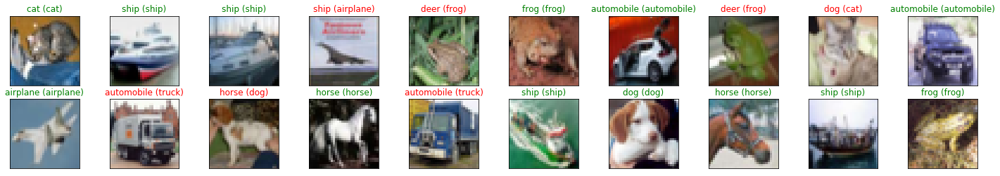

In [11]:
# obtain one batch of test images
dataiter = iter(test_loader)
images, labels = dataiter.next()
images.numpy()

# move model inputs to cuda, if GPU available
if train_on_gpu:
    images = images.cuda()

# get sample outputs
output = model(images)
# convert output probabilities to predicted class
_, preds_tensor = torch.max(output, 1)
preds = np.squeeze(preds_tensor.numpy()) if not train_on_gpu else np.squeeze(preds_tensor.cpu().numpy())

# plot the images in the batch, along with predicted and true labels
fig = plt.figure(figsize=(25, 4))
for idx in np.arange(20):
    ax = fig.add_subplot(2, 20/2, idx+1, xticks=[], yticks=[])
    imshow(images.cpu()[idx])
    ax.set_title("{} ({})".format(classes[preds[idx]], classes[labels[idx]]),
                 color=("green" if preds[idx]==labels[idx].item() else "red"))